## CSC578 Section 901
## Homework 3
## Name: Amy Aumpansub

In [23]:
import random
import json
import numpy as np
class Network(object):

    def __init__(self, sizes):
        """The list ``sizes`` contains the number of neurons in the
        respective layers of the network.  For example, if the list
        was [2, 3, 1] then it would be a three-layer network, with the
        first layer containing 2 neurons, the second layer 3 neurons,
        and the third layer 1 neuron.  The biases and weights for the
        network are initialized randomly, using a Gaussian
        distribution with mean 0, and variance 1.  Note that the first
        layer is assumed to be an input layer, and by convention we
        won't set any biases for those neurons, since biases are only
        ever used in computing the outputs from later layers."""
        self.num_layers = len(sizes)
        self.sizes = sizes
        self.biases = [np.random.randn(y, 1) for y in sizes[1:]]
        self.weights = [np.random.randn(y, x)
                        for x, y in zip(sizes[:-1], sizes[1:])]

    def feedforward(self, a):
        """Return the output of the network if ``a`` is input."""
        for b, w in zip(self.biases, self.weights):
            a = sigmoid(np.dot(w, a)+b)
        return a

    def SGD(self, training_data, epochs, mini_batch_size, eta,
            test_data=None , stopaccuracy = 1.0):
        
        """Train the neural network using mini-batch stochastic
        gradient descent.  The ``training_data`` is a list of tuples
        ``(x, y)`` representing the training inputs and the desired
        outputs.  The other non-optional parameters are
        self-explanatory.  If ``test_data`` is provided then the
        network will be evaluated against the test data after each
        epoch, and partial progress printed out.  This is useful for
        tracking progress, but slows things down substantially."""
        
        res_train_hist = []
        res_test_hist = []
        n_train = len(training_data)
        
        for j in range(epochs): 
            #random.shuffle(training_data) #4/2019 nt: supressed for now
            mini_batches = [
                training_data[k:k+mini_batch_size]
                for k in range(0, n_train, mini_batch_size)] 
            for mini_batch in mini_batches:
                self.update_mini_batch(mini_batch, eta)
            
            #call evaluate () for train
            res_train = self.evaluate(training_data)
            accu_train = res_train[1]
            res_train_hist.append(res_train)
            print ("[Epoch {0}] Training: MSE={1:.8f}, CE={2:.8f}, LL={3:.8f}, Correct:{4}/{5}, Acc:{6:.8f}".format(
                j, res_train[2], res_train[3], res_train[4], res_train[0], n_train, res_train[1]))
            
            #call evaluate () for test
            if test_data:
                n_test = len(test_data)
                res_test = self.evaluate(test_data)
                res_test_hist.append(res_test)
                print ("          Test:     MSE={1:.8f}, CE={2:.8f}, LL={3:.8f}, Correct:{4}/{5}, Acc:{6:.8f}\n".format(
                    j, res_test[2], res_test[3], res_test[4], res_test[0], n_test, res_test[1]))
            else:
                res_test_hist.append([])
            
            #Early Stopping
            if (accu_train >= stopaccuracy):
                break
        print ("Epoch {0} complete".format(j))
        
        return [res_train_hist, res_test_hist]

    def update_mini_batch(self, mini_batch, eta):
        """Update the network's weights and biases by applying
        gradient descent using backpropagation to a single mini batch.
        The ``mini_batch`` is a list of tuples ``(x, y)``, and ``eta``
        is the learning rate."""
        nabla_b = [np.zeros(b.shape) for b in self.biases]
        nabla_w = [np.zeros(w.shape) for w in self.weights]
        for x, y in mini_batch:
            delta_nabla_b, delta_nabla_w = self.backprop(x, y)
            nabla_b = [nb+dnb for nb, dnb in zip(nabla_b, delta_nabla_b)]
            nabla_w = [nw+dnw for nw, dnw in zip(nabla_w, delta_nabla_w)]
        self.weights = [w-(eta/len(mini_batch))*nw
                        for w, nw in zip(self.weights, nabla_w)]
        self.biases = [b-(eta/len(mini_batch))*nb
                       for b, nb in zip(self.biases, nabla_b)]

    def backprop(self, x, y):
        """Return a tuple ``(nabla_b, nabla_w)`` representing the
        gradient for the cost function C_x.  ``nabla_b`` and
        ``nabla_w`` are layer-by-layer lists of numpy arrays, similar
        to ``self.biases`` and ``self.weights``."""
        nabla_b = [np.zeros(b.shape) for b in self.biases]
        nabla_w = [np.zeros(w.shape) for w in self.weights]
	
	#initailize structure of activations to numpy zeros array
        activations = [np.zeros((i,1)) for i in range(0,len(self.sizes))]
        
	# forward pass
        activation = x
        
        #first layer
        activations[0] = x
        #index for layer
        index = 1 
        
        zs = [] # list to store all the z vectors, layer by layer 
        for b, w in zip(self.biases, self.weights):
            z = np.dot(w, activation)+b
            print("z ", z)
            zs.append(z)
            activation = sigmoid(z)
            activations[index] = activation 
            index  = index + 1
       
        # backward pass
        delta = self.cost_derivative(activations[-1], y) * \
            sigmoid_prime(zs[-1])
        print("delta ", delta)
        nabla_b[-1] = delta
        nabla_w[-1] = np.dot(delta, activations[-2].transpose())
        print("nabla_w[-1] ", nabla_w[-1])
        print("activations[-2] ", activations[-2])
        print("activations[-2] trans ", activations[-2].transpose())
        # Note that the variable l in the loop below is used a little
        # differently to the notation in Chapter 2 of the book.  Here,
        # l = 1 means the last layer of neurons, l = 2 is the
        # second-last layer, and so on.  It's a renumbering of the
        # scheme in the book, used here to take advantage of the fact
        # that Python can use negative indices in lists.
        for l in range(2, self.num_layers):
            z = zs[-l]
            sp = sigmoid_prime(z)
            delta = np.dot(self.weights[-l+1].transpose(), delta) * sp
            nabla_b[-l] = delta
            nabla_w[-l] = np.dot(delta, activations[-l-1].transpose())
        return (nabla_b, nabla_w)

    def evaluate(self, test_data):
        
        """Return the number of test inputs for which the neural
        network outputs the correct result."""
        # nt: Changed so the target (y) is a one-hot vector -- a vector of
        #  0's with exactly one 1 at the index where the targt is true.
        test_results = [(np.argmax(self.feedforward(x)), np.argmax(y)) 
                        for (x, y) in test_data]
        
        n = len(test_data)
        ccount = sum(int(x == y) for (x, y) in test_results)
        accu = ccount/n
        sum_mse = 0
        sum_ce = 0
        sum_ll = 0
	
	#Iterate over each data in dataset
        for (x, y) in test_data:
            a = self.feedforward(x)
            max_a = a[np.argmax(y)][0]
            sum_mse = sum_mse + (0.5*np.linalg.norm(a-y)**2)
            sum_ce = sum_ce + np.sum(np.nan_to_num(-y*np.log(a)-(1-y)*np.log(1-a)))
            sum_ll = sum_ll + np.sum(np.nan_to_num(-np.log(max_a)))
        mse = sum_mse/n
        ce = sum_ce/n
        ll = sum_ll/n
        
        results_lst = [ccount, accu, mse, ce, ll]
        
        return results_lst

    def cost_derivative(self, output_activations, y):
        """Return the vector of partial derivatives \partial C_x /
        \partial a for the output activations."""
        print("cost ", output_activations-y)
        return (output_activations-y)
    
    def load_network(filename):
        """Load a neural network from the file ``filename``.  Returns an
        instance of Network. """
        f = open(filename, "r")
        data = json.load(f)
        f.close()
        #cost = getattr(sys.modules[__name__], data["cost"])
        #net = Network(data["sizes"], cost=cost)
        net = Network(data["sizes"])
        net.weights = [np.array(w) for w in data["weights"]]
        net.biases = [np.array(b) for b in data["biases"]]
        return net
    def my_load_csv(fname, no_trainfeatures, no_testfeatures):
        ret = np.genfromtxt(fname, delimiter=',')
        data = np.array([(entry[:no_trainfeatures],entry[no_trainfeatures:]) for entry in ret])
        temp_inputs = [np.reshape(x, (no_trainfeatures, 1)) for x in data[:,0]]
        temp_results = [np.reshape(y, (no_testfeatures, 1)) for y in data[:,1]]
        dataset = list(zip(temp_inputs, temp_results))
        return dataset
#### Miscellaneous functions
def sigmoid(z):
    """The sigmoid function."""
    return 1.0/(1.0+np.exp(-z))

def sigmoid_prime(z):
    """Derivative of the sigmoid function."""
    print("sigprime ", sigmoid(z)*(1-sigmoid(z)))
    return sigmoid(z)*(1-sigmoid(z))

#### Savinging a Network to a json file
def save_network(net, filename):
    """Save the neural network to the file ``filename``."""
    data = {"sizes": net.sizes,
            "weights": [w.tolist() for w in net.weights],
            "biases": [b.tolist() for b in net.biases]#,
            #"cost": str(net.cost.__name__)
           }
    f = open(filename, "w")
    json.dump(data, f)
    f.close()
        
#### Loading a Network from a json file


#### Miscellaneous functions
def vectorize_target(n, target):
    """Return an array of shape (n,1) with a 1.0 in the target position
    and zeroes elsewhere.  The parameter target is assumed to be
    an array of size 1, and the 0th item is the target position (1). """
    e = np.zeros((n, 1))
    e[int(target[0])] = 1.0
    return e

#######################################################    
#### MY ADDITION to load a saved network

# Function to load the train-test (separate) data files.
# Note the target (y) is assumed to be already in the one-hot-vector notation.



In [24]:
# Load the dataset (already in the 'one-hot-vector' format for the target)
# Call the function to load the data.
iris_data = Network.my_load_csv('iris.csv', 4, 3)

In [25]:
# Create a network from the saved network
net1 = Network.load_network("iris-423.dat")

In [28]:
net1.sizes


[4, 2, 3]

## <font color = blue>1. Check your implementation of Modification</font>

### 1.1 First, train the net1 network (already created in the code from "iris-423.dat") with the iris data ("iris.csv") by calling SGD() for a maximum of 100 epochs, minibatch_size=5, eta=0.5

In [26]:
#train the net1 network with the iris data and saved to res1
res1 = net1.SGD(iris_data, 100,5,0.5)

z  [[ 3.02464555]
 [-2.25024339]]
z  [[ 0.51852145]
 [ 0.3031417 ]
 [-0.93665319]]
cost  [[-0.37319803]
 [ 0.57521035]
 [ 0.28157688]]
sigprime  [[0.23392126]
 [0.2443434 ]
 [0.20229134]]
delta  [[-0.08729895]
 [ 0.14054885]
 [ 0.05696056]]
nabla_w[-1]  [[-0.08325485 -0.00832208]
 [ 0.13403796  0.01339831]
 [ 0.05432188  0.00542996]]
activations[-2]  [[0.95367519]
 [0.09532847]]
activations[-2] trans  [[0.95367519 0.09532847]]
sigprime  [[0.04417882]
 [0.08624096]]
z  [[ 3.27158089]
 [-2.25068524]]
z  [[ 0.52966781]
 [ 0.31475669]
 [-0.94195101]]
cost  [[-0.37059437]
 [ 0.57804589]
 [ 0.28050642]]
sigprime  [[0.23325418]
 [0.24390884]
 [0.20182257]]
delta  [[-0.08644269]
 [ 0.1409905 ]
 [ 0.05661253]]
nabla_w[-1]  [[-0.08328242 -0.00823716]
 [ 0.13583602  0.01343504]
 [ 0.05454282  0.00539463]]
activations[-2]  [[0.9634409 ]
 [0.09529037]]
activations[-2] trans  [[0.9634409  0.09529037]]
sigprime  [[0.03522254]
 [0.08621012]]
z  [[ 2.70783413]
 [-2.13070869]]
z  [[ 0.49843908]
 [ 0.286

 [6.70426630e-05]]
z  [[ 7.90843147]
 [-7.98167858]]
z  [[ 0.79353023]
 [-0.27640346]
 [-1.43339174]]
cost  [[ 0.68858884]
 [-0.56866426]
 [ 0.19257076]]
sigprime  [[0.21443425]
 [0.24528522]
 [0.15548726]]
delta  [[ 0.14765703]
 [-0.13948494]
 [ 0.0299423 ]]
nabla_w[-1]  [[ 1.47602768e-01  5.04320719e-05]
 [-1.39433678e-01 -4.76409040e-05]
 [ 2.99312973e-02  1.02267550e-05]]
activations[-2]  [[9.99632504e-01]
 [3.41548733e-04]]
activations[-2] trans  [[9.99632504e-01 3.41548733e-04]]
sigprime  [[0.00036736]
 [0.00034143]]
z  [[  9.31051358]
 [-10.79582529]]
z  [[ 0.64627935]
 [-0.13675053]
 [-1.46332908]]
cost  [[ 0.65617153]
 [-0.53413445]
 [ 0.18795868]]
sigprime  [[0.22561045]
 [0.24883484]
 [0.15263021]]
delta  [[ 0.14803916]
 [-0.13291126]
 [ 0.02868817]]
nabla_w[-1]  [[ 1.48025765e-01  3.03249682e-06]
 [-1.32899238e-01 -2.72261060e-06]
 [ 2.86855783e-02  5.87660703e-07]]
activations[-2]  [[9.99909540e-01]
 [2.04844238e-05]]
activations[-2] trans  [[9.99909540e-01 2.04844238e-05]

activations[-2] trans  [[9.99993407e-01 3.39117888e-06]]
sigprime  [[6.59282685e-06]
 [3.39116738e-06]]
z  [[ 10.1719545 ]
 [-10.71222442]]
z  [[-0.66382873]
 [-0.14393464]
 [-0.98035991]]
cost  [[ 0.33988007]
 [ 0.46407833]
 [-0.72717963]]
sigprime  [[0.22436161]
 [0.24870963]
 [0.19838942]]
delta  [[ 0.07625604]
 [ 0.11542075]
 [-0.14426474]]
nabla_w[-1]  [[ 7.62531229e-02  1.69826167e-06]
 [ 1.15416341e-01  2.57048027e-06]
 [-1.44259228e-01 -3.21285094e-06]]
activations[-2]  [[9.99961774e-01]
 [2.22705208e-05]]
activations[-2] trans  [[9.99961774e-01 2.22705208e-05]]
sigprime  [[3.82246123e-05]
 [2.22700248e-05]]
z  [[  9.8745351 ]
 [-10.91344976]]
z  [[-0.66383496]
 [-0.14394808]
 [-0.98034939]]
cost  [[ 0.33987867]
 [ 0.46407499]
 [-0.72717754]]
sigprime  [[0.22436116]
 [0.24870939]
 [0.19839037]]
delta  [[ 0.07625557]
 [ 0.11541981]
 [-0.14426502]]
nabla_w[-1]  [[ 7.62516475e-02  1.38871353e-06]
 [ 1.15413870e-01  2.10194544e-06]
 [-1.44257593e-01 -2.62725433e-06]]
activations[-2

 [0.08284472]]
activations[-2] trans  [[0.95722125 0.08284472]]
sigprime  [[0.04094873]
 [0.07598147]]
z  [[ 3.97441724]
 [-2.41471653]]
z  [[-0.44124612]
 [-0.90933744]
 [-0.66341402]]
cost  [[-0.60855592]
 [ 0.28713544]
 [ 0.33997312]]
sigprime  [[0.23821561]
 [0.20468868]
 [0.2243914 ]]
delta  [[-0.14496752]
 [ 0.05877337]
 [ 0.07628704]]
nabla_w[-1]  [[-0.14229379 -0.01189565]
 [ 0.05768937  0.00482279]
 [ 0.07488003  0.00625991]]
activations[-2]  [[0.98155631]
 [0.08205735]]
activations[-2] trans  [[0.98155631 0.08205735]]
sigprime  [[0.01810352]
 [0.07532394]]
z  [[ 3.42729555]
 [-2.52461393]]
z  [[-0.44860255]
 [-0.91815079]
 [-0.65265017]]
cost  [[-0.61030693]
 [ 0.28533483]
 [ 0.34239258]]
sigprime  [[0.23783238]
 [0.20391887]
 [0.2251599 ]]
delta  [[-0.14515075]
 [ 0.05818516]
 [ 0.07709308]]
nabla_w[-1]  [[-0.14058529 -0.01076301]
 [ 0.05635505  0.00431446]
 [ 0.07466825  0.0057165 ]]
activations[-2]  [[0.96854678]
 [0.07415057]]
activations[-2] trans  [[0.96854678 0.0741505

z  [[-0.18341821]
 [-0.63764345]
 [-1.18079544]]
cost  [[ 0.45427357]
 [-0.65422057]
 [ 0.2349092 ]]
sigprime  [[0.24790909]
 [0.22621602]
 [0.17972687]]
delta  [[ 0.11261855]
 [-0.14799517]
 [ 0.0422195 ]]
nabla_w[-1]  [[ 1.12613198e-01  4.75110214e-06]
 [-1.47988138e-01 -6.24355558e-06]
 [ 4.22174897e-02  1.78113765e-06]]
activations[-2]  [[9.99952479e-01]
 [4.21875629e-05]]
activations[-2] trans  [[9.99952479e-01 4.21875629e-05]]
sigprime  [[4.75190614e-05]
 [4.21857831e-05]]
z  [[ 9.33057265]
 [-7.75362772]]
z  [[-0.1834674 ]
 [-0.63761892]
 [-1.1810526 ]]
cost  [[ 0.45426138]
 [-0.65421502]
 [ 0.23486299]]
sigprime  [[0.24790798]
 [0.22621773]
 [0.17970237]]
delta  [[ 0.11261502]
 [-0.14799504]
 [ 0.04220543]]
nabla_w[-1]  [[ 1.12605034e-01  4.83116900e-05]
 [-1.47981913e-01 -6.34896687e-05]
 [ 4.22016924e-02  1.81060740e-05]]
activations[-2]  [[9.99911336e-01]
 [4.28998639e-04]]
activations[-2] trans  [[9.99911336e-01 4.28998639e-04]]
sigprime  [[8.86557215e-05]
 [4.28814600e-04]

z  [[10.66055582]
 [-9.9090743 ]]
z  [[-1.09978937]
 [-0.50890831]
 [-0.56581189]]
cost  [[ 0.24977936]
 [ 0.37544948]
 [-0.63779623]]
sigprime  [[0.18738963]
 [0.23448717]
 [0.2310122 ]]
delta  [[ 0.04680606]
 [ 0.08803808]
 [-0.14733871]]
nabla_w[-1]  [[ 4.68049652e-02  2.32714920e-06]
 [ 8.80360203e-02  4.37716284e-06]
 [-1.47335254e-01 -7.32552877e-06]]
activations[-2]  [[9.99976549e-01]
 [4.97189692e-05]]
activations[-2] trans  [[9.99976549e-01 4.97189692e-05]]
sigprime  [[2.34508756e-05]
 [4.97164973e-05]]
z  [[ 10.70813111]
 [-10.60811508]]
z  [[-1.09978784]
 [-0.50891096]
 [-0.56579387]]
cost  [[ 0.24977965]
 [ 0.37544886]
 [-0.63779207]]
sigprime  [[0.18738978]
 [0.23448701]
 [0.23101335]]
delta  [[ 0.04680615]
 [ 0.08803788]
 [-0.14733848]]
nabla_w[-1]  [[ 4.68051057e-02  1.15676826e-06]
 [ 8.80359123e-02  2.17577010e-06]
 [-1.47335185e-01 -3.64132638e-06]]
activations[-2]  [[9.99977638e-01]
 [2.47140217e-05]]
activations[-2] trans  [[9.99977638e-01 2.47140217e-05]]
sigprime 

delta  [[-0.13979506]
 [ 0.04248383]
 [ 0.05685923]]
nabla_w[-1]  [[-0.13406382 -0.05677834]
 [ 0.0407421   0.01725498]
 [ 0.05452814  0.02309361]]
activations[-2]  [[0.9590025 ]
 [0.40615409]]
activations[-2] trans  [[0.9590025  0.40615409]]
sigprime  [[0.0393167 ]
 [0.24119295]]
z  [[ 3.95305139]
 [-0.36028174]]
z  [[-0.26866559]
 [-1.16567382]
 [-0.95072208]]
cost  [[-0.56676528]
 [ 0.23763785]
 [ 0.27873963]]
sigprime  [[0.2455424 ]
 [0.1811661 ]
 [0.20104385]]
delta  [[-0.13916491]
 [ 0.04305192]
 [ 0.05603889]]
nabla_w[-1]  [[-0.13654381 -0.05718166]
 [ 0.04224106  0.01768966]
 [ 0.05498342  0.0230259 ]]
activations[-2]  [[0.98116551]
 [0.41089137]]
activations[-2] trans  [[0.98116551 0.41089137]]
sigprime  [[0.01847975]
 [0.24205965]]
z  [[ 3.7805384 ]
 [-0.02127987]]
z  [[-0.11356638]
 [-1.20616723]
 [-1.07535998]]
cost  [[-0.52836112]
 [ 0.23037992]
 [ 0.2543851 ]]
sigprime  [[0.24919565]
 [0.17730501]
 [0.18967332]]
delta  [[-0.13166529]
 [ 0.04084751]
 [ 0.04825007]]
nabla_w

z  [[ 9.1144711 ]
 [-5.79621466]]
z  [[-0.72159299]
 [-0.17885365]
 [-1.21178533]]
cost  [[ 0.32704229]
 [-0.5445946 ]
 [ 0.22938531]]
sigprime  [[0.22008563]
 [0.24801132]
 [0.17676769]]
delta  [[ 0.07197731]
 [-0.13506563]
 [ 0.04054791]]
nabla_w[-1]  [[ 7.19693886e-02  2.18078943e-04]
 [-1.35050763e-01 -4.09225757e-04]
 [ 4.05434492e-02  1.22853240e-04]]
activations[-2]  [[0.99988995]
 [0.00302983]]
activations[-2] trans  [[0.99988995 0.00302983]]
sigprime  [[0.00011004]
 [0.00302065]]
z  [[ 8.80522171]
 [-5.50626236]]
z  [[-0.79344673]
 [-0.04377892]
 [-1.25304329]]
cost  [[ 0.31142907]
 [-0.51094298]
 [ 0.22217378]]
sigprime  [[0.214441  ]
 [0.24988025]
 [0.17281259]]
delta  [[ 0.06678316]
 [-0.12767456]
 [ 0.03839443]]
nabla_w[-1]  [[ 0.06677315  0.00027013]
 [-0.12765542 -0.00051642]
 [ 0.03838867  0.0001553 ]]
activations[-2]  [[0.99985007]
 [0.00404483]]
activations[-2] trans  [[0.99985007 0.00404483]]
sigprime  [[0.0001499 ]
 [0.00402847]]
z  [[ 9.07146498]
 [-5.70595455]]
z 

 [-0.12583749]]
nabla_w[-1]  [[ 3.61157907e-02  1.28821729e-05]
 [ 6.59318346e-02  2.35172836e-05]
 [-1.25834626e-01 -4.48840623e-05]]
activations[-2]  [[9.99977257e-01]
 [3.56682760e-04]]
activations[-2] trans  [[9.99977257e-01 3.56682760e-04]]
sigprime  [[2.27424589e-05]
 [3.56555537e-04]]
[Epoch 2] Training: MSE=0.33898723, CE=1.93723493, LL=1.12030613, Correct:50/150, Acc:0.33333333
z  [[3.92077474]
 [0.55161843]]
z  [[-1.24020155]
 [-0.8366436 ]
 [-0.41969815]]
cost  [[-0.7755991 ]
 [ 0.30224215]
 [ 0.39658898]]
sigprime  [[0.17404514]
 [0.21089183]
 [0.23930616]]
delta  [[-0.13498925]
 [ 0.0637404 ]
 [ 0.09490619]]
nabla_w[-1]  [[-0.13236502 -0.08565216]
 [ 0.06250127  0.04044399]
 [ 0.09306118  0.06021902]]
activations[-2]  [[0.98055969]
 [0.634511  ]]
activations[-2] trans  [[0.98055969 0.634511  ]]
sigprime  [[0.01906239]
 [0.23190679]]
z  [[4.10751259]
 [0.36449145]]
z  [[-1.24652322]
 [-0.8379194 ]
 [-0.38250388]]
cost  [[-0.77669743]
 [ 0.30197316]
 [ 0.40552313]]
sigprime 

 [ 0.03830524  0.0330254 ]]
activations[-2]  [[0.99064785]
 [0.85410086]]
activations[-2] trans  [[0.99064785 0.85410086]]
sigprime  [[0.00926469]
 [0.12461258]]
z  [[4.38255551]
 [1.86747522]]
z  [[ 0.26042961]
 [-1.33313063]
 [-1.25934491]]
cost  [[-0.4352581 ]
 [ 0.20864199]
 [ 0.22108668]]
sigprime  [[0.24580849]
 [0.16511051]
 [0.17220736]]
delta  [[-0.10699014]
 [ 0.03444899]
 [ 0.03807275]]
nabla_w[-1]  [[-0.10566996 -0.0926712 ]
 [ 0.03402391  0.02983854]
 [ 0.03760297  0.03297732]]
activations[-2]  [[0.98766077]
 [0.86616587]]
activations[-2] trans  [[0.98766077 0.86616587]]
sigprime  [[0.01218698]
 [0.11592256]]
z  [[4.23586455]
 [2.45542313]]
z  [[ 0.43969288]
 [-1.38600948]
 [-1.36662314]]
cost  [[-0.39181415]
 [ 0.20004558]
 [ 0.20316598]]
sigprime  [[0.23829582]
 [0.16002735]
 [0.16188956]]
delta  [[-0.09336768]
 [ 0.03201276]
 [ 0.03289045]]
nabla_w[-1]  [[-0.09203616 -0.08598763]
 [ 0.03155623  0.02948238]
 [ 0.0324214   0.0302907 ]]
activations[-2]  [[0.98573902]
 [0.9

 [-0.14754466]]
nabla_w[-1]  [[ 0.04913215  0.00041408]
 [ 0.1132981   0.00095485]
 [-0.14754371 -0.00124347]]
activations[-2]  [[0.99999357]
 [0.00842773]]
activations[-2] trans  [[0.99999357 0.00842773]]
sigprime  [[6.42895124e-06]
 [8.35670789e-03]]
z  [[12.25042795]
 [-5.1594023 ]]
z  [[-1.06242847]
 [-0.1737442 ]
 [-0.80158622]]
cost  [[ 0.25684564]
 [ 0.45667289]
 [-0.69031369]]
sigprime  [[0.19087596]
 [0.24812276]
 [0.2137807 ]]
delta  [[ 0.04902566]
 [ 0.11331094]
 [-0.14757574]]
nabla_w[-1]  [[ 0.04902542  0.00028005]
 [ 0.1133104   0.00064727]
 [-0.14757504 -0.000843  ]]
activations[-2]  [[0.99999522]
 [0.00571231]]
activations[-2] trans  [[0.99999522 0.00571231]]
sigprime  [[4.78302428e-06]
 [5.67968396e-03]]
z  [[13.04727862]
 [-5.3798571 ]]
z  [[-1.06316157]
 [-0.17367207]
 [-0.80037287]]
cost  [[ 0.25670574]
 [ 0.45669078]
 [-0.69005424]]
sigprime  [[0.1908079 ]
 [0.24812431]
 [0.21387939]]
delta  [[ 0.04898148]
 [ 0.11331609]
 [-0.14758838]]
nabla_w[-1]  [[ 0.04898138  

nabla_w[-1]  [[-0.1316301  -0.1285112 ]
 [ 0.04298356  0.04196509]
 [ 0.05037998  0.04918626]]
activations[-2]  [[0.99379443]
 [0.97024703]]
activations[-2] trans  [[0.99379443 0.97024703]]
sigprime  [[0.00616706]
 [0.02886773]]
z  [[4.00416508]
 [3.25649755]]
z  [[-0.1382809 ]
 [-1.16730878]
 [-1.02614924]]
cost  [[-0.53451524]
 [ 0.23734178]
 [ 0.26383134]]
sigprime  [[0.2488087 ]
 [0.18101066]
 [0.19422436]]
delta  [[-0.13299204]
 [ 0.04296139]
 [ 0.05124247]]
nabla_w[-1]  [[-0.13060978 -0.12805882]
 [ 0.04219183  0.04136778]
 [ 0.05032458  0.04934168]]
activations[-2]  [[0.98208721]
 [0.96290589]]
activations[-2] trans  [[0.98208721 0.96290589]]
sigprime  [[0.01759192]
 [0.03571813]]
z  [[4.83677521]
 [3.35233765]]
z  [[ 0.06121115]
 [-1.22523765]
 [-1.10418979]]
cost  [[-0.48470199]
 [ 0.22701604]
 [ 0.24895568]]
sigprime  [[0.24976597]
 [0.17547975]
 [0.18697675]]
delta  [[-0.12106206]
 [ 0.03983672]
 [ 0.04654892]]
nabla_w[-1]  [[-0.12010928 -0.1169679 ]
 [ 0.0395232   0.0384894

 [0.04141749]]
activations[-2] trans  [[0.99995485 0.04141749]]
sigprime  [[4.51519059e-05]
 [3.97020777e-02]]
z  [[11.36758936]
 [-2.78208922]]
z  [[-0.85632695]
 [-0.27992292]
 [-0.82551988]]
cost  [[ 0.29810732]
 [-0.56952733]
 [ 0.3045932 ]]
sigprime  [[0.20923935]
 [0.24516595]
 [0.21181618]]
delta  [[ 0.06237578]
 [-0.13962871]
 [ 0.06451777]]
nabla_w[-1]  [[ 0.06237506  0.00363649]
 [-0.13962709 -0.00814032]
 [ 0.06451702  0.00376137]]
activations[-2]  [[0.99998844]
 [0.05829975]]
activations[-2] trans  [[0.99998844 0.05829975]]
sigprime  [[1.15640144e-05]
 [5.49008889e-02]]
z  [[10.98820043]
 [-2.65220692]]
z  [[-0.84765327]
 [-0.2813887 ]
 [-0.8356246 ]]
cost  [[ 0.29992537]
 [-0.56988665]
 [ 0.30245709]]
sigprime  [[0.20997014]
 [0.24511586]
 [0.2109768 ]]
delta  [[ 0.06297537]
 [-0.13968825]
 [ 0.06381143]]
nabla_w[-1]  [[ 0.06297431  0.00414712]
 [-0.13968589 -0.00919891]
 [ 0.06381035  0.00420218]]
activations[-2]  [[0.9999831 ]
 [0.06585312]]
activations[-2] trans  [[0.99

 [-0.10423342]]
nabla_w[-1]  [[ 0.0296708   0.00018086]
 [ 0.06758636  0.00041198]
 [-0.10423289 -0.00063536]]
activations[-2]  [[0.99999488]
 [0.00609551]]
activations[-2] trans  [[0.99999488 0.00609551]]
sigprime  [[5.11514863e-06]
 [6.05834982e-03]]
z  [[12.30777079]
 [-5.21811691]]
z  [[-1.44059193]
 [-0.78205875]
 [ 0.29825884]]
cost  [[ 0.1914537 ]
 [ 0.31387635]
 [-0.42598318]]
sigprime  [[0.15479918]
 [0.21535799]
 [0.24452151]]
delta  [[ 0.02963688]
 [ 0.06759578]
 [-0.10416205]]
nabla_w[-1]  [[ 0.02963674  0.00015969]
 [ 0.06759547  0.00036423]
 [-0.10416158 -0.00056126]]
activations[-2]  [[0.99999548]
 [0.00538833]]
activations[-2] trans  [[0.99999548 0.00538833]]
sigprime  [[4.5164701e-06]
 [5.3592957e-03]]
z  [[12.07283964]
 [-6.17125557]]
z  [[-1.44435834]
 [-0.78146855]
 [ 0.30269301]]
cost  [[ 0.19087134]
 [ 0.31400347]
 [-0.42489929]]
sigprime  [[0.15443947]
 [0.21540529]
 [0.24435988]]
delta  [[ 0.02947807]
 [ 0.06763801]
 [-0.10382834]]
nabla_w[-1]  [[ 2.94779008e-02

z  [[4.07648622]
 [2.76338068]]
z  [[ 0.32940993]
 [-1.28483408]
 [-1.15770184]]
cost  [[-0.4183842 ]
 [ 0.21672848]
 [ 0.23908512]]
sigprime  [[0.24333886]
 [0.16975725]
 [0.18192343]]
delta  [[-0.10180914]
 [ 0.03679123]
 [ 0.04349518]]
nabla_w[-1]  [[-0.10011056 -0.09576825]
 [ 0.03617741  0.03460821]
 [ 0.04276952  0.04091438]]
activations[-2]  [[0.9833161 ]
 [0.94066461]]
activations[-2] trans  [[0.9833161  0.94066461]]
sigprime  [[0.01640555]
 [0.0558147 ]]
z  [[4.59336511]
 [3.37245383]]
z  [[ 0.5123679 ]
 [-1.34112102]
 [-1.25600461]]
cost  [[-0.3746386 ]
 [ 0.20732577]
 [ 0.22166244]]
sigprime  [[0.23428452]
 [0.16434179]
 [0.1725282 ]]
delta  [[-0.08777202]
 [ 0.03407229]
 [ 0.03824302]]
nabla_w[-1]  [[-0.08689278 -0.08486084]
 [ 0.03373097  0.03294219]
 [ 0.03785993  0.0369746 ]]
activations[-2]  [[0.98998261]
 [0.96683247]]
activations[-2] trans  [[0.98998261 0.96683247]]
sigprime  [[0.00991704]
 [0.03206745]]
z  [[4.53631928]
 [3.2008537 ]]
z  [[ 0.503603  ]
 [-1.33973625]

z  [[11.09630243]
 [-4.40879035]]
z  [[-1.01041656]
 [-0.35483451]
 [-0.57870791]]
cost  [[ 0.26689834]
 [-0.58778944]
 [ 0.35922996]]
sigprime  [[0.19566361]
 [0.24229301]
 [0.23018379]]
delta  [[ 0.05222229]
 [-0.14241728]
 [ 0.08268891]]
nabla_w[-1]  [[ 0.0522215   0.0006279 ]
 [-0.14241512 -0.00171236]
 [ 0.08268766  0.00099422]]
activations[-2]  [[0.99998483]
 [0.01202357]]
activations[-2] trans  [[0.99998483 0.01202357]]
sigprime  [[1.51678459e-05]
 [1.18789991e-02]]
z  [[ 9.29872296]
 [-3.66391233]]
z  [[-0.99008939]
 [-0.35880501]
 [-0.59913702]]
cost  [[ 0.27089442]
 [-0.58875113]
 [ 0.35454115]]
sigprime  [[0.19751063]
 [0.24212324]
 [0.22884172]]
delta  [[ 0.05350453]
 [-0.14255033]
 [ 0.08113381]]
nabla_w[-1]  [[ 0.05349963  0.00133716]
 [-0.14253728 -0.00356254]
 [ 0.08112638  0.00202765]]
activations[-2]  [[0.99990847]
 [0.02499145]]
activations[-2] trans  [[0.99990847 0.02499145]]
sigprime  [[9.15243014e-05]
 [2.43668807e-02]]
z  [[10.02619706]
 [-3.20036867]]
z  [[-1.02

z  [[13.56350332]
 [-6.68048498]]
z  [[-1.50913348]
 [-0.67893191]
 [ 0.26601922]]
cost  [[ 0.18106725]
 [ 0.33649973]
 [-0.43388463]]
sigprime  [[0.1482819 ]
 [0.22326766]
 [0.24562876]]
delta  [[ 0.026849  ]
 [ 0.07512951]
 [-0.10657454]]
nabla_w[-1]  [[ 2.68489606e-02  3.36577826e-05]
 [ 7.51294113e-02  9.41820219e-05]
 [-1.06574406e-01 -1.33601380e-04]]
activations[-2]  [[0.99999871]
 [0.0012536 ]]
activations[-2] trans  [[0.99999871 0.0012536 ]]
sigprime  [[1.28660204e-06]
 [1.25202412e-03]]
z  [[13.51201747]
 [-6.76870285]]
z  [[-1.50929834]
 [-0.67890227]
 [ 0.26618684]]
cost  [[ 0.1810428 ]
 [ 0.33650635]
 [-0.43384346]]
sigprime  [[0.14826631]
 [0.22326983]
 [0.24562331]]
delta  [[ 0.02684255]
 [ 0.07513171]
 [-0.10656207]]
nabla_w[-1]  [[ 2.68425114e-02  3.08116275e-05]
 [ 7.51316124e-02  8.62410831e-05]
 [-1.06561923e-01 -1.22318893e-04]]
activations[-2]  [[0.99999865]
 [0.00114787]]
activations[-2] trans  [[0.99999865 0.00114787]]
sigprime  [[1.35457856e-06]
 [1.14654764e-0

 [ 0.02775564]]
nabla_w[-1]  [[-0.05393781 -0.0522607 ]
 [ 0.02634486  0.02552571]
 [ 0.02752358  0.02666778]]
activations[-2]  [[0.99163906]
 [0.96080565]]
activations[-2] trans  [[0.99163906 0.96080565]]
sigprime  [[0.00829103]
 [0.03765815]]
z  [[4.50097565]
 [3.35985367]]
z  [[ 0.98591209]
 [-1.52003205]
 [-1.49602576]]
cost  [[-0.27172027]
 [ 0.1794568 ]
 [ 0.18301902]]
sigprime  [[0.19788837]
 [0.14725206]
 [0.14952306]]
delta  [[-0.05377028]
 [ 0.02642538]
 [ 0.02736556]]
nabla_w[-1]  [[-0.05318008 -0.051965  ]
 [ 0.02613533  0.02553818]
 [ 0.02706519  0.02644679]]
activations[-2]  [[0.98902365]
 [0.96642603]]
activations[-2] trans  [[0.98902365 0.96642603]]
sigprime  [[0.01085587]
 [0.03244676]]
z  [[4.32006867]
 [3.69123849]]
z  [[ 1.08088942]
 [-1.56328283]
 [-1.55170366]]
cost  [[-0.25333774]
 [ 0.17317609]
 [ 0.17484034]]
sigprime  [[0.18915773]
 [0.14318613]
 [0.1442712 ]]
delta  [[-0.04792079]
 [ 0.02479641]
 [ 0.02522443]]
nabla_w[-1]  [[-0.04729186 -0.04675468]
 [ 0.024

 [ 0.33469627]]
sigprime  [[0.20038134]
 [0.2427735 ]
 [0.22267468]]
delta  [[ 0.05555523]
 [-0.14202464]
 [ 0.07452838]]
nabla_w[-1]  [[ 0.05554767  0.00674917]
 [-0.14200532 -0.01725398]
 [ 0.07451824  0.00905414]]
activations[-2]  [[0.99986391]
 [0.1214858 ]]
activations[-2] trans  [[0.99986391 0.1214858 ]]
sigprime  [[0.00013607]
 [0.106727  ]]
z  [[ 8.67054187]
 [-1.62649416]]
z  [[-0.87573693]
 [-0.36014404]
 [-0.76373652]]
cost  [[ 0.29406197]
 [-0.5890753 ]
 [ 0.31783558]]
sigprime  [[0.20758953]
 [0.24206559]
 [0.21681612]]
delta  [[ 0.06104419]
 [-0.14259486]
 [ 0.06891188]]
nabla_w[-1]  [[ 0.06103371  0.01003024]
 [-0.1425704  -0.02342993]
 [ 0.06890006  0.01132299]]
activations[-2]  [[0.99982846]
 [0.16431119]]
activations[-2] trans  [[0.99982846 0.16431119]]
sigprime  [[0.00017151]
 [0.13731302]]
z  [[ 9.31504209]
 [-1.89709571]]
z  [[-0.94091721]
 [-0.34682786]
 [-0.70307241]]
cost  [[ 0.28071511]
 [-0.58584813]
 [ 0.33113139]]
sigprime  [[0.20191414]
 [0.2426301 ]
 [0.22

sigprime  [[0.14410962]
 [0.23619236]
 [0.24950472]]
delta  [[ 0.02516038]
 [ 0.09034218]
 [-0.11919969]]
nabla_w[-1]  [[ 2.51603236e-02  3.77655781e-05]
 [ 9.03419629e-02  1.35603043e-04]
 [-1.19199400e-01 -1.78917979e-04]]
activations[-2]  [[0.99999759]
 [0.00150099]]
activations[-2] trans  [[0.99999759 0.00150099]]
sigprime  [[2.40991380e-06]
 [1.49874071e-03]]
z  [[11.28632267]
 [-4.42830974]]
z  [[-1.53370966]
 [-0.4827908 ]
 [ 0.07053893]]
cost  [[ 0.17745157]
 [ 0.38159334]
 [-0.48237258]]
sigprime  [[0.14596251]
 [0.23597986]
 [0.24968927]]
delta  [[ 0.02590128]
 [ 0.09004834]
 [-0.12044326]]
nabla_w[-1]  [[ 0.02590095  0.00030548]
 [ 0.09004721  0.00106202]
 [-0.12044175 -0.00142049]]
activations[-2]  [[0.99998746]
 [0.01179389]]
activations[-2] trans  [[0.99998746 0.01179389]]
sigprime  [[1.25430007e-05]
 [1.16547936e-02]]
z  [[11.32174698]
 [-5.34997532]]
z  [[-1.54724895]
 [-0.48017612]
 [ 0.08326975]]
cost  [[ 0.17548396]
 [ 0.38221054]
 [-0.47919458]]
sigprime  [[0.144689

activations[-2] trans  [[0.98327998 0.98177014]]
sigprime  [[0.01644046]
 [0.01789753]]
z  [[3.4221641 ]
 [3.57512131]]
z  [[ 1.02574198]
 [-1.53145883]
 [-1.56398674]]
cost  [[-0.26391044]
 [ 0.17778034]
 [ 0.17307532]]
sigprime  [[0.19426172]
 [0.14617449]
 [0.14312025]]
delta  [[-0.0512677 ]
 [ 0.02598695]
 [ 0.02477058]]
nabla_w[-1]  [[-0.04964713 -0.04987072]
 [ 0.02516551  0.02527884]
 [ 0.02398759  0.02409562]]
activations[-2]  [[0.96839008]
 [0.97275126]]
activations[-2] trans  [[0.96839008 0.97275126]]
sigprime  [[0.03061073]
 [0.02650624]]
z  [[4.26235056]
 [4.16848494]]
z  [[ 1.05643816]
 [-1.52790843]
 [-1.58552568]]
cost  [[-0.25799071]
 [ 0.17829991]
 [ 0.17001433]]
sigprime  [[0.19143151]
 [0.14650905]
 [0.14110946]]
delta  [[-0.04938755]
 [ 0.02612255]
 [ 0.02399063]]
nabla_w[-1]  [[-0.04870139 -0.04863489]
 [ 0.02575962  0.02572445]
 [ 0.02365732  0.02362502]]
activations[-2]  [[0.9861066 ]
 [0.98476016]]
activations[-2] trans  [[0.9861066  0.98476016]]
sigprime  [[0.0

 [-0.69032401]]
cost  [[ 0.18133418]
 [ 0.56694932]
 [-0.666039  ]]
sigprime  [[0.14845209]
 [0.24551779]
 [0.22243105]]
delta  [[ 0.02691944]
 [ 0.13919614]
 [-0.14814775]]
nabla_w[-1]  [[ 2.69193773e-02  1.92828336e-05]
 [ 1.39195827e-01  9.97084719e-05]
 [-1.48147417e-01 -1.06120657e-04]]
activations[-2]  [[9.99997725e-01]
 [7.16316336e-04]]
activations[-2] trans  [[9.99997725e-01 7.16316336e-04]]
sigprime  [[2.27522532e-06]
 [7.15803227e-04]]
z  [[11.2115224 ]
 [-5.37368346]]
z  [[-1.49868208]
 [ 0.26766968]
 [-0.69809687]]
cost  [[ 0.18262217]
 [ 0.56652073]
 [-0.66776569]]
sigprime  [[0.14927131]
 [0.24557499]
 [0.22185467]]
delta  [[ 0.02726025]
 [ 0.13912332]
 [-0.14814694]]
nabla_w[-1]  [[ 2.72598823e-02  1.25822873e-04]
 [ 1.39121443e-01  6.42139955e-04]
 [-1.48144936e-01 -6.83789507e-04]]
activations[-2]  [[0.99998648]
 [0.00461562]]
activations[-2] trans  [[0.99998648 0.00461562]]
sigprime  [[1.35171754e-05]
 [4.59431293e-03]]
z  [[13.81622759]
 [-5.73878777]]
z  [[-1.50180

[Epoch 7] Training: MSE=0.23153034, CE=1.43260666, LL=0.71520737, Correct:100/150, Acc:0.66666667
z  [[4.10022731]
 [3.63529342]]
z  [[ 0.42180802]
 [-1.22615334]
 [-1.38416581]]
cost  [[-0.39608419]
 [ 0.22685539]
 [ 0.20034079]]
sigprime  [[0.2392015 ]
 [0.17539202]
 [0.16020436]]
delta  [[-0.09474393]
 [ 0.03978863]
 [ 0.03209547]]
nabla_w[-1]  [[-0.09319972 -0.09230917]
 [ 0.03914012  0.03876612]
 [ 0.03157235  0.03127067]]
activations[-2]  [[0.98370115]
 [0.97430163]]
activations[-2] trans  [[0.98370115 0.97430163]]
sigprime  [[0.0160332 ]
 [0.02503796]]
z  [[4.27500157]
 [3.18687889]]
z  [[ 0.39063668]
 [-1.218215  ]
 [-1.35580617]]
cost  [[-0.40356404]
 [ 0.22825073]
 [ 0.20492276]]
sigprime  [[0.24070011]
 [0.17615233]
 [0.16292942]]
delta  [[-0.09713791]
 [ 0.0402069 ]
 [ 0.03338795]]
nabla_w[-1]  [[-0.09580507 -0.09328518]
 [ 0.03965521  0.03861219]
 [ 0.03292983  0.0320637 ]]
activations[-2]  [[0.98627886]
 [0.96033751]]
activations[-2] trans  [[0.98627886 0.96033751]]
sigpr

 [-2.92594015]]
z  [[-1.2064822 ]
 [-0.67604401]
 [-0.14254113]]
cost  [[ 0.23032408]
 [-0.66285519]
 [ 0.46442493]]
sigprime  [[0.1772749 ]
 [0.22347819]
 [0.24873441]]
delta  [[ 0.04083068]
 [-0.14813368]
 [ 0.11551846]]
nabla_w[-1]  [[ 0.04083012  0.00207771]
 [-0.14813166 -0.00753794]
 [ 0.11551689  0.00587828]]
activations[-2]  [[0.99998638]
 [0.05088605]]
activations[-2] trans  [[0.99998638 0.05088605]]
sigprime  [[1.36176028e-05]
 [4.82966555e-02]]
z  [[ 8.91456712]
 [-1.55924745]]
z  [[-0.89950321]
 [-0.74490875]
 [-0.40518815]]
cost  [[ 0.2891526 ]
 [-0.67806833]
 [ 0.40006647]]
sigprime  [[0.20554337]
 [0.21829167]
 [0.24001329]]
delta  [[ 0.0594334 ]
 [-0.14801667]
 [ 0.09602127]]
nabla_w[-1]  [[ 0.05942541  0.01032683]
 [-0.14799677 -0.02571859]
 [ 0.09600836  0.01668414]]
activations[-2]  [[0.9998656 ]
 [0.17375466]]
activations[-2] trans  [[0.9998656  0.17375466]]
sigprime  [[1.34380405e-04]
 [1.43563978e-01]]
z  [[10.44194274]
 [-3.75394401]]
z  [[-1.32953161]
 [-0.51212

 [-4.30917891]]
z  [[-1.7246505 ]
 [-0.43452594]
 [ 0.1656437 ]]
cost  [[ 0.15127312]
 [ 0.3930461 ]
 [-0.4586835 ]]
sigprime  [[0.12838956]
 [0.23856086]
 [0.24829295]]
delta  [[ 0.01942189]
 [ 0.09376542]
 [-0.11388788]]
nabla_w[-1]  [[ 0.01942161  0.00025766]
 [ 0.09376408  0.00124391]
 [-0.11388626 -0.00151086]]
activations[-2]  [[0.99998574]
 [0.01326623]]
activations[-2] trans  [[0.99998574 0.01326623]]
sigprime  [[1.42548431e-05]
 [1.30902327e-02]]
z  [[11.19649058]
 [-5.28700826]]
z  [[-1.74506064]
 [-0.43034129]
 [ 0.18347842]]
cost  [[ 0.14867128]
 [ 0.39404484]
 [-0.45425865]]
sigprime  [[0.12656813]
 [0.2387735 ]
 [0.24790773]]
delta  [[ 0.01881705]
 [ 0.09408747]
 [-0.11261423]]
nabla_w[-1]  [[ 1.88167876e-02  9.46765221e-05]
 [ 9.40861757e-02  4.73393870e-04]
 [-1.12612684e-01 -5.66609852e-04]]
activations[-2]  [[0.99998628]
 [0.00503142]]
activations[-2] trans  [[0.99998628 0.00503142]]
sigprime  [[1.37218922e-05]
 [5.00610805e-03]]
z  [[15.13479103]
 [-6.24660653]]
z  [

 [ 0.01676679  0.01690724]]
activations[-2]  [[0.9804002 ]
 [0.98861289]]
activations[-2] trans  [[0.9804002  0.98861289]]
sigprime  [[0.01921564]
 [0.01125744]]
z  [[4.32243522]
 [3.19302119]]
z  [[ 1.22343028]
 [-1.60801397]
 [-1.74205493]]
cost  [[-0.22733335]
 [ 0.16686453]
 [ 0.14905211]]
sigprime  [[0.1756529 ]
 [0.13902076]
 [0.12683558]]
delta  [[-0.03993176]
 [ 0.02319763]
 [ 0.01890511]]
nabla_w[-1]  [[-0.0394089  -0.03835728]
 [ 0.02289389  0.02228297]
 [ 0.01865757  0.0181597 ]]
activations[-2]  [[0.98690619]
 [0.96057081]]
activations[-2] trans  [[0.98690619 0.96057081]]
sigprime  [[0.01292236]
 [0.03787453]]
z  [[3.10741706]
 [3.86264777]]
z  [[ 1.27127196]
 [-1.63626393]
 [-1.78875893]]
cost  [[-0.21903959]
 [ 0.16297407]
 [ 0.14322495]]
sigprime  [[0.17106125]
 [0.13641352]
 [0.12271156]]
delta  [[-0.03746919]
 [ 0.02223187]
 [ 0.01757536]]
nabla_w[-1]  [[-0.03586542 -0.03669808]
 [ 0.02128029  0.02177434]
 [ 0.01682309  0.01721366]]
activations[-2]  [[0.95719766]
 [0.9

 [ 0.0358864   0.01229477]]
activations[-2]  [[0.9994349 ]
 [0.34240883]]
activations[-2] trans  [[0.9994349  0.34240883]]
sigprime  [[0.00056478]
 [0.22516502]]
z  [[ 9.1536954 ]
 [-2.15521479]]
z  [[-1.42885151]
 [ 0.1572984 ]
 [-0.74894887]]
cost  [[ 0.1932777 ]
 [-0.46075628]
 [ 0.32105038]]
sigprime  [[0.15592143]
 [0.24845993]
 [0.21797703]]
delta  [[ 0.03013613]
 [-0.11447947]
 [ 0.06998161]]
nabla_w[-1]  [[ 0.03013295  0.00312948]
 [-0.11446736 -0.01188811]
 [ 0.0699742   0.00726724]]
activations[-2]  [[0.99989418]
 [0.10384493]]
activations[-2] trans  [[0.99989418 0.10384493]]
sigprime  [[0.00010581]
 [0.09306116]]
z  [[12.81240352]
 [-7.04646394]]
z  [[-1.74588461]
 [ 0.33207836]
 [-0.57214074]]
cost  [[ 0.14856702]
 [ 0.58226499]
 [-0.63925699]]
sigprime  [[0.12649486]
 [0.24323247]
 [0.23060749]]
delta  [[ 0.01879296]
 [ 0.14162575]
 [-0.14741745]]
nabla_w[-1]  [[ 1.87929136e-02  1.63447024e-05]
 [ 1.41625366e-01  1.23175389e-04]
 [-1.47417049e-01 -1.28212571e-04]]
activati

z  [[ 0.7401414 ]
 [-1.3128147 ]
 [-1.65693409]]
cost  [[-0.32297323]
 [ 0.21201622]
 [ 0.16017399]]
sigprime  [[0.21866152]
 [0.16706534]
 [0.13451828]]
delta  [[-0.07062182]
 [ 0.03542056]
 [ 0.02154633]]
nabla_w[-1]  [[-0.06892696 -0.06932639]
 [ 0.0345705   0.03477084]
 [ 0.02102924  0.0211511 ]]
activations[-2]  [[0.9760009 ]
 [0.98165686]]
activations[-2] trans  [[0.9760009  0.98165686]]
sigprime  [[0.02342314]
 [0.01800667]]
z  [[4.53783913]
 [3.75928389]]
z  [[ 0.83138326]
 [-1.35332397]
 [-1.67571413]]
cost  [[-0.30335267]
 [ 0.20532747]
 [ 0.15766382]]
sigprime  [[0.21132983]
 [0.1631681 ]
 [0.13280594]]
delta  [[-0.06410747]
 [ 0.03350289]
 [ 0.02093869]]
nabla_w[-1]  [[-0.063429   -0.06264775]
 [ 0.03314832  0.03274004]
 [ 0.02071709  0.02046192]]
activations[-2]  [[0.98941671]
 [0.97723013]]
activations[-2] trans  [[0.98941671 0.97723013]]
sigprime  [[0.01047129]
 [0.02225141]]
z  [[3.43052163]
 [3.41688468]]
z  [[ 0.80948321]
 [-1.36190064]
 [-1.65962892]]
cost  [[-0.3080

 [ 0.09050962  0.02120328]]
activations[-2]  [[0.99984965]
 [0.23423025]]
activations[-2] trans  [[0.99984965 0.23423025]]
sigprime  [[1.50324958e-04]
 [1.79366440e-01]]
z  [[11.00984416]
 [-2.77233608]]
z  [[-1.42989402]
 [-0.62522323]
 [-0.04909675]]
cost  [[ 0.1931152 ]
 [-0.65140556]
 [ 0.48772828]]
sigprime  [[0.15582172]
 [0.22707636]
 [0.2498494 ]]
delta  [[ 0.03009154]
 [-0.1479188 ]
 [ 0.12185862]]
nabla_w[-1]  [[ 0.03009104  0.00177051]
 [-0.14791635 -0.00870318]
 [ 0.1218566   0.00716986]]
activations[-2]  [[0.99998346]
 [0.05883752]]
activations[-2] trans  [[0.99998346 0.05883752]]
sigprime  [[1.65375462e-05]
 [5.53756648e-02]]
z  [[ 8.73231707]
 [-1.37404998]]
z  [[-1.01159479]
 [-0.71939714]
 [-0.39797924]]
cost  [[ 0.26666786]
 [-0.67247425]
 [ 0.40179795]]
sigprime  [[0.19555611]
 [0.22025263]
 [0.24035636]]
delta  [[ 0.05214853]
 [-0.14811422]
 [ 0.09657469]]
nabla_w[-1]  [[ 0.05214012  0.01053225]
 [-0.14809034 -0.02991408]
 [ 0.09655912  0.01950483]]
activations[-2] 

 [-0.43065382]]
sigprime  [[0.1093694 ]
 [0.24061789]
 [0.24519111]]
delta  [[ 0.01367036]
 [ 0.09700239]
 [-0.10559249]]
nabla_w[-1]  [[ 1.36703113e-02  2.48182796e-05]
 [ 9.70020607e-02  1.76106031e-04]
 [-1.05592128e-01 -1.91701190e-04]]
activations[-2]  [[0.9999966 ]
 [0.00181548]]
activations[-2] trans  [[0.9999966  0.00181548]]
sigprime  [[3.40221167e-06]
 [1.81218537e-03]]
z  [[10.95041652]
 [-4.14939351]]
z  [[-1.90621125]
 [-0.40056079]
 [ 0.24528411]]
cost  [[ 0.1294071 ]
 [ 0.40117761]
 [-0.43898458]]
sigprime  [[0.1126609 ]
 [0.24023414]
 [0.24627712]]
delta  [[ 0.01457912]
 [ 0.09637656]
 [-0.10811186]]
nabla_w[-1]  [[ 0.01457886  0.0002264 ]
 [ 0.09637487  0.00149663]
 [-0.10810996 -0.00167887]]
activations[-2]  [[0.99998245]
 [0.01552903]]
activations[-2] trans  [[0.99998245 0.01552903]]
sigprime  [[1.75500875e-05]
 [1.52878752e-02]]
z  [[10.99282583]
 [-5.16562095]]
z  [[-1.93477856]
 [-0.39470898]
 [ 0.26963741]]
cost  [[ 0.12622261]
 [ 0.40258422]
 [-0.43299611]]
sigp

 [0.98564666]]
activations[-2] trans  [[0.97745589 0.98564666]]
sigprime  [[0.02203587]
 [0.01414732]]
z  [[3.14197752]
 [3.81630207]]
z  [[ 1.33040099]
 [-1.63627725]
 [-1.93047074]]
cost  [[-0.20909304]
 [ 0.16297225]
 [ 0.12669849]]
sigprime  [[0.16537314]
 [0.1364123 ]
 [0.11064598]]
delta  [[-0.03457837]
 [ 0.02223142]
 [ 0.01401868]]
nabla_w[-1]  [[-0.03314653 -0.03383373]
 [ 0.02131085  0.02175266]
 [ 0.01343818  0.01371678]]
activations[-2]  [[0.95859145]
 [0.97846493]]
activations[-2] trans  [[0.95859145 0.97846493]]
sigprime  [[0.03969388]
 [0.02107131]]
z  [[3.94115172]
 [4.44068422]]
z  [[ 1.35960719]
 [-1.62994623]
 [-1.95075177]]
cost  [[-0.20430415]
 [ 0.16383773]
 [ 0.12447141]]
sigprime  [[0.16256397]
 [0.13699493]
 [0.10897828]]
delta  [[-0.03321249]
 [ 0.02244494]
 [ 0.01356468]]
nabla_w[-1]  [[-0.03257961 -0.03282555]
 [ 0.02201723  0.02218344]
 [ 0.0133062   0.01340664]]
activations[-2]  [[0.98094434]
 [0.98834946]]
activations[-2] trans  [[0.98094434 0.98834946]]


 [-1.58882679]]
z  [[-1.40837857]
 [ 0.15273449]
 [-0.83944903]]
cost  [[ 0.19648992]
 [-0.46189043]
 [ 0.30165084]]
sigprime  [[0.15788163]
 [0.24854766]
 [0.21065761]]
delta  [[ 0.03102215]
 [-0.11480179]
 [ 0.06354504]]
nabla_w[-1]  [[ 0.03102029  0.00525978]
 [-0.11479491 -0.01946453]
 [ 0.06354124  0.010774  ]]
activations[-2]  [[0.99994007]
 [0.16954902]]
activations[-2] trans  [[0.99994007 0.16954902]]
sigprime  [[5.99301318e-05]
 [1.40802152e-01]]
z  [[ 7.28148669]
 [-0.34124197]]
z  [[-0.65117082]
 [-0.00252256]
 [-1.4808028 ]]
cost  [[ 0.34272574]
 [-0.50063064]
 [ 0.18530619]]
sigprime  [[0.22526481]
 [0.2499996 ]
 [0.15096781]]
delta  [[ 0.07720405]
 [-0.12515746]
 [ 0.02797527]]
nabla_w[-1]  [[ 0.07715096  0.03207889]
 [-0.12507139 -0.0520039 ]
 [ 0.02795603  0.01162394]]
activations[-2]  [[0.99931231]
 [0.41550782]]
activations[-2] trans  [[0.99931231 0.41550782]]
sigprime  [[0.00068722]
 [0.24286107]]
z  [[ 8.92943119]
 [-1.82533806]]
z  [[-1.50303203]
 [ 0.17196854]
 [-

[Epoch 11] Training: MSE=0.20789080, CE=1.30174644, LL=0.63237556, Correct:100/150, Acc:0.66666667
z  [[3.75873918]
 [4.29167881]]
z  [[ 0.94518089]
 [-1.35344623]
 [-1.88783827]]
cost  [[-0.27985502]
 [ 0.20530753]
 [ 0.13149114]]
sigprime  [[0.20153619]
 [0.16315635]
 [0.11420122]]
delta  [[-0.05640091]
 [ 0.03349723]
 [ 0.01501645]]
nabla_w[-1]  [[-0.05511599 -0.05563965]
 [ 0.03273409  0.0330451 ]
 [ 0.01467434  0.01481377]]
activations[-2]  [[0.977218  ]
 [0.98650273]]
activations[-2] trans  [[0.977218   0.98650273]]
sigprime  [[0.02226298]
 [0.01331509]]
z  [[3.95654894]
 [3.76865089]]
z  [[ 0.91628174]
 [-1.34504739]
 [-1.86304864]]
cost  [[-0.28571612]
 [ 0.20668124]
 [ 0.1343481 ]]
sigprime  [[0.20408242]
 [0.16396411]
 [0.11629869]]
delta  [[-0.05830964]
 [ 0.03388831]
 [ 0.01562451]]
nabla_w[-1]  [[-0.05721517 -0.05699403]
 [ 0.03325222  0.0331237 ]
 [ 0.01533124  0.01527198]]
activations[-2]  [[0.98123004]
 [0.97743763]]
activations[-2] trans  [[0.98123004 0.97743763]]
sigp

activations[-2] trans  [[0.99990751 0.33087319]]
sigprime  [[9.24773153e-05]
 [2.21396121e-01]]
z  [[ 9.83264769]
 [-2.07367789]]
z  [[-1.41239247]
 [-0.77710809]
 [ 0.00260546]]
cost  [[ 0.19585698]
 [-0.68505651]
 [ 0.50065137]]
sigprime  [[0.15749702]
 [0.21575409]
 [0.24999958]]
delta  [[ 0.03084689]
 [-0.14780374]
 [ 0.12516263]]
nabla_w[-1]  [[ 0.03084523  0.00344503]
 [-0.14779581 -0.01650696]
 [ 0.12515591  0.01397837]]
activations[-2]  [[0.99994633]
 [0.11168164]]
activations[-2] trans  [[0.99994633 0.11168164]]
sigprime  [[5.36647056e-05]
 [9.92088497e-02]]
z  [[ 8.21520159]
 [-0.5088193 ]]
z  [[-0.55174797]
 [-0.96899163]
 [-0.70744811]]
cost  [[ 0.36545896]
 [-0.72491846]
 [ 0.33016296]]
sigprime  [[0.23189871]
 [0.19941168]
 [0.22115538]]
delta  [[ 0.08474946]
 [-0.14455721]
 [ 0.07301731]]
nabla_w[-1]  [[ 0.08472654  0.03182091]
 [-0.14451812 -0.05427695]
 [ 0.07299757  0.02741584]]
activations[-2]  [[0.99972956]
 [0.37547035]]
activations[-2] trans  [[0.99972956 0.375470

nabla_w[-1]  [[ 0.01125879  0.0001507 ]
 [ 0.12305495  0.00164714]
 [-0.1262643  -0.0016901 ]]
activations[-2]  [[0.99997868]
 [0.01338514]]
activations[-2] trans  [[0.99997868 0.01338514]]
sigprime  [[2.13228607e-05]
 [1.32059818e-02]]
z  [[12.87560677]
 [-5.59835399]]
z  [[-2.10615839]
 [-0.1478389 ]
 [ 0.13115468]]
cost  [[ 0.1084997 ]
 [ 0.46310745]
 [-0.46725825]]
sigprime  [[0.09672751]
 [0.24863894]
 [0.24892798]]
delta  [[ 0.01049491]
 [ 0.11514654]
 [-0.11631365]]
nabla_w[-1]  [[ 1.04948790e-02  3.87292127e-05]
 [ 1.15146250e-01  4.24923774e-04]
 [-1.16313354e-01 -4.29230734e-04]]
activations[-2]  [[0.99999744]
 [0.00369029]]
activations[-2] trans  [[0.99999744 0.00369029]]
sigprime  [[2.55972202e-06]
 [3.67666859e-03]]
z  [[10.3064358 ]
 [-5.15020537]]
z  [[-2.09945452]
 [-0.14917837]
 [ 0.12546146]]
cost  [[ 0.10914985]
 [ 0.46277442]
 [-0.46867571]]
sigprime  [[0.09723616]
 [0.24861426]
 [0.24901879]]
delta  [[ 0.01061331]
 [ 0.11505232]
 [-0.11670906]]
nabla_w[-1]  [[ 1.06

 [-2.13215321]]
cost  [[-0.18815095]
 [ 0.16179377]
 [ 0.10601075]]
sigprime  [[0.15275017]
 [0.13561655]
 [0.09477247]]
delta  [[-0.02874009]
 [ 0.02194191]
 [ 0.0100469 ]]
nabla_w[-1]  [[-0.02824638 -0.02861   ]
 [ 0.02156499  0.02184259]
 [ 0.00987431  0.01000142]]
activations[-2]  [[0.98282157]
 [0.99547345]]
activations[-2] trans  [[0.98282157 0.99547345]]
sigprime  [[0.01688333]
 [0.00450606]]
z  [[3.51549348]
 [4.33274833]]
z  [[ 1.43559286]
 [-1.64587647]
 [-2.11169534]]
cost  [[-0.19222875]
 [ 0.16166704]
 [ 0.10796528]]
sigprime  [[0.15527686]
 [0.1355308 ]
 [0.09630878]]
delta  [[-0.02984868]
 [ 0.02191086]
 [ 0.010398  ]]
nabla_w[-1]  [[-0.02898681 -0.0294618 ]
 [ 0.0212782   0.02162687]
 [ 0.01009777  0.01026323]]
activations[-2]  [[0.97112541]
 [0.98703879]]
activations[-2] trans  [[0.97112541 0.98703879]]
sigprime  [[0.02804085]
 [0.01279322]]
z  [[2.90851374]
 [3.91663483]]
z  [[ 1.41729142]
 [-1.6549332 ]
 [-2.09933722]]
cost  [[-0.19508656]
 [ 0.16044333]
 [ 0.1091612

 [7.83673614e-03]]
z  [[12.17404537]
 [-5.69312152]]
z  [[-2.16511389]
 [ 0.39974736]
 [-0.35272617]]
cost  [[ 0.10292731]
 [ 0.59862696]
 [-0.58727851]]
sigprime  [[0.09233328]
 [0.24027272]
 [0.24238246]]
delta  [[ 0.00950362]
 [ 0.14383373]
 [-0.14234601]]
nabla_w[-1]  [[ 9.50356694e-03  3.19107429e-05]
 [ 1.43832987e-01  4.82957346e-04]
 [-1.42345276e-01 -4.77961963e-04]]
activations[-2]  [[0.99999484]
 [0.00335775]]
activations[-2] trans  [[0.99999484 0.00335775]]
sigprime  [[5.16267502e-06]
 [3.34647303e-03]]
z  [[14.15653612]
 [-5.8773273 ]]
z  [[-2.17662781]
 [ 0.25631353]
 [-0.20856698]]
cost  [[ 0.10186904]
 [ 0.56372986]
 [-0.55195355]]
sigprime  [[0.09149174]
 [0.2459385 ]
 [0.24730083]]
delta  [[ 0.00932018]
 [ 0.13864288]
 [-0.13649857]]
nabla_w[-1]  [[ 9.32016920e-03  2.60446175e-05]
 [ 1.38642781e-01  3.87428395e-04]
 [-1.36498473e-01 -3.81436265e-04]]
activations[-2]  [[0.99999929]
 [0.00279443]]
activations[-2] trans  [[0.99999929 0.00279443]]
sigprime  [[7.11039724e-

 [-2.11426974]]
cost  [[-0.23172358]
 [ 0.18906311]
 [ 0.10771759]]
sigprime  [[0.17802776]
 [0.15331825]
 [0.09611451]]
delta  [[-0.04125323]
 [ 0.02898683]
 [ 0.01035322]]
nabla_w[-1]  [[-0.03982677 -0.04062694]
 [ 0.02798451  0.02854676]
 [ 0.00999523  0.01019605]]
activations[-2]  [[0.9654218]
 [0.9848184]]
activations[-2] trans  [[0.9654218 0.9848184]]
sigprime  [[0.03338254]
 [0.01495112]]
z  [[2.39617806]
 [4.22368609]]
z  [[ 1.21614426]
 [-1.48951101]
 [-2.13125113]]
cost  [[-0.2286157 ]
 [ 0.18399513]
 [ 0.10609628]]
sigprime  [[0.17635056]
 [0.15014092]
 [0.09483986]]
delta  [[-0.04031651]
 [ 0.0276252 ]
 [ 0.01006216]]
nabla_w[-1]  [[-0.03695151 -0.03973461]
 [ 0.02531947  0.02722648]
 [ 0.00922232  0.00991693]]
activations[-2]  [[0.9165354]
 [0.9855668]]
activations[-2] trans  [[0.9165354 0.9855668]]
sigprime  [[0.07649826]
 [0.01422488]]
z  [[3.82672631]
 [6.04366946]]
z  [[ 1.23827176]
 [-1.45573454]
 [-2.14715547]]
cost  [[-0.22473695]
 [ 0.18912058]
 [ 0.10459733]]
sigp

cost  [[ 0.12722098]
 [-0.60237703]
 [ 0.51747173]]
sigprime  [[0.1110358 ]
 [0.23951894]
 [0.24969474]]
delta  [[ 0.01412608]
 [-0.14428071]
 [ 0.12920997]]
nabla_w[-1]  [[ 0.01412508  0.00062006]
 [-0.14427045 -0.00633313]
 [ 0.12920078  0.00567161]]
activations[-2]  [[0.99992889]
 [0.04389452]]
activations[-2] trans  [[0.99992889 0.04389452]]
sigprime  [[7.11000641e-05]
 [4.19677950e-02]]
z  [[ 8.93996025]
 [-0.78326331]]
z  [[-0.97639539]
 [-0.60559398]
 [-0.72763022]]
cost  [[ 0.2736076 ]
 [-0.64693507]
 [ 0.32571498]]
sigprime  [[0.19874648]
 [0.22841008]
 [0.21962473]]
delta  [[ 0.05437855]
 [-0.14776649]
 [ 0.07153506]]
nabla_w[-1]  [[ 0.05437142  0.01705404]
 [-0.14774713 -0.04634208]
 [ 0.07152569  0.02243461]]
activations[-2]  [[0.99986897]
 [0.31361699]]
activations[-2] trans  [[0.99986897 0.31361699]]
sigprime  [[1.31011910e-04]
 [2.15261375e-01]]
z  [[10.43876874]
 [-2.77471747]]
z  [[-1.8736364 ]
 [-0.42578528]
 [ 0.02612146]]
cost  [[ 0.13312152]
 [-0.60486678]
 [ 0.506

 [0.01472103]]
activations[-2] trans  [[0.99995057 0.01472103]]
sigprime  [[4.94269083e-05]
 [1.45043201e-02]]
z  [[12.00976965]
 [-4.93173263]]
z  [[-2.30788232]
 [-0.45741441]
 [ 0.52222575]]
cost  [[ 0.09047225]
 [ 0.38759938]
 [-0.37233193]]
sigprime  [[0.08228702]
 [0.2373661 ]
 [0.23370086]]
delta  [[ 0.00744469]
 [ 0.09200295]
 [-0.08701429]]
nabla_w[-1]  [[ 7.44464698e-03  5.33213002e-05]
 [ 9.20023924e-02  6.58954978e-04]
 [-8.70137628e-02 -6.23224578e-04]]
activations[-2]  [[0.99999392]
 [0.00716232]]
activations[-2] trans  [[0.99999392 0.00716232]]
sigprime  [[6.08440375e-06]
 [7.11102539e-03]]
z  [[12.33726811]
 [-6.15281436]]
z  [[-2.33290142]
 [-0.5462752 ]
 [ 0.62420173]]
cost  [[ 0.08843449]
 [ 0.36672902]
 [-0.34882644]]
sigprime  [[0.08061383]
 [0.23223885]
 [0.22714655]]
delta  [[ 0.00712904]
 [ 0.08516873]
 [-0.07923472]]
nabla_w[-1]  [[ 7.12901170e-03  1.51347389e-05]
 [ 8.51683518e-02  1.80810584e-04]
 [-7.92343756e-02 -1.68212880e-04]]
activations[-2]  [[0.999995

activations[-2] trans  [[0.93537768 0.98571422]]
sigprime  [[0.06044628]
 [0.0140817 ]]
z  [[3.214914  ]
 [5.14926487]]
z  [[ 1.58988047]
 [-1.7068011 ]
 [-2.31498315]]
cost  [[-0.16940071]
 [ 0.15357909]
 [ 0.08988964]]
sigprime  [[0.14070411]
 [0.12999255]
 [0.08180949]]
delta  [[-0.02383538]
 [ 0.01996414]
 [ 0.00735383]]
nabla_w[-1]  [[-0.02291513 -0.02369784]
 [ 0.01919336  0.01984894]
 [ 0.00706991  0.00731139]]
activations[-2]  [[0.96139168]
 [0.99422982]]
activations[-2] trans  [[0.96139168 0.99422982]]
sigprime  [[0.03711772]
 [0.00573689]]
z  [[3.14579732]
 [4.72024565]]
z  [[ 1.57936356]
 [-1.70608771]
 [-2.30647442]]
cost  [[-0.17088564]
 [ 0.15367185]
 [ 0.09058817]]
sigprime  [[0.14168374]
 [0.13005681]
 [0.08238195]]
delta  [[-0.02421172]
 [ 0.01998607]
 [ 0.00746283]]
nabla_w[-1]  [[-0.02321281 -0.02399782]
 [ 0.0191615   0.01980951]
 [ 0.00715493  0.0073969 ]]
activations[-2]  [[0.9587428 ]
 [0.99116575]]
activations[-2] trans  [[0.9587428  0.99116575]]
sigprime  [[0.0

z  [[-2.32107231]
 [ 0.11907034]
 [-0.018166  ]]
cost  [[ 0.08939273]
 [ 0.52973246]
 [-0.50454138]]
sigprime  [[0.08140167]
 [0.24911598]
 [0.24997938]]
delta  [[ 0.00727672]
 [ 0.13196482]
 [-0.12612494]]
nabla_w[-1]  [[ 0.00727655  0.00014155]
 [ 0.13196176  0.00256706]
 [-0.12612201 -0.00245346]]
activations[-2]  [[0.99997676]
 [0.01945261]]
activations[-2] trans  [[0.99997676 0.01945261]]
sigprime  [[2.32412843e-05]
 [1.90742074e-02]]
z  [[11.01454303]
 [-4.56302558]]
z  [[-2.3539973 ]
 [ 0.1246412 ]
 [ 0.01026986]]
cost  [[ 0.08674857]
 [ 0.53112002]
 [-0.49743256]]
sigprime  [[0.07922326]
 [0.24903154]
 [0.24999341]]
delta  [[ 0.0068725 ]
 [ 0.13226564]
 [-0.12435486]]
nabla_w[-1]  [[ 6.87239101e-03  7.09433601e-05]
 [ 1.32263462e-01  1.36534932e-03]
 [-1.24352813e-01 -1.28368808e-03]]
activations[-2]  [[0.99998354]
 [0.01032278]]
activations[-2] trans  [[0.99998354 0.01032278]]
sigprime  [[1.64600233e-05]
 [1.02162219e-02]]
z  [[11.72844683]
 [-4.67562876]]
z  [[-2.35792839]
 [

cost  [[-0.21019446]
 [ 0.18547257]
 [ 0.08997953]]
sigprime  [[0.16601275]
 [0.1510725 ]
 [0.08188321]]
delta  [[-0.03489496]
 [ 0.0280198 ]
 [ 0.00736781]]
nabla_w[-1]  [[-0.03340474 -0.03453522]
 [ 0.0268232   0.02773095]
 [ 0.00705316  0.00729186]]
activations[-2]  [[0.95729419]
 [0.98969089]]
activations[-2] trans  [[0.95729419 0.98969089]]
sigprime  [[0.04088203]
 [0.01020283]]
z  [[3.82813682]
 [4.8386137 ]]
z  [[ 1.32443182]
 [-1.46703402]
 [-2.31438294]]
cost  [[-0.2100819 ]
 [ 0.18739385]
 [ 0.08993876]]
sigprime  [[0.1659475 ]
 [0.15227739]
 [0.08184978]]
delta  [[-0.03486256]
 [ 0.02853585]
 [ 0.00736147]]
nabla_w[-1]  [[-0.03412044 -0.03458869]
 [ 0.0279284   0.02831167]
 [ 0.00720476  0.00730364]]
activations[-2]  [[0.97871289]
 [0.99214418]]
activations[-2] trans  [[0.97871289 0.99214418]]
sigprime  [[0.02083396]
 [0.00779411]]
z  [[2.84664176]
 [4.60690761]]
z  [[ 1.33003108]
 [-1.48808427]
 [-2.31927615]]
cost  [[-0.20915422]
 [ 0.18420944]
 [ 0.08953905]]
sigprime  [[

nabla_w[-1]  [[ 0.05028937  0.01702631]
 [-0.14541461 -0.04923254]
 [ 0.06022862  0.0203914 ]]
activations[-2]  [[0.99990082]
 [0.3385331 ]]
activations[-2] trans  [[0.99990082 0.3385331 ]]
sigprime  [[9.91669816e-05]
 [2.23928440e-01]]
z  [[ 9.95951904]
 [-1.30921311]]
z  [[-1.51250397]
 [-0.37656371]
 [-0.48515844]]
cost  [[ 0.180568  ]
 [-0.59304404]
 [ 0.38103478]]
sigprime  [[0.1479632 ]
 [0.24134281]
 [0.23584728]]
delta  [[ 0.02671742]
 [-0.14312691]
 [ 0.08986601]]
nabla_w[-1]  [[ 0.02671616  0.00568062]
 [-0.14312015 -0.03043144]
 [ 0.08986177  0.01910718]]
activations[-2]  [[0.99995273]
 [0.21261855]]
activations[-2] trans  [[0.99995273 0.21261855]]
sigprime  [[4.72709985e-05]
 [1.67411902e-01]]
z  [[10.21790071]
 [-2.1955208 ]]
z  [[-1.93314349]
 [-0.30188116]
 [-0.12566757]]
cost  [[ 0.12640305]
 [-0.57490232]
 [ 0.46862439]]
sigprime  [[0.11042532]
 [0.24438964]
 [0.24901557]]
delta  [[ 0.0139581 ]
 [-0.14050017]
 [ 0.11669477]]
nabla_w[-1]  [[ 0.01395759  0.00139795]
 [-0

 [0.00229712]]
activations[-2] trans  [[0.99999122 0.00229712]]
sigprime  [[8.77970657e-06]
 [2.29184411e-03]]
z  [[11.45933789]
 [-4.76752647]]
z  [[-2.49103305]
 [-0.54604889]
 [ 0.67234197]]
cost  [[ 0.07648919]
 [ 0.36678158]
 [-0.33797263]]
sigprime  [[0.0706386 ]
 [0.23225285]
 [0.22374713]]
delta  [[ 0.00540309]
 [ 0.08518607]
 [-0.07562041]]
nabla_w[-1]  [[ 5.40303215e-03  4.55465198e-05]
 [ 8.51851701e-02  7.18094568e-04]
 [-7.56196094e-02 -6.37458734e-04]]
activations[-2]  [[0.99998945]
 [0.00842972]]
activations[-2] trans  [[0.99998945 0.00842972]]
sigprime  [[1.05502712e-05]
 [8.35865820e-03]]
z  [[ 9.67838212]
 [-5.35060375]]
z  [[-2.50476184]
 [-0.54391141]
 [ 0.68429184]]
cost  [[ 0.07552503]
 [ 0.36727816]
 [-0.33530408]]
sigprime  [[0.069821  ]
 [0.23238491]
 [0.22287525]]
delta  [[ 0.00527323]
 [ 0.0853499 ]
 [-0.07473098]]
nabla_w[-1]  [[ 5.27290303e-03  2.49048151e-05]
 [ 8.53445584e-02  4.03096821e-04]
 [-7.47263030e-02 -3.52945000e-04]]
activations[-2]  [[0.999937

 [0.24649467]]
delta  [[ 0.02433887]
 [-0.14121427]
 [ 0.13784126]]
nabla_w[-1]  [[ 0.02433635  0.00407414]
 [-0.14119963 -0.02363818]
 [ 0.13782698  0.02307356]]
activations[-2]  [[0.99989639]
 [0.16739228]]
activations[-2] trans  [[0.99989639 0.16739228]]
sigprime  [[1.03599048e-04]
 [1.39372108e-01]]
z  [[ 8.40845683]
 [-2.05443738]]
z  [[-1.78388827]
 [-1.04294807]
 [ 0.41315553]]
cost  [[ 0.14382368]
 [-0.73941844]
 [ 0.60184427]]
sigprime  [[0.12313843]
 [0.19267881]
 [0.23962774]]
delta  [[ 0.01771022]
 [-0.14247027]
 [ 0.14421859]]
nabla_w[-1]  [[ 0.01770627  0.00201197]
 [-0.14243851 -0.0161853 ]
 [ 0.14418644  0.01638392]]
activations[-2]  [[0.99977708]
 [0.11360478]]
activations[-2] trans  [[0.99977708 0.11360478]]
sigprime  [[0.00022287]
 [0.10069873]]
z  [[ 9.43485874]
 [-2.34648388]]
z  [[-1.8855275 ]
 [-1.02397951]
 [ 0.49876296]]
cost  [[ 0.13175526]
 [-0.73574703]
 [ 0.62216858]]
sigprime  [[0.11439581]
 [0.19442334]
 [0.23507484]]
delta  [[ 0.01507225]
 [-0.14304639]


 [0.24690554]]
delta  [[ 0.00491791]
 [ 0.12458761]
 [-0.10971795]]
nabla_w[-1]  [[ 4.91766307e-03  6.23271693e-05]
 [ 1.24581241e-01  1.57896058e-03]
 [-1.09712336e-01 -1.39050993e-03]]
activations[-2]  [[0.99994887]
 [0.0126735 ]]
activations[-2] trans  [[0.99994887 0.0126735 ]]
sigprime  [[5.11268661e-05]
 [1.25128783e-02]]
z  [[11.9778409 ]
 [-5.43137374]]
z  [[-2.57568517e+00]
 [-1.93358712e-03]
 [ 2.51237307e-01]]
cost  [[ 0.07071977]
 [ 0.4995166 ]
 [-0.43751898]]
sigprime  [[0.06571848]
 [0.24999977]
 [0.24609612]]
delta  [[ 0.0046476 ]
 [ 0.12487903]
 [-0.10767172]]
nabla_w[-1]  [[ 4.64756696e-03  2.02542398e-05]
 [ 1.24878250e-01  5.44223254e-04]
 [-1.07671048e-01 -4.69233738e-04]]
activations[-2]  [[0.99999372]
 [0.004358  ]]
activations[-2] trans  [[0.99999372 0.004358  ]]
sigprime  [[6.28180336e-06]
 [4.33901119e-03]]
z  [[13.61724008]
 [-6.93313064]]
z  [[-2.58856937e+00]
 [-5.82177474e-05]
 [ 2.62549997e-01]]
cost  [[ 0.06987771]
 [ 0.49998545]
 [-0.43473697]]
sigprime  

 [3.56119207]]
z  [[ 1.31477035]
 [-1.45976058]
 [-2.42457657]]
cost  [[-0.21168969]
 [ 0.18850395]
 [ 0.08131771]]
sigprime  [[0.16687716]
 [0.15297021]
 [0.07470514]]
delta  [[-0.03532617]
 [ 0.02883549]
 [ 0.00607485]]
nabla_w[-1]  [[-0.03355218 -0.03435045]
 [ 0.02738744  0.02803904]
 [ 0.00576979  0.00590706]]
activations[-2]  [[0.94978236]
 [0.97237961]]
activations[-2] trans  [[0.94978236 0.97237961]]
sigprime  [[0.04769583]
 [0.0268575 ]]
z  [[2.04478221]
 [3.57573905]]
z  [[ 1.34720437]
 [-1.50268627]
 [-2.44953315]]
cost  [[-0.2063278 ]
 [ 0.18202522]
 [ 0.0794727 ]]
sigprime  [[0.16375664]
 [0.14889204]
 [0.07315679]]
delta  [[-0.03378755]
 [ 0.02710211]
 [ 0.00581397]]
nabla_w[-1]  [[-0.02991615 -0.03286743]
 [ 0.02399673  0.02636405]
 [ 0.0051478   0.00565564]]
activations[-2]  [[0.88541933]
 [0.97276763]]
activations[-2] trans  [[0.88541933 0.97276763]]
sigprime  [[0.10145194]
 [0.02649076]]
z  [[2.53594811]
 [4.0592611 ]]
z  [[ 1.41174323]
 [-1.51910937]
 [-2.47640752]]


 [-2.51715541]]
z  [[-2.26552194]
 [-0.13310107]
 [-0.03667531]]
cost  [[ 0.09401896]
 [-0.53322623]
 [ 0.4908322 ]]
sigprime  [[0.08517939]
 [0.24889602]
 [0.24991595]]
delta  [[ 0.00800848]
 [-0.13271789]
 [ 0.1226668 ]]
nabla_w[-1]  [[ 0.0079972   0.00059795]
 [-0.13253098 -0.00990928]
 [ 0.12249405  0.00915882]]
activations[-2]  [[0.99859172]
 [0.07466424]]
activations[-2] trans  [[0.99859172 0.07466424]]
sigprime  [[0.0014063 ]
 [0.06908949]]
z  [[ 7.0295768 ]
 [-1.65009312]]
z  [[-1.95372994]
 [-0.04355044]
 [-0.419715  ]]
cost  [[ 0.12414722]
 [-0.51088589]
 [ 0.39658495]]
sigprime  [[0.10873468]
 [0.2498815 ]
 [0.23930533]]
delta  [[ 0.01349911]
 [-0.12766093]
 [ 0.09490489]]
nabla_w[-1]  [[ 0.01348717  0.00217466]
 [-0.12754801 -0.02056571]
 [ 0.09482095  0.01528883]]
activations[-2]  [[0.99911548]
 [0.16109636]]
activations[-2] trans  [[0.99911548 0.16109636]]
sigprime  [[0.00088374]
 [0.13514433]]
z  [[ 8.22881412]
 [-1.29630416]]
z  [[-1.74398213]
 [-0.07306045]
 [-0.603998

 [-6.55986449e-02 -5.62217690e-04]]
activations[-2]  [[0.99990141]
 [0.00856972]]
activations[-2] trans  [[0.99990141 0.00856972]]
sigprime  [[9.85755011e-05]
 [8.49628356e-03]]
z  [[ 8.97566437]
 [-5.6891722 ]]
z  [[-2.70733801]
 [-0.6264622 ]
 [ 0.82798884]]
cost  [[ 0.06254174]
 [ 0.34831315]
 [-0.30407049]]
sigprime  [[0.05863027]
 [0.2269911 ]
 [0.21161163]]
delta  [[ 0.00366684]
 [ 0.07906399]
 [-0.06434485]]
nabla_w[-1]  [[ 3.66637588e-03  1.23608784e-05]
 [ 7.90539902e-02  2.66523888e-04]
 [-6.43367148e-02 -2.16905830e-04]]
activations[-2]  [[0.99987357]
 [0.00337099]]
activations[-2] trans  [[0.99987357 0.00337099]]
sigprime  [[0.00012642]
 [0.00335963]]
z  [[ 8.06718977]
 [-4.7536527 ]]
z  [[-2.68707622]
 [-0.62926153]
 [ 0.81006583]]
cost  [[ 0.06374028]
 [ 0.347678  ]
 [-0.30787647]]
sigprime  [[0.05967746]
 [0.22679801]
 [0.21308855]]
delta  [[ 0.00380386]
 [ 0.07885268]
 [-0.06560495]]
nabla_w[-1]  [[ 3.80266502e-03  3.25095899e-05]
 [ 7.88279533e-02  6.73912749e-04]
 [-6

 [-0.05822945]]
z  [[-0.50509246]
 [-1.10861486]
 [-0.97264576]]
cost  [[ 0.37634467]
 [-0.75187079]
 [ 0.27435346]]
sigprime  [[0.23470936]
 [0.18656111]
 [0.19908364]]
delta  [[ 0.08833162]
 [-0.14026985]
 [ 0.05461928]]
nabla_w[-1]  [[ 0.08678785  0.0428803 ]
 [-0.13781836 -0.06809354]
 [ 0.05366471  0.02651475]]
activations[-2]  [[0.98252305]
 [0.48544675]]
activations[-2] trans  [[0.98252305 0.48544675]]
sigprime  [[0.0171715]
 [0.2497882]]
z  [[ 6.49437148]
 [-0.55166778]]
z  [[-0.99747925]
 [-1.02153801]
 [-0.55040866]]
cost  [[ 0.26943732]
 [-0.73527208]
 [ 0.3657696 ]]
sigprime  [[0.19684085]
 [0.19464705]
 [0.2319822 ]]
delta  [[ 0.05303627]
 [-0.14311854]
 [ 0.08485204]]
nabla_w[-1]  [[ 0.05295621  0.01938357]
 [-0.14290248 -0.05230661]
 [ 0.08472394  0.03101152]]
activations[-2]  [[0.99849036]
 [0.36547756]]
activations[-2] trans  [[0.99849036 0.36547756]]
sigprime  [[0.00150736]
 [0.23190371]]
z  [[ 4.95849648]
 [-1.28504421]]
z  [[-1.59556586]
 [-0.93121678]
 [-0.03447813

 [-0.10409478]]
nabla_w[-1]  [[ 3.46219187e-03  7.58098576e-05]
 [ 1.25447178e-01  2.74685316e-03]
 [-1.04032438e-01 -2.27794548e-03]]
activations[-2]  [[0.99940115]
 [0.02188338]]
activations[-2] trans  [[0.99940115 0.02188338]]
sigprime  [[0.00059849]
 [0.0214045 ]]
z  [[ 8.87395594]
 [-5.02048983]]
z  [[-2.80292621]
 [-0.11002866]
 [ 0.45487115]]
cost  [[ 0.05716625]
 [ 0.47252055]
 [-0.38820323]]
sigprime  [[0.05389827]
 [0.24924488]
 [0.23750148]]
delta  [[ 0.00308116]
 [ 0.11777333]
 [-0.09219884]]
nabla_w[-1]  [[ 3.08073109e-03  2.02062662e-05]
 [ 1.17756844e-01  7.72357618e-04]
 [-9.21859383e-02 -6.04640117e-04]]
activations[-2]  [[0.99986003]
 [0.006558  ]]
activations[-2] trans  [[0.99986003 0.006558  ]]
sigprime  [[0.00013995]
 [0.00651499]]
z  [[ 6.96428101]
 [-4.65557493]]
z  [[-2.79104023]
 [-0.11215402]
 [ 0.44454417]]
cost  [[ 0.05781027]
 [ 0.47199085]
 [-0.39065872]]
sigprime  [[0.05446824]
 [0.24921549]
 [0.23804448]]
delta  [[ 0.00314882]
 [ 0.11762743]
 [-0.0929941

 [ 0.05980119]]
sigprime  [[0.14807385]
 [0.1353423 ]
 [0.05622501]]
delta  [[-0.02676305]
 [ 0.0218427 ]
 [ 0.00336232]]
nabla_w[-1]  [[-0.01279406 -0.02607512]
 [ 0.01044189  0.02128124]
 [ 0.00160736  0.0032759 ]]
activations[-2]  [[0.4780494 ]
 [0.97429551]]
activations[-2] trans  [[0.4780494  0.97429551]]
sigprime  [[0.24951817]
 [0.02504377]]
z  [[0.35457827]
 [4.08949649]]
z  [[ 1.50732672]
 [-1.60000544]
 [-2.7464427 ]]
cost  [[-0.18133531]
 [ 0.16798086]
 [ 0.06028787]]
sigprime  [[0.14845282]
 [0.13976329]
 [0.05665324]]
delta  [[-0.02691974]
 [ 0.02347756]
 [ 0.0034155 ]]
nabla_w[-1]  [[-0.01582147 -0.02647632]
 [ 0.0137984   0.02309084]
 [ 0.00200738  0.00335924]]
activations[-2]  [[0.58772736]
 [0.9835282 ]]
activations[-2] trans  [[0.58772736 0.9835282 ]]
sigprime  [[0.24230391]
 [0.01620048]]
z  [[0.13996802]
 [4.0167018 ]]
z  [[ 1.53617818]
 [-1.63671799]
 [-2.76380113]]
cost  [[-0.17709154]
 [ 0.16291214]
 [ 0.05931193]]
sigprime  [[0.14573013]
 [0.13637178]
 [0.055794

 [0.37772904]]
activations[-2] trans  [[0.98091525 0.37772904]]
sigprime  [[0.01872052]
 [0.23504981]]
z  [[ 3.72464268]
 [-0.13280224]]
z  [[-0.97548709]
 [-0.22846506]
 [-1.34013603]]
cost  [[ 0.27378816]
 [-0.55686912]
 [ 0.20748769]]
sigprime  [[0.1988282 ]
 [0.2467659 ]
 [0.16443655]]
delta  [[ 0.05443681]
 [-0.13741631]
 [ 0.03411856]]
nabla_w[-1]  [[ 0.05315463  0.02541372]
 [-0.13417967 -0.06415255]
 [ 0.03331495  0.01592819]]
activations[-2]  [[0.97644643]
 [0.46684815]]
activations[-2] trans  [[0.97644643 0.46684815]]
sigprime  [[0.0229988 ]
 [0.24890095]]
z  [[ 4.03273812]
 [-0.27539862]]
z  [[-1.12232678]
 [-0.20630363]
 [-1.21130384]]
cost  [[ 0.24557994]
 [-0.55139375]
 [ 0.22947043]]
sigprime  [[0.18527044]
 [0.24735868]
 [0.17681375]]
delta  [[ 0.0454987 ]
 [-0.13639203]
 [ 0.04057353]]
nabla_w[-1]  [[ 0.04470625  0.01963643]
 [-0.13401649 -0.05886438]
 [ 0.03986686  0.01751081]]
activations[-2]  [[0.982583  ]
 [0.43158222]]
activations[-2] trans  [[0.982583   0.4315822

 [-0.29733988]]
sigprime  [[0.04452303]
 [0.23506237]
 [0.20892887]]
delta  [[ 0.00207942]
 [ 0.08880196]
 [-0.06212289]]
nabla_w[-1]  [[ 2.07823493e-03  5.05921714e-06]
 [ 8.87514152e-02  2.16054823e-04]
 [-6.20875294e-02 -1.51144747e-04]]
activations[-2]  [[0.99943086]
 [0.002433  ]]
activations[-2] trans  [[0.99943086 0.002433  ]]
sigprime  [[0.00056882]
 [0.00242708]]
z  [[ 7.29420036]
 [-5.01165754]]
z  [[-3.00136066]
 [-0.58921345]
 [ 0.9073917 ]]
cost  [[ 0.04736444]
 [ 0.35681535]
 [-0.28753387]]
sigprime  [[0.04512105]
 [0.22949815]
 [0.20485814]]
delta  [[ 0.00213713]
 [ 0.08188846]
 [-0.05890366]]
nabla_w[-1]  [[ 2.13568222e-03  1.41388360e-05]
 [ 8.18328607e-02  5.41757282e-04]
 [-5.88636598e-02 -3.89694507e-04]]
activations[-2]  [[0.99932099]
 [0.00661579]]
activations[-2] trans  [[0.99932099 0.00661579]]
sigprime  [[0.00067855]
 [0.00657203]]
z  [[ 6.81338898]
 [-4.65086869]]
z  [[-2.98961734]
 [-0.59057886]
 [ 0.89680944]]
cost  [[ 0.04789714]
 [ 0.35650205]
 [-0.2897066

nabla_w[-1]  [[ 0.00642299  0.00078386]
 [-0.14130071 -0.01724422]
 [ 0.14162377  0.01728364]]
activations[-2]  [[0.96475061]
 [0.11773734]]
activations[-2] trans  [[0.96475061 0.11773734]]
sigprime  [[0.03400687]
 [0.10387526]]
z  [[ 4.06915852]
 [-2.31845523]]
z  [[-2.50232143]
 [-0.85361191]
 [ 0.64020488]]
cost  [[ 0.0756956 ]
 [-0.70132427]
 [ 0.65479977]]
sigprime  [[0.06996578]
 [0.20946854]
 [0.22603703]]
delta  [[ 0.0052961 ]
 [-0.14690537]
 [ 0.148009  ]]
nabla_w[-1]  [[ 0.0052071   0.00047456]
 [-0.14443669 -0.0131636 ]
 [ 0.14552177  0.01326249]]
activations[-2]  [[0.98319545]
 [0.089606  ]]
activations[-2] trans  [[0.98319545 0.089606  ]]
sigprime  [[0.01652215]
 [0.08157676]]
z  [[ 3.33126583]
 [-2.36812401]]
z  [[-2.50501563]
 [-0.8650927 ]
 [ 0.6468984 ]]
cost  [[ 0.07550731]
 [-0.70372357]
 [ 0.65631118]]
sigprime  [[0.06980596]
 [0.20849671]
 [0.22556681]]
delta  [[ 0.00527086]
 [-0.14672405]
 [ 0.14804202]]
nabla_w[-1]  [[ 0.00508894  0.00045137]
 [-0.14166001 -0.012

delta  [[ 0.00141196]
 [ 0.10596007]
 [-0.06738474]]
nabla_w[-1]  [[ 1.41134675e-03  9.98144310e-06]
 [ 1.05913797e-01  7.49052309e-04]
 [-6.73553090e-02 -4.76355781e-04]]
activations[-2]  [[0.99956329]
 [0.00706919]]
activations[-2] trans  [[0.99956329 0.00706919]]
sigprime  [[0.00043652]
 [0.00701922]]
z  [[ 7.10759781]
 [-4.33643726]]
z  [[-3.19891066]
 [-0.27598416]
 [ 0.76293933]]
cost  [[ 0.03920674]
 [ 0.43143859]
 [-0.31800845]]
sigprime  [[0.03766957]
 [0.24529933]
 [0.21687907]]
delta  [[ 0.0014769 ]
 [ 0.1058316 ]
 [-0.06896938]]
nabla_w[-1]  [[ 1.47569251e-03  1.90728471e-05]
 [ 1.05745007e-01  1.36671992e-03]
 [-6.89129478e-02 -8.90677499e-04]]
activations[-2]  [[0.99918181]
 [0.0129141 ]]
activations[-2] trans  [[0.99918181 0.0129141 ]]
sigprime  [[0.00081752]
 [0.01274733]]
z  [[ 7.00057983]
 [-5.63685277]]
z  [[-3.23647803]
 [-0.27393523]
 [ 0.7980367 ]]
cost  [[ 0.03781583]
 [ 0.43194126]
 [-0.31044564]]
sigprime  [[0.03638579]
 [0.24536801]
 [0.21406915]]
delta  [[ 0.

nabla_w[-1]  [[-0.00295274 -0.01920495]
 [ 0.00290216  0.01887596]
 [ 0.00027221  0.00177051]]
activations[-2]  [[0.15278446]
 [0.99372614]]
activations[-2] trans  [[0.15278446 0.99372614]]
sigprime  [[0.12944137]
 [0.0062345 ]]
z  [[-1.70711128]
 [ 5.63068862]]
z  [[ 1.73823895]
 [-1.73923753]
 [-3.10871415]]
cost  [[-0.14953676]
 [ 0.14940981]
 [ 0.04274923]]
sigprime  [[0.12717552]
 [0.12708652]
 [0.04092174]]
delta  [[-0.01901741]
 [ 0.01898797]
 [ 0.00174937]]
nabla_w[-1]  [[-0.00291991 -0.01894946]
 [ 0.00291539  0.01892012]
 [ 0.0002686   0.00174312]]
activations[-2]  [[0.15353877]
 [0.99642671]]
activations[-2] trans  [[0.15353877 0.99642671]]
sigprime  [[0.12996462]
 [0.00356052]]
z  [[-1.65753575]
 [ 4.54599481]]
z  [[ 1.70365667]
 [-1.73183615]
 [-3.07949809]]
cost  [[-0.15398829]
 [ 0.15035287]
 [ 0.0439609 ]]
sigprime  [[0.13027589]
 [0.12774688]
 [0.04202834]]
delta  [[-0.02006096]
 [ 0.01920711]
 [ 0.0018476 ]]
nabla_w[-1]  [[-0.00321162 -0.01985036]
 [ 0.00307493  0.019

delta  [[ 0.03754837]
 [-0.10963694]
 [ 0.02565947]]
nabla_w[-1]  [[ 0.03702748  0.0196057 ]
 [-0.10811599 -0.0572464 ]
 [ 0.02530351  0.01339797]]
activations[-2]  [[0.98612744]
 [0.52214518]]
activations[-2] trans  [[0.98612744 0.52214518]]
sigprime  [[0.01368011]
 [0.24950959]]
z  [[3.90056773]
 [0.69349167]]
z  [[-0.67720181]
 [ 0.19900566]
 [-2.0963788 ]]
cost  [[ 0.33688612]
 [-0.45041213]
 [ 0.10944928]]
sigprime  [[0.22339386]
 [0.24754104]
 [0.09747014]]
delta  [[ 0.07525829]
 [-0.11149549]
 [ 0.01066804]]
nabla_w[-1]  [[ 0.07376597  0.05017795]
 [-0.10928461 -0.07433886]
 [ 0.0104565   0.00711284]]
activations[-2]  [[0.98017073]
 [0.66674321]]
activations[-2] trans  [[0.98017073 0.66674321]]
sigprime  [[0.01943607]
 [0.2221967 ]]
z  [[2.87068062]
 [0.96093355]]
z  [[-0.41177679]
 [ 0.14719449]
 [-2.32036326]]
cost  [[ 0.39848616]
 [-0.46326768]
 [ 0.08945047]]
sigprime  [[0.23969494]
 [0.24865074]
 [0.08144908]]
delta  [[ 0.09551512]
 [-0.11519185]
 [ 0.00728566]]
nabla_w[-1]

z  [[ 6.26026566]
 [-4.50485846]]
z  [[-3.44804353]
 [-0.57147919]
 [ 1.04367481]]
cost  [[ 0.03082726]
 [ 0.36089558]
 [-0.26044156]]
sigprime  [[0.02987694]
 [0.23064996]
 [0.19261175]]
delta  [[ 0.00092102]
 [ 0.08324055]
 [-0.05016411]]
nabla_w[-1]  [[ 9.19267656e-04  1.00707309e-05]
 [ 8.30818035e-02  9.10175053e-04]
 [-5.00684378e-02 -5.48508110e-04]]
activations[-2]  [[0.99809291]
 [0.01093427]]
activations[-2] trans  [[0.99809291 0.01093427]]
sigprime  [[0.00190346]
 [0.01081472]]
z  [[ 6.01145758]
 [-5.40176032]]
z  [[-3.47340491]
 [-0.57146829]
 [ 1.06818702]]
cost  [[ 0.03007849]
 [ 0.36089809]
 [-0.25574802]]
sigprime  [[0.02917377]
 [0.23065066]
 [0.19034097]]
delta  [[ 0.0008775 ]
 [ 0.08324138]
 [-0.04867932]]
nabla_w[-1]  [[ 8.75357902e-04  3.93858501e-06]
 [ 8.30378978e-02  3.73620685e-04]
 [-4.85603271e-02 -2.18492317e-04]]
activations[-2]  [[0.99755548]
 [0.0044884 ]]
activations[-2] trans  [[0.99755548 0.0044884 ]]
sigprime  [[0.00243855]
 [0.00446825]]
z  [[ 5.2976

 [ 0.14078864  0.01345648]]
activations[-2]  [[0.95133575]
 [0.09092803]]
activations[-2] trans  [[0.95133575 0.09092803]]
sigprime  [[0.04629604]
 [0.08266012]]
z  [[ 3.60032435]
 [-2.35014927]]
z  [[-2.95304146]
 [-0.83876557]
 [ 0.77660047]]
cost  [[ 0.04959296]
 [-0.69820517]
 [ 0.68494697]]
sigprime  [[0.0471335 ]
 [0.21071471]
 [0.21579462]]
delta  [[ 0.00233749]
 [-0.1471221 ]
 [ 0.14780787]]
nabla_w[-1]  [[ 0.00227534  0.00020349]
 [-0.14321033 -0.01280755]
 [ 0.14387787  0.01286725]]
activations[-2]  [[0.9734114 ]
 [0.08705391]]
activations[-2] trans  [[0.9734114  0.08705391]]
sigprime  [[0.02588164]
 [0.07947553]]
z  [[ 2.65514169]
 [-0.71918413]]
z  [[-1.91413078]
 [-0.77709907]
 [-0.31359422]]
cost  [[ 0.12851749]
 [-0.68505456]
 [ 0.42223767]]
sigprime  [[0.11200075]
 [0.21575481]
 [0.24395302]]
delta  [[ 0.01439405]
 [-0.14780382]
 [ 0.10300616]]
nabla_w[-1]  [[ 0.01344876  0.0047151 ]
 [-0.13809712 -0.04841649]
 [ 0.09624145  0.033742  ]]
activations[-2]  [[0.93432719]
 

 [-4.71790566]]
z  [[-3.70443076]
 [ 0.05722724]
 [ 0.78953794]]
cost  [[ 0.02402292]
 [ 0.51430291]
 [-0.31226789]]
sigprime  [[0.02344582]
 [0.24979543]
 [0.21475666]]
delta  [[ 0.00056324]
 [ 0.12847051]
 [-0.06706161]]
nabla_w[-1]  [[ 5.62957864e-04  4.98732981e-06]
 [ 1.28406843e-01  1.13757586e-03]
 [-6.70283718e-02 -5.93814596e-04]]
activations[-2]  [[0.99950439]
 [0.00885476]]
activations[-2] trans  [[0.99950439 0.00885476]]
sigprime  [[0.00049536]
 [0.00877636]]
z  [[ 9.74219285]
 [-6.32839312]]
z  [[-3.73345607]
 [ 0.05703313]
 [ 0.8175612 ]]
cost  [[ 0.02335172]
 [ 0.51425442]
 [-0.30628159]]
sigprime  [[0.02280641]
 [0.24979681]
 [0.21247318]]
delta  [[ 0.00053257]
 [ 0.12845911]
 [-0.06507662]]
nabla_w[-1]  [[ 5.32537647e-04  9.48888403e-07]
 [ 1.28451567e-01  2.28878096e-04]
 [-6.50728010e-02 -1.15948284e-04]]
activations[-2]  [[0.99994125]
 [0.00178172]]
activations[-2] trans  [[0.99994125 0.00178172]]
sigprime  [[5.87446572e-05]
 [1.77854488e-03]]
z  [[ 6.16075351]
 [-3

 [0.00998038]]
z  [[-2.94242459]
 [ 5.30839961]]
z  [[ 1.61789903]
 [-1.54275634]
 [-3.26191186]]
cost  [[-0.16549482]
 [ 0.17613494]
 [ 0.0369012 ]]
sigprime  [[0.13810629]
 [0.14511142]
 [0.0355395 ]]
delta  [[-0.02285588]
 [ 0.02555919]
 [ 0.00131145]]
nabla_w[-1]  [[-1.14498269e-03 -2.27433000e-02]
 [ 1.28040740e-03  2.54333012e-02]
 [ 6.56981188e-05  1.30499092e-03]]
activations[-2]  [[0.05009577]
 [0.99507454]]
activations[-2] trans  [[0.05009577 0.99507454]]
sigprime  [[0.04758618]
 [0.0049012 ]]
z  [[-1.10607925]
 [ 3.68613651]]
z  [[ 1.28460577]
 [-1.3713408 ]
 [-3.06900515]]
cost  [[-0.21676724]
 [ 0.20240331]
 [ 0.04440402]]
sigprime  [[0.1697792 ]
 [0.16143621]
 [0.04243231]]
delta  [[-0.03680257]
 [ 0.03267522]
 [ 0.00188417]]
nabla_w[-1]  [[-0.00914921 -0.03590254]
 [ 0.00812314  0.03187613]
 [ 0.00046841  0.00183809]]
activations[-2]  [[0.24860256]
 [0.9755444 ]]
activations[-2] trans  [[0.24860256 0.9755444 ]]
sigprime  [[0.18679933]
 [0.02385752]]
z  [[-1.90135248]
 [ 

delta  [[ 0.05782271]
 [-0.11054632]
 [ 0.01102686]]
nabla_w[-1]  [[ 0.05574126  0.04112505]
 [-0.10656698 -0.07862348]
 [ 0.01062992  0.0078426 ]]
activations[-2]  [[0.96400291]
 [0.71122658]]
activations[-2] trans  [[0.96400291 0.71122658]]
sigprime  [[0.0347013 ]
 [0.20538333]]
z  [[3.9261442 ]
 [0.43549069]]
z  [[-1.36964085]
 [ 0.21341273]
 [-1.65344305]]
cost  [[ 0.20267788]
 [-0.4468484 ]
 [ 0.16064415]]
sigprime  [[0.16159956]
 [0.24717491]
 [0.13483761]]
delta  [[ 0.03275266]
 [-0.11044971]
 [ 0.02166087]]
nabla_w[-1]  [[ 0.03211928  0.01988689]
 [-0.10831381 -0.0670633 ]
 [ 0.02124199  0.01315214]]
activations[-2]  [[0.98066178]
 [0.60718403]]
activations[-2] trans  [[0.98066178 0.60718403]]
sigprime  [[0.01896425]
 [0.23851158]]
z  [[ 3.97992156]
 [-0.57894089]]
z  [[-2.4292116 ]
 [ 0.2858562 ]
 [-0.67654685]]
cost  [[ 0.08097212]
 [-0.42901864]
 [ 0.33703245]]
sigprime  [[0.07441563]
 [0.24496165]
 [0.22344158]]
delta  [[ 0.00602559]
 [-0.10509311]
 [ 0.07530706]]
nabla_w[-

[Epoch 24] Training: MSE=0.20178627, CE=1.20164379, LL=0.54486505, Correct:100/150, Acc:0.66666667
z  [[-1.43406532]
 [ 4.90992851]]
z  [[ 1.16854286]
 [-1.16047981]
 [-3.20175884]]
cost  [[-0.23711847]
 [ 0.23858011]
 [ 0.03909959]]
sigprime  [[0.1808933 ]
 [0.18165964]
 [0.03757081]]
delta  [[-0.04289314]
 [ 0.04334038]
 [ 0.001469  ]]
nabla_w[-1]  [[-0.00825547 -0.04257921]
 [ 0.00834155  0.04302317]
 [ 0.00028273  0.00145825]]
activations[-2]  [[0.19246605]
 [0.99268095]]
activations[-2] trans  [[0.19246605 0.99268095]]
sigprime  [[0.15542287]
 [0.00726548]]
z  [[-0.82935487]
 [ 4.28690186]]
z  [[ 0.97944552]
 [-1.06089224]
 [-3.10624612]]
cost  [[-0.27300182]
 [ 0.25713898]
 [ 0.04285034]]
sigprime  [[0.19847183]
 [0.19101853]
 [0.04101419]]
delta  [[-0.05418317]
 [ 0.04911831]
 [ 0.00175747]]
nabla_w[-1]  [[-0.01645984 -0.05344839]
 [ 0.01492123  0.04845222]
 [ 0.00053389  0.00173364]]
activations[-2]  [[0.3037815 ]
 [0.98643898]]
activations[-2] trans  [[0.3037815  0.98643898]]


activations[-2] trans  [[0.7981205  0.71171239]]
sigprime  [[0.16112417]
 [0.20517787]]
z  [[3.10874276]
 [0.72092025]]
z  [[-0.96684784]
 [-0.69603641]
 [-1.59161434]]
cost  [[ 0.27550924]
 [-0.66730841]
 [ 0.16915689]]
sigprime  [[0.1996039 ]
 [0.2220079 ]
 [0.14054284]]
delta  [[ 0.05499272]
 [-0.14814774]
 [ 0.02377379]]
nabla_w[-1]  [[ 0.05264189  0.03699963]
 [-0.14181471 -0.09967522]
 [ 0.02275751  0.01599523]]
activations[-2]  [[0.95725194]
 [0.67280963]]
activations[-2] trans  [[0.95725194 0.67280963]]
sigprime  [[0.04092067]
 [0.22013683]]
z  [[ 2.16638222]
 [-0.18822619]]
z  [[-1.79450642]
 [-0.78340911]
 [-0.7392357 ]]
cost  [[ 0.14252111]
 [-0.68641439]
 [ 0.3231713 ]]
sigprime  [[0.12220884]
 [0.21524968]
 [0.21873161]]
delta  [[ 0.01741734]
 [-0.14775047]
 [ 0.07068778]]
nabla_w[-1]  [[ 0.01562666  0.00789148]
 [-0.13256021 -0.06694306]
 [ 0.06342035  0.03202735]]
activations[-2]  [[0.89718974]
 [0.45308189]]
activations[-2] trans  [[0.89718974 0.45308189]]
sigprime  [[0

 [-0.04808212]]
nabla_w[-1]  [[ 2.17250071e-04  3.04876073e-06]
 [ 1.11537048e-01  1.56524585e-03]
 [-4.79491393e-02 -6.72890241e-04]]
activations[-2]  [[0.99723421]
 [0.0139946 ]]
activations[-2] trans  [[0.99723421 0.0139946 ]]
sigprime  [[0.00275814]
 [0.01379875]]
z  [[ 9.14822095]
 [-5.26610591]]
z  [[-4.23322459]
 [-0.1951613 ]
 [ 1.1159055 ]]
cost  [[ 0.01429814]
 [ 0.45136395]
 [-0.24677156]]
sigprime  [[0.0140937 ]
 [0.24763453]
 [0.18587536]]
delta  [[ 0.00020151]
 [ 0.1117733 ]
 [-0.04586875]]
nabla_w[-1]  [[ 2.01492257e-04  1.03520664e-06]
 [ 1.11761409e-01  5.74196518e-04]
 [-4.58638718e-02 -2.35634784e-04]]
activations[-2]  [[0.9998936 ]
 [0.00513715]]
activations[-2] trans  [[0.9998936  0.00513715]]
sigprime  [[0.00010639]
 [0.00511076]]
z  [[ 6.31534129]
 [-3.25877323]]
z  [[-4.10288655]
 [-0.18187807]
 [ 0.9845357 ]]
cost  [[ 0.01625627]
 [ 0.45465541]
 [-0.27199273]]
sigprime  [[0.01599201]
 [0.24794387]
 [0.19801268]]
delta  [[ 0.00025997]
 [ 0.11272902]
 [-0.0538580

 [0.03557538]]
delta  [[-0.03276296]
 [ 0.03424292]
 [ 0.00131415]]
nabla_w[-1]  [[-0.00337155 -0.03226746]
 [ 0.00352385  0.03372504]
 [ 0.00013524  0.00129428]]
activations[-2]  [[0.10290727]
 [0.98487637]]
activations[-2] trans  [[0.10290727 0.98487637]]
sigprime  [[0.09231737]
 [0.0148949 ]]
z  [[-2.61484042]
 [ 5.03033327]]
z  [[ 1.46203859]
 [-1.36665127]
 [-3.31990687]]
cost  [[-0.18815573]
 [ 0.20316142]
 [ 0.03489454]]
sigprime  [[0.15275315]
 [0.16188686]
 [0.03367692]]
delta  [[-0.02874138]
 [ 0.03288916]
 [ 0.00117514]]
nabla_w[-1]  [[-1.95985748e-03 -2.85547280e-02]
 [ 2.24269247e-03  3.26755767e-02]
 [ 8.01321370e-05  1.16750906e-03]]
activations[-2]  [[0.0681894 ]
 [0.99350582]]
activations[-2] trans  [[0.0681894  0.99350582]]
sigprime  [[0.06353961]
 [0.00645201]]
z  [[-2.51668604]
 [ 5.11623875]]
z  [[ 1.45348096]
 [-1.36037859]
 [-3.3176274 ]]
cost  [[-0.18946642]
 [ 0.20417878]
 [ 0.03497139]]
sigprime  [[0.1535689 ]
 [0.16248981]
 [0.03374839]]
delta  [[-0.02909615]

 [0.6309672 ]]
activations[-2] trans  [[0.98434049 0.6309672 ]]
sigprime  [[0.01541429]
 [0.23284759]]
z  [[4.49925644]
 [1.00787839]]
z  [[-1.45389978]
 [ 0.49938883]
 [-1.98566721]]
cost  [[ 0.18940211]
 [-0.37768431]
 [ 0.12071601]]
sigprime  [[0.15352895]
 [0.23503887]
 [0.10614365]]
delta  [[ 0.02907871]
 [-0.08877049]
 [ 0.01281324]]
nabla_w[-1]  [[ 0.02875899  0.0213032 ]
 [-0.08779446 -0.06503368]
 [ 0.01267236  0.00938704]]
activations[-2]  [[0.98900497]
 [0.73260474]]
activations[-2] trans  [[0.98900497 0.73260474]]
sigprime  [[0.01087413]
 [0.19589503]]
z  [[4.06282802]
 [1.51804618]]
z  [[-1.09074301]
 [ 0.54563587]
 [-2.35274826]]
cost  [[ 0.25147839]
 [-0.36687751]
 [ 0.08684757]]
sigprime  [[0.18823701]
 [0.2322784 ]
 [0.07930507]]
delta  [[ 0.04733754]
 [-0.08521772]
 [ 0.00688745]]
nabla_w[-1]  [[ 0.04653709  0.03882865]
 [-0.08377674 -0.06989989]
 [ 0.00677099  0.00564944]]
activations[-2]  [[0.98309054]
 [0.82025059]]
activations[-2] trans  [[0.98309054 0.82025059]]


[Epoch 26] Training: MSE=0.21241592, CE=1.24698192, LL=0.55558579, Correct:100/150, Acc:0.66666667
z  [[-1.80573051]
 [ 5.00840792]]
z  [[ 1.05408318]
 [-0.98902554]
 [-3.27539258]]
cost  [[-0.25844179]
 [ 0.27110459]
 [ 0.03642508]]
sigprime  [[0.19164963]
 [0.19760689]
 [0.0350983 ]]
delta  [[-0.04953027]
 [ 0.05357214]
 [ 0.00127846]]
nabla_w[-1]  [[-0.00699144 -0.04920153]
 [ 0.00756197  0.05321657]
 [ 0.00018046  0.00126997]]
activations[-2]  [[0.14115492]
 [0.99336281]]
activations[-2] trans  [[0.14115492 0.99336281]]
sigprime  [[0.12123021]
 [0.00659313]]
z  [[-1.14464557]
 [ 4.37018004]]
z  [[ 0.84466384]
 [-0.89389935]
 [-3.17699623]]
cost  [[-0.30055343]
 [ 0.2903058 ]
 [ 0.04004063]]
sigprime  [[0.21022107]
 [0.20602834]
 [0.03843738]]
delta  [[-0.06318266]
 [ 0.05981122]
 [ 0.00153906]]
nabla_w[-1]  [[-0.01525662 -0.06239345]
 [ 0.01444252  0.05906412]
 [ 0.00037163  0.00151983]]
activations[-2]  [[0.24146845]
 [0.98750903]]
activations[-2] trans  [[0.24146845 0.98750903]]


nabla_w[-1]  [[-0.00812361 -0.0415832 ]
 [ 0.00699061  0.0357836 ]
 [ 0.00030343  0.00155321]]
activations[-2]  [[0.18970424]
 [0.97105933]]
activations[-2] trans  [[0.18970424 0.97105933]]
sigprime  [[0.15371654]
 [0.02810311]]
z  [[-3.31143323]
 [ 4.4465856 ]]
z  [[ 1.52599605]
 [-1.42501425]
 [-3.34270671]]
cost  [[-0.17858027]
 [ 0.19387671]
 [ 0.03413481]]
sigprime  [[0.14668936]
 [0.15628853]
 [0.03296962]]
delta  [[-0.02619582]
 [ 0.03030071]
 [ 0.00112541]]
nabla_w[-1]  [[-9.21596292e-04 -2.58924039e-02]
 [ 1.06601030e-03  2.99497400e-02]
 [ 3.95931484e-05  1.11237621e-03]]
activations[-2]  [[0.03518104]
 [0.98841722]]
activations[-2] trans  [[0.03518104 0.98841722]]
sigprime  [[0.03394333]
 [0.01144862]]
z  [[-2.48772395]
 [ 3.96580695]]
z  [[ 1.42051896]
 [-1.38820685]
 [-3.28287286]]
cost  [[-0.19458024]
 [ 0.19969418]
 [ 0.03616345]]
sigprime  [[0.15671877]
 [0.15981641]
 [0.03485565]]
delta  [[-0.03049438]
 [ 0.03191441]
 [ 0.0012605 ]]
nabla_w[-1]  [[-2.33962824e-03 -2.99

z  [[-1.28264366]
 [ 0.7203846 ]
 [-2.3653828 ]]
cost  [[ 0.21710055]
 [-0.3273083 ]
 [ 0.08585081]]
sigprime  [[0.1699679 ]
 [0.22017758]
 [0.07848045]]
delta  [[ 0.03690012]
 [-0.07206595]
 [ 0.00673761]]
nabla_w[-1]  [[ 0.03627379  0.03110126]
 [-0.07084272 -0.06074077]
 [ 0.00662325  0.00567879]]
activations[-2]  [[0.98302633]
 [0.84284985]]
activations[-2] trans  [[0.98302633 0.84284985]]
sigprime  [[0.01668557]
 [0.13245398]]
z  [[ 7.78637778]
 [-2.52714123]]
z  [[-4.43700384]
 [ 0.16642833]
 [ 0.87719923]]
cost  [[ 0.01169299]
 [ 0.54151131]
 [-0.2937585 ]]
sigprime  [[0.01155626]
 [0.24827681]
 [0.20746445]]
delta  [[ 0.00013513]
 [ 0.1344447 ]
 [-0.06094445]]
nabla_w[-1]  [[ 1.35071186e-04  9.99634479e-06]
 [ 1.34388882e-01  9.94584890e-03]
 [-6.09191420e-02 -4.50850227e-03]]
activations[-2]  [[0.99958482]
 [0.07397725]]
activations[-2] trans  [[0.99958482 0.07397725]]
sigprime  [[0.00041501]
 [0.06850461]]
z  [[ 6.47417778]
 [-1.26327866]]
z  [[-3.85215002]
 [ 0.29325903]
 [ 

 [ 0.00114948]]
nabla_w[-1]  [[-2.08756493e-03 -3.84850891e-02]
 [ 2.48279110e-03  4.57712405e-02]
 [ 6.16861345e-05  1.13720840e-03]]
activations[-2]  [[0.05366457]
 [0.98932759]]
activations[-2] trans  [[0.05366457 0.98932759]]
sigprime  [[0.05078468]
 [0.01055851]]
z  [[-3.24281546]
 [ 6.45536644]]
z  [[ 1.31269955]
 [-1.11828646]
 [-3.3825237 ]]
cost  [[-0.21203546]
 [ 0.24632927]
 [ 0.03284613]]
sigprime  [[0.16707643]
 [0.18565116]
 [0.03176726]]
delta  [[-0.03542613]
 [ 0.04573131]
 [ 0.00104343]]
nabla_w[-1]  [[-1.33152335e-03 -3.53705224e-02]
 [ 1.71885320e-03  4.56595342e-02]
 [ 3.92183280e-05  1.04179379e-03]]
activations[-2]  [[0.03758591]
 [0.9984304 ]]
activations[-2] trans  [[0.03758591 0.9984304 ]]
sigprime  [[0.03617321]
 [0.00156713]]
z  [[-3.57874146]
 [ 5.80393322]]
z  [[ 1.36761809]
 [-1.17693224]
 [-3.38587559]]
cost  [[-0.20300495]
 [ 0.23560424]
 [ 0.03273982]]
sigprime  [[0.16179394]
 [0.18009488]
 [0.03166792]]
delta  [[-0.03284497]
 [ 0.04243112]
 [ 0.0010368

sigprime  [[0.06541681]
 [0.07014023]]
z  [[2.86763021]
 [2.96670974]]
z  [[-0.47738877]
 [-0.21875836]
 [-2.70996499]]
cost  [[ 0.38286892]
 [-0.55447253]
 [ 0.0623879 ]]
sigprime  [[0.23628031]
 [0.24703274]
 [0.05849565]]
delta  [[ 0.09046439]
 [-0.13697287]
 [ 0.00364942]]
nabla_w[-1]  [[ 0.08559947  0.08603591]
 [-0.12960686 -0.13026768]
 [ 0.00345317  0.00347077]]
activations[-2]  [[0.94622289]
 [0.95104732]]
activations[-2] trans  [[0.94622289 0.95104732]]
sigprime  [[0.05088513]
 [0.04655631]]
z  [[3.31658005]
 [3.42763343]]
z  [[-0.44279855]
 [-0.18493222]
 [-2.77122195]]
cost  [[ 0.39107433]
 [-0.54610174]
 [ 0.05889924]]
sigprime  [[0.2381352 ]
 [0.24787463]
 [0.05543012]]
delta  [[ 0.09312856]
 [-0.13536477]
 [ 0.00326479]]
nabla_w[-1]  [[ 0.08986844  0.09020033]
 [-0.13062609 -0.1311085 ]
 [ 0.0031505   0.00316214]]
activations[-2]  [[0.96499324]
 [0.96855708]]
activations[-2] trans  [[0.96499324 0.96855708]]
sigprime  [[0.03378128]
 [0.03045427]]
z  [[3.43670599]
 [2.5936

nabla_w[-1]  [[ 4.79939000e-05  3.69482202e-08]
 [ 1.13667981e-01  8.75075704e-05]
 [-3.03582484e-02 -2.33713711e-05]]
activations[-2]  [[9.99785332e-01]
 [7.69687160e-04]]
activations[-2] trans  [[9.99785332e-01 7.69687160e-04]]
sigprime  [[0.00021462]
 [0.00076909]]
z  [[ 8.17170615]
 [-7.06928439]]
z  [[-4.9611748 ]
 [-0.16840974]
 [ 1.42313575]]
cost  [[ 0.00695597]
 [ 0.45799679]
 [-0.19417047]]
sigprime  [[0.00690758]
 [0.24823573]
 [0.1564683 ]]
delta  [[ 4.80489431e-05]
 [ 1.13691169e-01]
 [-3.03815225e-02]]
nabla_w[-1]  [[ 4.80353714e-05  4.08472929e-08]
 [ 1.13659056e-01  9.66509598e-05]
 [-3.03729411e-02 -2.58278928e-05]]
activations[-2]  [[9.99717544e-01]
 [8.50118448e-04]]
activations[-2] trans  [[9.99717544e-01 8.50118448e-04]]
sigprime  [[0.00028238]
 [0.0008494 ]]
z  [[ 8.23672577]
 [-7.68898722]]
z  [[-4.96276894]
 [-0.16878739]
 [ 1.42480873]]
cost  [[ 0.00694497]
 [ 0.45790305]
 [-0.19390883]]
sigprime  [[0.00689673]
 [0.24822785]
 [0.1563082 ]]
delta  [[ 4.78975855e

 [0.03563164]]
delta  [[-0.04742972]
 [ 0.05050898]
 [ 0.0013184 ]]
nabla_w[-1]  [[-0.00392608 -0.0465175 ]
 [ 0.00418098  0.04953754]
 [ 0.00010913  0.00129304]]
activations[-2]  [[0.08277687]
 [0.98076697]]
activations[-2] trans  [[0.08277687 0.98076697]]
sigprime  [[0.07592486]
 [0.01886312]]
z  [[-3.05484121]
 [ 4.08404898]]
z  [[ 1.18446578]
 [-1.07643804]
 [-3.30212847]]
cost  [[-0.23425019]
 [ 0.25418068]
 [ 0.03549824]]
sigprime  [[0.17937704]
 [0.18957286]
 [0.03423812]]
delta  [[-0.0420191 ]
 [ 0.04818576]
 [ 0.00121539]]
nabla_w[-1]  [[-1.89123470e-03 -4.13232564e-02]
 [ 2.16878911e-03  4.73877877e-02]
 [ 5.47035305e-05  1.19526572e-03]]
activations[-2]  [[0.04500892]
 [0.98343971]]
activations[-2] trans  [[0.04500892 0.98343971]]
sigprime  [[0.04298312]
 [0.01628604]]
z  [[-3.50335798]
 [ 5.88910696]]
z  [[ 1.27522808]
 [-1.0801598 ]
 [-3.37376642]]
cost  [[-0.2183636 ]
 [ 0.25347578]
 [ 0.03312546]]
sigprime  [[0.17068094]
 [0.18922581]
 [0.03202817]]
delta  [[-0.03727051]

 [-2.7993599 ]]
cost  [[ 0.35145276]
 [-0.50441132]
 [ 0.05735878]]
sigprime  [[0.22793372]
 [0.24998054]
 [0.05406875]]
delta  [[ 0.08010793]
 [-0.12609302]
 [ 0.00310132]]
nabla_w[-1]  [[ 0.07416337  0.07680709]
 [-0.11673604 -0.12089736]
 [ 0.00287118  0.00297353]]
activations[-2]  [[0.92579309]
 [0.95879505]]
activations[-2] trans  [[0.92579309 0.95879505]]
sigprime  [[0.06870024]
 [0.0395071 ]]
z  [[5.03731982]
 [1.51786277]]
z  [[-1.33972749]
 [-0.05093568]
 [-2.16238617]]
cost  [[ 0.20755488]
 [-0.51273117]
 [ 0.10317944]]
sigprime  [[0.16447585]
 [0.24983792]
 [0.09253344]]
delta  [[ 0.03413776]
 [-0.12809969]
 [ 0.00954755]]
nabla_w[-1]  [[ 0.0339176   0.0280006 ]
 [-0.12727354 -0.10507038]
 [ 0.00948597  0.00783112]]
activations[-2]  [[0.99355074]
 [0.82022355]]
activations[-2] trans  [[0.99355074 0.82022355]]
sigprime  [[0.00640767]
 [0.14745688]]
z  [[2.76522809]
 [2.74278575]]
z  [[-0.72626573]
 [-0.01520402]
 [-2.70688803]]
cost  [[ 0.32601472]
 [-0.50380093]
 [ 0.0625681

 [-2.91107443e-02]]
nabla_w[-1]  [[ 3.83244745e-05  1.59499656e-08]
 [ 9.96441828e-02  4.14701390e-05]
 [-2.90913672e-02 -1.21073103e-05]]
activations[-2]  [[9.99334365e-01]
 [4.15905213e-04]]
activations[-2] trans  [[9.99334365e-01 4.15905213e-04]]
sigprime  [[0.00066519]
 [0.00041573]]
z  [[ 7.07044212]
 [-7.09079172]]
z  [[-5.07296395]
 [-0.4564646 ]
 [ 1.48046013]]
cost  [[ 0.00622484]
 [ 0.38782485]
 [-0.18535793]]
sigprime  [[0.00618609]
 [0.23741674]
 [0.15100037]]
delta  [[ 3.85073754e-05]
 [ 9.20761112e-02]
 [-2.79891156e-02]]
nabla_w[-1]  [[ 3.84746774e-05  3.20398668e-08]
 [ 9.19979261e-02  7.66114622e-05]
 [-2.79653490e-02 -2.32882019e-05]]
activations[-2]  [[9.99150864e-01]
 [8.32044938e-04]]
activations[-2] trans  [[9.99150864e-01 8.32044938e-04]]
sigprime  [[0.00084841]
 [0.00083135]]
z  [[ 6.77539961]
 [-6.53000272]]
z  [[-5.06976534]
 [-0.45617232]
 [ 1.47758163]]
cost  [[ 0.00624465]
 [ 0.38789425]
 [-0.18579298]]
sigprime  [[0.00620566]
 [0.2374323 ]
 [0.15127395]]
d

z  [[-3.46747564]
 [ 4.97392931]]
z  [[ 1.35474277]
 [-1.13601549]
 [-3.38866381]]
cost  [[-0.20509607]
 [ 0.24305267]
 [ 0.03265163]]
sigprime  [[0.16303167]
 [0.18397807]
 [0.0315855 ]]
delta  [[-0.03343716]
 [ 0.04471636]
 [ 0.00103132]]
nabla_w[-1]  [[-1.01153915e-03 -3.32074946e-02]
 [ 1.35275717e-03  4.44092314e-02]
 [ 3.11993897e-05  1.02423476e-03]]
activations[-2]  [[0.03025195]
 [0.99313158]]
activations[-2] trans  [[0.03025195 0.99313158]]
sigprime  [[0.02933677]
 [0.00682124]]
z  [[-3.01263824]
 [ 4.34101238]]
z  [[ 1.29072123]
 [-1.12310816]
 [-3.34912497]]
cost  [[-0.21573076]
 [ 0.24543521]
 [ 0.03392383]]
sigprime  [[0.169191  ]
 [0.18519677]
 [0.032773  ]]
delta  [[-0.0364997 ]
 [ 0.04545381]
 [ 0.00111179]]
nabla_w[-1]  [[-1.71030944e-03 -3.60304659e-02]
 [ 2.12988240e-03  4.48694567e-02]
 [ 5.20962525e-05  1.09749277e-03]]
activations[-2]  [[0.04685817]
 [0.98714409]]
activations[-2] trans  [[0.04685817 0.98714409]]
sigprime  [[0.04466249]
 [0.01269064]]
z  [[-2.8569

z  [[5.40938758]
 [1.32012976]]
z  [[-1.65036803]
 [ 0.12135721]
 [-2.10253683]]
cost  [[ 0.16105922]
 [-0.46969788]
 [ 0.1088505 ]]
sigprime  [[0.13511914]
 [0.24908178]
 [0.09700207]]
delta  [[ 0.02176218]
 [-0.11699318]
 [ 0.01055872]]
nabla_w[-1]  [[ 0.02166524  0.01717479]
 [-0.11647204 -0.09233141]
 [ 0.01051169  0.00833298]]
activations[-2]  [[0.99554555]
 [0.78920329]]
activations[-2] trans  [[0.99554555 0.78920329]]
sigprime  [[0.00443461]
 [0.16636145]]
z  [[3.92809817]
 [2.32187258]]
z  [[-1.10961922]
 [ 0.22253631]
 [-2.63295357]]
cost  [[ 0.24794189]
 [-0.44459439]
 [ 0.06704746]]
sigprime  [[0.18646671]
 [0.24693022]
 [0.0625521 ]]
delta  [[ 0.04623291]
 [-0.10978379]
 [ 0.00419396]]
nabla_w[-1]  [[ 0.04534056  0.04210303]
 [-0.10766483 -0.09997706]
 [ 0.00411301  0.00381932]]
activations[-2]  [[0.9806988 ]
 [0.91067239]]
activations[-2] trans  [[0.9806988  0.91067239]]
sigprime  [[0.01892866]
 [0.08134819]]
z  [[3.71964356]
 [3.33795639]]
z  [[-0.87029762]
 [ 0.27170432]

activations[-2] trans  [[0.99812064 0.00104817]]
sigprime  [[0.00187583]
 [0.00104707]]
z  [[ 9.84191927]
 [-8.7309565 ]]
z  [[-5.18650471]
 [-0.59141057]
 [ 1.47632833]]
cost  [[ 0.00556043]
 [ 0.35631127]
 [-0.18598264]]
sigprime  [[0.00552951]
 [0.22935355]
 [0.1513931 ]]
delta  [[ 3.07464121e-05]
 [ 8.17212539e-02]
 [-2.81564889e-02]]
nabla_w[-1]  [[ 3.07447772e-05  4.96498657e-09]
 [ 8.17169086e-02  1.31964968e-05]
 [-2.81549917e-02 -4.54676106e-06]]
activations[-2]  [[9.99946828e-01]
 [1.61481820e-04]]
activations[-2] trans  [[9.99946828e-01 1.61481820e-04]]
sigprime  [[5.31695009e-05]
 [1.61455743e-04]]
z  [[ 6.61545694]
 [-5.87500536]]
z  [[-5.17258737]
 [-0.59008246]
 [ 1.46407767]]
cost  [[ 0.00563791]
 [ 0.35661593]
 [-0.18784445]]
sigprime  [[0.00560613]
 [0.22944101]
 [0.15255891]]
delta  [[ 3.16068611e-05]
 [ 8.18223202e-02]
 [-2.86573444e-02]]
nabla_w[-1]  [[ 3.15645802e-05  8.85280359e-08]
 [ 8.17128656e-02  2.29177117e-04]
 [-2.86190092e-02 -8.02666994e-05]]
activation

z  [[-3.57455609]
 [ 5.18463946]]
z  [[ 1.41537511]
 [-1.15980112]
 [-3.43555144]]
cost  [[-0.19538764]
 [ 0.23870343]
 [ 0.03120268]]
sigprime  [[0.15721131]
 [0.1817241 ]
 [0.03022907]]
delta  [[-0.03071715]
 [ 0.04337817]
 [ 0.00094323]]
nabla_w[-1]  [[-8.37463753e-04 -3.05460306e-02]
 [ 1.18265019e-03  4.31365162e-02]
 [ 2.57159070e-05  9.37973591e-04]]
activations[-2]  [[0.02726372]
 [0.99442925]]
activations[-2] trans  [[0.02726372 0.99442925]]
sigprime  [[0.02652041]
 [0.00553972]]
z  [[-3.09920839]
 [ 4.52608084]]
z  [[ 1.35420029]
 [-1.14600874]
 [-3.40026146]]
cost  [[-0.20518452]
 [ 0.24121886]
 [ 0.03228729]]
sigprime  [[0.16308384]
 [0.18303232]
 [0.03124483]]
delta  [[-0.03346228]
 [ 0.04415085]
 [ 0.00100881]]
nabla_w[-1]  [[-1.44356005e-03 -3.31039944e-02]
 [ 1.90466402e-03  4.36781186e-02]
 [ 4.35200200e-05  9.98009397e-04]]
activations[-2]  [[0.04313992]
 [0.98929287]]
activations[-2] trans  [[0.04313992 0.98929287]]
sigprime  [[0.04127887]
 [0.01059248]]
z  [[-2.9417

 [ 0.00460684  0.00414097]]
activations[-2]  [[0.98225592]
 [0.88292448]]
activations[-2] trans  [[0.98225592 0.88292448]]
sigprime  [[0.01742922]
 [0.10336884]]
z  [[3.77786372]
 [3.07571538]]
z  [[-0.98838095]
 [ 0.31029777]
 [-2.88724283]]
cost  [[ 0.27123199]
 [-0.42304206]
 [ 0.05278781]]
sigprime  [[0.1976652 ]
 [0.24407748]
 [0.05000126]]
delta  [[ 0.05361312]
 [-0.10325504]
 [ 0.00263946]]
nabla_w[-1]  [[ 0.05241433  0.0512477 ]
 [-0.10094625 -0.09869941]
 [ 0.00258044  0.002523  ]]
activations[-2]  [[0.97763991]
 [0.95587984]]
activations[-2] trans  [[0.97763991 0.95587984]]
sigprime  [[0.02186012]
 [0.04217357]]
z  [[4.1770653 ]
 [3.51406177]]
z  [[-0.99047394]
 [ 0.4924166 ]
 [-2.95975675]]
cost  [[ 0.27081848]
 [-0.37932444]
 [ 0.0492774 ]]
sigprime  [[0.19747583]
 [0.23543741]
 [0.04684914]]
delta  [[ 0.0534801 ]
 [-0.08930716]
 [ 0.0023086 ]]
nabla_w[-1]  [[ 0.05267193  0.05193374]
 [-0.08795759 -0.08672487]
 [ 0.00227372  0.00224185]]
activations[-2]  [[0.98488839]
 [0.9

z  [[-5.26567313]
 [-0.61879439]
 [ 1.43142497]]
cost  [[ 0.00513936]
 [ 0.3500557 ]
 [-0.19287675]]
sigprime  [[0.00511295]
 [0.22751671]
 [0.15567531]]
delta  [[ 2.62773261e-05]
 [ 7.96435195e-02]
 [-3.00261488e-02]]
nabla_w[-1]  [[ 2.62322293e-05  2.65228782e-08]
 [ 7.95068365e-02  8.03877594e-05]
 [-2.99746184e-02 -3.03067323e-05]]
activations[-2]  [[0.99828381]
 [0.00100934]]
activations[-2] trans  [[0.99828381 0.00100934]]
sigprime  [[0.00171324]
 [0.00100833]]
z  [[ 9.99147333]
 [-8.78500027]]
z  [[-5.27359717]
 [-0.61734005]
 [ 1.43634793]]
cost  [[ 0.00509901]
 [ 0.35038666]
 [-0.19211153]]
sigprime  [[0.00507301]
 [0.22761585]
 [0.15520469]]
delta  [[ 2.58673112e-05]
 [ 7.97535558e-02]
 [-2.98166104e-02]]
nabla_w[-1]  [[ 2.58661268e-05  3.95737950e-09]
 [ 7.97499042e-02  1.22013102e-05]
 [-2.98152452e-02 -4.56157356e-06]]
activations[-2]  [[9.99954213e-01]
 [1.52987663e-04]]
activations[-2] trans  [[9.99954213e-01 1.52987663e-04]]
sigprime  [[4.57845023e-05]
 [1.52964258e-04]

nabla_w[-1]  [[ 2.61895438e-05  3.69848189e-08]
 [ 5.53261319e-02  7.81314474e-05]
 [-2.45752568e-02 -3.47051262e-05]]
activations[-2]  [[0.99936962]
 [0.00141131]]
activations[-2] trans  [[0.99936962 0.00141131]]
sigprime  [[0.00062998]
 [0.00140932]]
z  [[ 6.98750315]
 [-6.53349809]]
z  [[-5.26610179]
 [-0.96149377]
 [ 1.56849057]]
cost  [[ 0.00513717]
 [ 0.27657922]
 [-0.17243168]]
sigprime  [[0.00511078]
 [0.20008315]
 [0.142699  ]]
delta  [[ 2.62549814e-05]
 [ 5.53388417e-02]
 [-2.46058274e-02]]
nabla_w[-1]  [[ 2.62307613e-05  3.81169882e-08]
 [ 5.52877918e-02  8.03409435e-05]
 [-2.45831286e-02 -3.57227461e-05]]
activations[-2]  [[0.9990775]
 [0.0014518]]
activations[-2] trans  [[0.9990775 0.0014518]]
sigprime  [[0.00092165]
 [0.00144969]]
z  [[ 6.80978772]
 [-7.53403694]]
z  [[-5.26937234]
 [-0.96289871]
 [ 1.57227309]]
cost  [[ 0.00512049]
 [ 0.2762982 ]
 [-0.17189259]]
sigprime  [[0.00509427]
 [0.1999575 ]
 [0.14234553]]
delta  [[ 2.60851181e-05]
 [ 5.52478984e-02]
 [-2.4468140

nabla_w[-1]  [[-5.62041672e-04 -2.20494958e-02]
 [ 7.76451345e-04  3.04610166e-02]
 [ 2.23724560e-05  8.77695374e-04]]
activations[-2]  [[0.02528664]
 [0.99202191]]
activations[-2] trans  [[0.02528664 0.99202191]]
sigprime  [[0.02464723]
 [0.00791444]]
z  [[ 3.61615399]
 [-3.14143272]]
z  [[-4.87116525]
 [-1.21830773]
 [ 1.39557105]]
cost  [[ 0.00760613]
 [-0.7717656 ]
 [ 0.80148014]]
sigprime  [[0.00754828]
 [0.17614346]
 [0.15910972]]
delta  [[ 5.74132108e-05]
 [-1.35941461e-01]
 [ 1.27523285e-01]]
nabla_w[-1]  [[ 5.59100206e-05  2.37863985e-06]
 [-1.32382248e-01 -5.63207967e-03]
 [ 1.24184476e-01  5.28331307e-03]]
activations[-2]  [[0.97381804]
 [0.04143018]]
activations[-2] trans  [[0.97381804 0.04143018]]
sigprime  [[0.02549646]
 [0.03971372]]
z  [[ 3.23201272]
 [-3.52470718]]
z  [[-4.89420139]
 [-1.24747339]
 [ 1.44068452]]
cost  [[ 0.00743421]
 [-0.77686219]
 [ 0.80856063]]
sigprime  [[0.00737894]
 [0.17334733]
 [0.15479034]]
delta  [[ 5.48565639e-05]
 [-1.34666985e-01]
 [ 1.251

nabla_w[-1]  [[ 0.03201581  0.03074329]
 [-0.05573879 -0.05352334]
 [ 0.00248482  0.00238605]]
activations[-2]  [[0.9818712]
 [0.9428449]]
activations[-2] trans  [[0.9818712 0.9428449]]
sigprime  [[0.01780015]
 [0.0538884 ]]
z  [[4.47025712]
 [3.42076345]]
z  [[-1.28609344]
 [ 0.98555417]
 [-3.01599499]]
cost  [[ 0.21651477]
 [-0.27179111]
 [ 0.04670848]]
sigprime  [[0.16963613]
 [0.1979207 ]
 [0.0445268 ]]
delta  [[ 0.03672873]
 [-0.05379309]
 [ 0.00207978]]
nabla_w[-1]  [[ 0.03631315  0.03556616]
 [-0.05318442 -0.05209038]
 [ 0.00205625  0.00201395]]
activations[-2]  [[0.98868512]
 [0.96834718]]
activations[-2] trans  [[0.98868512 0.96834718]]
sigprime  [[0.01118685]
 [0.03065092]]
z  [[2.53179417]
 [3.86330422]]
z  [[-1.06912416]
 [ 0.8894293 ]
 [-3.10301691]]
cost  [[ 0.25556968]
 [-0.29122761]
 [ 0.04298298]]
sigprime  [[0.19025382]
 [0.20641409]
 [0.04113545]]
delta  [[ 0.04862311]
 [-0.06011348]
 [ 0.00176812]]
nabla_w[-1]  [[ 0.04504157  0.04762309]
 [-0.05568558 -0.05887715]
 

[Epoch 32] Training: MSE=0.23289589, CE=1.34470190, LL=0.58358964, Correct:100/150, Acc:0.66666667
z  [[-2.94773472]
 [ 5.21619009]]
z  [[ 1.36088038]
 [-1.04680777]
 [-3.48036514]]
cost  [[-0.20409725]
 [ 0.25983857]
 [ 0.0298761 ]]
sigprime  [[0.16244156]
 [0.19232249]
 [0.02898351]]
delta  [[-0.03315388]
 [ 0.0499728 ]
 [ 0.00086591]]
nabla_w[-1]  [[-1.65251139e-03 -3.29748907e-02]
 [ 2.49082843e-03  4.97030131e-02]
 [ 4.31603547e-05  8.61239435e-04]]
activations[-2]  [[0.04984368]
 [0.99460133]]
activations[-2] trans  [[0.04984368 0.99460133]]
sigprime  [[0.04735929]
 [0.00536952]]
z  [[-2.12541351]
 [ 4.50301965]]
z  [[ 1.18101125]
 [-0.97453489]
 [-3.40948092]]
cost  [[-0.23487042]
 [ 0.27397753]
 [ 0.03200047]]
sigprime  [[0.17970631]
 [0.19891384]
 [0.03097644]]
delta  [[-0.0422077 ]
 [ 0.05449792]
 [ 0.00099126]]
nabla_w[-1]  [[-0.0045015  -0.04174534]
 [ 0.00581227  0.05390094]
 [ 0.00010572  0.0009804 ]]
activations[-2]  [[0.10665119]
 [0.98904582]]
activations[-2] trans  [[

nabla_w[-1]  [[ 4.29496296e-05  1.28940332e-06]
 [-1.30315388e-01 -3.91223615e-03]
 [ 1.22131172e-01  3.66653541e-03]]
activations[-2]  [[0.96744336]
 [0.0290439 ]]
activations[-2] trans  [[0.96744336 0.0290439 ]]
sigprime  [[0.0314967 ]
 [0.02820035]]
z  [[ 4.35022934]
 [-3.99103641]]
z  [[-5.10212969]
 [-1.23144582]
 [ 1.48344378]]
cost  [[ 0.00604699]
 [-0.77407153]
 [ 0.81509218]]
sigprime  [[0.00601042]
 [0.1748848 ]
 [0.15071692]]
delta  [[ 3.63449452e-05]
 [-1.35373343e-01]
 [ 1.22848181e-01]]
nabla_w[-1]  [[ 3.58819301e-05  6.59486926e-07]
 [-1.33648759e-01 -2.45637872e-03]
 [ 1.21283161e-01  2.22910693e-03]]
activations[-2]  [[0.98726054]
 [0.01814522]]
activations[-2] trans  [[0.98726054 0.01814522]]
sigprime  [[0.01257717]
 [0.01781597]]
z  [[ 3.72186548]
 [-3.79429875]]
z  [[-5.05572455]
 [-1.24223114]
 [ 1.45785697]]
cost  [[ 0.00633239]
 [-0.77595214]
 [ 0.81120468]]
sigprime  [[0.00629229]
 [0.17385042]
 [0.15315164]]
delta  [[ 3.98452770e-05]
 [-1.34899603e-01]
 [ 1.242

activations[-2] trans  [[0.99924038 0.00138626]]
sigprime  [[0.00075904]
 [0.00138434]]
z  [[ 8.74878921]
 [-8.13272182]]
z  [[-5.44318614]
 [-0.5797786 ]
 [ 1.35620206]]
cost  [[ 0.00430705]
 [ 0.35898354]
 [-0.20485826]]
sigprime  [[0.0042885 ]
 [0.23011436]
 [0.16289135]]
delta  [[ 1.84707654e-05]
 [ 8.26072665e-02]
 [-3.33696396e-02]]
nabla_w[-1]  [[ 1.84678355e-05  5.42451760e-09]
 [ 8.25941626e-02  2.42602058e-05]
 [-3.33643462e-02 -9.80003766e-06]]
activations[-2]  [[9.99841372e-01]
 [2.93681256e-04]]
activations[-2] trans  [[9.99841372e-01 2.93681256e-04]]
sigprime  [[0.0001586]
 [0.0002936]]
z  [[ 11.55685734]
 [-10.08498834]]
z  [[-5.44465841]
 [-0.57987072]
 [ 1.35739408]]
cost  [[ 0.00430074]
 [ 0.35896234]
 [-0.20466416]]
sigprime  [[0.00428224]
 [0.23010838]
 [0.16277674]]
delta  [[ 1.84168075e-05]
 [ 8.26002424e-02]
 [-3.33145647e-02]]
nabla_w[-1]  [[ 1.84166312e-05  7.67965043e-10]
 [ 8.25994519e-02  3.44435912e-06]
 [-3.33142459e-02 -1.38918872e-06]]
activations[-2]  [

 [ 0.02881331]]
sigprime  [[0.14551731]
 [0.17441746]
 [0.02798311]]
delta  [[-0.02572196]
 [ 0.03925739]
 [ 0.00080629]]
nabla_w[-1]  [[-9.17083537e-04 -2.55980761e-02]
 [ 1.39967220e-03  3.90683224e-02]
 [ 2.87470957e-05  8.02402740e-04]]
activations[-2]  [[0.03565372]
 [0.99518382]]
activations[-2] trans  [[0.03565372 0.99518382]]
sigprime  [[0.03438253]
 [0.00479298]]
z  [[-3.13303361]
 [ 5.60140336]]
z  [[ 1.52567256]
 [-1.22580575]
 [-3.51751638]]
cost  [[-0.17862772]
 [ 0.22691636]
 [ 0.02881792]]
sigprime  [[0.14671986]
 [0.17542533]
 [0.02798745]]
delta  [[-0.02620823]
 [ 0.03980688]
 [ 0.00080654]]
nabla_w[-1]  [[-1.09458773e-03 -2.61118122e-02]
 [ 1.66253542e-03  3.96604233e-02]
 [ 3.36851798e-05  8.03572948e-04]]
activations[-2]  [[0.04176503]
 [0.99632091]]
activations[-2] trans  [[0.04176503 0.99632091]]
sigprime  [[0.04002071]
 [0.00366556]]
z  [[-3.77771242]
 [ 5.41479205]]
z  [[ 1.57818073]
 [-1.25543619]
 [-3.53034019]]
cost  [[-0.17105329]
 [ 0.22176053]
 [ 0.0284611

sigprime  [[0.00804852]
 [0.18848634]]
z  [[3.77025286]
 [3.51648544]]
z  [[-1.14484907]
 [ 0.47809332]
 [-3.03994606]]
cost  [[ 0.24143118]
 [-0.38270246]
 [ 0.04565352]]
sigprime  [[0.18314216]
 [0.23624129]
 [0.04356928]]
delta  [[ 0.04421623]
 [-0.09041012]
 [ 0.00198909]]
nabla_w[-1]  [[ 0.04322017  0.04294073]
 [-0.08837345 -0.08780208]
 [ 0.00194428  0.00193171]]
activations[-2]  [[0.97747293]
 [0.97115321]]
activations[-2] trans  [[0.97747293 0.97115321]]
sigprime  [[0.0220196 ]
 [0.02801465]]
z  [[6.01425232]
 [1.29949838]]
z  [[-1.99194402]
 [ 0.27729625]
 [-2.2242345 ]]
cost  [[ 0.12005135]
 [-0.43111676]
 [ 0.09759523]]
sigprime  [[0.10563902]
 [0.2452551 ]
 [0.0880704 ]]
delta  [[ 0.01268211]
 [-0.10573358]
 [ 0.00859525]]
nabla_w[-1]  [[ 0.01265119  0.00996497]
 [-0.10547584 -0.08308022]
 [ 0.0085743   0.00675372]]
activations[-2]  [[0.99756228]
 [0.78575055]]
activations[-2] trans  [[0.99756228 0.78575055]]
sigprime  [[0.00243178]
 [0.16834662]]
z  [[4.43476534]
 [2.4020

sigprime  [[0.00045954]
 [0.00085785]]
z  [[ 8.02258774]
 [-6.60712761]]
z  [[-5.52629073]
 [-0.76303185]
 [ 1.41802345]]
cost  [[ 0.00396494]
 [ 0.31798838]
 [-0.19497163]]
sigprime  [[0.00394922]
 [0.21687177]
 [0.15695769]]
delta  [[ 1.56584486e-05]
 [ 6.89627030e-02]
 [-3.06022977e-02]]
nabla_w[-1]  [[ 1.56533148e-05  2.11214368e-08]
 [ 6.89400927e-02  9.30227132e-05]
 [-3.05922643e-02 -4.12789615e-05]]
activations[-2]  [[0.99967214]
 [0.00134888]]
activations[-2] trans  [[0.99967214 0.00134888]]
sigprime  [[0.00032776]
 [0.00134706]]
z  [[ 6.57545622]
 [-5.35334788]]
z  [[-5.50912201]
 [-0.76002043]
 [ 1.40272881]]
cost  [[ 0.00403333]
 [ 0.31864183]
 [-0.19738345]]
sigprime  [[0.00401706]
 [0.21710921]
 [0.15842322]]
delta  [[ 1.62021198e-05]
 [ 6.91800775e-02]
 [-3.12701218e-02]]
nabla_w[-1]  [[ 1.61795628e-05  7.63118604e-08]
 [ 6.90837630e-02  3.25837635e-04]
 [-3.12265867e-02 -1.47282034e-04]]
activations[-2]  [[0.99860777]
 [0.00470999]]
activations[-2] trans  [[0.99860777 0

activations[-2]  [[0.02961075]
 [0.99736799]]
activations[-2] trans  [[0.02961075 0.99736799]]
sigprime  [[0.02873395]
 [0.00262508]]
z  [[-3.14736036]
 [ 4.67657206]]
z  [[ 1.57989569]
 [-1.33504528]
 [-3.5068501 ]]
cost  [[-0.17081026]
 [ 0.20832604]
 [ 0.02911795]]
sigprime  [[0.14163411]
 [0.1649263 ]
 [0.0282701 ]]
delta  [[-0.02419256]
 [ 0.03435844]
 [ 0.00082317]]
nabla_w[-1]  [[-9.96622471e-04 -2.39693830e-02]
 [ 1.41541029e-03  3.40414874e-02]
 [ 3.39107178e-05  8.15573605e-04]]
activations[-2]  [[0.04119541]
 [0.99077502]]
activations[-2] trans  [[0.04119541 0.99077502]]
sigprime  [[0.03949835]
 [0.00913988]]
z  [[-2.97982596]
 [ 4.69032404]]
z  [[ 1.58312535]
 [-1.35832895]
 [-3.50223214]]
cost  [[-0.17035331]
 [ 0.20451203]
 [ 0.02924879]]
sigprime  [[0.14133306]
 [0.16268686]
 [0.02839329]]
delta  [[-0.02407656]
 [ 0.03327142]
 [ 0.00083047]]
nabla_w[-1]  [[-1.16399635e-03 -2.38574551e-02]
 [ 1.60852788e-03  3.29686444e-02]
 [ 4.01495713e-05  8.22912025e-04]]
activations[

 [ 0.00246311  0.00235906]]
activations[-2]  [[0.98805872]
 [0.94631855]]
activations[-2] trans  [[0.98805872 0.94631855]]
sigprime  [[0.01179869]
 [0.05079975]]
z  [[4.60878413]
 [2.43361194]]
z  [[-1.66024395]
 [ 0.90994212]
 [-2.8028297 ]]
cost  [[ 0.15972925]
 [-0.28701168]
 [ 0.05717146]]
sigprime  [[0.13421582]
 [0.20463598]
 [0.05390288]]
delta  [[ 0.02143819]
 [-0.05873292]
 [ 0.00308171]]
nabla_w[-1]  [[ 0.02122669  0.0197093 ]
 [-0.05815348 -0.05399638]
 [ 0.0030513   0.00283318]]
activations[-2]  [[0.99013437]
 [0.91935473]]
activations[-2] trans  [[0.99013437 0.91935473]]
sigprime  [[0.00976829]
 [0.07414161]]
z  [[4.86477803]
 [3.21850745]]
z  [[-1.48937366]
 [ 0.9768057 ]
 [-2.98456116]]
cost  [[ 0.18401576]
 [-0.27352606]
 [ 0.04812824]]
sigprime  [[0.15015396]
 [0.19870956]
 [0.04581191]]
delta  [[ 0.02763069]
 [-0.05435224]
 [ 0.00220485]]
nabla_w[-1]  [[ 0.0274192   0.0265676 ]
 [-0.0539362  -0.05226103]
 [ 0.00218797  0.00212002]]
activations[-2]  [[0.9923455 ]
 [0.9

[Epoch 35] Training: MSE=0.22334286, CE=1.29038726, LL=0.57330663, Correct:100/150, Acc:0.66666667
z  [[-3.24761483]
 [ 6.34602132]]
z  [[ 1.51425441]
 [-1.15615945]
 [-3.53745395]]
cost  [[-0.18030915]
 [ 0.23936583]
 [ 0.02826513]]
sigprime  [[0.14779776]
 [0.18206983]
 [0.02746622]]
delta  [[-0.02664929]
 [ 0.0435813 ]
 [ 0.00077634]]
nabla_w[-1]  [[-9.97021526e-04 -2.66026342e-02]
 [ 1.63049354e-03  4.35050017e-02]
 [ 2.90448293e-05  7.74977218e-04]]
activations[-2]  [[0.03741269]
 [0.99824936]]
activations[-2] trans  [[0.03741269 0.99824936]]
sigprime  [[0.03601298]
 [0.00174758]]
z  [[-2.37465785]
 [ 5.54743957]]
z  [[ 1.35852779]
 [-1.0818818 ]
 [-3.48778546]]
cost  [[-0.20447968]
 [ 0.25315007]
 [ 0.02966178]]
sigprime  [[0.16266774]
 [0.18906511]
 [0.02878196]]
delta  [[-0.03326225]
 [ 0.04786185]
 [ 0.00085372]]
nabla_w[-1]  [[-2.83147169e-03 -3.31331137e-02]
 [ 4.07427255e-03  4.76760322e-02]
 [ 7.26738375e-05  8.50409533e-04]]
activations[-2]  [[0.08512569]
 [0.99611771]]
a

z  [[4.50303778]
 [0.059157  ]]
z  [[-3.25690734]
 [-0.32499201]
 [-0.91820336]]
cost  [[ 0.03707947]
 [-0.58054036]
 [ 0.28532411]]
sigprime  [[0.03570459]
 [0.24351325]
 [0.20391426]]
delta  [[ 0.00132391]
 [-0.14136927]
 [ 0.05818166]]
nabla_w[-1]  [[ 0.00130941  0.00068153]
 [-0.13982071 -0.07277477]
 [ 0.05754434  0.02995104]]
activations[-2]  [[0.98904602]
 [0.51478494]]
activations[-2] trans  [[0.98904602 0.51478494]]
sigprime  [[0.01083399]
 [0.24978141]]
z  [[2.57527607]
 [1.88284645]]
z  [[-1.55557181]
 [ 0.04230358]
 [-2.49058031]]
cost  [[ 0.17428298]
 [-0.48942568]
 [ 0.07652118]]
sigprime  [[0.14390842]
 [0.24988818]
 [0.07066569]]
delta  [[ 0.02508079]
 [-0.12230169]
 [ 0.00540742]]
nabla_w[-1]  [[ 0.02330641  0.02176856]
 [-0.11364926 -0.10615026]
 [ 0.00502486  0.00469331]]
activations[-2]  [[0.92925334]
 [0.86793773]]
activations[-2] trans  [[0.92925334 0.86793773]]
sigprime  [[0.06574157]
 [0.11462182]]
z  [[4.30117106]
 [3.63982814]]
z  [[-1.28773837]
 [ 0.45710352]

delta  [[ 1.12183142e-05]
 [ 6.45112676e-02]
 [-2.68805980e-02]]
nabla_w[-1]  [[ 1.12161753e-05  5.85639457e-09]
 [ 6.44989674e-02  3.36773806e-05]
 [-2.68754727e-02 -1.40327134e-05]]
activations[-2]  [[9.99809332e-01]
 [5.22038736e-04]]
activations[-2] trans  [[9.99809332e-01 5.22038736e-04]]
sigprime  [[0.00019063]
 [0.00052177]]
z  [[ 7.96403527]
 [-5.58945843]]
z  [[-5.67998351]
 [-0.82086413]
 [ 1.49437296]]
cost  [[ 0.003402  ]
 [ 0.30558026]
 [-0.18326628]]
sigprime  [[0.00339043]
 [0.21220096]
 [0.14967975]]
delta  [[ 1.15342415e-05]
 [ 6.48444258e-02]
 [-2.74312501e-02]]
nabla_w[-1]  [[ 1.15302318e-05  4.29435685e-08]
 [ 6.48218842e-02  2.41424723e-04]
 [-2.74217143e-02 -1.02130320e-04]]
activations[-2]  [[0.99965237]
 [0.00372314]]
activations[-2] trans  [[0.99965237 0.00372314]]
sigprime  [[0.00034751]
 [0.00370928]]
z  [[ 9.52628967]
 [-7.07425204]]
z  [[-5.69296336]
 [-0.88962593]
 [ 1.53441143]]
cost  [[ 0.00335828]
 [ 0.29118703]
 [-0.17734916]]
sigprime  [[0.003347  ]
 

sigprime  [[0.12559503]
 [0.15416335]
 [0.02743677]]
delta  [[-0.01849878]
 [ 0.02935656]
 [ 0.00077465]]
nabla_w[-1]  [[-4.35648178e-04 -1.84734963e-02]
 [ 6.91350062e-04  2.93164380e-02]
 [ 1.82430272e-05  7.73588671e-04]]
activations[-2]  [[0.0235501 ]
 [0.99863323]]
activations[-2] trans  [[0.0235501  0.99863323]]
sigprime  [[0.0229955]
 [0.0013649]]
z  [[-3.92187253]
 [ 7.31562482]]
z  [[ 1.77210642]
 [-1.45320545]
 [-3.54524951]]
cost  [[-0.14528057]
 [ 0.18950873]
 [ 0.02805181]]
sigprime  [[0.12417413]
 [0.15359517]
 [0.0272649 ]]
delta  [[-0.01804009]
 [ 0.02910763]
 [ 0.00076483]]
nabla_w[-1]  [[-3.50327599e-04 -1.80280982e-02]
 [ 5.65252508e-04  2.90882812e-02]
 [ 1.48525305e-05  7.64321392e-04]]
activations[-2]  [[0.0194194 ]
 [0.99933538]]
activations[-2] trans  [[0.0194194  0.99933538]]
sigprime  [[0.01904228]
 [0.00066418]]
z  [[-3.37786593]
 [ 5.85940439]]
z  [[ 1.71979644]
 [-1.43345213]
 [-3.52391748]]
cost  [[-0.15189739]
 [ 0.19256137]
 [ 0.02863931]]
sigprime  [[0.

 [0.97293182]]
activations[-2] trans  [[0.98696676 0.97293182]]
sigprime  [[0.01286338]
 [0.02633549]]
z  [[ 8.93257962]
 [-1.21859162]]
z  [[-4.80017607]
 [-0.03061777]
 [ 0.32322678]]
cost  [[ 0.00816115]
 [ 0.49234616]
 [-0.41988956]]
sigprime  [[0.00809454]
 [0.24994142]
 [0.24358232]]
delta  [[ 6.60607338e-05]
 [ 1.23057697e-01]
 [-1.02277672e-01]]
nabla_w[-1]  [[ 6.60520138e-05  1.50740285e-05]
 [ 1.23041453e-01  2.80798459e-02]
 [-1.02264171e-01 -2.33381685e-02]]
activations[-2]  [[0.999868  ]
 [0.22818439]]
activations[-2] trans  [[0.999868   0.22818439]]
sigprime  [[1.31982181e-04]
 [1.76116276e-01]]
z  [[7.3551216 ]
 [0.20173024]]
z  [[-3.43736911]
 [ 0.50905799]
 [-1.08009246]]
cost  [[ 0.03114778]
 [ 0.62458562]
 [-0.74651148]]
sigprime  [[0.0301776 ]
 [0.23447842]
 [0.18923209]]
delta  [[ 0.00093997]
 [ 0.14645185]
 [-0.14126393]]
nabla_w[-1]  [[ 0.00093936  0.00051723]
 [ 0.14635828  0.08058692]
 [-0.14117367 -0.0777322 ]]
activations[-2]  [[0.9993611 ]
 [0.55026222]]
act

nabla_w[-1]  [[-7.46640941e-04 -2.25825078e-02]
 [ 1.29481784e-03  3.91623769e-02]
 [ 2.67521634e-05  8.09131813e-04]]
activations[-2]  [[0.03301069]
 [0.99842391]]
activations[-2] trans  [[0.03301069 0.99842391]]
sigprime  [[0.03192098]
 [0.00157361]]
z  [[-3.48509746]
 [ 5.83117852]]
z  [[ 1.62977082]
 [-1.24489628]
 [-3.51211816]]
cost  [[-0.16386176]
 [ 0.22358487]
 [ 0.02896939]]
sigprime  [[0.13701108]
 [0.17359467]
 [0.02813017]]
delta  [[-0.02245088]
 [ 0.03881314]
 [ 0.00081491]]
nabla_w[-1]  [[-6.67672027e-04 -2.23851850e-02]
 [ 1.15427336e-03  3.86995738e-02]
 [ 2.42349181e-05  8.12529361e-04]]
activations[-2]  [[0.02973924]
 [0.99707397]]
activations[-2] trans  [[0.02973924 0.99707397]]
sigprime  [[0.02885482]
 [0.00291747]]
z  [[-3.28532718]
 [ 6.35064498]]
z  [[ 1.61415913]
 [-1.2318351 ]
 [-3.51153918]]
cost  [[-0.16601197]
 [ 0.2258604 ]
 [ 0.02898568]]
sigprime  [[0.138452  ]
 [0.17484748]
 [0.02814551]]
delta  [[-0.02298469]
 [ 0.03949112]
 [ 0.00081582]]
nabla_w[-1] 

z  [[-1.4193915 ]
 [ 0.6918072 ]
 [-2.87864318]]
cost  [[ 0.194757  ]
 [-0.33363117]
 [ 0.05321946]]
sigprime  [[0.15682671]
 [0.22232141]
 [0.05038715]]
delta  [[ 0.0305431 ]
 [-0.07417335]
 [ 0.00268158]]
nabla_w[-1]  [[ 0.03004229  0.02988382]
 [-0.07295715 -0.0725723 ]
 [ 0.00263761  0.00262369]]
activations[-2]  [[0.98360319]
 [0.97841468]]
activations[-2] trans  [[0.98360319 0.97841468]]
sigprime  [[0.01612795]
 [0.02111939]]
z  [[6.52080928]
 [1.3604627 ]]
z  [[-2.25566189]
 [ 0.43346885]
 [-2.0730874 ]]
cost  [[ 0.0948622 ]
 [-0.39329831]
 [ 0.11174023]]
sigprime  [[0.08586336]
 [0.23861475]
 [0.09925435]]
delta  [[ 0.00814519]
 [-0.09384678]
 [ 0.0110907 ]]
nabla_w[-1]  [[ 0.00813321  0.00648222]
 [-0.09370879 -0.07468654]
 [ 0.0110744   0.00882637]]
activations[-2]  [[0.99852969]
 [0.79583489]]
activations[-2] trans  [[0.99852969 0.79583489]]
sigprime  [[0.00146815]
 [0.16248172]]
z  [[4.86468221]
 [2.55652581]]
z  [[-1.66535507]
 [ 0.62969963]
 [-2.65273953]]
cost  [[ 0.1590

z  [[ 7.64312624]
 [-5.6622565 ]]
z  [[-5.8172783 ]
 [-0.74975686]
 [ 1.52658199]]
cost  [[ 0.00296686]
 [ 0.32087428]
 [-0.17849433]]
sigprime  [[0.00295806]
 [0.21791398]
 [0.14663411]]
delta  [[ 8.77617033e-06]
 [ 6.99229908e-02]
 [-2.61733566e-02]]
nabla_w[-1]  [[ 8.77196568e-06  3.03886828e-08]
 [ 6.98894909e-02  2.42117861e-04]
 [-2.61608170e-02 -9.06288052e-05]]
activations[-2]  [[0.9995209 ]
 [0.00346264]]
activations[-2] trans  [[0.9995209  0.00346264]]
sigprime  [[0.00047887]
 [0.00345065]]
z  [[ 8.79423515]
 [-7.08098393]]
z  [[-5.82951182]
 [-0.82327079]
 [ 1.56404661]]
cost  [[ 0.0029309 ]
 [ 0.3050698 ]
 [-0.17306675]]
sigprime  [[0.00292231]
 [0.21200222]
 [0.14311465]]
delta  [[ 8.56497583e-06]
 [ 6.46754750e-02]
 [-2.47683878e-02]]
nabla_w[-1]  [[ 8.56367753e-06  7.19662428e-09]
 [ 6.46656714e-02  5.43428380e-05]
 [-2.47646334e-02 -2.08113584e-05]]
activations[-2]  [[9.99848418e-01]
 [8.40238715e-04]]
activations[-2] trans  [[9.99848418e-01 8.40238715e-04]]
sigprime  [

 [0.02819867]]
delta  [[-0.01844935]
 [ 0.03014742]
 [ 0.00081895]]
nabla_w[-1]  [[-5.99151752e-04 -1.84178911e-02]
 [ 9.79052436e-04  3.00960168e-02]
 [ 2.65957760e-05  8.17552658e-04]]
activations[-2]  [[0.0324755 ]
 [0.99829496]]
activations[-2] trans  [[0.0324755  0.99829496]]
sigprime  [[0.03142084]
 [0.00170213]]
z  [[-3.82092498]
 [ 7.14595002]]
z  [[ 1.81629775]
 [-1.47683683]
 [-3.52445918]]
cost  [[-0.13987871]
 [ 0.18590567]
 [ 0.02862425]]
sigprime  [[0.12031265]
 [0.15134475]
 [0.0278049 ]]
delta  [[-0.01682918]
 [ 0.02813585]
 [ 0.00079589]]
nabla_w[-1]  [[-3.60781852e-04 -1.68159267e-02]
 [ 6.03172847e-04  2.81136935e-02]
 [ 1.70622852e-05  7.95267654e-04]]
activations[-2]  [[0.02143788]
 [0.99921257]]
activations[-2] trans  [[0.02143788 0.99921257]]
sigprime  [[0.02097829]
 [0.00078681]]
z  [[-4.02816067]
 [ 7.9224594 ]]
z  [[ 1.83127856]
 [-1.48333918]
 [-3.5299228 ]]
cost  [[-0.13808603]
 [ 0.18492359]
 [ 0.02847272]]
sigprime  [[0.11901828]
 [0.15072685]
 [0.02766203

z  [[4.94534047]
 [2.64749404]]
z  [[-1.70568247]
 [ 0.67457327]
 [-2.64075741]]
cost  [[ 0.15372456]
 [-0.33747357]
 [ 0.06656096]]
sigprime  [[0.13009332]
 [0.22358516]
 [0.0621306 ]]
delta  [[ 0.01999854]
 [-0.07545408]
 [ 0.00413547]]
nabla_w[-1]  [[ 0.01985722  0.01867576]
 [-0.07492091 -0.07046327]
 [ 0.00410625  0.00386194]]
activations[-2]  [[0.9929338 ]
 [0.93385637]]
activations[-2] trans  [[0.9929338  0.93385637]]
sigprime  [[0.00701627]
 [0.06176865]]
z  [[4.55153668]
 [3.99251913]]
z  [[-1.48663701]
 [ 0.74690771]
 [-2.85252438]]
cost  [[ 0.18442703]
 [-0.32149547]
 [ 0.05455098]]
sigprime  [[0.1504137 ]
 [0.21813613]
 [0.05157517]]
delta  [[ 0.02774035]
 [-0.07012978]
 [ 0.00281348]]
nabla_w[-1]  [[ 0.02745072  0.02723773]
 [-0.06939757 -0.06885911]
 [ 0.0027841   0.0027625 ]]
activations[-2]  [[0.98955918]
 [0.98188118]]
activations[-2] trans  [[0.98955918 0.98188118]]
sigprime  [[0.01033181]
 [0.01779053]]
z  [[4.87288789]
 [4.52910036]]
z  [[-1.49012503]
 [ 0.88033956]

 [0.13998851]]
delta  [[ 7.53835600e-06]
 [ 6.21939239e-02]
 [-2.35628928e-02]]
nabla_w[-1]  [[ 7.53609498e-06  9.62986918e-09]
 [ 6.21752697e-02  7.94495976e-05]
 [-2.35558254e-02 -3.01004058e-05]]
activations[-2]  [[0.99970006]
 [0.00127745]]
activations[-2] trans  [[0.99970006 0.00127745]]
sigprime  [[0.00029985]
 [0.00127582]]
z  [[ 8.46824094]
 [-6.10957831]]
z  [[-5.88993612]
 [-0.91936684]
 [ 1.61726245]]
cost  [[ 0.00275952]
 [ 0.28508692]
 [-0.16558276]]
sigprime  [[0.0027519 ]
 [0.20381237]
 [0.13816511]]
delta  [[ 7.59392301e-06]
 [ 5.81042412e-02]
 [-2.28777597e-02]]
nabla_w[-1]  [[ 7.59232836e-06  1.68324112e-08]
 [ 5.80920399e-02  1.28791730e-04]
 [-2.28729556e-02 -5.07100029e-05]]
activations[-2]  [[0.99979001]
 [0.00221656]]
activations[-2] trans  [[0.99979001 0.00221656]]
sigprime  [[0.00020995]
 [0.00221165]]
z  [[ 6.90424391]
 [-4.86602226]]
z  [[-5.86409362]
 [-0.91132438]
 [ 1.593042  ]]
cost  [[ 0.00283156]
 [ 0.2867289 ]
 [-0.16895634]]
sigprime  [[0.00282354]
 [

nabla_w[-1]  [[-3.98477187e-04 -1.73271703e-02]
 [ 6.94091689e-04  3.01815143e-02]
 [ 1.86210597e-05  8.09708269e-04]]
activations[-2]  [[0.02298355]
 [0.99940437]]
activations[-2] trans  [[0.02298355 0.99940437]]
sigprime  [[0.0224553 ]
 [0.00059528]]
z  [[-3.33405127]
 [ 5.95530317]]
z  [[ 1.74978784]
 [-1.40916709]
 [-3.49581605]]
cost  [[-0.14807396]
 [ 0.19636546]
 [ 0.02943151]]
sigprime  [[0.12614806]
 [0.15780607]
 [0.0285653 ]]
delta  [[-0.01867924]
 [ 0.03098766]
 [ 0.00084072]]
nabla_w[-1]  [[-6.42964315e-04 -1.86309505e-02]
 [ 1.06663639e-03  3.09075470e-02]
 [ 2.89386936e-05  8.38546332e-04]]
activations[-2]  [[0.03442133]
 [0.99741464]]
activations[-2] trans  [[0.03442133 0.99741464]]
sigprime  [[0.0332365 ]
 [0.00257867]]
z  [[-3.13973814]
 [ 5.97466253]]
z  [[ 1.74460314]
 [-1.42692384]
 [-3.49023733]]
cost  [[-0.14872919]
 [ 0.19357844]
 [ 0.02959129]]
sigprime  [[0.12660882]
 [0.15610583]
 [0.02871564]]
delta  [[-0.01883043]
 [ 0.03021872]
 [ 0.00084973]]
nabla_w[-1] 

 [-1.90459249]]
cost  [[ 0.06348776]
 [ 0.70838061]
 [-0.87041042]]
sigprime  [[0.05945707]
 [0.20657752]
 [0.11279612]]
delta  [[ 0.0037748 ]
 [ 0.14633551]
 [-0.09817892]]
nabla_w[-1]  [[ 0.00377448  0.00289192]
 [ 0.14632334  0.1121094 ]
 [-0.09817075 -0.07521605]]
activations[-2]  [[0.99991684]
 [0.76611208]]
activations[-2] trans  [[0.99991684 0.76611208]]
sigprime  [[8.31517620e-05]
 [1.79184362e-01]]
z  [[8.0112448 ]
 [0.80509844]]
z  [[-3.01131009]
 [ 0.74581624]
 [-1.57678524]]
cost  [[ 0.04691753]
 [ 0.6782664 ]
 [-0.82874875]]
sigprime  [[0.04471627]
 [0.21822109]
 [0.14192426]]
delta  [[ 0.00209798]
 [ 0.14801203]
 [-0.11761955]]
nabla_w[-1]  [[ 0.00209728  0.00144984]
 [ 0.14796295  0.10228579]
 [-0.11758055 -0.08128264]]
activations[-2]  [[0.9996684 ]
 [0.69106403]]
activations[-2] trans  [[0.9996684  0.69106403]]
sigprime  [[0.00033149]
 [0.21349454]]
z  [[ 9.06180316]
 [-0.05116854]]
z  [[-3.88362479]
 [ 0.36289862]
 [-0.68565312]]
cost  [[ 0.02016127]
 [ 0.58974193]
 [

 [0.99866814]]
activations[-2] trans  [[0.02477147 0.99866814]]
sigprime  [[0.02415784]
 [0.00133009]]
z  [[-3.47721157]
 [ 7.19748384]]
z  [[ 1.71490668]
 [-1.29623292]
 [-3.49800046]]
cost  [[-0.15252838]
 [ 0.21479969]
 [ 0.02936918]]
sigprime  [[0.12926347]
 [0.16866079]
 [0.02850663]]
delta  [[-0.01971635]
 [ 0.03622829]
 [ 0.00083722]]
nabla_w[-1]  [[-5.90852261e-04 -1.97016019e-02]
 [ 1.08567592e-03  3.62011896e-02]
 [ 2.50893881e-05  8.36590075e-04]]
activations[-2]  [[0.02996763]
 [0.99925209]]
activations[-2] trans  [[0.02996763 0.99925209]]
sigprime  [[0.02906957]
 [0.00074735]]
z  [[-2.93371601]
 [ 5.96512763]]
z  [[ 1.63534095]
 [-1.2595206 ]
 [-3.47054593]]
cost  [[-0.16310002]
 [ 0.22105643]
 [ 0.03016201]]
sigprime  [[0.1364984 ]
 [0.17219048]
 [0.02925226]]
delta  [[-0.02226289]
 [ 0.03806381]
 [ 0.00088231]]
nabla_w[-1]  [[-1.12453886e-03 -2.22058954e-02]
 [ 1.92267196e-03  3.79663647e-02]
 [ 4.45669159e-05  8.80048089e-04]]
activations[-2]  [[0.05051181]
 [0.99743985

 [0.05269418]]
delta  [[ 0.02674244]
 [-0.07488974]
 [ 0.0029408 ]]
nabla_w[-1]  [[ 0.02611479  0.0264684 ]
 [-0.07313205 -0.0741223 ]
 [ 0.00287178  0.00291066]]
activations[-2]  [[0.97652964]
 [0.98975234]]
activations[-2] trans  [[0.97652964 0.98975234]]
sigprime  [[0.0229195 ]
 [0.01014264]]
z  [[6.70076401]
 [2.4762825 ]]
z  [[-1.88267445]
 [ 0.61126642]
 [-2.51626193]]
cost  [[ 0.13208198]
 [-0.35177036]
 [ 0.07472599]]
sigprime  [[0.11463633]
 [0.22802797]
 [0.06914202]]
delta  [[ 0.01514139]
 [-0.08021348]
 [ 0.00516671]]
nabla_w[-1]  [[ 0.01512279  0.01396737]
 [-0.08011494 -0.07399392]
 [ 0.00516036  0.00476609]]
activations[-2]  [[0.99877154]
 [0.92246232]]
activations[-2] trans  [[0.99877154 0.92246232]]
sigprime  [[0.00122695]
 [0.07152559]]
z  [[3.95826873]
 [4.05609578]]
z  [[-1.55792974]
 [ 0.68031085]
 [-2.79490275]]
cost  [[ 0.17394392]
 [-0.33619193]
 [ 0.05760024]]
sigprime  [[0.14368743]
 [0.22316692]
 [0.05428246]]
delta  [[ 0.02499355]
 [-0.07502692]
 [ 0.0031266

z  [[ 8.09040362]
 [-5.87712732]]
z  [[-6.02946597]
 [-0.88259496]
 [ 1.63543367]]
cost  [[ 0.002401  ]
 [ 0.29264033]
 [-0.16308736]]
sigprime  [[0.00239524]
 [0.20700197]
 [0.13648987]]
delta  [[ 5.75096094e-06]
 [ 6.05771232e-02]
 [-2.22597736e-02]]
nabla_w[-1]  [[ 5.74919900e-06  1.60738867e-08]
 [ 6.05585641e-02  1.69312542e-04]
 [-2.22529539e-02 -6.22158773e-05]]
activations[-2]  [[0.99969363]
 [0.00279499]]
activations[-2] trans  [[0.99969363 0.00279499]]
sigprime  [[0.00030628]
 [0.00278718]]
z  [[ 7.84002095]
 [-5.19300491]]
z  [[-6.01746375]
 [-0.87759176]
 [ 1.62350521]]
cost  [[ 0.00242992]
 [ 0.29367707]
 [-0.16472203]]
sigprime  [[0.00242402]
 [0.20743085]
 [0.13758868]]
delta  [[ 5.89016748e-06]
 [ 6.09176854e-02]
 [-2.26638861e-02]]
nabla_w[-1]  [[ 5.88784967e-06  3.25408064e-08]
 [ 6.08937139e-02  3.36545711e-04]
 [-2.26549677e-02 -1.25208856e-04]]
activations[-2]  [[0.99960649]
 [0.0055246 ]]
activations[-2] trans  [[0.99960649 0.0055246 ]]
sigprime  [[0.00039335]
 [0

 [0.02853073]]
delta  [[-0.01785842]
 [ 0.03159214]
 [ 0.00083865]]
nabla_w[-1]  [[-4.71311650e-04 -1.78550418e-02]
 [ 8.33766083e-04  3.15861666e-02]
 [ 2.21334023e-05  8.38495767e-04]]
activations[-2]  [[0.02639157]
 [0.99981085]]
activations[-2] trans  [[0.02639157 0.99981085]]
sigprime  [[0.02569505]
 [0.00018912]]
z  [[-4.27898455]
 [ 8.18561725]]
z  [[ 1.82366585]
 [-1.42108468]
 [-3.5090773 ]]
cost  [[-0.13899458]
 [ 0.1944916 ]
 [ 0.02905505]]
sigprime  [[0.11967509]
 [0.15666462]
 [0.02821086]]
delta  [[-0.01663419]
 [ 0.03046995]
 [ 0.00081967]]
nabla_w[-1]  [[-2.27345131e-04 -1.66295552e-02]
 [ 4.16443219e-04  3.04614638e-02]
 [ 1.12026827e-05  8.19439714e-04]]
activations[-2]  [[0.01366734]
 [0.99972145]]
activations[-2] trans  [[0.01366734 0.99972145]]
sigprime  [[0.01348054]
 [0.00027848]]
z  [[-3.17431782]
 [ 7.8552772 ]]
z  [[ 1.74544416]
 [-1.39897994]
 [-3.48370287]]
cost  [[-0.14862274]
 [ 0.19797803]
 [ 0.02977951]]
sigprime  [[0.12653402]
 [0.15878273]
 [0.02889269

z  [[6.21856696]
 [4.51196211]]
z  [[-1.71560137]
 [ 0.97481506]
 [-2.72865497]]
cost  [[ 0.1524386 ]
 [-0.2739218 ]
 [ 0.06130352]]
sigprime  [[0.12920108]
 [0.19888865]
 [0.0575454 ]]
delta  [[ 0.01969523]
 [-0.05447994]
 [ 0.00352774]]
nabla_w[-1]  [[ 0.01965607  0.01948139]
 [-0.05437162 -0.05388841]
 [ 0.00352072  0.00348943]]
activations[-2]  [[0.99801186]
 [0.98914228]]
activations[-2] trans  [[0.99801186 0.98914228]]
sigprime  [[0.00198418]
 [0.01073983]]
z  [[6.65579802]
 [3.39899128]]
z  [[-1.8113109 ]
 [ 0.93538877]
 [-2.63415863]]
cost  [[ 0.14047977]
 [-0.28183273]
 [ 0.06697212]]
sigprime  [[0.1207452 ]
 [0.20240304]
 [0.06248686]]
delta  [[ 0.01696226]
 [-0.0570438 ]
 [ 0.00418488]]
nabla_w[-1]  [[ 0.01694046  0.01641392]
 [-0.05697051 -0.05519975]
 [ 0.0041795   0.00404959]]
activations[-2]  [[0.99871511]
 [0.967673  ]]
activations[-2] trans  [[0.99871511 0.967673  ]]
sigprime  [[0.00128324]
 [0.03128197]]
z  [[5.26765527]
 [3.41606295]]
z  [[-1.79515719]
 [ 0.92778751]

 [0.12311939]]
delta  [[ 5.01789009e-06]
 [ 4.70963325e-02]
 [-1.77041946e-02]]
nabla_w[-1]  [[ 5.01767402e-06  1.10763123e-08]
 [ 4.70943046e-02  1.03958771e-04]
 [-1.77034323e-02 -3.90796103e-05]]
activations[-2]  [[0.99995694]
 [0.00220736]]
activations[-2] trans  [[0.99995694 0.00220736]]
sigprime  [[4.30571153e-05]
 [2.20249202e-03]]
z  [[ 8.86528572]
 [-5.07873022]]
z  [[-6.08042395]
 [-1.08715505]
 [ 1.76670174]]
cost  [[ 0.00228199]
 [ 0.25215438]
 [-0.14595298]]
sigprime  [[0.00227678]
 [0.18857255]
 [0.12465071]]
delta  [[ 5.19558319e-06]
 [ 4.75493942e-02]
 [-1.81931423e-02]]
nabla_w[-1]  [[ 5.19484964e-06  3.21568482e-08]
 [ 4.75426809e-02  2.94295865e-04]
 [-1.81905736e-02 -1.12602203e-04]]
activations[-2]  [[0.99985881]
 [0.00618927]]
activations[-2] trans  [[0.99985881 0.00618927]]
sigprime  [[0.00014117]
 [0.00615096]]
z  [[ 9.27605372]
 [-7.14629019]]
z  [[-6.10379755]
 [-1.09776527]
 [ 1.79022899]]
cost  [[ 0.00222939]
 [ 0.25015885]
 [-0.14304465]]
sigprime  [[0.0022

 [-3.47699686]]
cost  [[-0.1354935 ]
 [ 0.18644112]
 [ 0.02997387]]
sigprime  [[0.11713501]
 [0.15168083]
 [0.02907544]]
delta  [[-0.01587103]
 [ 0.02827954]
 [ 0.0008715 ]]
nabla_w[-1]  [[-3.17091079e-04 -1.58680803e-02]
 [ 5.65003601e-04  2.82742816e-02]
 [ 1.74119750e-05  8.71341499e-04]]
activations[-2]  [[0.01997923]
 [0.99981397]]
activations[-2] trans  [[0.01997923 0.99981397]]
sigprime  [[0.01958006]
 [0.00018599]]
z  [[-3.44031243]
 [ 6.98002444]]
z  [[ 1.80958762]
 [-1.45193693]
 [-3.46257596]]
cost  [[-0.14068797]
 [ 0.18970365]
 [ 0.03039602]]
sigprime  [[0.12089487]
 [0.15371617]
 [0.0294721 ]]
delta  [[-0.01700845]
 [ 0.02916052]
 [ 0.00089583]]
nabla_w[-1]  [[-5.28266933e-04 -1.69926458e-02]
 [ 9.05698912e-04  2.91334170e-02]
 [ 2.78238030e-05  8.95002129e-04]]
activations[-2]  [[0.03105908]
 [0.99907058]]
activations[-2] trans  [[0.03105908 0.99907058]]
sigprime  [[0.03009441]
 [0.00092855]]
z  [[-3.23394143]
 [ 7.00635235]]
z  [[ 1.80185142]
 [-1.46713188]
 [-3.4566605

activations[-2] trans  [[0.99194605 0.97497364]]
sigprime  [[0.00798908]
 [0.02440004]]
z  [[5.04674641]
 [3.16476897]]
z  [[-1.95346602]
 [ 1.1633209 ]
 [-2.55616426]]
cost  [[ 0.12417592]
 [-0.23806438]
 [ 0.07201345]]
sigprime  [[0.10875626]
 [0.18138973]
 [0.06682752]]
delta  [[ 0.01350491]
 [-0.04318243]
 [ 0.00481248]]
nabla_w[-1]  [[ 0.01341862  0.01295778]
 [-0.04290654 -0.04143297]
 [ 0.00478173  0.00461751]]
activations[-2]  [[0.99361086]
 [0.95948673]]
activations[-2] trans  [[0.99361086 0.95948673]]
sigprime  [[0.00634832]
 [0.03887194]]
z  [[5.26962001]
 [4.13576122]]
z  [[-1.85097553]
 [ 1.21742364]
 [-2.66367686]]
cost  [[ 0.1357584 ]
 [-0.22839016]
 [ 0.06515103]]
sigprime  [[0.11732806]
 [0.17622809]
 [0.06090637]]
delta  [[ 0.01592827]
 [-0.04024876]
 [ 0.00396811]]
nabla_w[-1]  [[ 0.01584673  0.01567758]
 [-0.04004272 -0.03961529]
 [ 0.0039478   0.00390566]]
activations[-2]  [[0.99488078]
 [0.98426118]]
activations[-2] trans  [[0.99488078 0.98426118]]
sigprime  [[0.0

[Epoch 43] Training: MSE=0.20719959, CE=1.20799052, LL=0.53623096, Correct:102/150, Acc:0.68000000
z  [[-3.88319654]
 [ 8.77313352]]
z  [[ 1.78760747]
 [-1.31569191]
 [-3.45379861]]
cost  [[-0.1433663 ]
 [ 0.21153594]
 [ 0.03065578]]
sigprime  [[0.12281241]
 [0.16678849]
 [0.029716  ]]
delta  [[-0.01760716]
 [ 0.03528176]
 [ 0.00091097]]
nabla_w[-1]  [[-3.55131633e-04 -1.76044352e-02]
 [ 7.11623456e-04  3.52762972e-02]
 [ 1.83739590e-05  9.10826128e-04]]
activations[-2]  [[0.02016973]
 [0.99984519]]
activations[-2] trans  [[0.02016973 0.99984519]]
sigprime  [[0.01976291]
 [0.00015479]]
z  [[-2.90854042]
 [ 7.7721809 ]]
z  [[ 1.66909523]
 [-1.24952041]
 [-3.41979148]]
cost  [[-0.15854485]
 [ 0.22278317]
 [ 0.03168262]]
sigprime  [[0.13340838]
 [0.17315083]
 [0.03067884]]
delta  [[-0.02115121]
 [ 0.03857509]
 [ 0.00097199]]
nabla_w[-1]  [[-1.09421538e-03 -2.11423034e-02]
 [ 1.99560479e-03  3.85588457e-02]
 [ 5.02837458e-05  9.71576739e-04]]
activations[-2]  [[0.05173299]
 [0.99957888]]
a

 [0.961455  ]]
activations[-2] trans  [[0.98058633 0.961455  ]]
sigprime  [[0.01903678]
 [0.03705928]]
z  [[4.34703278]
 [3.75729319]]
z  [[-1.74986514]
 [ 0.69173646]
 [-2.54567651]]
cost  [[ 0.14806421]
 [-0.3336469 ]
 [ 0.07271748]]
sigprime  [[0.1261412 ]
 [0.22232665]
 [0.06742965]]
delta  [[ 0.018677  ]
 [-0.0741786 ]
 [ 0.00490331]]
nabla_w[-1]  [[ 0.01843831  0.0182509 ]
 [-0.07323061 -0.07248627]
 [ 0.00484065  0.00479145]]
activations[-2]  [[0.98722027]
 [0.97718579]]
activations[-2] trans  [[0.98722027 0.97718579]]
sigprime  [[0.01261641]
 [0.02229372]]
z  [[4.8229941 ]
 [4.48457184]]
z  [[-1.71655907]
 [ 0.72535249]
 [-2.59214402]]
cost  [[ 0.15231491]
 [-0.32621542]
 [ 0.06964573]]
sigprime  [[0.12911508]
 [0.21979892]
 [0.0647952 ]]
delta  [[ 0.01966615]
 [-0.0717018 ]
 [ 0.00451271]]
nabla_w[-1]  [[ 0.01950924  0.01944676]
 [-0.07112972 -0.0709019 ]
 [ 0.0044767   0.00446237]]
activations[-2]  [[0.9920215 ]
 [0.98884414]]
activations[-2] trans  [[0.9920215  0.98884414]]


sigprime  [[0.00064174]
 [0.00252924]]
z  [[11.52890985]
 [-7.5688181 ]]
z  [[-6.21388402]
 [-1.07283442]
 [ 1.8706006 ]]
cost  [[ 0.00199745]
 [ 0.25486443]
 [-0.13347224]]
sigprime  [[0.00199346]
 [0.18990855]
 [0.1156574 ]]
delta  [[ 3.98184056e-06]
 [ 4.84009346e-02]
 [-1.54370532e-02]]
nabla_w[-1]  [[ 3.98180137e-06  2.05477259e-09]
 [ 4.84004582e-02  2.49766188e-05]
 [-1.54369013e-02 -7.96607328e-06]]
activations[-2]  [[9.99990159e-01]
 [5.16035878e-04]]
activations[-2] trans  [[9.99990159e-01 5.16035878e-04]]
sigprime  [[9.84123314e-06]
 [5.15769585e-04]]
z  [[ 7.5791784 ]
 [-4.37648049]]
z  [[-6.1605446 ]
 [-1.04867738]
 [ 1.8181778 ]]
cost  [[ 0.00210666]
 [ 0.25947916]
 [-0.13965267]]
sigprime  [[0.00210222]
 [0.19214973]
 [0.1201498 ]]
delta  [[ 4.42864967e-06]
 [ 4.98588499e-02]
 [-1.67792397e-02]]
nabla_w[-1]  [[ 4.42638787e-06  5.49749890e-08]
 [ 4.98333859e-02  6.18922228e-04]
 [-1.67706702e-02 -2.08288889e-04]]
activations[-2]  [[0.99948928]
 [0.01241349]]
activations[-

 [-3.4638036 ]]
cost  [[-0.12577292]
 [ 0.18355745]
 [ 0.03035986]]
sigprime  [[0.10995409]
 [0.14986411]
 [0.02943814]]
delta  [[-0.01382925]
 [ 0.02750867]
 [ 0.00089374]]
nabla_w[-1]  [[-6.55188161e-05 -1.38281808e-02]
 [ 1.30327822e-04  2.75065513e-02]
 [ 4.23426128e-06  8.93668932e-04]]
activations[-2]  [[0.0047377 ]
 [0.99992284]]
activations[-2] trans  [[0.0047377  0.99992284]]
sigprime  [[4.71525338e-03]
 [7.71561615e-05]]
z  [[-2.62800792]
 [ 7.04945076]]
z  [[ 1.69855197]
 [-1.35827625]
 [-3.39365101]]
cost  [[-0.15465448]
 [ 0.2045206 ]
 [ 0.03249448]]
sigprime  [[0.13073647]
 [0.16269192]
 [0.03143859]]
delta  [[-0.02021898]
 [ 0.03327385]
 [ 0.00102158]]
nabla_w[-1]  [[-1.36189976e-03 -2.02014488e-02]
 [ 2.24124287e-03  3.32449968e-02]
 [ 6.88110870e-05  1.02069454e-03]]
activations[-2]  [[0.06735749]
 [0.99913287]]
activations[-2] trans  [[0.06735749 0.99913287]]
sigprime  [[0.06282046]
 [0.00086638]]
z  [[-3.35257785]
 [ 6.94894357]]
z  [[ 1.82504782]
 [-1.43120564]
 [-3

nabla_w[-1]  [[ 0.01352197  0.01308279]
 [-0.05111462 -0.04945449]
 [ 0.00558856  0.00540705]]
activations[-2]  [[0.99888018]
 [0.96643791]]
activations[-2] trans  [[0.99888018 0.96643791]]
sigprime  [[0.00111857]
 [0.03243567]]
z  [[5.37997998]
 [3.39903806]]
z  [[-1.93339206]
 [ 1.02163886]
 [-2.48013642]]
cost  [[ 0.12637561]
 [-0.26470829]
 [ 0.07726248]]
sigprime  [[0.11040481]
 [0.19463781]
 [0.07129299]]
delta  [[ 0.01395247]
 [-0.05152224]
 [ 0.00550827]]
nabla_w[-1]  [[ 0.01388848  0.01350145]
 [-0.05128592 -0.04985676]
 [ 0.00548301  0.00533021]]
activations[-2]  [[0.99541322]
 [0.96767446]]
activations[-2] trans  [[0.99541322 0.96767446]]
sigprime  [[0.00456574]
 [0.0312806 ]]
z  [[3.20687296]
 [6.02940673]]
z  [[-1.6717591 ]
 [ 1.00336947]
 [-2.64522269]]
cost  [[ 0.15818979]
 [-0.26827946]
 [ 0.06628407]]
sigprime  [[0.13316578]
 [0.19630559]
 [0.06189049]]
delta  [[ 0.02106547]
 [-0.05266476]
 [ 0.00410235]]
nabla_w[-1]  [[ 0.02024585  0.02101488]
 [-0.05061568 -0.0525383

 [-0.1237163 ]]
sigprime  [[0.00190542]
 [0.17412525]
 [0.10841058]]
delta  [[ 3.63755278e-06]
 [ 3.90991757e-02]
 [-1.34121556e-02]]
nabla_w[-1]  [[ 3.63679145e-06  2.17728466e-09]
 [ 3.90909924e-02  2.34031065e-05]
 [-1.34093484e-02 -8.02794688e-06]]
activations[-2]  [[9.99790703e-01]
 [5.98557543e-04]]
activations[-2] trans  [[9.99790703e-01 5.98557543e-04]]
sigprime  [[0.00020925]
 [0.0005982 ]]
z  [[ 7.75245336]
 [-5.67916695]]
z  [[-6.24620781]
 [-1.23371283]
 [ 1.94519022]]
cost  [[ 0.00193404]
 [ 0.22553225]
 [-0.12507876]]
sigprime  [[0.0019303 ]
 [0.17466746]
 [0.10943407]]
delta  [[ 3.73327997e-06]
 [ 3.93931451e-02]
 [-1.36878777e-02]]
nabla_w[-1]  [[ 3.73167651e-06  1.27109642e-08]
 [ 3.93762257e-02  1.34124647e-04]
 [-1.36819987e-02 -4.66040922e-05]]
activations[-2]  [[0.9995705 ]
 [0.00340477]]
activations[-2] trans  [[0.9995705  0.00340477]]
sigprime  [[0.00042932]
 [0.00339318]]
z  [[ 6.59658888]
 [-4.45284972]]
z  [[-6.2074362 ]
 [-1.21805991]
 [ 1.90873823]]
cost  [[

 [-2.57936809]]
cost  [[ 0.14340708]
 [-0.28245395]
 [ 0.07047812]]
sigprime  [[0.12284149]
 [0.20267372]
 [0.06551095]]
delta  [[ 0.01761634]
 [-0.05724599]
 [ 0.00461709]]
nabla_w[-1]  [[ 0.01748385  0.01756763]
 [-0.05681544 -0.0570877 ]
 [ 0.00458236  0.00460432]]
activations[-2]  [[0.99247891]
 [0.99723483]]
activations[-2] trans  [[0.99247891 0.99723483]]
sigprime  [[0.00746452]
 [0.00275752]]
z  [[4.85988991]
 [2.69980095]]
z  [[-2.05182157]
 [ 0.80338598]
 [-2.31433852]]
cost  [[ 0.11386845]
 [-0.30930169]
 [ 0.08994239]]
sigprime  [[0.10090243]
 [0.21363415]
 [0.08185276]]
delta  [[ 0.0114896 ]
 [-0.06607741]
 [ 0.00736203]]
nabla_w[-1]  [[ 0.01140123  0.01076593]
 [-0.06556916 -0.06191551]
 [ 0.00730541  0.00689833]]
activations[-2]  [[0.99230828]
 [0.9370149 ]]
activations[-2] trans  [[0.99230828 0.9370149 ]]
sigprime  [[0.00763255]
 [0.05901798]]
z  [[3.93175694]
 [5.01013278]]
z  [[-1.75915762]
 [ 0.89618328]
 [-2.57406779]]
cost  [[ 0.14689587]
 [-0.28983547]
 [ 0.0708261

cost  [[ 0.00194741]
 [ 0.23960355]
 [-0.13138574]]
sigprime  [[0.00194362]
 [0.18219369]
 [0.11412353]]
delta  [[ 3.78501228e-06]
 [ 4.36542540e-02]
 [-1.49942037e-02]]
nabla_w[-1]  [[ 3.78103160e-06  5.80171597e-08]
 [ 4.36083430e-02  6.69138073e-04]
 [-1.49784344e-02 -2.29833101e-04]]
activations[-2]  [[0.99894831]
 [0.01532813]]
activations[-2] trans  [[0.99894831 0.01532813]]
sigprime  [[0.00105059]
 [0.01509318]]
z  [[ 9.28579989]
 [-6.84562615]]
z  [[-6.30515421]
 [-1.18466582]
 [ 1.95234306]]
cost  [[ 0.00182353]
 [ 0.23421431]
 [-0.1242981 ]]
sigprime  [[0.00182021]
 [0.17935797]
 [0.10884808]]
delta  [[ 3.31920916e-06]
 [ 4.20082017e-02]
 [-1.35296091e-02]]
nabla_w[-1]  [[ 3.31890139e-06  3.52821524e-09]
 [ 4.20043066e-02  4.46534010e-05]
 [-1.35283546e-02 -1.43815501e-05]]
activations[-2]  [[0.99990728]
 [0.00106297]]
activations[-2] trans  [[0.99990728 0.00106297]]
sigprime  [[9.27145311e-05]
 [1.06183874e-03]]
z  [[ 8.5699138 ]
 [-4.28886979]]
z  [[-6.25047929]
 [-1.156839

activations[-2]  [[0.00302439]
 [0.99997554]]
activations[-2] trans  [[0.00302439 0.99997554]]
sigprime  [[3.01524402e-03]
 [2.44595621e-05]]
z  [[-5.8046672 ]
 [11.30266477]]
z  [[ 2.02458349]
 [-1.583154  ]
 [-3.46461171]]
cost  [[-0.11664588]
 [ 0.17034926]
 [ 0.03033608]]
sigprime  [[0.10303962]
 [0.14133039]
 [0.0294158 ]]
delta  [[-0.01201915]
 [ 0.02407553]
 [ 0.00089236]]
nabla_w[-1]  [[-3.61103705e-05 -1.20189985e-02]
 [ 7.23326078e-05  2.40752307e-02]
 [ 2.68101052e-06  8.92349229e-04]]
activations[-2]  [[0.0030044 ]
 [0.99998766]]
activations[-2] trans  [[0.0030044  0.99998766]]
sigprime  [[2.99537738e-03]
 [1.23396926e-05]]
z  [[-3.68659692]
 [ 8.64911382]]
z  [[ 1.94019737]
 [-1.53464293]
 [-3.44028254]]
cost  [[-0.12562618]
 [ 0.17731538]
 [ 0.03105998]]
sigprime  [[0.10984424]
 [0.14587464]
 [0.03009526]]
delta  [[-0.01379931]
 [ 0.02586582]
 [ 0.00093476]]
nabla_w[-1]  [[-3.37318882e-04 -1.37968933e-02]
 [ 6.32279996e-04  2.58612847e-02]
 [ 2.28498034e-05  9.34594285e-0

 [0.99743025]]
activations[-2] trans  [[0.93549929 0.99743025]]
sigprime  [[0.06034037]
 [0.00256315]]
z  [[4.60668379]
 [4.53462694]]
z  [[-1.96516168]
 [ 1.36462902]
 [-2.56633086]]
cost  [[ 0.12290952]
 [-0.20348899]
 [ 0.071337  ]]
sigprime  [[0.10780277]
 [0.16208122]
 [0.06624803]]
delta  [[ 0.01324999]
 [-0.03298175]
 [ 0.00472594]]
nabla_w[-1]  [[ 0.013119    0.01310931]
 [-0.03265568 -0.03263158]
 [ 0.00467921  0.00467576]]
activations[-2]  [[0.99011384]
 [0.98938302]]
activations[-2] trans  [[0.99011384 0.98938302]]
sigprime  [[0.00978843]
 [0.01050426]]
z  [[ 9.68716164]
 [-1.31360482]]
z  [[-5.42337228]
 [-0.39091145]
 [ 0.88319034]]
cost  [[ 0.00439286]
 [ 0.40349791]
 [-0.2925171 ]]
sigprime  [[0.00437356]
 [0.24068735]
 [0.20695085]]
delta  [[ 1.92124477e-05]
 [ 9.71168405e-02]
 [-6.05366611e-02]]
nabla_w[-1]  [[ 1.92112552e-05  4.07081513e-06]
 [ 9.71108123e-02  2.05775292e-02]
 [-6.05329035e-02 -1.28267652e-02]]
activations[-2]  [[0.99993793]
 [0.21188425]]
activations

 [-3.42164514]]
cost  [[-0.13671926]
 [ 0.20698507]
 [ 0.03162581]]
sigprime  [[0.1180271 ]
 [0.16414225]
 [0.03062561]]
delta  [[-0.01613658]
 [ 0.033975  ]
 [ 0.00096856]]
nabla_w[-1]  [[-5.39535285e-04 -1.61297379e-02]
 [ 1.13597250e-03  3.39605938e-02]
 [ 3.23843229e-05  9.68149172e-04]]
activations[-2]  [[0.03343555]
 [0.99957611]]
activations[-2] trans  [[0.03343555 0.99957611]]
sigprime  [[0.03231761]
 [0.00042372]]
z  [[-4.42374332]
 [ 9.50498458]]
z  [[ 1.92978578]
 [-1.39284132]
 [-3.44736676]]
cost  [[-0.12677429]
 [ 0.19895454]
 [ 0.03084749]]
sigprime  [[0.11070257]
 [0.15937163]
 [0.02989592]]
delta  [[-0.01403424]
 [ 0.03170771]
 [ 0.00092221]]
nabla_w[-1]  [[-1.66266856e-04 -1.40331950e-02]
 [ 3.75648503e-04  3.17053490e-02]
 [ 1.09256790e-05  9.22145201e-04]]
activations[-2]  [[0.01184723]
 [0.99992553]]
activations[-2] trans  [[0.01184723 0.99992553]]
sigprime  [[1.17068721e-02]
 [7.44685599e-05]]
z  [[-4.00239387]
 [ 9.15045455]]
z  [[ 1.92080068]
 [-1.41174189]
 [-3

sigprime  [[0.11718631]
 [0.19885451]
 [0.06809848]]
delta  [[ 0.01588623]
 [-0.05445557]
 [ 0.0050053 ]]
nabla_w[-1]  [[ 0.01565782  0.01575168]
 [-0.0536726  -0.05399436]
 [ 0.00493333  0.0049629 ]]
activations[-2]  [[0.98562191]
 [0.99153052]]
activations[-2] trans  [[0.98562191 0.99153052]]
sigprime  [[0.01417136]
 [0.00839775]]
z  [[5.86291051]
 [2.46973721]]
z  [[-2.22676503]
 [ 0.92752814]
 [-2.2225239 ]]
cost  [[ 0.0973726 ]
 [-0.28342647]
 [ 0.09774599]]
sigprime  [[0.08789117]
 [0.20309591]
 [0.08819171]]
delta  [[ 0.00855819]
 [-0.05756276]
 [ 0.00862039]]
nabla_w[-1]  [[ 0.00853393  0.00789059]
 [-0.05739957 -0.05307245]
 [ 0.00859595  0.00794793]]
activations[-2]  [[0.9971651 ]
 [0.92199287]]
activations[-2] trans  [[0.9971651  0.92199287]]
sigprime  [[0.00282686]
 [0.07192202]]
z  [[4.47495046]
 [5.72993111]]
z  [[-1.8627071 ]
 [ 1.07707689]
 [-2.56252596]]
cost  [[ 0.13438783]
 [-0.25405959]
 [ 0.07158947]]
sigprime  [[0.11632774]
 [0.18951331]
 [0.06646442]]
delta  [[ 0

 [-1.22443067e-02]]
nabla_w[-1]  [[ 2.79728897e-06  2.26712974e-09]
 [ 3.69068507e-02  2.99120398e-05]
 [-1.22434839e-02 -9.92302437e-06]]
activations[-2]  [[9.99932807e-01]
 [8.10419458e-04]]
activations[-2] trans  [[9.99932807e-01 8.10419458e-04]]
sigprime  [[6.71880625e-05]
 [8.09762678e-04]]
z  [[ 7.18213153]
 [-3.71020403]]
z  [[-6.28699189]
 [-1.22970552]
 [ 1.91078595]]
cost  [[ 0.00185689]
 [ 0.22623297]
 [-0.12889258]]
sigprime  [[0.00185345]
 [0.17505161]
 [0.11227928]]
delta  [[ 3.44164972e-06]
 [ 3.96024468e-02]
 [-1.44719665e-02]]
nabla_w[-1]  [[ 3.43903589e-06  8.22138928e-08]
 [ 3.95723700e-02  9.46020538e-04]
 [-1.44609755e-02 -3.45705344e-04]]
activations[-2]  [[0.99924053]
 [0.02388793]]
activations[-2] trans  [[0.99924053 0.02388793]]
sigprime  [[0.00075889]
 [0.0233173 ]]
z  [[ 8.1441837]
 [-5.6229923]]
z  [[-6.37776185]
 [-1.27642301]
 [ 2.00077146]]
cost  [[ 0.00169604]
 [ 0.21815972]
 [-0.11912195]]
sigprime  [[0.00169316]
 [0.17056606]
 [0.10493191]]
delta  [[ 2

activations[-2]  [[0.01172055]
 [0.99983608]]
activations[-2] trans  [[0.01172055 0.99983608]]
sigprime  [[0.01158318]
 [0.0001639 ]]
z  [[-3.4305349 ]
 [ 8.18468113]]
z  [[ 1.97896065]
 [-1.59601906]
 [-3.44229726]]
cost  [[-0.12142968]
 [ 0.16853874]
 [ 0.0309994 ]]
sigprime  [[0.10668451]
 [0.14013343]
 [0.03003844]]
delta  [[-0.01295467]
 [ 0.02361791]
 [ 0.00093117]]
nabla_w[-1]  [[-4.06189423e-04 -1.29510536e-02]
 [ 7.40532148e-04  2.36113276e-02]
 [ 2.91966568e-05  9.30914112e-04]]
activations[-2]  [[0.03135468]
 [0.99972118]]
activations[-2] trans  [[0.03135468 0.99972118]]
sigprime  [[0.03037157]
 [0.00027874]]
z  [[-4.00362853]
 [ 8.48982446]]
z  [[ 2.03317515]
 [-1.62791878]
 [-3.45776998]]
cost  [[-0.11576351]
 [ 0.16411567]
 [ 0.03053798]]
sigprime  [[0.10236232]
 [0.13718171]
 [0.02960542]]
delta  [[-0.01184982]
 [ 0.02251367]
 [ 0.00090409]]
nabla_w[-1]  [[-2.12375250e-04 -1.18473861e-02]
 [ 4.03495198e-04  2.25090419e-02]
 [ 1.62033065e-05  9.03903954e-04]]
activations[

sigprime  [[4.54495039e-05]
 [9.26562937e-04]]
z  [[ 9.81233074]
 [-7.42645331]]
z  [[-6.43329124]
 [-1.1002745 ]
 [ 1.98393288]]
cost  [[ 0.00160457]
 [ 0.24968846]
 [-0.12090021]]
sigprime  [[0.001602  ]
 [0.18734413]
 [0.10628335]]
delta  [[ 2.57052584e-06]
 [ 4.67776693e-02]
 [-1.28496802e-02]]
nabla_w[-1]  [[ 2.57038506e-06  1.52931104e-09]
 [ 4.67751073e-02  2.78299502e-05]
 [-1.28489764e-02 -7.64480072e-06]]
activations[-2]  [[9.99945231e-01]
 [5.94940933e-04]]
activations[-2] trans  [[9.99945231e-01 5.94940933e-04]]
sigprime  [[5.47660392e-05]
 [5.94586979e-04]]
z  [[ 7.51874167]
 [-4.70627775]]
z  [[-6.39456806]
 [-1.1280939 ]
 [ 1.95931745]]
cost  [[ 0.00166782]
 [ 0.24451304]
 [-0.12354093]]
sigprime  [[0.00166504]
 [0.18472641]
 [0.10827857]]
delta  [[ 2.77698774e-06]
 [ 4.51680159e-02]
 [-1.33768359e-02]]
nabla_w[-1]  [[ 2.77548117e-06  2.48745843e-08]
 [ 4.51435113e-02  4.04587893e-04]
 [-1.33695787e-02 -1.19821643e-04]]
activations[-2]  [[0.99945748]
 [0.0089574 ]]
activ

 [2.88418637e-06]]
z  [[-5.5152172 ]
 [11.61976456]]
z  [[ 2.04719802]
 [-1.54480695]
 [-3.46980845]]
cost  [[-0.11433581]
 [ 0.17583757]
 [ 0.03018359]]
sigprime  [[0.10126313]
 [0.14491872]
 [0.02927254]]
delta  [[-0.011578  ]
 [ 0.02548216]
 [ 0.00088355]]
nabla_w[-1]  [[-4.64152504e-05 -1.15778986e-02]
 [ 1.02155845e-04  2.54819270e-02]
 [ 3.54207955e-06  8.83542318e-04]]
activations[-2]  [[0.00400892]
 [0.99999101]]
activations[-2] trans  [[0.00400892 0.99999101]]
sigprime  [[3.99284547e-03]
 [8.98654110e-06]]
z  [[-4.87286456]
 [10.93982494]]
z  [[ 2.0325889 ]
 [-1.5360823 ]
 [-3.46566563]]
cost  [[-0.11582353]
 [ 0.17710552]
 [ 0.0303051 ]]
sigprime  [[0.10240844]
 [0.14573915]
 [0.0293867 ]]
delta  [[-0.01186131]
 [ 0.02581121]
 [ 0.00089057]]
nabla_w[-1]  [[-9.00666605e-05 -1.18610972e-02]
 [ 1.95992664e-04  2.58107498e-02]
 [ 6.76235422e-06  8.90550849e-04]]
activations[-2]  [[0.00759332]
 [0.99998226]]
activations[-2] trans  [[0.00759332 0.99998226]]
sigprime  [[7.53565784e-

 [ 0.07317254]]
sigprime  [[0.10831124]
 [0.1724895 ]
 [0.06781832]]
delta  [[ 0.01338557]
 [-0.03822245]
 [ 0.00496244]]
nabla_w[-1]  [[ 0.01320206  0.01331167]
 [-0.03769843 -0.03801142]
 [ 0.0048944   0.00493504]]
activations[-2]  [[0.98629021]
 [0.99447883]]
activations[-2] trans  [[0.98629021 0.99447883]]
sigprime  [[0.01352184]
 [0.00549068]]
z  [[7.317371  ]
 [1.23668356]]
z  [[-2.98509754]
 [ 0.75529395]
 [-1.54617937]]
cost  [[ 0.04810368]
 [-0.31966887]
 [ 0.17563877]]
sigprime  [[0.04578971]
 [0.21748068]
 [0.14478979]]
delta  [[ 0.00220265]
 [-0.0695218 ]
 [ 0.0254307 ]]
nabla_w[-1]  [[ 0.00220119  0.00170703]
 [-0.06947568 -0.05387844]
 [ 0.02541383  0.01970844]]
activations[-2]  [[0.99933654]
 [0.77498621]]
activations[-2] trans  [[0.99933654 0.77498621]]
sigprime  [[0.00066302]
 [0.17438258]]
z  [[5.039725  ]
 [2.23587346]]
z  [[-2.39223718]
 [ 1.05348125]
 [-2.12514248]]
cost  [[ 0.08376657]
 [-0.25855717]
 [ 0.10667702]]
sigprime  [[0.07674973]
 [0.19170536]
 [0.095297

[Epoch 50] Training: MSE=0.20664139, CE=1.20742322, LL=0.53013769, Correct:102/150, Acc:0.68000000
z  [[-4.28862035]
 [10.2646729 ]]
z  [[ 1.99607694]
 [-1.44825366]
 [-3.46760204]]
cost  [[-0.11961543]
 [ 0.19027047]
 [ 0.03024824]]
sigprime  [[0.10530758]
 [0.15406762]
 [0.02933329]]
delta  [[-0.01259641]
 [ 0.02931452]
 [ 0.00088728]]
nabla_w[-1]  [[-1.70530884e-04 -1.25959732e-02]
 [ 3.96861493e-04  2.93134979e-02]
 [ 1.20120478e-05  8.87249440e-04]]
activations[-2]  [[0.01353805]
 [0.99996516]]
activations[-2] trans  [[0.01353805 0.99996516]]
sigprime  [[1.33547733e-02]
 [3.48400635e-05]]
z  [[-3.2518588 ]
 [ 9.11912057]]
z  [[ 1.89818358]
 [-1.38922428]
 [-3.43989787]]
cost  [[-0.1303142 ]
 [ 0.19953163]
 [ 0.03107156]]
sigprime  [[0.11333241]
 [0.15971876]
 [0.03010612]]
delta  [[-0.01476882]
 [ 0.03186894]
 [ 0.00093544]]
nabla_w[-1]  [[-5.50288519e-04 -1.47672036e-02]
 [ 1.18744164e-03  3.18654521e-02]
 [ 3.48547840e-05  9.35341509e-04]]
activations[-2]  [[0.03726015]
 [0.9998

activations[-2] trans  [[0.96191344 0.99323692]]
sigprime  [[0.03663598]
 [0.00671734]]
z  [[5.03970902]
 [5.55078502]]
z  [[-1.95512809]
 [ 1.09451593]
 [-2.50762082]]
cost  [[ 0.12399527]
 [-0.25076885]
 [ 0.07532566]]
sigprime  [[0.10862044]
 [0.18788384]
 [0.0696517 ]]
delta  [[ 0.01346842]
 [-0.04711541]
 [ 0.00524656]]
nabla_w[-1]  [[ 0.01338177  0.01341631]
 [-0.04681227 -0.04693311]
 [ 0.0052128   0.00522626]]
activations[-2]  [[0.99356603]
 [0.99613062]]
activations[-2] trans  [[0.99356603 0.99613062]]
sigprime  [[0.00639257]
 [0.0038544 ]]
z  [[5.06348549]
 [2.11826678]]
z  [[-2.41730324]
 [ 0.84436252]
 [-2.04548909]]
cost  [[ 0.08186272]
 [-0.30061678]
 [ 0.11450898]]
sigprime  [[0.07516121]
 [0.21024633]
 [0.10139667]]
delta  [[ 0.0061529 ]
 [-0.06320358]
 [ 0.01161083]]
nabla_w[-1]  [[ 0.00611424  0.00549249]
 [-0.06280642 -0.05641968]
 [ 0.01153787  0.01036459]]
activations[-2]  [[0.99371625]
 [0.89266598]]
activations[-2] trans  [[0.99371625 0.89266598]]
sigprime  [[0.0

nabla_w[-1]  [[ 2.48578258e-06  2.83321650e-08]
 [ 3.68951738e-02  4.20519540e-04]
 [-1.22799718e-02 -1.39963241e-04]]
activations[-2]  [[0.99937064]
 [0.01139051]]
activations[-2] trans  [[0.99937064 0.01139051]]
sigprime  [[0.00062897]
 [0.01126077]]
z  [[ 7.02306393]
 [-4.6755886 ]]
z  [[-6.4582303 ]
 [-1.28839927]
 [ 2.02048199]]
cost  [[ 0.00156511]
 [ 0.21612387]
 [-0.11706916]]
sigprime  [[0.00156266]
 [0.16941435]
 [0.10336397]]
delta  [[ 2.44574781e-06]
 [ 3.66144847e-02]
 [-1.21007337e-02]]
nabla_w[-1]  [[ 2.44357037e-06  2.25839784e-08]
 [ 3.65818869e-02  3.38097300e-04]
 [-1.20899604e-02 -1.11737893e-04]]
activations[-2]  [[0.9991097 ]
 [0.00923398]]
activations[-2] trans  [[0.9991097  0.00923398]]
sigprime  [[0.00088951]
 [0.00914871]]
z  [[ 9.53946007]
 [-7.61661146]]
z  [[-6.50029841]
 [-1.30828399]
 [ 2.06034026]]
cost  [[ 0.00150074]
 [ 0.21277414]
 [-0.11301172]]
sigprime  [[0.00149848]
 [0.1675013 ]
 [0.10024007]]
delta  [[ 2.24882568e-06]
 [ 3.56399453e-02]
 [-1.132

 [12.3426762 ]]
z  [[ 2.14045113]
 [-1.65407823]
 [-3.4988261 ]]
cost  [[-0.10522691]
 [ 0.16055853]
 [ 0.02934565]]
sigprime  [[0.0941542 ]
 [0.13477949]
 [0.02848448]]
delta  [[-0.00990756]
 [ 0.02164   ]
 [ 0.0008359 ]]
nabla_w[-1]  [[-2.37893802e-05 -9.90751248e-03]
 [ 5.19605544e-05  2.16399014e-02]
 [ 2.00709848e-06  8.35892027e-04]]
activations[-2]  [[0.00240114]
 [0.99999564]]
activations[-2] trans  [[0.00240114 0.99999564]]
sigprime  [[2.39536970e-03]
 [4.36154188e-06]]
z  [[-3.82675902]
 [ 9.44488912]]
z  [[ 2.06147429]
 [-1.6060768 ]
 [-3.47652079]]
cost  [[-0.11289809]
 [ 0.16713401]
 [ 0.02998772]]
sigprime  [[0.10015211]
 [0.13920023]
 [0.02908846]]
delta  [[-0.01130698]
 [ 0.02326509]
 [ 0.0008723 ]]
nabla_w[-1]  [[-2.41017713e-04 -1.13060883e-02]
 [ 4.95914766e-04  2.32632534e-02]
 [ 1.85937225e-05  8.72227461e-04]]
activations[-2]  [[0.02131583]
 [0.99992091]]
activations[-2] trans  [[0.02131583 0.99992091]]
sigprime  [[2.08614650e-02]
 [7.90802581e-05]]
z  [[-4.339721

sigprime  [[0.10168333]
 [0.15251947]
 [0.06575579]]
delta  [[ 0.01168148]
 [-0.0286403 ]
 [ 0.00465309]]
nabla_w[-1]  [[ 0.01150786  0.0116166 ]
 [-0.02821462 -0.02848122]
 [ 0.00458393  0.00462725]]
activations[-2]  [[0.98513681]
 [0.99444562]]
activations[-2] trans  [[0.98513681 0.99444562]]
sigprime  [[0.01464228]
 [0.00552353]]
z  [[4.64811058]
 [4.70857152]]
z  [[-2.07940533]
 [ 1.47083397]
 [-2.55408732]]
cost  [[ 0.11111469]
 [-0.18681589]
 [ 0.07215238]]
sigprime  [[0.09876821]
 [0.15191571]
 [0.06694641]]
delta  [[ 0.0109746 ]
 [-0.02838027]
 [ 0.00483034]]
nabla_w[-1]  [[ 0.01087046  0.01087652]
 [-0.02811097 -0.02812663]
 [ 0.00478451  0.00478717]]
activations[-2]  [[0.99051121]
 [0.99106294]]
activations[-2] trans  [[0.99051121 0.99106294]]
sigprime  [[0.00939875]
 [0.00885719]]
z  [[5.10556205]
 [5.71188611]]
z  [[-2.06887202]
 [ 1.49517506]
 [-2.57579611]]
cost  [[ 0.11215931]
 [-0.18314625]
 [ 0.07071248]]
sigprime  [[0.0995796 ]
 [0.1496037 ]
 [0.06571223]]
delta  [[ 0

 [-0.11389408]]
sigprime  [[0.00151763]
 [0.16100348]
 [0.10092222]]
delta  [[ 2.30669445e-06]
 [ 3.24707238e-02]
 [-1.14944426e-02]]
nabla_w[-1]  [[ 2.30417876e-06  2.22033975e-08]
 [ 3.24353111e-02  3.12551317e-04]
 [-1.14819066e-02 -1.10641302e-04]]
activations[-2]  [[0.99890939]
 [0.00962563]]
activations[-2] trans  [[0.99890939 0.00962563]]
sigprime  [[0.00108942]
 [0.00953298]]
z  [[ 8.81938614]
 [-5.62155757]]
z  [[-6.51823198]
 [-1.3888032 ]
 [ 2.07955785]]
cost  [[ 0.0014741 ]
 [ 0.19959889]
 [-0.11109962]]
sigprime  [[0.00147193]
 [0.15975917]
 [0.0987565 ]]
delta  [[ 2.16976970e-06]
 [ 3.18877532e-02]
 [-1.09718097e-02]]
nabla_w[-1]  [[ 2.16944897e-06  7.82408090e-09]
 [ 3.18830397e-02  1.14985642e-04]
 [-1.09701879e-02 -3.95637966e-05]]
activations[-2]  [[0.99985218]
 [0.00360595]]
activations[-2] trans  [[0.99985218 0.00360595]]
sigprime  [[0.0001478 ]
 [0.00359295]]
z  [[ 9.71895238]
 [-7.64539348]]
z  [[-6.53247852]
 [-1.42843216]
 [ 2.10459542]]
cost  [[ 0.00145328]
 [ 

 [-1.67423043]]
cost  [[ 0.05862301]
 [-0.37332777]
 [ 0.15786097]]
sigprime  [[0.05518635]
 [0.23395415]
 [0.13294088]]
delta  [[ 0.00323519]
 [-0.08734158]
 [ 0.02098618]]
nabla_w[-1]  [[ 0.00321691  0.00264916]
 [-0.08684798 -0.07152031]
 [ 0.02086758  0.01718469]]
activations[-2]  [[0.99434862]
 [0.81885758]]
activations[-2] trans  [[0.99434862 0.81885758]]
sigprime  [[0.00561944]
 [0.14832984]]
z  [[2.79964904]
 [2.80812826]]
z  [[-2.00091146]
 [ 0.68556206]
 [-2.28859738]]
cost  [[ 0.11910726]
 [-0.33502104]
 [ 0.09207173]]
sigprime  [[0.10492072]
 [0.22278194]
 [0.08359453]]
delta  [[ 0.01249682]
 [-0.07463664]
 [ 0.00769669]]
nabla_w[-1]  [[ 0.01178021  0.01178592]
 [-0.07035674 -0.07039082]
 [ 0.00725534  0.00725886]]
activations[-2]  [[0.94265686]
 [0.94311348]]
activations[-2] trans  [[0.94265686 0.94311348]]
sigprime  [[0.05405491]
 [0.05365044]]
z  [[5.43472614]
 [2.74076443]]
z  [[-2.24031262]
 [ 0.8176013 ]
 [-2.21314186]]
cost  [[ 0.09618836]
 [-0.30627308]
 [ 0.0985765

 [-1.18155149e-02]]
nabla_w[-1]  [[ 1.97700649e-06  4.71085396e-10]
 [ 4.15531123e-02  9.90136575e-06]
 [-1.18154091e-02 -2.81540132e-06]]
activations[-2]  [[9.99991047e-01]
 [2.38280036e-04]]
activations[-2] trans  [[9.99991047e-01 2.38280036e-04]]
sigprime  [[8.95247743e-06]
 [2.38223259e-04]]
z  [[ 6.64697473]
 [-6.27974292]]
z  [[-6.55212146]
 [-1.1923885 ]
 [ 2.02615962]]
cost  [[ 0.00142505]
 [ 0.23283203]
 [-0.11648357]]
sigprime  [[0.00142302]
 [0.17862127]
 [0.10291515]]
delta  [[ 2.02787699e-06]
 [ 4.15887530e-02]
 [-1.19879246e-02]]
nabla_w[-1]  [[ 2.02524833e-06  3.79289530e-09]
 [ 4.15348431e-02  7.77866640e-05]
 [-1.19723851e-02 -2.24219433e-05]]
activations[-2]  [[0.99870374]
 [0.00187038]]
activations[-2] trans  [[0.99870374 0.00187038]]
sigprime  [[0.00129458]
 [0.00186688]]
z  [[10.48946126]
 [-7.14885754]]
z  [[-6.56233388]
 [-1.19166475]
 [ 2.03245491]]
cost  [[ 0.00141059]
 [ 0.23296133]
 [-0.11583726]]
sigprime  [[0.0014086 ]
 [0.17869035]
 [0.10241899]]
delta  [[

nabla_w[-1]  [[-2.90186096e-04 -1.18149393e-02]
 [ 6.63160290e-04  2.70005995e-02]
 [ 2.06316603e-05  8.40018931e-04]]
activations[-2]  [[0.02455963]
 [0.99994644]]
activations[-2] trans  [[0.02455963 0.99994644]]
sigprime  [[2.39564560e-02]
 [5.35522646e-05]]
z  [[-4.6348788 ]
 [11.49651599]]
z  [[ 2.11000588]
 [-1.57123943]
 [-3.51482019]]
cost  [[-0.1081281 ]
 [ 0.17203977]
 [ 0.02889348]]
sigprime  [[0.09643641]
 [0.14244209]
 [0.02805865]]
delta  [[-0.01042749]
 [ 0.0245057 ]
 [ 0.00081071]]
nabla_w[-1]  [[-1.00249415e-04 -1.04273802e-02]
 [ 2.35596819e-04  2.45054558e-02]
 [ 7.79415078e-06  8.10703719e-04]]
activations[-2]  [[0.00961396]
 [0.99998983]]
activations[-2] trans  [[0.00961396 0.99998983]]
sigprime  [[9.52152987e-03]
 [1.01652418e-05]]
z  [[-4.0860318 ]
 [ 9.45640169]]
z  [[ 2.08035332]
 [-1.55309502]
 [-3.50638713]]
cost  [[-0.11102109]
 [ 0.1746397 ]
 [ 0.02913104]]
sigprime  [[0.09869541]
 [0.14414068]
 [0.02828243]]
delta  [[-0.01095727]
 [ 0.02517268]
 [ 0.0008239

cost  [[ 0.06929849]
 [-0.29768325]
 [ 0.12525881]]
sigprime  [[0.06449621]
 [0.20906793]
 [0.10956904]]
delta  [[ 0.00446949]
 [-0.06223602]
 [ 0.01372449]]
nabla_w[-1]  [[ 0.00444424  0.00388399]
 [-0.06188437 -0.05408314]
 [ 0.01364694  0.01192659]]
activations[-2]  [[0.99434974]
 [0.86900059]]
activations[-2] trans  [[0.99434974 0.86900059]]
sigprime  [[0.00561833]
 [0.11383857]]
z  [[4.1674688 ]
 [4.58995672]]
z  [[-2.0130718 ]
 [ 1.14186721]
 [-2.49975369]]
cost  [[ 0.11783728]
 [-0.2419777 ]
 [ 0.07587545]]
sigprime  [[0.10395166]
 [0.18342449]
 [0.07011837]]
delta  [[ 0.01224938]
 [-0.04438464]
 [ 0.00532026]]
nabla_w[-1]  [[ 0.01206252  0.01212626]
 [-0.04370755 -0.04393852]
 [ 0.0052391   0.00526679]]
activations[-2]  [[0.9847449 ]
 [0.98994876]]
activations[-2] trans  [[0.9847449  0.98994876]]
sigprime  [[0.01502238]
 [0.00995022]]
z  [[7.38296769]
 [1.94015205]]
z  [[-2.59477003]
 [ 0.88611208]
 [-1.96222657]]
cost  [[ 0.06947577]
 [-0.29191281]
 [ 0.12322628]]
sigprime  [[

 [-1.08681734e-02]]
nabla_w[-1]  [[ 1.92311254e-06  7.37777596e-09]
 [ 3.18140078e-02  1.22050383e-04]
 [-1.08672550e-02 -4.16908378e-05]]
activations[-2]  [[0.9999155 ]
 [0.00383605]]
activations[-2] trans  [[0.9999155  0.00383605]]
sigprime  [[8.44974921e-05]
 [3.82133299e-03]]
z  [[ 9.89869142]
 [-8.19079193]]
z  [[-6.59467929]
 [-1.39975058]
 [ 2.1013106 ]]
cost  [[ 0.00136576]
 [ 0.19785569]
 [-0.1089695 ]]
sigprime  [[0.00136389]
 [0.15870882]
 [0.09709515]]
delta  [[ 1.86274630e-06]
 [ 3.14014433e-02]
 [-1.05804103e-02]]
nabla_w[-1]  [[ 1.86265272e-06  5.16199530e-10]
 [ 3.13998658e-02  8.70188830e-06]
 [-1.05798787e-02 -2.93201645e-06]]
activations[-2]  [[9.99949762e-01]
 [2.77117463e-04]]
activations[-2] trans  [[9.99949762e-01 2.77117463e-04]]
sigprime  [[5.02353350e-05]
 [2.77040669e-04]]
z  [[ 7.38916537]
 [-4.42625704]]
z  [[-6.54076914]
 [-1.37067051]
 [ 2.04869794]]
cost  [[ 0.0014413 ]
 [ 0.20251154]
 [-0.11418401]]
sigprime  [[0.00143922]
 [0.16150061]
 [0.10114602]]
d

z  [[ 2.09581559]
 [-1.61842268]
 [-3.51310913]]
cost  [[-0.10950419]
 [ 0.16542252]
 [ 0.02894153]]
sigprime  [[0.09751302]
 [0.13805791]
 [0.02810392]]
delta  [[-0.01067808]
 [ 0.02283789]
 [ 0.00081337]]
nabla_w[-1]  [[-2.67851859e-04 -1.06772226e-02]
 [ 5.72871512e-04  2.28360433e-02]
 [ 2.04027938e-05  8.13304681e-04]]
activations[-2]  [[0.02508426]
 [0.99991929]]
activations[-2] trans  [[0.02508426 0.99991929]]
sigprime  [[2.44550411e-02]
 [8.07003310e-05]]
z  [[-4.41234621]
 [10.98999516]]
z  [[ 2.15225621]
 [-1.65360653]
 [-3.52888317]]
cost  [[-0.10412058]
 [ 0.16062211]
 [ 0.0285015 ]]
sigprime  [[0.09327948]
 [0.13482265]
 [0.02768916]]
delta  [[-0.00971231]
 [ 0.0216555 ]
 [ 0.00078918]]
nabla_w[-1]  [[-1.16367099e-04 -9.71214972e-03]
 [ 2.59463159e-04  2.16551335e-02]
 [ 9.45550960e-06  7.89169156e-04]]
activations[-2]  [[0.0119814 ]
 [0.99998313]]
activations[-2] trans  [[0.0119814  0.99998313]]
sigprime  [[1.18378445e-02]
 [1.68690681e-05]]
z  [[-4.35404987]
 [11.1722100

activations[-2]  [[0.98401538]
 [0.99458149]]
activations[-2] trans  [[0.98401538 0.99458149]]
sigprime  [[0.01572912]
 [0.00538915]]
z  [[4.37664133]
 [5.35316712]]
z  [[-2.06166559]
 [ 1.3829159 ]
 [-2.56108387]]
cost  [[ 0.11287894]
 [-0.2005411 ]
 [ 0.07168538]]
sigprime  [[0.10013728]
 [0.16032437]
 [0.06654659]]
delta  [[ 0.01130339]
 [-0.03215163]
 [ 0.00477042]]
nabla_w[-1]  [[ 0.0111631   0.01125014]
 [-0.03175258 -0.03200016]
 [ 0.00471121  0.00474794]]
activations[-2]  [[0.98758848]
 [0.99528916]]
activations[-2] trans  [[0.98758848 0.99528916]]
sigprime  [[0.01225747]
 [0.00468865]]
z  [[7.53203429]
 [1.00200003]]
z  [[-3.29789193]
 [ 0.71231527]
 [-1.35072068]]
cost  [[ 0.03564358]
 [-0.32908745]
 [ 0.20575257]]
sigprime  [[0.03437311]
 [0.2207889 ]
 [0.16341845]]
delta  [[ 0.00122518]
 [-0.07265886]
 [ 0.03362377]]
nabla_w[-1]  [[ 0.00122452  0.00089616]
 [-0.07261996 -0.05314644]
 [ 0.03360577  0.02459416]]
activations[-2]  [[0.99946464]
 [0.73145163]]
activations[-2] tr

 [ 2.1114536 ]]
cost  [[ 0.00133906]
 [ 0.19093186]
 [-0.10798857]]
sigprime  [[0.00133726]
 [0.15447689]
 [0.09632704]]
delta  [[ 1.79066763e-06]
 [ 2.94945596e-02]
 [-1.04022184e-02]]
nabla_w[-1]  [[ 1.79015589e-06  3.93440919e-09]
 [ 2.94861305e-02  6.48046930e-05]
 [-1.03992456e-02 -2.28554887e-05]]
activations[-2]  [[0.99971422]
 [0.00219717]]
activations[-2] trans  [[0.99971422 0.00219717]]
sigprime  [[0.0002857 ]
 [0.00219235]]
z  [[ 6.90808167]
 [-4.6755347 ]]
z  [[-6.5798965 ]
 [-1.42697072]
 [ 2.07882204]]
cost  [[ 0.00138607]
 [ 0.19357112]
 [-0.11117231]]
sigprime  [[0.00138415]
 [0.15610134]
 [0.09881303]]
delta  [[ 1.91852462e-06]
 [ 3.02167116e-02]
 [-1.09852727e-02]]
nabla_w[-1]  [[ 1.91660863e-06  1.77165579e-08]
 [ 3.01865349e-02  2.79035314e-04]
 [-1.09743020e-02 -1.01443170e-04]]
activations[-2]  [[0.99900132]
 [0.00923447]]
activations[-2] trans  [[0.99900132 0.00923447]]
sigprime  [[0.00099768]
 [0.00914919]]
z  [[ 8.9276519 ]
 [-5.68390869]]
z  [[-6.60978492]
 [-

activations[-2]  [[0.00990602]
 [0.99994047]]
activations[-2] trans  [[0.00990602 0.99994047]]
sigprime  [[9.80789020e-03]
 [5.95242092e-05]]
z  [[-3.57590149]
 [ 9.14162   ]]
z  [[ 2.13402444]
 [-1.69067877]
 [-3.52720246]]
cost  [[-0.10583354]
 [ 0.1556866 ]
 [ 0.02854807]]
sigprime  [[0.0946328 ]
 [0.13144828]
 [0.02773308]]
delta  [[-0.01001533]
 [ 0.02046474]
 [ 0.00079173]]
nabla_w[-1]  [[-2.72697902e-04 -1.00142523e-02]
 [ 5.57215106e-04  2.04625435e-02]
 [ 2.15571609e-05  7.91641036e-04]]
activations[-2]  [[0.02722806]
 [0.9998929 ]]
activations[-2] trans  [[0.02722806 0.9998929 ]]
sigprime  [[0.0264867 ]
 [0.00010709]]
z  [[-4.14632394]
 [ 9.44765833]]
z  [[ 2.18454816]
 [-1.72258581]
 [-3.54117341]]
cost  [[-0.10114668]
 [ 0.1515384 ]
 [ 0.02816315]]
sigprime  [[0.09091603]
 [0.12857451]
 [0.02736999]]
delta  [[-0.00919585]
 [ 0.01948397]
 [ 0.00077083]]
nabla_w[-1]  [[-1.43234831e-04 -9.19512864e-03]
 [ 3.03482840e-04  1.94824383e-02]
 [ 1.20063920e-05  7.70764470e-04]]
acti

 [ 0.13306067]]
sigprime  [[0.05804073]
 [0.20936606]
 [0.11535553]]
delta  [[ 0.00359089]
 [-0.06247931]
 [ 0.01534928]]
nabla_w[-1]  [[ 0.00357186  0.00306121]
 [-0.0621482  -0.05326329]
 [ 0.01526794  0.01308519]]
activations[-2]  [[0.99470057]
 [0.85249487]]
activations[-2] trans  [[0.99470057 0.85249487]]
sigprime  [[0.00527135]
 [0.12574737]]
z  [[4.21674234]
 [4.54475073]]
z  [[-2.060443  ]
 [ 1.19178765]
 [-2.50678693]]
cost  [[ 0.11300142]
 [-0.23293937]
 [ 0.07538376]]
sigprime  [[0.1002321 ]
 [0.17867862]
 [0.06970105]]
delta  [[ 0.01132637]
 [-0.04162128]
 [ 0.00525433]]
nabla_w[-1]  [[ 0.01116177  0.01120732]
 [-0.04101643 -0.0411838 ]
 [ 0.00517797  0.0051991 ]]
activations[-2]  [[0.9854677 ]
 [0.98948884]]
activations[-2] trans  [[0.9854677  0.98948884]]
sigprime  [[0.01432112]
 [0.01040068]]
z  [[7.45867729]
 [1.80876991]]
z  [[-2.70901561]
 [ 0.88621314]
 [-1.8994105 ]]
cost  [[ 0.06244346]
 [-0.29189192]
 [ 0.13017521]]
sigprime  [[0.05854427]
 [0.20669103]
 [0.113229

z  [[10.3349799 ]
 [-7.46950161]]
z  [[-6.65157528]
 [-1.26092971]
 [ 2.0613022 ]]
cost  [[ 0.00129032]
 [ 0.22081389]
 [-0.11291533]]
sigprime  [[0.00128865]
 [0.17205512]
 [0.10016546]]
delta  [[ 1.66277276e-06]
 [ 3.79921591e-02]
 [-1.13102155e-02]]
nabla_w[-1]  [[ 1.66271876e-06  9.47593345e-10]
 [ 3.79909253e-02  2.16512550e-05]
 [-1.13098482e-02 -6.44554999e-06]]
activations[-2]  [[9.99967524e-01]
 [5.69887460e-04]]
activations[-2] trans  [[9.99967524e-01 5.69887460e-04]]
sigprime  [[3.24748422e-05]
 [5.69562688e-04]]
z  [[10.11718411]
 [-7.89714788]]
z  [[-6.65242938]
 [-1.26149584]
 [ 2.06219199]]
cost  [[ 0.00128922]
 [ 0.2207165 ]
 [-0.11282623]]
sigprime  [[0.00128756]
 [0.17200073]
 [0.10009647]]
delta  [[ 1.65994031e-06]
 [ 3.79633980e-02]
 [-1.12935081e-02]]
nabla_w[-1]  [[ 1.65987329e-06  6.16940502e-10]
 [ 3.79618651e-02  1.41096386e-05]
 [-1.12930521e-02 -4.19739342e-06]]
activations[-2]  [[9.99959622e-01]
 [3.71664269e-04]]
activations[-2] trans  [[9.99959622e-01 3.71

nabla_w[-1]  [[-2.70724688e-04 -1.00188769e-02]
 [ 5.74893232e-04  2.12754314e-02]
 [ 2.08578734e-05  7.71900292e-04]]
activations[-2]  [[0.02701954]
 [0.9999291 ]]
activations[-2] trans  [[0.02701954 0.9999291 ]]
sigprime  [[2.62894890e-02]
 [7.08936273e-05]]
z  [[-3.71879712]
 [11.05281984]]
z  [[ 2.14855654]
 [-1.67435507]
 [-3.5446363 ]]
cost  [[-0.10446619]
 [ 0.1578444 ]
 [ 0.02806853]]
sigprime  [[0.093553  ]
 [0.13292954]
 [0.02728069]]
delta  [[-0.00977313]
 [ 0.02098218]
 [ 0.00076573]]
nabla_w[-1]  [[-2.31509522e-04 -9.77297057e-03]
 [ 4.97033976e-04  2.09818515e-02]
 [ 1.81388750e-05  7.65716630e-04]]
activations[-2]  [[0.02368838]
 [0.99998416]]
activations[-2] trans  [[0.02368838 0.99998416]]
sigprime  [[2.31272420e-02]
 [1.58419111e-05]]
z  [[-6.16782187]
 [12.78744265]]
z  [[ 2.24286042]
 [-1.73459428]
 [-3.5704843 ]]
cost  [[-0.09596709]
 [ 0.15000086]
 [ 0.02737191]]
sigprime  [[0.08675741]
 [0.1275006 ]
 [0.02662269]]
delta  [[-0.00832586]
 [ 0.0191252 ]
 [ 0.0007287

 [0.06783329]]
delta  [[ 0.00976691]
 [-0.03151261]
 [ 0.00496472]]
nabla_w[-1]  [[ 0.00975559  0.00969123]
 [-0.03147608 -0.03126843]
 [ 0.00495897  0.00492625]]
activations[-2]  [[0.99884109]
 [0.99225155]]
activations[-2] trans  [[0.99884109 0.99225155]]
sigprime  [[0.00115757]
 [0.00768841]]
z  [[7.26515997]
 [3.38929419]]
z  [[-2.26332952]
 [ 1.3304599 ]
 [-2.42452874]]
cost  [[ 0.09420587]
 [-0.2090833 ]
 [ 0.08132128]]
sigprime  [[0.08533113]
 [0.16536747]
 [0.07470813]]
delta  [[ 0.00803869]
 [-0.03457558]
 [ 0.00607536]]
nabla_w[-1]  [[ 0.00803307  0.00777638]
 [-0.03455141 -0.03344732]
 [ 0.00607111  0.00587711]]
activations[-2]  [[0.999301  ]
 [0.96736827]]
activations[-2] trans  [[0.999301   0.96736827]]
sigprime  [[0.00069851]
 [0.0315669 ]]
z  [[5.77237324]
 [3.49619553]]
z  [[-2.2383029 ]
 [ 1.33213585]
 [-2.44187062]]
cost  [[ 0.09636322]
 [-0.20880629]
 [ 0.08003507]]
sigprime  [[0.08707735]
 [0.16520622]
 [0.07362946]]
delta  [[ 0.00839105]
 [-0.0344961 ]
 [ 0.0058929

sigprime  [[2.00009015e-05]
 [9.72386656e-04]]
z  [[ 9.48908536]
 [-5.53699413]]
z  [[-6.66466524]
 [-1.44342209]
 [ 2.10953476]]
cost  [[ 0.00127356]
 [ 0.19101598]
 [-0.10817354]]
sigprime  [[0.00127194]
 [0.15452887]
 [0.09647203]]
delta  [[ 1.61988791e-06]
 [ 2.95174840e-02]
 [-1.04357208e-02]]
nabla_w[-1]  [[ 1.61976534e-06  6.35465425e-09]
 [ 2.95152504e-02  1.15794064e-04]
 [-1.04349311e-02 -4.09382629e-05]]
activations[-2]  [[0.99992433]
 [0.0039229 ]]
activations[-2] trans  [[0.99992433 0.0039229 ]]
sigprime  [[7.56618336e-05]
 [3.90750837e-03]]
z  [[10.0253866 ]
 [-8.32950324]]
z  [[-6.68134496]
 [-1.45356175]
 [ 2.12632568]]
cost  [[ 0.00125252]
 [ 0.18945401]
 [-0.10656431]]
sigprime  [[0.00125095]
 [0.15356119]
 [0.09520836]]
delta  [[ 1.56683981e-06]
 [ 2.90927842e-02]
 [-1.01458134e-02]]
nabla_w[-1]  [[ 1.56677046e-06  3.77974520e-10]
 [ 2.90914966e-02  7.01815916e-06]
 [-1.01453643e-02 -2.44751182e-06]]
activations[-2]  [[9.99955740e-01]
 [2.41233672e-04]]
activations[-

 [-3.57244871]]
cost  [[-0.09901383]
 [ 0.1541736 ]
 [ 0.02731967]]
sigprime  [[0.08921009]
 [0.1304041 ]
 [0.0265733 ]]
delta  [[-0.00883303]
 [ 0.02010487]
 [ 0.00072597]]
nabla_w[-1]  [[-1.03617428e-04 -8.83297183e-03]
 [ 2.35843667e-04  2.01047306e-02]
 [ 8.51616013e-06  7.25968636e-04]]
activations[-2]  [[0.01173067]
 [0.99999304]]
activations[-2] trans  [[0.01173067 0.99999304]]
sigprime  [[1.15930646e-02]
 [6.95874476e-06]]
z  [[-3.85324126]
 [ 9.70765738]]
z  [[ 2.16819941]
 [-1.67674939]
 [-3.56135544]]
cost  [[-0.10264276]
 [ 0.15752638]
 [ 0.027616  ]]
sigprime  [[0.09210723]
 [0.13271182]
 [0.02685336]]
delta  [[-0.00945414]
 [ 0.02090561]
 [ 0.00074158]]
nabla_w[-1]  [[-1.96365498e-04 -9.45356513e-03]
 [ 4.34216244e-04  2.09043421e-02]
 [ 1.54029012e-05  7.41537241e-04]]
activations[-2]  [[0.02077032]
 [0.99993919]]
activations[-2] trans  [[0.02077032 0.99993919]]
sigprime  [[2.03389121e-02]
 [6.08086198e-05]]
z  [[-3.60132192]
 [ 9.75686355]]
z  [[ 2.15222218]
 [-1.681280

 [ 0.00463459]]
nabla_w[-1]  [[ 0.00942138  0.00942021]
 [-0.02682836 -0.02682504]
 [ 0.00460021  0.00459964]]
activations[-2]  [[0.99258178]
 [0.99245882]]
activations[-2] trans  [[0.99258178 0.99245882]]
sigprime  [[0.00736319]
 [0.00748431]]
z  [[6.13254645]
 [5.94526686]]
z  [[-2.16681707]
 [ 1.53436471]
 [-2.59404428]]
cost  [[ 0.10277016]
 [-0.17735597]
 [ 0.06952271]]
sigprime  [[0.09220845]
 [0.14590083]
 [0.0646893 ]]
delta  [[ 0.00947628]
 [-0.02587638]
 [ 0.00449738]]
nabla_w[-1]  [[ 0.00945575  0.00945153]
 [-0.02582033 -0.02580881]
 [ 0.00448763  0.00448563]]
activations[-2]  [[0.99783366]
 [0.99738863]]
activations[-2] trans  [[0.99783366 0.99738863]]
sigprime  [[0.00216165]
 [0.00260455]]
z  [[6.83290676]
 [4.79905785]]
z  [[-2.19674725]
 [ 1.52204142]
 [-2.56731525]]
cost  [[ 0.10004297]
 [-0.17916111]
 [ 0.07127181]]
sigprime  [[0.09003437]
 [0.1470624 ]
 [0.06619214]]
delta  [[ 0.00900731]
 [-0.02634786]
 [ 0.00471763]]
nabla_w[-1]  [[ 0.00899761  0.00893371]
 [-0.026

sigprime  [[2.66001495e-02]
 [7.84221009e-05]]
z  [[-3.81965033]
 [10.89331595]]
z  [[ 2.14458146]
 [-1.6041104 ]
 [-3.57176249]]
cost  [[-0.10483865]
 [ 0.16740791]
 [ 0.02733791]]
sigprime  [[0.09384751]
 [0.1393825 ]
 [0.02659055]]
delta  [[-0.00983885]
 [ 0.02333373]
 [ 0.00072693]]
nabla_w[-1]  [[-2.11187224e-04 -9.83866345e-03]
 [ 5.00850041e-04  2.33333007e-02]
 [ 1.56032821e-05  7.26916329e-04]]
activations[-2]  [[0.02146463]
 [0.99998142]]
activations[-2] trans  [[0.02146463 0.99998142]]
sigprime  [[2.10039025e-02]
 [1.85813324e-05]]
z  [[-4.79819782]
 [12.72192224]]
z  [[ 2.21317283]
 [-1.66524488]
 [-3.58857888]]
cost  [[-0.09857379]
 [ 0.15905919]
 [ 0.02689429]]
sigprime  [[0.08885699]
 [0.13375936]
 [0.02617098]]
delta  [[-0.00875897]
 [ 0.02127566]
 [ 0.00070385]]
nabla_w[-1]  [[-7.16236282e-05 -8.75894417e-03]
 [ 1.73974750e-04  2.12755925e-02]
 [ 5.75550347e-06  7.03847806e-04]]
activations[-2]  [[0.00817717]
 [0.99999702]]
activations[-2] trans  [[0.00817717 0.9999970

activations[-2] trans  [[0.98918519 0.98386953]]
sigprime  [[0.01069785]
 [0.01587028]]
z  [[6.26097962]
 [1.38400311]]
z  [[-3.05176566]
 [ 0.82727031]
 [-1.6506604 ]]
cost  [[ 0.04514131]
 [-0.30422256]
 [ 0.16101971]]
sigprime  [[0.04310357]
 [0.21167119]
 [0.13509237]]
delta  [[ 0.00194575]
 [-0.06439515]
 [ 0.02175253]]
nabla_w[-1]  [[ 0.00194204  0.00155589]
 [-0.06427243 -0.0514925 ]
 [ 0.02171108  0.01739405]]
activations[-2]  [[0.99809426]
 [0.79963315]]
activations[-2] trans  [[0.99809426 0.79963315]]
sigprime  [[0.0019021 ]
 [0.16021998]]
z  [[4.72174303]
 [5.42077791]]
z  [[-2.13202108]
 [ 1.35456332]
 [-2.55871464]]
cost  [[ 0.10602328]
 [-0.20512533]
 [ 0.07184321]]
sigprime  [[0.09478234]
 [0.16304893]
 [0.06668176]]
delta  [[ 0.01004913]
 [-0.03344546]
 [ 0.00479063]]
nabla_w[-1]  [[ 0.00996049  0.01000488]
 [-0.03315044 -0.03329816]
 [ 0.00474837  0.00476953]]
activations[-2]  [[0.99117885]
 [0.99559578]]
activations[-2] trans  [[0.99117885 0.99559578]]
sigprime  [[0.0

z  [[ 9.82774348]
 [-7.19326503]]
z  [[-6.7349075 ]
 [-1.42974943]
 [ 2.11995921]]
cost  [[ 0.00118727]
 [ 0.19313773]
 [-0.10717197]]
sigprime  [[0.00118586]
 [0.15583555]
 [0.09568614]]
delta  [[ 1.40794560e-06]
 [ 3.00977237e-02]
 [-1.02548726e-02]]
nabla_w[-1]  [[ 1.40786967e-06  1.05746075e-09]
 [ 3.00961005e-02  2.26053915e-05]
 [-1.02543195e-02 -7.70209110e-06]]
activations[-2]  [[9.99946069e-01]
 [7.51066484e-04]]
activations[-2] trans  [[9.99946069e-01 7.51066484e-04]]
sigprime  [[5.39285066e-05]
 [7.50502383e-04]]
z  [[ 7.91435427]
 [-6.88700707]]
z  [[-6.73230129]
 [-1.42991683]
 [ 2.11835913]]
cost  [[ 0.00119037]
 [ 0.19311164]
 [-0.10732517]]
sigprime  [[0.00118895]
 [0.15581954]
 [0.09580648]]
delta  [[ 1.41529041e-06]
 [ 3.00905669e-02]
 [-1.02824474e-02]]
nabla_w[-1]  [[ 1.41477337e-06  1.44348815e-09]
 [ 3.00795740e-02  3.06900804e-05]
 [-1.02786910e-02 -1.04873112e-05]]
activations[-2]  [[0.99963467]
 [0.00101992]]
activations[-2] trans  [[0.99963467 0.00101992]]
sig

delta  [[-0.01016512]
 [ 0.02144748]
 [ 0.00073087]]
nabla_w[-1]  [[-3.78909118e-04 -1.01648245e-02]
 [ 7.99464053e-04  2.14468626e-02]
 [ 2.72435850e-05  7.30851404e-04]]
activations[-2]  [[0.03727543]
 [0.99997125]]
activations[-2] trans  [[0.03727543 0.99997125]]
sigprime  [[3.58859742e-02]
 [2.87486621e-05]]
z  [[-3.76476648]
 [10.48022923]]
z  [[ 2.19064047]
 [-1.7026677 ]
 [-3.58667354]]
cost  [[-0.10059413]
 [ 0.15411717]
 [ 0.0269442 ]]
sigprime  [[0.09047495]
 [0.13036507]
 [0.02621821]]
delta  [[-0.00910125]
 [ 0.0200915 ]
 [ 0.00070643]]
nabla_w[-1]  [[-2.06126877e-04 -9.10099369e-03]
 [ 4.55036115e-04  2.00909307e-02]
 [ 1.59993301e-05  7.06408617e-04]]
activations[-2]  [[0.0226482 ]
 [0.99997191]]
activations[-2] trans  [[0.0226482  0.99997191]]
sigprime  [[2.21352551e-02]
 [2.80847058e-05]]
z  [[-4.53825414]
 [12.17024171]]
z  [[ 2.24474284]
 [-1.73784482]
 [-3.60140654]]
cost  [[-0.0958039 ]
 [ 0.14958689]
 [ 0.0265606 ]]
sigprime  [[0.08662551]
 [0.12721065]
 [0.0258551

z  [[4.20375854]
 [5.47767123]]
z  [[-2.1485165 ]
 [ 1.46176035]
 [-2.59384558]]
cost  [[ 0.10446993]
 [-0.18819823]
 [ 0.06953556]]
sigprime  [[0.09355597]
 [0.15277966]
 [0.06470037]]
delta  [[ 0.00977379]
 [-0.02875286]
 [ 0.00449898]]
nabla_w[-1]  [[ 0.00962992  0.00973311]
 [-0.02832964 -0.0286332 ]
 [ 0.00443275  0.00448025]]
activations[-2]  [[0.98528058]
 [0.99583834]]
activations[-2] trans  [[0.98528058 0.99583834]]
sigprime  [[0.01450276]
 [0.00414434]]
z  [[4.46234718]
 [5.62391479]]
z  [[-2.16085378]
 [ 1.47363168]
 [-2.59269642]]
cost  [[ 0.10332133]
 [-0.18639124]
 [ 0.06960995]]
sigprime  [[0.09264603]
 [0.15164955]
 [0.0647644 ]]
delta  [[ 0.00957231]
 [-0.02826615]
 [ 0.00450825]]
nabla_w[-1]  [[ 0.00946315  0.00953787]
 [-0.02794381 -0.02816446]
 [ 0.00445684  0.00449203]]
activations[-2]  [[0.98859629]
 [0.99640251]]
activations[-2] trans  [[0.98859629 0.99640251]]
sigprime  [[0.01127367]
 [0.00358455]]
z  [[7.71153372]
 [0.89073309]]
z  [[-3.51369141]
 [ 0.68272817]

z  [[ 8.97332624]
 [-5.18415266]]
z  [[-6.74044396]
 [-1.54807651]
 [ 2.14726262]]
cost  [[ 0.00118073]
 [ 0.17536425]
 [-0.1045873 ]]
sigprime  [[0.00117933]
 [0.14461163]
 [0.0936488 ]]
delta  [[ 1.39246891e-06]
 [ 2.53597109e-02]
 [-9.79447445e-03]]
nabla_w[-1]  [[ 1.39229244e-06  7.76085065e-09]
 [ 2.53564970e-02  1.41340986e-04]
 [-9.79323320e-03 -5.45889772e-05]]
activations[-2]  [[0.99987327]
 [0.00557345]]
activations[-2] trans  [[0.99987327 0.00557345]]
sigprime  [[0.00012671]
 [0.00554238]]
z  [[ 8.43878903]
 [-7.09694235]]
z  [[-6.76149272]
 [-1.56207158]
 [ 2.16897837]]
cost  [[ 0.00115616]
 [ 0.17334959]
 [-0.10257104]]
sigprime  [[0.00115483]
 [0.14329951]
 [0.09205022]]
delta  [[ 1.33516466e-06]
 [ 2.48409110e-02]
 [-9.44168638e-03]]
nabla_w[-1]  [[ 1.33487591e-06  1.10411076e-09]
 [ 2.48355388e-02  2.05421233e-05]
 [-9.43964447e-03 -7.80777666e-06]]
activations[-2]  [[9.99783735e-01]
 [8.26947258e-04]]
activations[-2] trans  [[9.99783735e-01 8.26947258e-04]]
sigprime  [

z  [[-4.70192051]
 [10.76878301]]
z  [[ 2.29095944]
 [-1.81402647]
 [-3.61846478]]
cost  [[-0.09187447]
 [ 0.14015219]
 [ 0.0261231 ]]
sigprime  [[0.08343355]
 [0.12050956]
 [0.02544069]]
delta  [[-0.00766541]
 [ 0.01688968]
 [ 0.00066459]]
nabla_w[-1]  [[-6.89592891e-05 -7.66525187e-03]
 [ 1.51942266e-04  1.68893234e-02]
 [ 5.97875584e-06  6.64575723e-04]]
activations[-2]  [[0.00899616]
 [0.99997895]]
activations[-2] trans  [[0.00899616 0.99997895]]
sigprime  [[8.91522982e-03]
 [2.10454725e-05]]
z  [[-3.65945757]
 [10.19354377]]
z  [[ 2.21827054]
 [-1.76641149]
 [-3.59877327]]
cost  [[-0.09812174]
 [ 0.14598916]
 [ 0.02662877]]
sigprime  [[0.08849387]
 [0.12467633]
 [0.02591968]]
delta  [[-0.00868317]
 [ 0.01820139]
 [ 0.00069021]]
nabla_w[-1]  [[-2.17949652e-04 -8.68284793e-03]
 [ 4.56859183e-04  1.82007118e-02]
 [ 1.73244121e-05  6.90183418e-04]]
activations[-2]  [[0.02510023]
 [0.99996259]]
activations[-2] trans  [[0.02510023 0.99996259]]
sigprime  [[2.44702105e-02]
 [3.74082763e-0

 [ 0.00422499]]
nabla_w[-1]  [[ 0.00836821  0.00839576]
 [-0.02191263 -0.02198477]
 [ 0.00420328  0.00421712]]
activations[-2]  [[0.99486133]
 [0.99813658]]
activations[-2] trans  [[0.99486133 0.99813658]]
sigprime  [[0.00511226]
 [0.00185995]]
z  [[2.74690176]
 [7.17984337]]
z  [[-1.98166485]
 [ 1.47081948]
 [-2.69618059]]
cost  [[ 0.12114148]
 [-0.18681809]
 [ 0.06319911]]
sigprime  [[0.10646622]
 [0.15191709]
 [0.05920498]]
delta  [[ 0.01289747]
 [-0.02838086]
 [ 0.0037417 ]]
nabla_w[-1]  [[ 0.01212025  0.01288766]
 [-0.02667058 -0.02835926]
 [ 0.00351622  0.00373885]]
activations[-2]  [[0.93973813]
 [0.99923879]]
activations[-2] trans  [[0.93973813 0.99923879]]
sigprime  [[0.05663037]
 [0.00076063]]
z  [[4.86600268]
 [5.25696872]]
z  [[-2.24055681]
 [ 1.62467854]
 [-2.61627284]]
cost  [[ 0.09616713]
 [-0.16456065]
 [ 0.06809844]]
sigprime  [[0.08691902]
 [0.13748044]
 [0.06346104]]
delta  [[ 0.00835875]
 [-0.02262387]
 [ 0.0043216 ]]
nabla_w[-1]  [[ 0.00829485  0.00831542]
 [-0.022

[Epoch 61] Training: MSE=0.18262490, CE=1.08640345, LL=0.49158036, Correct:108/150, Acc:0.72000000
z  [[-4.68173139]
 [12.81783498]]
z  [[ 2.23623025]
 [-1.67320002]
 [-3.62572046]]
cost  [[-0.09654385]
 [ 0.157998  ]
 [ 0.02593915]]
sigprime  [[0.08722314]
 [0.13303463]
 [0.02526631]]
delta  [[-0.00842086]
 [ 0.02101921]
 [ 0.00065539]]
nabla_w[-1]  [[-7.72861851e-05 -8.42083464e-03]
 [ 1.92913158e-04  2.10191485e-02]
 [ 6.01510265e-06  6.55384720e-04]]
activations[-2]  [[0.00917795]
 [0.99999729]]
activations[-2] trans  [[0.00917795 0.99999729]]
sigprime  [[9.09371246e-03]
 [2.71195603e-06]]
z  [[-3.58116902]
 [11.43287664]]
z  [[ 2.15480392]
 [-1.6195003 ]
 [-3.60375323]]
cost  [[-0.10388317]
 [ 0.1652738 ]
 [ 0.0265    ]]
sigprime  [[0.09309145]
 [0.13795837]
 [0.02579775]]
delta  [[-0.00967064]
 [ 0.0228009 ]
 [ 0.00068364]]
nabla_w[-1]  [[-2.61966779e-04 -9.67053043e-03]
 [ 6.17651174e-04  2.28006562e-02]
 [ 1.85190546e-05  6.83632792e-04]]
activations[-2]  [[0.02708889]
 [0.9999

 [ 0.49043446]]
sigprime  [[0.01059023]
 [0.24174966]
 [0.2499085 ]]
delta  [[ 1.13366641e-04]
 [-1.42833289e-01]
 [ 1.22563740e-01]]
nabla_w[-1]  [[ 1.12950299e-04  5.47871525e-05]
 [-1.42308729e-01 -6.90276176e-02]
 [ 1.22113622e-01  5.92318716e-02]]
activations[-2]  [[0.99632747]
 [0.48327402]]
activations[-2] trans  [[0.99632747 0.48327402]]
sigprime  [[0.00365904]
 [0.24972024]]
z  [[ 5.15629965]
 [-1.07843254]]
z  [[-5.56545332]
 [-1.02374449]
 [ 1.01858167]]
cost  [[ 0.00381325]
 [-0.73570134]
 [ 0.73469623]]
sigprime  [[0.00379871]
 [0.19444488]
 [0.19491768]]
delta  [[ 1.44854154e-05]
 [-1.43053358e-01]
 [ 1.43205284e-01]]
nabla_w[-1]  [[ 1.44024145e-05  3.67643839e-06]
 [-1.42233667e-01 -3.63073368e-02]
 [ 1.42384723e-01  3.63458960e-02]]
activations[-2]  [[0.99427004]
 [0.25380276]]
activations[-2] trans  [[0.99427004 0.25380276]]
sigprime  [[0.00569713]
 [0.18938692]]
z  [[ 6.3994974 ]
 [-1.60499005]]
z  [[-5.97926298]
 [-1.25667637]
 [ 1.42297778]]
cost  [[ 0.0025243 ]
 [-

sigprime  [[0.00037399]
 [0.00876057]]
z  [[ 9.20153554]
 [-6.3142931 ]]
z  [[-6.81212133]
 [-1.43006977]
 [ 2.12357096]]
cost  [[ 0.00109915]
 [ 0.19308781]
 [-0.10682687]]
sigprime  [[0.00109794]
 [0.15580491]
 [0.09541489]]
delta  [[ 1.20679568e-06]
 [ 3.00840292e-02]
 [-1.01928738e-02]]
nabla_w[-1]  [[ 1.20667395e-06  2.18064830e-09]
 [ 3.00809945e-02  5.43610556e-05]
 [-1.01918456e-02 -1.84182569e-05]]
activations[-2]  [[0.99989913]
 [0.00180697]]
activations[-2] trans  [[0.99989913 0.00180697]]
sigprime  [[0.00010086]
 [0.00180371]]
z  [[ 9.52240394]
 [-6.26522163]]
z  [[-6.81183672]
 [-1.42971394]
 [ 2.12318411]]
cost  [[ 0.00109946]
 [ 0.19314326]
 [-0.10686379]]
sigprime  [[0.00109825]
 [0.15583894]
 [0.09544392]]
delta  [[ 1.20748168e-06]
 [ 3.00992408e-02]
 [-1.01994984e-02]]
nabla_w[-1]  [[ 1.20739330e-06  2.29141859e-09]
 [ 3.00970379e-02  5.71188459e-05]
 [-1.01987519e-02 -1.93554242e-05]]
activations[-2]  [[0.99992681]
 [0.00189768]]
activations[-2] trans  [[0.99992681 0

 [ 8.12802998e-06  6.44443547e-04]]
activations[-2]  [[0.01261242]
 [0.99999525]]
activations[-2] trans  [[0.01261242 0.99999525]]
sigprime  [[1.24533448e-02]
 [4.75283236e-06]]
z  [[-3.65432721]
 [10.26519831]]
z  [[ 2.18505682]
 [-1.66416002]
 [-3.6188122 ]]
cost  [[-0.10110044]
 [ 0.15920435]
 [ 0.02611427]]
sigprime  [[0.09087914]
 [0.13385833]
 [0.02543231]]
delta  [[-0.00918792]
 [ 0.02131083]
 [ 0.00066415]]
nabla_w[-1]  [[-2.31775232e-04 -9.18760132e-03]
 [ 5.37588654e-04  2.13100864e-02]
 [ 1.67538041e-05  6.64123044e-04]]
activations[-2]  [[0.02522608]
 [0.99996518]]
activations[-2] trans  [[0.02522608 0.99996518]]
sigprime  [[2.45897244e-02]
 [3.48217642e-05]]
z  [[-3.91287985]
 [11.81309007]]
z  [[ 2.21097654]
 [-1.68119049]
 [-3.62587428]]
cost  [[-0.09876911]
 [ 0.15693789]
 [ 0.02593526]]
sigprime  [[0.08901378]
 [0.13230839]
 [0.02526262]]
delta  [[-0.00879181]
 [ 0.0207642 ]
 [ 0.00065519]]
nabla_w[-1]  [[-1.72243710e-04 -8.79174657e-03]
 [ 4.06799299e-04  2.07640461e-

 [ 0.00483036  0.00482546]]
activations[-2]  [[0.99569379]
 [0.99468469]]
activations[-2] trans  [[0.99569379 0.99468469]]
sigprime  [[0.00428767]
 [0.00528706]]
z  [[6.02055089]
 [3.14621024]]
z  [[-2.39302063]
 [ 1.21976271]
 [-2.3824383 ]]
cost  [[ 0.08370646]
 [-0.22797821]
 [ 0.0845217 ]]
sigprime  [[0.07669969]
 [0.17600415]
 [0.07737779]]
delta  [[ 0.00642026]
 [-0.04012511]
 [ 0.0065401 ]]
nabla_w[-1]  [[ 0.00640471  0.00615548]
 [-0.04002791 -0.03847032]
 [ 0.00652426  0.00627038]]
activations[-2]  [[0.99757755]
 [0.95875913]]
activations[-2] trans  [[0.99757755 0.95875913]]
sigprime  [[0.00241658]
 [0.03954006]]
z  [[3.45606981]
 [5.89918873]]
z  [[-2.08794431]
 [ 1.2437716 ]
 [-2.59432629]]
cost  [[ 0.1102741 ]
 [-0.22378017]
 [ 0.06950446]]
sigprime  [[0.09811373]
 [0.1737026 ]
 [0.06467359]]
delta  [[ 0.0108194]
 [-0.0388712]
 [ 0.0044951]]
nabla_w[-1]  [[ 0.01048846  0.01078982]
 [-0.03768219 -0.03876492]
 [ 0.00435761  0.00448281]]
activations[-2]  [[0.96941164]
 [0.9972

 [-0.10672241]]
sigprime  [[0.00111304]
 [0.14789351]
 [0.09533274]]
delta  [[ 1.24024446e-06]
 [ 2.66887061e-02]
 [-1.01741394e-02]]
nabla_w[-1]  [[ 1.23944712e-06  1.26092002e-08]
 [ 2.66715481e-02  2.71336215e-04]
 [-1.01675985e-02 -1.03437479e-04]]
activations[-2]  [[0.99935711]
 [0.01016671]]
activations[-2] trans  [[0.99935711 0.01016671]]
sigprime  [[0.00064248]
 [0.01006334]]
z  [[10.0159166 ]
 [-8.04015481]]
z  [[-6.84589994]
 [-1.54088023]
 [ 2.17110556]]
cost  [[ 0.00106268]
 [ 0.17640735]
 [-0.10237539]]
sigprime  [[0.00106155]
 [0.1452878 ]
 [0.09189467]]
delta  [[ 1.12808437e-06]
 [ 2.56298357e-02]
 [-9.40775331e-03]]
nabla_w[-1]  [[ 1.12803397e-06  3.63418290e-10]
 [ 2.56286905e-02  8.25678584e-06]
 [-9.40733296e-03 -3.03075702e-06]]
activations[-2]  [[9.99955319e-01]
 [3.22155239e-04]]
activations[-2] trans  [[9.99955319e-01 3.22155239e-04]]
sigprime  [[4.46790449e-05]
 [3.22051455e-04]]
z  [[ 9.19586125]
 [-4.68408842]]
z  [[-6.80551346]
 [-1.51457294]
 [ 2.13001424]]


activations[-2] trans  [[0.01009097 0.99999769]]
sigprime  [[9.98914271e-03]
 [2.30822095e-06]]
z  [[-4.43289484]
 [13.84192549]]
z  [[ 2.27601024]
 [-1.76107211]
 [-3.64866022]]
cost  [[-0.09312937]
 [ 0.14665612]
 [ 0.0253658 ]]
sigprime  [[0.08445629]
 [0.1251481 ]
 [0.02472238]]
delta  [[-0.00786536]
 [ 0.01835373]
 [ 0.0006271 ]]
nabla_w[-1]  [[-9.23438208e-05 -7.86535301e-03]
 [ 2.15483310e-04  1.83537164e-02]
 [ 7.36254782e-06  6.27102465e-04]]
activations[-2]  [[0.01174057]
 [0.99999903]]
activations[-2] trans  [[0.01174057 0.99999903]]
sigprime  [[1.16027294e-02]
 [9.73928997e-07]]
z  [[-5.12609829]
 [13.14353572]]
z  [[ 2.30291565]
 [-1.77900808]
 [-3.65587718]]
cost  [[-0.09088178]
 [ 0.14442566]
 [ 0.02518799]]
sigprime  [[0.08262228]
 [0.12356689]
 [0.02455356]]
delta  [[-0.00750886]
 [ 0.01784623]
 [ 0.00061845]]
nabla_w[-1]  [[-4.43369510e-05 -7.50884467e-03]
 [ 1.05375179e-04  1.78461945e-02]
 [ 3.65174037e-06  6.18453696e-04]]
activations[-2]  [[0.00590462]
 [0.9999980

z  [[7.46284991]
 [3.76532028]]
z  [[-2.36964807]
 [ 1.45833551]
 [-2.49874461]]
cost  [[ 0.08551666]
 [-0.18872204]
 [ 0.07594623]]
sigprime  [[0.07820356]
 [0.15310603]
 [0.0701784 ]]
delta  [[ 0.00668771]
 [-0.02889448]
 [ 0.00532979]]
nabla_w[-1]  [[ 0.00668387  0.00653632]
 [-0.02887791 -0.02824043]
 [ 0.00532673  0.00520914]]
activations[-2]  [[0.99942631]
 [0.97736406]]
activations[-2] trans  [[0.99942631 0.97736406]]
sigprime  [[0.00057336]
 [0.02212355]]
z  [[5.93760599]
 [3.87402459]]
z  [[-2.3496985 ]
 [ 1.4585704 ]
 [-2.51181544]]
cost  [[ 0.08708974]
 [-0.18868608]
 [ 0.07503401]]
sigprime  [[0.07950512]
 [0.15308364]
 [0.06940391]]
delta  [[ 0.00692408]
 [-0.02888475]
 [ 0.00520765]]
nabla_w[-1]  [[ 0.00690586  0.00678316]
 [-0.02880874 -0.0282969 ]
 [ 0.00519395  0.00510167]]
activations[-2]  [[0.9973686 ]
 [0.97964821]]
activations[-2] trans  [[0.9973686  0.97964821]]
sigprime  [[0.00262447]
 [0.0199376 ]]
z  [[3.46454671]
 [7.58610997]]
z  [[-2.13091606]
 [ 1.42902441]

nabla_w[-1]  [[ 1.17218265e-06  1.18885450e-08]
 [ 2.69810598e-02  2.73648092e-04]
 [-1.01396956e-02 -1.02839117e-04]]
activations[-2]  [[0.99972755]
 [0.01013947]]
activations[-2] trans  [[0.99972755 0.01013947]]
sigprime  [[0.00027237]
 [0.01003666]]
z  [[ 9.17956643]
 [-6.7105943 ]]
z  [[-6.86793297]
 [-1.53209008]
 [ 2.16829457]]
cost  [[ 0.00103954]
 [ 0.17768809]
 [-0.102634  ]]
sigprime  [[0.00103846]
 [0.14611503]
 [0.09210026]]
delta  [[ 1.07952848e-06]
 [ 2.59629004e-02]
 [-9.45261781e-03]]
nabla_w[-1]  [[ 1.07941717e-06  1.31320162e-09]
 [ 2.59602232e-02  3.15827913e-05]
 [-9.45164311e-03 -1.14987174e-05]]
activations[-2]  [[0.99989689]
 [0.00121646]]
activations[-2] trans  [[0.99989689 0.00121646]]
sigprime  [[0.0001031 ]
 [0.00121498]]
z  [[ 9.57763823]
 [-5.76837642]]
z  [[-6.85945514]
 [-1.55235175]
 [ 2.16905646]]
cost  [[ 0.00104839]
 [ 0.17474686]
 [-0.10256385]]
sigprime  [[0.00104729]
 [0.1442104 ]
 [0.09204451]]
delta  [[ 1.09795951e-06]
 [ 2.52003140e-02]
 [-9.440

activations[-2] trans  [[0.02188465 0.99997612]]
sigprime  [[2.14057148e-02]
 [2.38801129e-05]]
z  [[-3.33213387]
 [11.59574406]]
z  [[ 2.19788098]
 [-1.74208403]
 [-3.63285674]]
cost  [[-0.09994094]
 [ 0.14904842]
 [ 0.02575945]]
sigprime  [[0.08995275]
 [0.12683299]
 [0.0250959 ]]
delta  [[-0.00898996]
 [ 0.01890426]
 [ 0.00064646]]
nabla_w[-1]  [[-3.10019836e-04 -8.98987931e-03]
 [ 6.51915359e-04  1.89040820e-02]
 [ 2.22931253e-05  6.46450589e-04]]
activations[-2]  [[0.03448511]
 [0.99999079]]
activations[-2] trans  [[0.03448511 0.99999079]]
sigprime  [[3.32958877e-02]
 [9.20501168e-06]]
z  [[-3.85485101]
 [11.63401812]]
z  [[ 2.26171956]
 [-1.78480753]
 [-3.64996394]]
cost  [[-0.09434334]
 [ 0.14371052]
 [ 0.02533359]]
sigprime  [[0.08544268]
 [0.1230578 ]
 [0.0246918 ]]
delta  [[-0.00806095]
 [ 0.0176847 ]
 [ 0.00062553]]
nabla_w[-1]  [[-1.67164734e-04 -8.06087632e-03]
 [ 3.66738297e-04  1.76845437e-02]
 [ 1.29720363e-05  6.25526555e-04]]
activations[-2]  [[0.0207376 ]
 [0.9999911

 [ 0.00870908]]
nabla_w[-1]  [[ 0.00388628  0.00356875]
 [-0.03553955 -0.03263581]
 [ 0.00867136  0.00796287]]
activations[-2]  [[0.99566809]
 [0.91431734]]
activations[-2] trans  [[0.99566809 0.91431734]]
sigprime  [[0.00431315]
 [0.07834115]]
z  [[5.01970563]
 [5.28762257]]
z  [[-2.30240678]
 [ 1.59690307]
 [-2.61218456]]
cost  [[ 0.09092383]
 [-0.1684149 ]
 [ 0.06835835]]
sigprime  [[0.08265669]
 [0.14005132]
 [0.06368548]]
delta  [[ 0.00751546]
 [-0.02358673]
 [ 0.00435343]]
nabla_w[-1]  [[ 0.00746614  0.00747767]
 [-0.02343193 -0.02346813]
 [ 0.00432486  0.00433154]]
activations[-2]  [[0.99343689]
 [0.99497165]]
activations[-2] trans  [[0.99343689 0.99497165]]
sigprime  [[0.00652004]
 [0.00500306]]
z  [[6.27044261]
 [6.47628872]]
z  [[-2.30827032]
 [ 1.62291173]
 [-2.62313133]]
cost  [[ 0.09044033]
 [-0.1648037 ]
 [ 0.06766448]]
sigprime  [[0.08226088]
 [0.13764344]
 [0.063086  ]]
delta  [[ 0.0074397 ]
 [-0.02268415]
 [ 0.00426868]]
nabla_w[-1]  [[ 0.00742566  0.00742826]
 [-0.022

z  [[ 9.24535517]
 [-8.28431483]]
z  [[-6.89828358]
 [-1.62979206]
 [ 2.21286011]]
cost  [[ 0.0010085 ]
 [ 0.16385885]
 [-0.09860158]]
sigprime  [[0.00100748]
 [0.13700913]
 [0.08887931]]
delta  [[ 1.01604371e-06]
 [ 2.24501578e-02]
 [-8.76363965e-03]]
nabla_w[-1]  [[ 1.01594561e-06  2.56431017e-10]
 [ 2.24479902e-02  5.66601292e-06]
 [-8.76279352e-03 -2.21178381e-06]]
activations[-2]  [[9.99903450e-01]
 [2.52381875e-04]]
activations[-2] trans  [[9.99903450e-01 2.52381875e-04]]
sigprime  [[9.65404681e-05]
 [2.52318178e-04]]
z  [[ 8.46437645]
 [-6.01481699]]
z  [[-6.88780119]
 [-1.62346194]
 [ 2.20251341]]
cost  [[ 0.00101911]
 [ 0.16472798]
 [-0.09952501]]
sigprime  [[0.00101808]
 [0.13759267]
 [0.08961978]]
delta  [[ 1.03753663e-06]
 [ 2.26653627e-02]
 [-8.91940998e-03]]
nabla_w[-1]  [[ 1.03731791e-06  2.52779718e-09]
 [ 2.26605848e-02  5.52206434e-05]
 [-8.91752974e-03 -2.17307600e-05]]
activations[-2]  [[0.9997892 ]
 [0.00243635]]
activations[-2] trans  [[0.9997892  0.00243635]]
sig

sigprime  [[0.10797106]
 [0.13739299]
 [0.02654745]]
delta  [[-0.01329477]
 [ 0.02259157]
 [ 0.00072454]]
nabla_w[-1]  [[-1.21888175e-03 -1.32942013e-02]
 [ 2.07122441e-03  2.25906034e-02]
 [ 6.64269066e-05  7.24510533e-04]]
activations[-2]  [[0.09168129]
 [0.99995712]]
activations[-2] trans  [[0.09168129 0.99995712]]
sigprime  [[8.32758289e-02]
 [4.28764842e-05]]
z  [[-4.78671491]
 [11.89204449]]
z  [[ 2.35322893]
 [-1.88755408]
 [-3.67802456]]
cost  [[-0.08680946]
 [ 0.1315236 ]
 [ 0.02464988]]
sigprime  [[0.07927358]
 [0.11422515]
 [0.02404226]]
delta  [[-0.0068817 ]
 [ 0.0150233 ]
 [ 0.00059264]]
nabla_w[-1]  [[-5.69173594e-05 -6.88164965e-03]
 [ 1.24255217e-04  1.50231999e-02]
 [ 4.90161615e-06  5.92634749e-04]]
activations[-2]  [[0.00827083]
 [0.99999316]]
activations[-2] trans  [[0.00827083 0.99999316]]
sigprime  [[8.20242559e-03]
 [6.84454772e-06]]
z  [[-3.73310144]
 [11.34258954]]
z  [[ 2.2826601 ]
 [-1.84016687]
 [-3.65911913]]
cost  [[-0.09256926]
 [ 0.13703156]
 [ 0.0251085

 [-7.55658647]]
z  [[-6.92245989]
 [-1.52374231]
 [ 2.17710713]]
cost  [[ 0.00098443]
 [ 0.17891111]
 [-0.1018252 ]]
sigprime  [[0.00098346]
 [0.14690192]
 [0.09145683]]
delta  [[ 9.68154134e-07]
 [ 2.62823853e-02]
 [-9.31260920e-03]]
nabla_w[-1]  [[ 9.68044448e-07  5.05747533e-10]
 [ 2.62794077e-02  1.37294787e-05]
 [-9.31155413e-03 -4.86475134e-06]]
activations[-2]  [[9.99886706e-01]
 [5.22383281e-04]]
activations[-2] trans  [[9.99886706e-01 5.22383281e-04]]
sigprime  [[0.00011328]
 [0.00052211]]
z  [[ 9.51383522]
 [-8.58527516]]
z  [[-6.92417642]
 [-1.52465256]
 [ 2.17872832]]
cost  [[ 0.00098275]
 [ 0.17877743]
 [-0.10167702]]
sigprime  [[0.00098178]
 [0.14681606]
 [0.09133881]]
delta  [[ 9.64840996e-07]
 [ 2.62473973e-02]
 [-9.28705780e-03]]
nabla_w[-1]  [[ 9.64769774e-07  1.80234110e-10]
 [ 2.62454598e-02  4.90306311e-06]
 [-9.28637225e-03 -1.73483984e-06]]
activations[-2]  [[9.99926182e-01]
 [1.86801878e-04]]
activations[-2] trans  [[9.99926182e-01 1.86801878e-04]]
sigprime  [[7

activations[-2] trans  [[0.00429472 0.99999979]]
sigprime  [[4.27627465e-03]
 [2.05837085e-07]]
z  [[-4.65144408]
 [13.78060607]]
z  [[ 2.32153852]
 [-1.81614609]
 [-3.68358231]]
cost  [[-0.08935479]
 [ 0.13989695]
 [ 0.02451661]]
sigprime  [[0.08137051]
 [0.1203258 ]
 [0.02391555]]
delta  [[-0.00727085]
 [ 0.01683321]
 [ 0.00058633]]
nabla_w[-1]  [[-6.87640590e-05 -7.27083750e-03]
 [ 1.59200204e-04  1.68331950e-02]
 [ 5.54520129e-06  5.86327480e-04]]
activations[-2]  [[0.00945751]
 [0.99999896]]
activations[-2] trans  [[0.00945751 0.99999896]]
sigprime  [[9.36806139e-03]
 [1.03551865e-06]]
z  [[-4.49935507]
 [14.70770305]]
z  [[ 2.31430943]
 [-1.81126599]
 [-3.68165108]]
cost  [[-0.08994477]
 [ 0.14048519]
 [ 0.02456284]]
sigprime  [[0.08185471]
 [0.1207491 ]
 [0.02395951]]
delta  [[-0.0073624 ]
 [ 0.01696346]
 [ 0.00058851]]
nabla_w[-1]  [[-8.09419169e-05 -7.36240051e-03]
 [ 1.86495481e-04  1.69634532e-02]
 [ 6.47008916e-06  5.88513215e-04]]
activations[-2]  [[0.01099395]
 [0.9999995

 [0.98697726]]
activations[-2] trans  [[0.99752351 0.98697726]]
sigprime  [[0.00247036]
 [0.01285315]]
z  [[3.49393531]
 [8.16982911]]
z  [[-2.19330782]
 [ 1.46751009]
 [-2.64304952]]
cost  [[ 0.10035306]
 [-0.18732136]
 [ 0.06641869]]
sigprime  [[0.09028232]
 [0.15223207]
 [0.06200725]]
delta  [[ 0.00906011]
 [-0.02851632]
 [ 0.00411844]]
nabla_w[-1]  [[ 0.00879297  0.00905754]
 [-0.02767551 -0.02850825]
 [ 0.00399701  0.00411728]]
activations[-2]  [[0.97051472]
 [0.99971701]]
activations[-2] trans  [[0.97051472 0.99971701]]
sigprime  [[0.0286159 ]
 [0.00028291]]
z  [[4.72501386]
 [5.62687619]]
z  [[-2.31696892]
 [ 1.56487958]
 [-2.60963487]]
cost  [[ 0.08972732]
 [-0.17294757]
 [ 0.0685209 ]]
sigprime  [[0.08167633]
 [0.14303671]
 [0.06382579]]
delta  [[ 0.0073286 ]
 [-0.02473785]
 [ 0.0043734 ]]
nabla_w[-1]  [[ 0.00726416  0.00730231]
 [-0.02452034 -0.02464912]
 [ 0.00433495  0.00435771]]
activations[-2]  [[0.9912074 ]
 [0.99641311]]
activations[-2] trans  [[0.9912074  0.99641311]]


 [5.19763523e-03]]
z  [[10.24418709]
 [-7.75829701]]
z  [[-6.94835357]
 [-1.68892912]
 [ 2.24597248]]
cost  [[ 0.00095929]
 [ 0.15591672]
 [-0.09569744]]
sigprime  [[0.00095837]
 [0.1316067 ]
 [0.08653944]]
delta  [[ 9.19361525e-07]
 [ 2.05196854e-02]
 [-8.28160232e-03]]
nabla_w[-1]  [[ 9.19328830e-07  3.92568329e-10]
 [ 2.05189556e-02  8.76192702e-06]
 [-8.28130781e-03 -3.53625282e-06]]
activations[-2]  [[9.99964438e-01]
 [4.27001042e-04]]
activations[-2] trans  [[9.99964438e-01 4.27001042e-04]]
sigprime  [[3.55611001e-05]
 [4.26818712e-04]]
z  [[ 9.1400959]
 [-4.7582409]]
z  [[-6.91110613]
 [-1.66388427]
 [ 2.20789616]]
cost  [[ 0.00099566]
 [ 0.15924127]
 [-0.09904365]]
sigprime  [[0.00099467]
 [0.13388349]
 [0.089234  ]]
delta  [[ 9.90356622e-07]
 [ 2.13197764e-02]
 [-8.83806145e-03]]
nabla_w[-1]  [[ 9.90250391e-07  8.42564571e-09]
 [ 2.13174895e-02  1.81382018e-04]
 [-8.83711343e-03 -7.51914743e-05]]
activations[-2]  [[0.99989273]
 [0.00850769]]
activations[-2] trans  [[0.99989273

 [ 2.47727596e-06  5.65280217e-04]]
activations[-2]  [[0.00438238]
 [0.99999932]]
activations[-2] trans  [[0.00438238 0.99999932]]
sigprime  [[4.36317747e-03]
 [6.83042662e-07]]
z  [[-4.57215891]
 [12.50312924]]
z  [[ 2.37283457]
 [-1.92547237]
 [-3.69513059]]
cost  [[-0.08526779]
 [ 0.12725257]
 [ 0.02424194]]
sigprime  [[0.07799719]
 [0.11105935]
 [0.02365427]]
delta  [[-0.00665065]
 [ 0.01413259]
 [ 0.00057343]]
nabla_w[-1]  [[-6.80354002e-05 -6.65062378e-03]
 [ 1.44574813e-04  1.41325352e-02]
 [ 5.86607679e-06  5.73423096e-04]]
activations[-2]  [[0.01022989]
 [0.99999629]]
activations[-2] trans  [[0.01022989 0.99999629]]
sigprime  [[1.01252390e-02]
 [3.71498221e-06]]
z  [[-5.27523372]
 [14.95507215]]
z  [[ 2.39719596]
 [-1.9419368 ]
 [-3.70165657]]
cost  [[-0.08338677]
 [ 0.12543523]
 [ 0.02408805]]
sigprime  [[0.07643342]
 [0.10970124]
 [0.02350781]]
delta  [[-0.00637354]
 [ 0.0137604 ]
 [ 0.00056626]]
nabla_w[-1]  [[-3.24458380e-05 -6.37353344e-03]
 [ 7.00502432e-05  1.37603956e-

activations[-2] trans  [[0.99988303 0.00150306]]
sigprime  [[0.00011696]
 [0.0015008 ]]
z  [[ 8.83968196]
 [-5.59919648]]
z  [[-6.95767543]
 [-1.58595175]
 [ 2.20067119]]
cost  [[ 0.0009504 ]
 [ 0.16995422]
 [-0.09969023]]
sigprime  [[0.0009495 ]
 [0.14106978]
 [0.08975209]]
delta  [[ 9.02404095e-07]
 [ 2.39754051e-02]
 [-8.94740673e-03]]
nabla_w[-1]  [[ 9.02273384e-07  3.32733583e-09]
 [ 2.39719323e-02  8.84018864e-05]
 [-8.94611072e-03 -3.29907933e-05]]
activations[-2]  [[0.99985515]
 [0.00368719]]
activations[-2] trans  [[0.99985515 0.00368719]]
sigprime  [[0.00014483]
 [0.0036736 ]]
z  [[10.76478752]
 [-7.24878169]]
z  [[-6.97187817]
 [-1.59494303]
 [ 2.21485742]]
cost  [[ 0.00093701]
 [ 0.16868958]
 [-0.0984242 ]]
sigprime  [[0.00093613]
 [0.14023341]
 [0.08873688]]
delta  [[ 8.77166787e-07]
 [ 2.36559153e-02]
 [-8.73385593e-03]]
nabla_w[-1]  [[ 8.77148252e-07  6.23257627e-10]
 [ 2.36554154e-02  1.68083537e-05]
 [-8.73367138e-03 -6.20570957e-06]]
activations[-2]  [[9.99978870e-01]

 [ 1.10148716e-05  5.80653420e-04]]
activations[-2]  [[0.01896977]
 [0.99999926]]
activations[-2] trans  [[0.01896977 0.99999926]]
sigprime  [[1.86099206e-02]
 [7.42348055e-07]]
z  [[-4.7705968]
 [13.9893407]]
z  [[ 2.35484734]
 [-1.8684581 ]
 [-3.70210458]]
cost  [[-0.08668125]
 [ 0.13372023]
 [ 0.02407752]]
sigprime  [[0.07916761]
 [0.11583913]
 [0.02349779]]
delta  [[-0.00686235]
 [ 0.01549004]
 [ 0.00056577]]
nabla_w[-1]  [[-5.76718087e-05 -6.86234180e-03]
 [ 1.30179707e-04  1.54900230e-02]
 [ 4.75477141e-06  5.65768049e-04]]
activations[-2]  [[0.00840409]
 [0.99999916]]
activations[-2] trans  [[0.00840409 0.99999916]]
sigprime  [[8.33346443e-03]
 [8.40438227e-07]]
z  [[-6.21752649]
 [15.28331225]]
z  [[ 2.385431  ]
 [-1.88921467]
 [-3.71028759]]
cost  [[-0.08429042]
 [ 0.13133404]
 [ 0.02388598]]
sigprime  [[0.07718555]
 [0.11408541]
 [0.02331544]]
delta  [[-0.006506  ]
 [ 0.0149833 ]
 [ 0.00055691]]
nabla_w[-1]  [[-1.29482653e-05 -6.50600108e-03]
 [ 2.98198022e-05  1.49832939e-02

 [0.97905554]]
activations[-2] trans  [[0.99960474 0.97905554]]
sigprime  [[0.00039511]
 [0.02050579]]
z  [[4.69554511]
 [6.24004235]]
z  [[-2.31795037]
 [ 1.46509518]
 [-2.59342621]]
cost  [[ 0.08964719]
 [-0.18768927]
 [ 0.0695627 ]]
sigprime  [[0.08161057]
 [0.15246201]
 [0.06472373]]
delta  [[ 0.00731616]
 [-0.02861548]
 [ 0.00450236]]
nabla_w[-1]  [[ 0.00724992  0.00730192]
 [-0.02835642 -0.0285598 ]
 [ 0.0044616   0.0044936 ]]
activations[-2]  [[0.99094682]
 [0.99805402]]
activations[-2] trans  [[0.99094682 0.99805402]]
sigprime  [[0.00897122]
 [0.00194219]]
z  [[6.51204953]
 [2.92993427]]
z  [[-2.58827773]
 [ 1.38036694]
 [-2.36030943]]
cost  [[ 0.06989667]
 [-0.20095007]
 [ 0.0862498 ]]
sigprime  [[0.06501112]
 [0.16056914]
 [0.07881078]]
delta  [[ 0.00454406]
 [-0.03226638]
 [ 0.00679741]]
nabla_w[-1]  [[ 0.00453732  0.00431371]
 [-0.03221852 -0.03063069]
 [ 0.00678733  0.00645283]]
activations[-2]  [[0.99851677]
 [0.94930651]]
activations[-2] trans  [[0.99851677 0.94930651]]


z  [[ 9.3127693 ]
 [-6.16845665]]
z  [[-6.98979154]
 [-1.638953  ]
 [ 2.23424505]]
cost  [[ 0.00092039]
 [ 0.16260758]
 [-0.09671715]]
sigprime  [[0.00091954]
 [0.13616635]
 [0.08736294]]
delta  [[ 8.46339282e-07]
 [ 2.21416811e-02]
 [-8.44949418e-03]]
nabla_w[-1]  [[ 8.46262895e-07  1.76892390e-09]
 [ 2.21396827e-02  4.62780706e-05]
 [-8.44873156e-03 -1.76601896e-05]]
activations[-2]  [[0.99990974]
 [0.00209009]]
activations[-2] trans  [[0.99990974 0.00209009]]
sigprime  [[9.02479371e-05]
 [2.08571991e-03]]
z  [[ 9.71590046]
 [-5.1321375 ]]
z  [[-6.97263223]
 [-1.64923975]
 [ 2.22506633]]
cost  [[ 0.00093631]
 [ 0.16121173]
 [-0.097522  ]]
sigprime  [[0.00093543]
 [0.13522251]
 [0.08801146]]
delta  [[ 8.75846761e-07]
 [ 2.17994534e-02]
 [-8.58305345e-03]]
nabla_w[-1]  [[ 8.75793936e-07  5.14058599e-09]
 [ 2.17981386e-02  1.27946999e-04]
 [-8.58253578e-03 -5.03763059e-05]]
activations[-2]  [[0.99993969]
 [0.00586928]]
activations[-2] trans  [[0.99993969 0.00586928]]
sigprime  [[6.03094

 [3.21638521e-07]]
z  [[-3.9613207 ]
 [14.50042491]]
z  [[ 2.31548945]
 [-1.85309801]
 [-3.69425514]]
cost  [[-0.08984823]
 [ 0.13550957]
 [ 0.02426265]]
sigprime  [[0.08177553]
 [0.11714672]
 [0.02367398]]
delta  [[-0.00734739]
 [ 0.0158745 ]
 [ 0.00057439]]
nabla_w[-1]  [[-1.37265940e-04 -7.34738255e-03]
 [ 2.96571909e-04  1.58744935e-02]
 [ 1.07309817e-05  5.74393239e-04]]
activations[-2]  [[0.01868228]
 [0.9999995 ]]
activations[-2] trans  [[0.01868228 0.9999995 ]]
sigprime  [[1.83332541e-02]
 [5.04132898e-07]]
z  [[-4.78839341]
 [14.36805749]]
z  [[ 2.36550633]
 [-1.88713019]
 [-3.70765246]]
cost  [[-0.08584111]
 [ 0.13157203]
 [ 0.0239475 ]]
sigprime  [[0.07847242]
 [0.11426083]
 [0.02337402]]
delta  [[-0.00673616]
 [ 0.01503353]
 [ 0.00055975]]
nabla_w[-1]  [[-5.56209808e-05 -6.73615571e-03]
 [ 1.24132993e-04  1.50335208e-02]
 [ 4.62189206e-06  5.59748932e-04]]
activations[-2]  [[0.00825708]
 [0.99999942]]
activations[-2] trans  [[0.00825708 0.99999942]]
sigprime  [[8.18889657e-

nabla_w[-1]  [[ 0.00686422  0.00689294]
 [-0.02722425 -0.02733818]
 [ 0.00451185  0.00453073]]
activations[-2]  [[0.99568854]
 [0.99985514]]
activations[-2] trans  [[0.99568854 0.99985514]]
sigprime  [[0.00429287]
 [0.00014484]]
z  [[5.57675633]
 [4.06853543]]
z  [[-2.43159749]
 [ 1.44564497]
 [-2.50992885]]
cost  [[ 0.08079475]
 [-0.19067272]
 [ 0.07516506]]
sigprime  [[0.07426696]
 [0.15431663]
 [0.06951527]]
delta  [[ 0.00600038]
 [-0.02942397]
 [ 0.00522512]]
nabla_w[-1]  [[ 0.00597776  0.00589948]
 [-0.02931303 -0.02892921]
 [ 0.00520542  0.00513726]]
activations[-2]  [[0.99622945]
 [0.98318516]]
activations[-2] trans  [[0.99622945 0.98318516]]
sigprime  [[0.00375633]
 [0.0165321 ]]
z  [[4.47757156]
 [7.41475181]]
z  [[-2.32105517]
 [ 1.47191052]
 [-2.59613346]]
cost  [[ 0.08939413]
 [-0.1866524 ]
 [ 0.06938768]]
sigprime  [[0.08140282]
 [0.15181328]
 [0.06457303]]
delta  [[ 0.00727693]
 [-0.02833631]
 [ 0.00448057]]
nabla_w[-1]  [[ 0.00719519  0.00727255]
 [-0.028018   -0.0283192

cost  [[ 0.00089867]
 [ 0.15046028]
 [-0.09271907]]
sigprime  [[0.00089787]
 [0.12782199]
 [0.08412224]]
delta  [[ 8.06887172e-07]
 [ 1.92321320e-02]
 [-7.79973604e-03]]
nabla_w[-1]  [[ 8.06881391e-07  1.86072254e-09]
 [ 1.92319942e-02  4.43502669e-05]
 [-7.79968016e-03 -1.79865849e-05]]
activations[-2]  [[0.99999284]
 [0.00230605]]
activations[-2] trans  [[0.99999284 0.00230605]]
sigprime  [[7.16442997e-06]
 [2.30073259e-03]]
z  [[ 9.38126749]
 [-7.52861931]]
z  [[-7.02142842]
 [-1.73693471]
 [ 2.28915811]]
cost  [[ 0.00089175]
 [ 0.1497027 ]
 [-0.09202487]]
sigprime  [[0.00089096]
 [0.1272918 ]
 [0.08355629]]
delta  [[ 7.94515540e-07]
 [ 1.90559268e-02]
 [-7.68925723e-03]]
nabla_w[-1]  [[ 7.94448578e-07  4.26806683e-10]
 [ 1.90543207e-02  1.02366744e-05]
 [-7.68860917e-03 -4.13060060e-06]]
activations[-2]  [[9.99915719e-01]
 [5.37191107e-04]]
activations[-2] trans  [[9.99915719e-01 5.37191107e-04]]
sigprime  [[8.42740927e-05]
 [5.36902533e-04]]
z  [[ 8.59017115]
 [-5.14221236]]
z  [[

nabla_w[-1]  [[-5.51268174e-05 -6.40719251e-03]
 [ 1.16662647e-04  1.35592816e-02]
 [ 4.78510465e-06  5.56155573e-04]]
activations[-2]  [[0.00860389]
 [0.99999983]]
activations[-2] trans  [[0.00860389 0.99999983]]
sigprime  [[8.52986746e-03]
 [1.67595231e-07]]
z  [[-5.05051576]
 [17.23959389]]
z  [[ 2.40499193]
 [-1.95835835]
 [-3.71389678]]
cost  [[-0.08279283]
 [ 0.12364482]
 [ 0.02380198]]
sigprime  [[0.07593818]
 [0.10835678]
 [0.02323544]]
delta  [[-0.00628714]
 [ 0.01339775]
 [ 0.00055305]]
nabla_w[-1]  [[-4.00192110e-05 -6.28713614e-03]
 [ 8.52800933e-05  1.33977543e-02]
 [ 3.52029984e-06  5.53049492e-04]]
activations[-2]  [[0.00636525]
 [0.99999997]]
activations[-2] trans  [[0.00636525 0.99999997]]
sigprime  [[6.32473617e-03]
 [3.25791294e-08]]
z  [[-4.18442777]
 [14.18998407]]
z  [[ 2.36329726]
 [-1.92995464]
 [-3.70269116]]
cost  [[-0.08601462]
 [ 0.1267556 ]
 [ 0.02406374]]
sigprime  [[0.07861611]
 [0.11068862]
 [0.02348468]]
delta  [[-0.00676213]
 [ 0.0140304 ]
 [ 0.0005651

cost  [[ 0.08156238]
 [-0.15348341]
 [ 0.06847462]]
sigprime  [[0.07490996]
 [0.12992626]
 [0.06378585]]
delta  [[ 0.00610983]
 [-0.01994153]
 [ 0.00436771]]
nabla_w[-1]  [[ 0.00606719  0.00609999]
 [-0.01980235 -0.01990938]
 [ 0.00433723  0.00436067]]
activations[-2]  [[0.99302107]
 [0.99838804]]
activations[-2] trans  [[0.99302107 0.99838804]]
sigprime  [[0.00693022]
 [0.00160936]]
z  [[5.40811568]
 [7.8047628 ]]
z  [[-2.42799708]
 [ 1.72018259]
 [-2.61302903]]
cost  [[ 0.08106254]
 [-0.15184765]
 [ 0.06830459]]
sigprime  [[0.07449141]
 [0.12878994]
 [0.06363907]]
delta  [[ 0.00603846]
 [-0.01955645]
 [ 0.00434684]]
nabla_w[-1]  [[ 0.00601153  0.006036  ]
 [-0.01946923 -0.01954848]
 [ 0.00432745  0.00434507]]
activations[-2]  [[0.99553991]
 [0.99959238]]
activations[-2] trans  [[0.99553991 0.99959238]]
sigprime  [[0.0044402 ]
 [0.00040746]]
z  [[2.79863659]
 [8.75185236]]
z  [[-2.16997335]
 [ 1.53807297]
 [-2.67914098]]
cost  [[ 0.10247948]
 [-0.17681558]
 [ 0.06421548]]
sigprime  [[

[Epoch 71] Training: MSE=0.10945932, CE=0.73115684, LL=0.34605900, Correct:128/150, Acc:0.85333333
z  [[-4.91589489]
 [16.01664791]]
z  [[ 2.36188253]
 [-1.86713448]
 [-3.7077097 ]]
cost  [[-0.08612591]
 [ 0.13387364]
 [ 0.02394616]]
sigprime  [[0.07870824]
 [0.11595149]
 [0.02337274]]
delta  [[-0.00677882]
 [ 0.01552285]
 [ 0.00055969]]
nabla_w[-1]  [[-4.93215337e-05 -6.77881766e-03]
 [ 1.12941603e-04  1.55228452e-02]
 [ 4.07219129e-06  5.59687425e-04]]
activations[-2]  [[0.00727583]
 [0.99999989]]
activations[-2] trans  [[0.00727583 0.99999989]]
sigprime  [[7.22289279e-03]
 [1.10677183e-07]]
z  [[-3.77603878]
 [14.37584371]]
z  [[ 2.28843524]
 [-1.81703597]
 [-3.68784976]]
cost  [[-0.09208529]
 [ 0.13978991]
 [ 0.02441476]]
sigprime  [[0.08360559]
 [0.12024869]
 [0.02381868]]
delta  [[-0.00769884]
 [ 0.01680955]
 [ 0.00058153]]
nabla_w[-1]  [[-1.72454267e-04 -7.69884044e-03]
 [ 3.76534333e-04  1.68095449e-02]
 [ 1.30262210e-05  5.81526912e-04]]
activations[-2]  [[0.02240002]
 [0.9999

cost  [[ 0.09991202]
 [-0.21690694]
 [ 0.07101508]]
sigprime  [[0.08992961]
 [0.16985832]
 [0.06597194]]
delta  [[ 0.00898505]
 [-0.03684345]
 [ 0.004685  ]]
nabla_w[-1]  [[ 0.00861802  0.00897458]
 [-0.03533845 -0.03680054]
 [ 0.00449363  0.00467955]]
activations[-2]  [[0.95915146]
 [0.99883537]]
activations[-2] trans  [[0.95915146 0.99883537]]
sigprime  [[0.03917994]
 [0.00116327]]
z  [[6.00155682]
 [7.69004919]]
z  [[-2.38130117]
 [ 1.41542003]
 [-2.52597731]]
cost  [[ 0.08460973]
 [-0.19538058]
 [ 0.07405702]]
sigprime  [[0.07745093]
 [0.15720701]
 [0.06857258]]
delta  [[ 0.0065531 ]
 [-0.0307152 ]
 [ 0.00507828]]
nabla_w[-1]  [[ 0.00653692  0.00655011]
 [-0.03063937 -0.03070116]
 [ 0.00506574  0.00507596]]
activations[-2]  [[0.99753121]
 [0.99954285]]
activations[-2] trans  [[0.99753121 0.99954285]]
sigprime  [[0.00246269]
 [0.00045694]]
z  [[4.66839527]
 [4.66088341]]
z  [[-2.38933063]
 [ 1.36386294]
 [-2.49208551]]
cost  [[ 0.08398992]
 [-0.20361319]
 [ 0.07641488]]
sigprime  [[

nabla_w[-1]  [[ 7.31605539e-07  1.17961723e-09]
 [ 2.02177451e-02  3.25984417e-05]
 [-7.38275787e-03 -1.19037213e-05]]
activations[-2]  [[0.99998136]
 [0.00161234]]
activations[-2] trans  [[0.99998136 0.00161234]]
sigprime  [[1.86402886e-05]
 [1.60973814e-03]]
z  [[ 14.50832269]
 [-10.23560076]]
z  [[-7.07005117]
 [-1.70368851]
 [ 2.3202364 ]]
cost  [[ 0.00084947]
 [ 0.15398414]
 [-0.0894608 ]]
sigprime  [[0.00084875]
 [0.13027302]
 [0.08145757]]
delta  [[ 7.20981883e-07]
 [ 2.00599794e-02]
 [-7.28725908e-03]]
nabla_w[-1]  [[ 7.20981522e-07  2.58609124e-11]
 [ 2.00599694e-02  7.19531768e-07]
 [-7.28725543e-03 -2.61386829e-07]]
activations[-2]  [[9.99999500e-01]
 [3.58690183e-05]]
activations[-2] trans  [[9.99999500e-01 3.58690183e-05]]
sigprime  [[5.00167051e-07]
 [3.58677317e-05]]
z  [[ 8.98333062]
 [-4.70909155]]
z  [[-7.02856122]
 [-1.67493428]
 [ 2.27769198]]
cost  [[ 0.00088542]
 [ 0.15776742]
 [-0.09298743]]
sigprime  [[0.00088464]
 [0.13287686]
 [0.08434077]]
delta  [[ 7.8327665

 [15.44185456]]
z  [[ 2.3476499 ]
 [-1.89854528]
 [-3.69720438]]
cost  [[-0.08725275]
 [ 0.13027321]
 [ 0.02419293]]
sigprime  [[0.07963971]
 [0.1133021 ]
 [0.02360763]]
delta  [[-0.00694878]
 [ 0.01476023]
 [ 0.00057114]]
nabla_w[-1]  [[-1.24796390e-04 -6.94878242e-03]
 [ 2.65085694e-04  1.47602252e-02]
 [ 1.02573265e-05  5.71137756e-04]]
activations[-2]  [[0.01795946]
 [0.9999998 ]]
activations[-2] trans  [[0.01795946 0.9999998 ]]
sigprime  [[1.76369157e-02]
 [1.96647126e-07]]
z  [[-4.83500118]
 [15.28318137]]
z  [[ 2.39685508]
 [-1.93218488]
 [-3.71059512]]
cost  [[-0.08341283]
 [ 0.12650894]
 [ 0.02387881]]
sigprime  [[0.07645513]
 [0.11050443]
 [0.02330862]]
delta  [[-0.00637734]
 [ 0.0139798 ]
 [ 0.00055658]]
nabla_w[-1]  [[-5.02791079e-05 -6.37733683e-03]
 [ 1.10217113e-04  1.39797957e-02]
 [ 4.38810848e-06  5.56581989e-04]]
activations[-2]  [[0.00788403]
 [0.99999977]]
activations[-2] trans  [[0.00788403 0.99999977]]
sigprime  [[7.82186920e-03]
 [2.30461543e-07]]
z  [[-6.298056

z  [[6.1079823 ]
 [5.89861258]]
z  [[-2.43936546]
 [ 1.56250586]
 [-2.53079149]]
cost  [[ 0.08021972]
 [-0.17328737]
 [ 0.07372758]]
sigprime  [[0.07378452]
 [0.14325886]
 [0.06829182]]
delta  [[ 0.00591897]
 [-0.02482495]
 [ 0.00503499]]
nabla_w[-1]  [[ 0.00590583  0.00590278]
 [-0.02476984 -0.02475704]
 [ 0.00502381  0.00502122]]
activations[-2]  [[0.9977799 ]
 [0.99726426]]
activations[-2] trans  [[0.9977799  0.99726426]]
sigprime  [[0.00221517]
 [0.00272826]]
z  [[5.43573634]
 [8.44361717]]
z  [[-2.41735569]
 [ 1.56348091]
 [-2.54557362]]
cost  [[ 0.08185878]
 [-0.17314773]
 [ 0.07272442]]
sigprime  [[0.07515792]
 [0.14316759]
 [0.06743558]]
delta  [[ 0.00615234]
 [-0.02478914]
 [ 0.00490421]]
nabla_w[-1]  [[ 0.00612564  0.00615101]
 [-0.02468158 -0.02478381]
 [ 0.00488293  0.00490316]]
activations[-2]  [[0.99566089]
 [0.99978478]]
activations[-2] trans  [[0.99566089 0.99978478]]
sigprime  [[0.00432029]
 [0.00021518]]
z  [[5.72780101]
 [8.66284664]]
z  [[-2.43093494]
 [ 1.60599724]

z  [[ 9.00502136]
 [-4.50320853]]
z  [[-7.0406919 ]
 [-1.68765521]
 [ 2.28917071]]
cost  [[ 0.00087475]
 [ 0.15608445]
 [-0.09202382]]
sigprime  [[0.00087399]
 [0.1317221 ]
 [0.08355544]]
delta  [[ 7.64526445e-07]
 [ 2.05597710e-02]
 [-7.68909021e-03]]
nabla_w[-1]  [[ 7.64432579e-07  8.37319504e-09]
 [ 2.05572467e-02  2.25173339e-04]
 [-7.68814617e-03 -8.42119358e-05]]
activations[-2]  [[0.99987722]
 [0.01095213]]
activations[-2] trans  [[0.99987722 0.01095213]]
sigprime  [[0.00012276]
 [0.01083218]]
z  [[10.23058091]
 [-5.87060635]]
z  [[-7.07856386]
 [-1.73428716]
 [ 2.33551133]]
cost  [[ 0.00084227]
 [ 0.15004003]
 [-0.08822432]]
sigprime  [[0.00084156]
 [0.12752802]
 [0.08044079]]
delta  [[ 7.08826106e-07]
 [ 1.91343070e-02]
 [-7.09683392e-03]]
nabla_w[-1]  [[ 7.08800553e-07  1.99408778e-09]
 [ 1.91336173e-02  5.38291234e-05]
 [-7.09657809e-03 -1.99649952e-05]]
activations[-2]  [[0.99996395]
 [0.00281323]]
activations[-2] trans  [[0.99996395 0.00281323]]
sigprime  [[3.60482224e-05]

sigprime  [[0.07544176]
 [0.10851491]
 [0.02318371]]
delta  [[-0.00620119]
 [ 0.01344011]
 [ 0.00055056]]
nabla_w[-1]  [[-5.07163717e-05 -6.20118584e-03]
 [ 1.09919864e-04  1.34401079e-02]
 [ 4.50274250e-06  5.50558766e-04]]
activations[-2]  [[0.00817849]
 [0.99999991]]
activations[-2] trans  [[0.00817849 0.99999991]]
sigprime  [[8.11160722e-03]
 [8.56085578e-08]]
z  [[-4.74866791]
 [16.50955895]]
z  [[ 2.4108315 ]
 [-1.95503985]
 [-3.71568703]]
cost  [[-0.08235046]
 [ 0.12400485]
 [ 0.02376042]]
sigprime  [[0.07556886]
 [0.10862765]
 [0.02319586]]
delta  [[-0.00622313]
 [ 0.01347036]
 [ 0.00055114]]
nabla_w[-1]  [[-5.34493535e-05 -6.22313019e-03]
 [ 1.15694471e-04  1.34703548e-02]
 [ 4.73367059e-06  5.51143212e-04]]
activations[-2]  [[0.00858882]
 [0.99999993]]
activations[-2] trans  [[0.00858882 0.99999993]]
sigprime  [[8.51505294e-03]
 [6.76066771e-08]]
z  [[-4.09231269]
 [13.65958829]]
z  [[ 2.37233934]
 [-1.9286739 ]
 [-3.70517323]]
cost  [[-0.08530643]
 [ 0.12689743]
 [ 0.0240055

activations[-2]  [[0.99781703]
 [0.99669096]]
activations[-2] trans  [[0.99781703 0.99669096]]
sigprime  [[0.00217821]
 [0.00329809]]
z  [[5.44843338]
 [8.28617735]]
z  [[-2.43382238]
 [ 1.57395564]
 [-2.53194761]]
cost  [[ 0.08062967]
 [-0.17165321]
 [ 0.07364866]]
sigprime  [[0.07412852]
 [0.14218839]
 [0.06822454]]
delta  [[ 0.00597696]
 [-0.02440709]
 [ 0.00502465]]
nabla_w[-1]  [[ 0.00595135  0.00597545]
 [-0.02430252 -0.02440095]
 [ 0.00500312  0.00502338]]
activations[-2]  [[0.9957154 ]
 [0.99974809]]
activations[-2] trans  [[0.9957154  0.99974809]]
sigprime  [[0.00426625]
 [0.00025185]]
z  [[5.74049054]
 [8.51130393]]
z  [[-2.4469392 ]
 [ 1.61635022]
 [-2.53921814]]
cost  [[ 0.07966267]
 [-0.16570883]
 [ 0.07315417]]
sigprime  [[0.07331653]
 [0.13824942]
 [0.06780264]]
delta  [[ 0.00584059]
 [-0.02290915]
 [ 0.00496005]]
nabla_w[-1]  [[ 0.00582188  0.00583942]
 [-0.02283577 -0.02290454]
 [ 0.00494416  0.00495905]]
activations[-2]  [[0.9967971 ]
 [0.99979886]]
activations[-2] tr

 [2.77041813e-03]]
z  [[ 9.96895552]
 [-3.9581973 ]]
z  [[-7.02533528]
 [-1.73747032]
 [ 2.2977582 ]]
cost  [[ 0.00088828]
 [ 0.14963454]
 [-0.0913088 ]]
sigprime  [[0.00088749]
 [0.12724404]
 [0.0829715 ]]
delta  [[ 7.88339825e-07]
 [ 1.90401032e-02]
 [-7.57602780e-03]]
nabla_w[-1]  [[ 7.88302907e-07  1.47731967e-08]
 [ 1.90392116e-02  3.56804491e-04]
 [-7.57567302e-03 -1.41971958e-04]]
activations[-2]  [[0.99995317]
 [0.01873963]]
activations[-2] trans  [[0.99995317 0.01873963]]
sigprime  [[4.68270663e-05]
 [1.83884563e-02]]
z  [[10.56651365]
 [-7.89910753]]
z  [[-7.11006209]
 [-1.79886245]
 [ 2.38585708]]
cost  [[ 0.00081618]
 [ 0.14198959]
 [-0.08425754]]
sigprime  [[0.00081551]
 [0.12182855]
 [0.07715821]]
delta  [[ 6.65602155e-07]
 [ 1.72983864e-02]
 [-6.50116100e-03]]
nabla_w[-1]  [[ 6.65585007e-07  2.46896414e-10]
 [ 1.72979407e-02  6.41661016e-06]
 [-6.50099351e-03 -2.41152064e-06]]
activations[-2]  [[9.99974236e-01]
 [3.70936920e-04]]
activations[-2] trans  [[9.99974236e-01 3

activations[-2] trans  [[0.00595755 0.99999999]]
sigprime  [[5.92205894e-03]
 [1.25490857e-08]]
z  [[-4.23275638]
 [14.97453891]]
z  [[ 2.40642634]
 [-1.96734399]
 [-3.71670489]]
cost  [[-0.08268397]
 [ 0.12267445]
 [ 0.02373682]]
sigprime  [[0.07584733]
 [0.10762543]
 [0.02317338]]
delta  [[-0.00627136]
 [ 0.01320289]
 [ 0.00055006]]
nabla_w[-1]  [[-8.97101378e-05 -6.27135603e-03]
 [ 1.88863911e-04  1.32028871e-02]
 [ 7.86849758e-06  5.50062133e-04]]
activations[-2]  [[0.01430474]
 [0.99999969]]
activations[-2] trans  [[0.01430474 0.99999969]]
sigprime  [[1.41001132e-02]
 [3.13790729e-07]]
z  [[-4.39382917]
 [13.73109435]]
z  [[ 2.41680043]
 [-1.97447677]
 [-3.7195448 ]]
cost  [[-0.08190052]
 [ 0.12190885]
 [ 0.0236711 ]]
sigprime  [[0.07519282]
 [0.10704708]
 [0.02311078]]
delta  [[-0.00615833]
 [ 0.01304999]
 [ 0.00054706]]
nabla_w[-1]  [[-7.51476089e-05 -6.15832456e-03]
 [ 1.59243673e-04  1.30499724e-02]
 [ 6.67551843e-06  5.47056781e-04]]
activations[-2]  [[0.01220259]
 [0.9999989

nabla_w[-1]  [[ 0.00582994  0.00589003]
 [-0.02074015 -0.0209539 ]
 [ 0.00469582  0.00474422]]
activations[-2]  [[0.98864978]
 [0.99883872]]
activations[-2] trans  [[0.98864978 0.99883872]]
sigprime  [[0.01122139]
 [0.00115993]]
z  [[5.47002913]
 [5.59192078]]
z  [[-2.48874244]
 [ 1.69109627]
 [-2.54196214]]
cost  [[ 0.07665115]
 [-0.15563172]
 [ 0.07296834]]
sigprime  [[0.07077576]
 [0.13141049]
 [0.06764396]]
delta  [[ 0.00542504]
 [-0.02045164]
 [ 0.00493587]]
nabla_w[-1]  [[ 0.00540229  0.00540489]
 [-0.02036588 -0.02037568]
 [ 0.00491517  0.00491754]]
activations[-2]  [[0.99580655]
 [0.99628598]]
activations[-2] trans  [[0.99580655 0.99628598]]
sigprime  [[0.00417587]
 [0.00370022]]
z  [[5.80894312]
 [4.57554368]]
z  [[-2.5329129 ]
 [ 1.70366031]
 [-2.51629409]]
cost  [[ 0.07358283]
 [-0.15398781]
 [ 0.07472377]]
sigprime  [[0.0681684 ]
 [0.13027557]
 [0.06914013]]
delta  [[ 0.00501602]
 [-0.02006085]
 [ 0.00516641]]
nabla_w[-1]  [[ 0.00500102  0.00496488]
 [-0.02000083 -0.0198563

 [-8.75871676e-03]]
nabla_w[-1]  [[ 9.03281440e-07  3.41052305e-08]
 [ 2.11565524e-02  7.98808728e-04]
 [-8.75805678e-03 -3.30678272e-04]]
activations[-2]  [[0.99992465]
 [0.03775419]]
activations[-2] trans  [[0.99992465 0.03775419]]
sigprime  [[7.53453510e-05]
 [3.63288127e-02]]
z  [[11.40088042]
 [-5.74015147]]
z  [[-7.11684683]
 [-1.80522423]
 [ 2.38747237]]
cost  [[ 0.00081066]
 [ 0.14121631]
 [-0.08413299]]
sigprime  [[0.00081001]
 [0.12127427]
 [0.07705463]]
delta  [[ 6.56642155e-07]
 [ 1.71259045e-02]
 [-6.48283689e-03]]
nabla_w[-1]  [[ 6.56634810e-07  2.10387022e-09]
 [ 1.71257129e-02  5.48711049e-05]
 [-6.48276438e-03 -2.07708984e-05]]
activations[-2]  [[0.99998881]
 [0.00320398]]
activations[-2] trans  [[0.99998881 0.00320398]]
sigprime  [[1.11853822e-05]
 [3.19371738e-03]]
z  [[ 9.9868933 ]
 [-3.78281251]]
z  [[-7.02880683]
 [-1.74102472]
 [ 2.29578983]]
cost  [[ 0.0008852 ]
 [ 0.14918282]
 [-0.09147225]]
sigprime  [[0.00088442]
 [0.12692731]
 [0.08310507]]
delta  [[ 7.82892

cost  [[-0.08236195]
 [ 0.12316021]
 [ 0.02351976]]
sigprime  [[0.07557846]
 [0.10799177]
 [0.02296659]]
delta  [[-0.00622479]
 [ 0.01330029]
 [ 0.00054017]]
nabla_w[-1]  [[-8.92366053e-05 -6.22478783e-03]
 [ 1.90668730e-04  1.33002862e-02]
 [ 7.74368682e-06  5.40168548e-04]]
activations[-2]  [[0.01433568]
 [0.99999976]]
activations[-2] trans  [[0.01433568 0.99999976]]
sigprime  [[1.41301710e-02]
 [2.37775073e-07]]
z  [[-4.82408962]
 [16.7623237 ]]
z  [[ 2.4483324 ]
 [-1.99766847]
 [-3.73531784]]
cost  [[-0.07956058]
 [ 0.11944794]
 [ 0.02330929]]
sigprime  [[0.0732307 ]
 [0.10518013]
 [0.02276597]]
delta  [[-0.00582628]
 [ 0.01256355]
 [ 0.00053066]]
nabla_w[-1]  [[-4.64344704e-05 -5.82627660e-03]
 [ 1.00129422e-04  1.25635483e-02]
 [ 4.22926293e-06  5.30658699e-04]]
activations[-2]  [[0.00796984]
 [0.99999995]]
activations[-2] trans  [[0.00796984 0.99999995]]
sigprime  [[7.90631753e-03]
 [5.25067656e-08]]
z  [[-5.13568174]
 [18.52057502]]
z  [[ 2.45885862]
 [-2.00491929]
 [-3.7382063

nabla_w[-1]  [[ 0.00551898  0.00557351]
 [-0.01851714 -0.01870011]
 [ 0.00460554  0.00465105]]
activations[-2]  [[0.98932667]
 [0.99910209]]
activations[-2] trans  [[0.98932667 0.99910209]]
sigprime  [[0.01055941]
 [0.0008971 ]]
z  [[5.01379881]
 [6.38612085]]
z  [[-2.49688379]
 [ 1.76034439]
 [-2.56569159]]
cost  [[ 0.07607693]
 [-0.14674721]
 [ 0.07137936]]
sigprime  [[0.07028923]
 [0.12521247]
 [0.06628434]]
delta  [[ 0.00534739]
 [-0.01837458]
 [ 0.00473133]]
nabla_w[-1]  [[ 0.00531209  0.00533839]
 [-0.01825328 -0.01834368]
 [ 0.0047001   0.00472338]]
activations[-2]  [[0.99339826]
 [0.99831805]]
activations[-2] trans  [[0.99339826 0.99831805]]
sigprime  [[0.00655815]
 [0.00167912]]
z  [[5.46274681]
 [7.84254651]]
z  [[-2.50277506]
 [ 1.77326597]
 [-2.56887743]]
cost  [[ 0.07566387]
 [-0.14513664]
 [ 0.07116847]]
sigprime  [[0.06993885]
 [0.124072  ]
 [0.06610352]]
delta  [[ 0.00529184]
 [-0.01800739]
 [ 0.00470449]]
nabla_w[-1]  [[ 0.00526949  0.00528977]
 [-0.01793133 -0.0180003

z  [[-3.85689267]
 [15.20712432]]
z  [[ 2.35265725]
 [-1.86091889]
 [-3.72608557]]
cost  [[-0.08685479]
 [ 0.13459598]
 [ 0.0235204 ]]
sigprime  [[0.07931104]
 [0.1164799 ]
 [0.02296719]]
delta  [[-0.00688854]
 [ 0.01567773]
 [ 0.0005402 ]]
nabla_w[-1]  [[-1.42566556e-04 -6.88854193e-03]
 [ 3.24469105e-04  1.56777234e-02]
 [ 1.11800297e-05  5.40197546e-04]]
activations[-2]  [[0.02069618]
 [0.99999975]]
activations[-2] trans  [[0.02069618 0.99999975]]
sigprime  [[2.02678505e-02]
 [2.48673558e-07]]
z  [[-4.66160212]
 [15.46948827]]
z  [[ 2.40918061]
 [-1.89997694]
 [-3.74161966]]
cost  [[-0.0824753 ]
 [ 0.13011108]
 [ 0.02316626]]
sigprime  [[0.07567313]
 [0.11318219]
 [0.02262958]]
delta  [[-0.00624116]
 [ 0.01472626]
 [ 0.00052424]]
nabla_w[-1]  [[-5.84348786e-05 -6.24116289e-03]
 [ 1.37879258e-04  1.47262547e-02]
 [ 4.90838884e-06  5.24242628e-04]]
activations[-2]  [[0.00936282]
 [0.99999981]]
activations[-2] trans  [[0.00936282 0.99999981]]
sigprime  [[9.27515488e-03]
 [1.91287433e-0

 [ 0.07398502]]
sigprime  [[0.07197203]
 [0.14063094]
 [0.06851124]]
delta  [[ 0.0056186 ]
 [-0.02380742]
 [ 0.00506881]]
nabla_w[-1]  [[ 0.00559654  0.00561807]
 [-0.02371398 -0.0238052 ]
 [ 0.00504891  0.00506833]]
activations[-2]  [[0.99607512]
 [0.99990691]]
activations[-2] trans  [[0.99607512 0.99990691]]
sigprime  [[3.90947084e-03]
 [9.30844958e-05]]
z  [[5.69840377]
 [4.06613362]]
z  [[-2.54966757]
 [ 1.53576872]
 [-2.44482271]]
cost  [[ 0.07244882]
 [-0.17715122]
 [ 0.07981798]]
sigprime  [[0.06719999]
 [0.14576867]
 [0.07344707]]
delta  [[ 0.00486856]
 [-0.0258231 ]
 [ 0.0058624 ]]
nabla_w[-1]  [[ 0.0048523   0.0047865 ]
 [-0.02573684 -0.02538786]
 [ 0.00584282  0.00576359]]
activations[-2]  [[0.99665988]
 [0.9831454 ]]
activations[-2] trans  [[0.99665988 0.9831454 ]]
sigprime  [[0.00332896]
 [0.01657052]]
z  [[4.56968312]
 [7.74446507]]
z  [[-2.43888518]
 [ 1.56716262]
 [-2.53371732]]
cost  [[ 0.08025516]
 [-0.17262126]
 [ 0.07352801]]
sigprime  [[0.07381427]
 [0.14282316]
 [

 [-5.96138651]]
z  [[-7.15657753]
 [-1.78088194]
 [ 2.39769059]]
cost  [[ 0.00077911]
 [ 0.14419427]
 [-0.08334897]]
sigprime  [[0.0007785 ]
 [0.12340228]
 [0.07640192]]
delta  [[ 6.06541130e-07]
 [ 1.77939012e-02]
 [-6.36802128e-03]]
nabla_w[-1]  [[ 6.06482501e-07  1.55863901e-09]
 [ 1.77921813e-02  4.57252892e-05]
 [-6.36740574e-03 -1.63640121e-05]]
activations[-2]  [[0.99990334]
 [0.00256972]]
activations[-2] trans  [[0.99990334 0.00256972]]
sigprime  [[9.66525473e-05]
 [2.56311348e-03]]
z  [[ 9.03649509]
 [-4.97821528]]
z  [[-7.13671883]
 [-1.76627159]
 [ 2.37696755]]
cost  [[ 0.00079473]
 [ 0.14600661]
 [-0.08494598]]
sigprime  [[0.00079409]
 [0.12468868]
 [0.07773016]]
delta  [[ 6.31086577e-07]
 [ 1.82053705e-02]
 [-6.60286491e-03]]
nabla_w[-1]  [[ 6.31011494e-07  4.31615536e-09]
 [ 1.82032045e-02  1.24510979e-04]
 [-6.60207935e-03 -4.51586071e-05]]
activations[-2]  [[0.99988103]
 [0.00683924]]
activations[-2] trans  [[0.99988103 0.00683924]]
sigprime  [[0.00011896]
 [0.00679247]

nabla_w[-1]  [[-4.54093530e-05 -5.83912944e-03]
 [ 1.04324823e-04  1.34149928e-02]
 [ 3.94465478e-06  5.07238010e-04]]
activations[-2]  [[0.00777673]
 [0.99999995]]
activations[-2] trans  [[0.00777673 0.99999995]]
sigprime  [[7.71625543e-03]
 [5.19730267e-08]]
z  [[-4.69975015]
 [17.95062602]]
z  [[ 2.44087316]
 [-1.95326704]
 [-3.75698874]]
cost  [[-0.08010854]
 [ 0.12419756]
 [ 0.022821  ]]
sigprime  [[0.07369117]
 [0.10877252]
 [0.0223002 ]]
delta  [[-0.00590329]
 [ 0.01350928]
 [ 0.00050891]]
nabla_w[-1]  [[-5.32213101e-05 -5.90329193e-03]
 [ 1.21793343e-04  1.35092815e-02]
 [ 4.58811946e-06  5.08912850e-04]]
activations[-2]  [[0.00901553]
 [0.99999998]]
activations[-2] trans  [[0.00901553 0.99999998]]
sigprime  [[8.93425084e-03]
 [1.60008171e-08]]
z  [[-5.40038042]
 [16.95377029]]
z  [[ 2.46352975]
 [-1.96896642]
 [-3.76321733]]
cost  [[-0.07845476]
 [ 0.12249995]
 [ 0.02268251]]
sigprime  [[0.07229961]
 [0.10749371]
 [0.02216802]]
delta  [[-0.00567225]
 [ 0.01316797]
 [ 0.0005028

 [0.06902589]]
delta  [[ 0.0050436 ]
 [-0.02125954]
 [ 0.00514861]]
nabla_w[-1]  [[ 0.0050332   0.00501782]
 [-0.02121571 -0.02115088]
 [ 0.00513799  0.00512229]]
activations[-2]  [[0.99793825]
 [0.99488895]]
activations[-2] trans  [[0.99793825 0.99488895]]
sigprime  [[0.0020575 ]
 [0.00508493]]
z  [[3.58268242]
 [9.67111307]]
z  [[-2.38089572]
 [ 1.59374367]
 [-2.57589516]]
cost  [[ 0.08464114]
 [-0.16885784]
 [ 0.07070597]]
sigprime  [[0.07747702]
 [0.14034487]
 [0.06570664]]
delta  [[ 0.00655774]
 [-0.02369833]
 [ 0.00464585]]
nabla_w[-1]  [[ 0.00638036  0.00655733]
 [-0.02305731 -0.02369684]
 [ 0.00452019  0.00464556]]
activations[-2]  [[0.97295097]
 [0.99993692]]
activations[-2] trans  [[0.97295097 0.99993692]]
sigprime  [[2.6317383e-02]
 [6.3071647e-05]]
z  [[4.858145  ]
 [6.73933055]]
z  [[-2.49130186]
 [ 1.69116541]
 [-2.55228816]]
cost  [[ 0.07647021]
 [-0.15562264]
 [ 0.07227291]]
sigprime  [[0.07062251]
 [0.13140423]
 [0.06704954]]
delta  [[ 0.00540052]
 [-0.02044947]
 [ 0.0

 [-3.92887526]]
z  [[-7.09690699]
 [-1.82289205]
 [ 2.36146536]]
cost  [[ 0.00082698]
 [ 0.13908721]
 [-0.08615875]]
sigprime  [[0.00082629]
 [0.11974196]
 [0.07873542]]
delta  [[ 6.83324530e-07]
 [ 1.66545753e-02]
 [-6.78374514e-03]]
nabla_w[-1]  [[ 6.83264850e-07  1.31789352e-08]
 [ 1.66531208e-02  3.21208385e-04]
 [-6.78315267e-03 -1.30834667e-04]]
activations[-2]  [[0.99991266]
 [0.0192865 ]]
activations[-2] trans  [[0.99991266 0.0192865 ]]
sigprime  [[8.73296682e-05]
 [1.89145262e-02]]
z  [[ 8.87724273]
 [-6.76586859]]
z  [[-7.18063203]
 [-1.88603473]
 [ 2.44963112]]
cost  [[ 0.00076061]
 [ 0.13169725]
 [-0.07946553]]
sigprime  [[0.00076003]
 [0.11435308]
 [0.07315076]]
delta  [[ 5.78083939e-07]
 [ 1.50599864e-02]
 [-5.81296370e-03]]
nabla_w[-1]  [[ 5.78003291e-07  6.65443669e-10]
 [ 1.50578854e-02  1.73358433e-05]
 [-5.81215274e-03 -6.69141561e-06]]
activations[-2]  [[0.99986049]
 [0.00115112]]
activations[-2] trans  [[0.99986049 0.00115112]]
sigprime  [[0.00013949]
 [0.00114979]

 [17.04335324]]
z  [[ 2.51432044]
 [-2.05578484]
 [-3.78211985]]
cost  [[-0.07486034]
 [ 0.11346916]
 [ 0.02226724]]
sigprime  [[0.06925627]
 [0.10059391]
 [0.02177141]]
delta  [[-0.00518455]
 [ 0.01141431]
 [ 0.00048479]]
nabla_w[-1]  [[-1.94167801e-05 -5.18454787e-03]
 [ 4.27480027e-05  1.14143058e-02]
 [ 1.81559611e-06  4.84789181e-04]]
activations[-2]  [[0.00374512]
 [0.99999996]]
activations[-2] trans  [[0.00374512 0.99999996]]
sigprime  [[3.73109895e-03]
 [3.96429258e-08]]
z  [[-4.70589737]
 [15.04808919]]
z  [[ 2.48805954]
 [-2.03753626]
 [-3.77489666]]
cost  [[-0.0766995 ]
 [ 0.11531784]
 [ 0.02242504]]
sigprime  [[0.07081669]
 [0.10201964]
 [0.02192216]]
delta  [[-0.0054316 ]
 [ 0.01176468]
 [ 0.00049161]]
nabla_w[-1]  [[-4.86713880e-05 -5.43160303e-03]
 [ 1.05420696e-04  1.17646814e-02]
 [ 4.40516532e-06  4.91605238e-04]]
activations[-2]  [[0.00896078]
 [0.99999971]]
activations[-2] trans  [[0.00896078 0.99999971]]
sigprime  [[8.88047972e-03]
 [2.91539664e-07]]
z  [[-5.440856

z  [[4.54947308]
 [7.09125663]]
z  [[-2.50906663]
 [ 1.78964535]
 [-2.59043134]]
cost  [[ 0.07522501]
 [-0.14311621]
 [ 0.06975679]]
sigprime  [[0.06956621]
 [0.12263396]
 [0.06489078]]
delta  [[ 0.00523312]
 [-0.01755091]
 [ 0.00452657]]
nabla_w[-1]  [[ 0.00517837  0.00522877]
 [-0.01736729 -0.01753631]
 [ 0.00447921  0.00452281]]
activations[-2]  [[0.98953784]
 [0.99916834]]
activations[-2] trans  [[0.98953784 0.99916834]]
sigprime  [[0.0103527 ]
 [0.00083097]]
z  [[5.03653405]
 [6.44785799]]
z  [[-2.53280671]
 [ 1.80161393]
 [-2.58147001]]
cost  [[ 0.07359007]
 [-0.14165472]
 [ 0.07034054]]
sigprime  [[0.06817457]
 [0.12158866]
 [0.06539275]]
delta  [[ 0.00501697]
 [-0.01722361]
 [ 0.00459976]]
nabla_w[-1]  [[ 0.00498459  0.00500904]
 [-0.01711244 -0.01719637]
 [ 0.00457007  0.00459249]]
activations[-2]  [[0.9935457 ]
 [0.99841859]]
activations[-2] trans  [[0.9935457  0.99841859]]
sigprime  [[0.00641264]
 [0.00157891]]
z  [[5.48433058]
 [7.95535409]]
z  [[-2.53882517]
 [ 1.81440899]

delta  [[ 6.63605029e-07]
 [ 1.64006884e-02]
 [-6.70921293e-03]]
nabla_w[-1]  [[ 6.63547800e-07  1.31639332e-08]
 [ 1.63992740e-02  3.25340460e-04]
 [-6.70863433e-03 -1.33090659e-04]]
activations[-2]  [[0.99991376]
 [0.019837  ]]
activations[-2] trans  [[0.99991376 0.019837  ]]
sigprime  [[8.62317036e-05]
 [1.94434937e-02]]
z  [[ 8.89310763]
 [-6.78200203]]
z  [[-7.19804206]
 [-1.89826195]
 [ 2.45909873]]
cost  [[ 0.00074749]
 [ 0.13030531]
 [-0.07877572]]
sigprime  [[0.00074693]
 [0.11332584]
 [0.0725701 ]]
delta  [[ 5.58323420e-07]
 [ 1.47669589e-02]
 [-5.71676204e-03]]
nabla_w[-1]  [[ 5.58246755e-07  6.32422880e-10]
 [ 1.47649312e-02  1.67267974e-05]
 [-5.71597705e-03 -6.47547816e-06]]
activations[-2]  [[0.99986269]
 [0.00113272]]
activations[-2] trans  [[0.99986269 0.00113272]]
sigprime  [[0.00013729]
 [0.00113143]]
z  [[10.70381937]
 [-7.87816583]]
z  [[-7.20211911]
 [-1.90049517]
 [ 2.46294045]]
cost  [[ 0.00074445]
 [ 0.13005244]
 [-0.07849737]]
sigprime  [[0.0007439 ]
 [0.11313

z  [[ 2.46431983]
 [-2.00301983]
 [-3.78346793]]
cost  [[-0.07839765]
 [ 0.11888622]
 [ 0.02223791]]
sigprime  [[0.07225146]
 [0.10475229]
 [0.02174338]]
delta  [[-0.00566435]
 [ 0.0124536 ]
 [ 0.00048353]]
nabla_w[-1]  [[-7.56888019e-05 -5.66434442e-03]
 [ 1.66409065e-04  1.24536026e-02]
 [ 6.46104886e-06  4.83527354e-04]]
activations[-2]  [[0.01336232]
 [0.99999988]]
activations[-2] trans  [[0.01336232 0.99999988]]
sigprime  [[1.31837702e-02]
 [1.18537397e-07]]
z  [[-4.4616168 ]
 [14.61838731]]
z  [[ 2.47418335]
 [-2.00989736]
 [-3.7861786 ]]
cost  [[-0.07768796]
 [ 0.11816767]
 [ 0.02217905]]
sigprime  [[0.07165254]
 [0.10420407]
 [0.02168714]]
delta  [[-0.00556654]
 [ 0.01231355]
 [ 0.000481  ]]
nabla_w[-1]  [[-6.35250603e-05 -5.56653688e-03]
 [ 1.40521630e-04  1.23135474e-02]
 [ 5.48914716e-06  4.80999781e-04]]
activations[-2]  [[0.01141195]
 [0.99999955]]
activations[-2] trans  [[0.01141195 0.99999955]]
sigprime  [[1.12817159e-02]
 [4.48037810e-07]]
z  [[-4.73328661]
 [16.8593371

 [-6.04058262e-03]]
nabla_w[-1]  [[ 5.35255970e-07  1.81674621e-10]
 [ 1.74407793e-02  5.91968544e-06]
 [-6.04056217e-03 -2.05026549e-06]]
activations[-2]  [[9.99996614e-01]
 [3.39415189e-04]]
activations[-2] trans  [[9.99996614e-01 3.39415189e-04]]
sigprime  [[3.38600833e-06]
 [3.39299986e-04]]
z  [[ 7.26962742]
 [-6.3457813 ]]
z  [[-7.20908765]
 [-1.79117352]
 [ 2.41992582]]
cost  [[ 0.00073928]
 [ 0.14292891]
 [-0.08166582]]
sigprime  [[0.00073874]
 [0.12250023]
 [0.07499651]]
delta  [[ 5.46138093e-07]
 [ 1.75088245e-02]
 [-6.12465160e-03]]
nabla_w[-1]  [[ 5.45758043e-07  9.56320631e-10]
 [ 1.74966404e-02  3.06590043e-05]
 [-6.12038953e-03 -1.07246331e-05]]
activations[-2]  [[0.99930411]
 [0.00175106]]
activations[-2] trans  [[0.99930411 0.00175106]]
sigprime  [[0.0006954 ]
 [0.00174799]]
z  [[11.37881819]
 [-6.51287348]]
z  [[-7.21381442]
 [-1.78964185]
 [ 2.42218209]]
cost  [[ 0.0007358 ]
 [ 0.14311664]
 [-0.08149677]]
sigprime  [[0.00073526]
 [0.12263427]
 [0.07485504]]
delta  [[

activations[-2] trans  [[0.01448759 0.9999999 ]]
sigprime  [[1.42776970e-02]
 [9.96754569e-08]]
z  [[-5.28069394]
 [18.71718683]]
z  [[ 2.48902988]
 [-1.97307118]
 [-3.80950989]]
cost  [[-0.07663081]
 [ 0.12205939]
 [ 0.02167866]]
sigprime  [[0.07075853]
 [0.1071609 ]
 [0.02120869]]
delta  [[-0.00542228]
 [ 0.01307999]
 [ 0.00045978]]
nabla_w[-1]  [[-2.74537412e-05 -5.42228385e-03]
 [ 6.62257432e-05  1.30799943e-02]
 [ 2.32790696e-06  4.59776037e-04]]
activations[-2]  [[0.00506313]
 [0.99999999]]
activations[-2] trans  [[0.00506313 0.99999999]]
sigprime  [[5.03749708e-03]
 [7.43411105e-09]]
z  [[-4.60361136]
 [15.54323598]]
z  [[ 2.46437159]
 [-1.95583047]
 [-3.80273263]]
cost  [[-0.07839391]
 [ 0.123919  ]
 [ 0.02182286]]
sigprime  [[0.07224831]
 [0.10856308]
 [0.02134662]]
delta  [[-0.00566383]
 [ 0.01345303]
 [ 0.00046584]]
nabla_w[-1]  [[-5.61641182e-05 -5.66382673e-03]
 [ 1.33404027e-04  1.34530251e-02]
 [ 4.61944538e-06  4.65844370e-04]]
activations[-2]  [[0.00991628]
 [0.9999998

sigprime  [[0.00778557]
 [0.00106824]]
z  [[6.72056728]
 [2.89906439]]
z  [[-2.78236219]
 [ 1.51677479]
 [-2.30016943]]
cost  [[ 0.05828477]
 [-0.17993694]
 [ 0.09110893]]
sigprime  [[0.05488765]
 [0.14755964]
 [0.08280809]]
delta  [[ 0.00319911]
 [-0.02655143]
 [ 0.00754456]]
nabla_w[-1]  [[ 0.00319526  0.00303212]
 [-0.02651945 -0.02516545]
 [ 0.00753547  0.00715073]]
activations[-2]  [[0.9987956 ]
 [0.94780017]]
activations[-2] trans  [[0.9987956  0.94780017]]
sigprime  [[0.00120295]
 [0.04947501]]
z  [[5.00479332]
 [8.31084871]]
z  [[-2.51232006]
 [ 1.6803884 ]
 [-2.56392802]]
cost  [[ 0.074999  ]
 [-0.15704404]
 [ 0.07149634]]
sigprime  [[0.06937415]
 [0.13238121]
 [0.06638462]]
delta  [[ 0.00520299]
 [-0.02078968]
 [ 0.00474626]]
nabla_w[-1]  [[ 0.00516833  0.00520171]
 [-0.0206512  -0.02078457]
 [ 0.00471464  0.00474509]]
activations[-2]  [[0.99333894]
 [0.99975423]]
activations[-2] trans  [[0.99333894 0.99975423]]
sigprime  [[0.00661669]
 [0.00024571]]
z  [[8.18980738]
 [3.5102

 [-6.11704367e-03 -2.89292929e-05]]
activations[-2]  [[0.99995221]
 [0.00472907]]
activations[-2] trans  [[0.99995221 0.00472907]]
sigprime  [[4.77851109e-05]
 [4.70670311e-03]]
z  [[ 9.41174617]
 [-7.36141851]]
z  [[-7.23373254]
 [-1.82327716]
 [ 2.44072433]]
cost  [[ 0.0007213 ]
 [ 0.1390411 ]
 [-0.08011951]]
sigprime  [[0.00072078]
 [0.11970868]
 [0.07370038]]
delta  [[ 5.19899789e-07]
 [ 1.66444265e-02]
 [-5.90483827e-03]]
nabla_w[-1]  [[ 5.19857287e-07  3.30080892e-10]
 [ 1.66430658e-02  1.05674349e-05]
 [-5.90435554e-03 -3.74894224e-06]]
activations[-2]  [[9.99918249e-01]
 [6.34893298e-04]]
activations[-2] trans  [[9.99918249e-01 6.34893298e-04]]
sigprime  [[8.17446923e-05]
 [6.34490208e-04]]
z  [[ 9.84738312]
 [-8.52077424]]
z  [[-7.23590515]
 [-1.82472393]
 [ 2.44290969]]
cost  [[ 0.00071974]
 [ 0.138868  ]
 [-0.0799586 ]]
sigprime  [[0.00071922]
 [0.11958368]
 [0.07356522]]
delta  [[ 5.17648039e-07]
 [ 1.66063471e-02]
 [-5.88217191e-03]]
nabla_w[-1]  [[ 5.17620665e-07  1.03138

z  [[-6.48988292]
 [22.44836245]]
z  [[ 2.51831757]
 [-1.99230592]
 [-3.83215095]]
cost  [[-0.07458399]
 [ 0.12001312]
 [ 0.02120364]]
sigprime  [[0.06902121]
 [0.10560997]
 [0.02075404]]
delta  [[-0.00514788]
 [ 0.01267458]
 [ 0.00044006]]
nabla_w[-1]  [[-7.80636349e-06 -5.14787724e-03]
 [ 1.92200382e-05  1.26745824e-02]
 [ 6.67319183e-07  4.40061143e-04]]
activations[-2]  [[0.00151642]
 [1.        ]]
activations[-2] trans  [[0.00151642 1.        ]]
sigprime  [[1.51412424e-03]
 [1.78155934e-10]]
z  [[-6.4736999 ]
 [20.67503266]]
z  [[ 2.52361737]
 [-2.00532872]
 [-3.83256332]]
cost  [[-0.07421901]
 [ 0.11864457]
 [ 0.02119508]]
sigprime  [[0.06871055]
 [0.10456804]
 [0.02074585]]
delta  [[-0.00509963]
 [ 0.01240643]
 [ 0.00043971]]
nabla_w[-1]  [[-7.85916880e-06 -5.09962898e-03]
 [ 1.91198679e-05  1.24064306e-02]
 [ 6.77648164e-07  4.39709886e-04]]
activations[-2]  [[0.00154113]
 [1.        ]]
activations[-2] trans  [[0.00154113 1.        ]]
sigprime  [[1.53875053e-03]
 [1.04941522e-0

activations[-2]  [[0.99973445]
 [0.81397627]]
activations[-2] trans  [[0.99973445 0.81397627]]
sigprime  [[0.00026548]
 [0.1514189 ]]
z  [[5.70669438]
 [2.96770321]]
z  [[-2.78116607]
 [ 1.59626877]
 [-2.34310378]]
cost  [[ 0.05835045]
 [-0.16850375]
 [ 0.08761548]]
sigprime  [[0.05494568]
 [0.14011024]
 [0.07993901]]
delta  [[ 0.00320611]
 [-0.0236091 ]
 [ 0.0070039 ]]
nabla_w[-1]  [[ 0.00319548  0.00304931]
 [-0.02353089 -0.02245446]
 [ 0.00698069  0.00666136]]
activations[-2]  [[0.99668737]
 [0.95109355]]
activations[-2] trans  [[0.99668737 0.95109355]]
sigprime  [[0.00330166]
 [0.04651461]]
z  [[5.22626276]
 [6.26019226]]
z  [[-2.55731426]
 [ 1.79372541]
 [-2.59112061]]
cost  [[ 0.07193664]
 [-0.14261658]
 [ 0.06971207]]
sigprime  [[0.06676176]
 [0.12227709]
 [0.0648523 ]]
delta  [[ 0.00480262]
 [-0.01743874]
 [ 0.00452099]]
nabla_w[-1]  [[ 0.00477695  0.00479346]
 [-0.01734553 -0.01740548]
 [ 0.00449682  0.00451237]]
activations[-2]  [[0.99465515]
 [0.99809277]]
activations[-2] tr

activations[-2] trans  [[0.99987126 0.00870206]]
sigprime  [[0.00012872]
 [0.00862633]]
z  [[ 8.91934435]
 [-7.14457528]]
z  [[-7.24864392]
 [-1.94656871]
 [ 2.49054765]]
cost  [[ 0.00071063]
 [ 0.12492799]
 [-0.07652349]]
sigprime  [[0.00071013]
 [0.10932099]
 [0.07066764]]
delta  [[ 5.04640021e-07]
 [ 1.36572508e-02]
 [-5.40773447e-03]]
nabla_w[-1]  [[ 5.04572521e-07  3.97914248e-10]
 [ 1.36554241e-02  1.07688936e-05]
 [-5.40701115e-03 -4.26405856e-06]]
activations[-2]  [[9.99866242e-01]
 [7.88511081e-04]]
activations[-2] trans  [[9.99866242e-01 7.88511081e-04]]
sigprime  [[0.00013374]
 [0.00078789]]
z  [[ 7.98966836]
 [-5.46021498]]
z  [[-7.23155218]
 [-1.93493241]
 [ 2.47321611]]
cost  [[ 0.00072287]
 [ 0.12620564]
 [-0.07775729]]
sigprime  [[0.00072235]
 [0.11027778]
 [0.07171109]]
delta  [[ 5.22169403e-07]
 [ 1.39176776e-02]
 [-5.57606047e-03]]
nabla_w[-1]  [[ 5.21992476e-07  2.21119581e-09]
 [ 1.39129619e-02  5.89362578e-05]
 [-5.57417113e-03 -2.36125700e-05]]
activations[-2]  [

activations[-2]  [[0.01089857]
 [0.99999981]]
activations[-2] trans  [[0.01089857 0.99999981]]
sigprime  [[1.07797882e-02]
 [1.88641969e-07]]
z  [[-3.91820627]
 [15.57172061]]
z  [[ 2.47549094]
 [-2.02178867]
 [-3.8283559 ]]
cost  [[-0.07759432]
 [ 0.11693417]
 [ 0.02128254]]
sigprime  [[0.07157344]
 [0.10326057]
 [0.0208296 ]]
delta  [[-0.00555369]
 [ 0.01207469]
 [ 0.00044331]]
nabla_w[-1]  [[-1.08237751e-04 -5.55369114e-03]
 [ 2.35327610e-04  1.20746861e-02]
 [ 8.63975202e-06  4.43306646e-04]]
activations[-2]  [[0.01948933]
 [0.99999983]]
activations[-2] trans  [[0.01948933 0.99999983]]
sigprime  [[1.91094982e-02]
 [1.72698083e-07]]
z  [[-5.64241765]
 [17.830501  ]]
z  [[ 2.55725819]
 [-2.07930579]
 [-3.85079783]]
cost  [[-0.07194038]
 [ 0.11112452]
 [ 0.02082007]]
sigprime  [[0.06676497]
 [0.09877586]
 [0.0203866 ]]
delta  [[-0.0048031 ]
 [ 0.01097642]
 [ 0.00042445]]
nabla_w[-1]  [[-1.69634426e-05 -4.80309723e-03]
 [ 3.87662085e-05  1.09764199e-02]
 [ 1.49906207e-06  4.24450454e-0

 [ 2.19489015]]
cost  [[ 0.00081834]
 [ 0.1665346 ]
 [-0.10021029]]
sigprime  [[0.00081767]
 [0.13880083]
 [0.09016819]]
delta  [[ 6.69129634e-07]
 [ 2.31151400e-02]
 [-9.03578106e-03]]
nabla_w[-1]  [[ 6.69118015e-07  2.30875454e-08]
 [ 2.31147386e-02  7.97561215e-04]
 [-9.03562415e-03 -3.11769192e-04]]
activations[-2]  [[0.99998264]
 [0.03450385]]
activations[-2] trans  [[0.99998264 0.03450385]]
sigprime  [[1.73646489e-05]
 [3.33133300e-02]]
z  [[ 8.9552731 ]
 [-0.28002161]]
z  [[-5.26151083]
 [-0.1665111 ]
 [ 0.21846144]]
cost  [[ 0.00516069]
 [ 0.45846814]
 [-0.44560082]]
sigprime  [[0.00513406]
 [0.2482751 ]
 [0.24704073]]
delta  [[ 2.64952835e-05]
 [ 1.13826226e-01]
 [-1.10081552e-01]]
nabla_w[-1]  [[ 2.64918646e-05  1.14048545e-05]
 [ 1.13811538e-01  4.89963257e-02]
 [-1.10067347e-01 -4.73844365e-02]]
activations[-2]  [[0.99987096]
 [0.43044848]]
activations[-2] trans  [[0.99987096 0.43044848]]
sigprime  [[1.29021539e-04]
 [2.45162586e-01]]
z  [[10.95680257]
 [ 1.24964783]]
z  [[

activations[-2]  [[0.00711749]
 [0.99999998]]
activations[-2] trans  [[0.00711749 0.99999998]]
sigprime  [[7.06682661e-03]
 [1.61615887e-08]]
z  [[-4.90913756]
 [15.95401809]]
z  [[ 2.50520781]
 [-1.96995472]
 [-3.86094091]]
cost  [[-0.0754939 ]
 [ 0.12239375]
 [ 0.02061429]]
sigprime  [[0.06979457]
 [0.10741352]
 [0.02018934]]
delta  [[-0.00526906]
 [ 0.01314674]
 [ 0.00041619]]
nabla_w[-1]  [[-3.85948453e-05 -5.26906354e-03]
 [ 9.62972777e-05  1.31467420e-02]
 [ 3.04850170e-06  4.16188977e-04]]
activations[-2]  [[0.0073248 ]
 [0.99999988]]
activations[-2] trans  [[0.0073248  0.99999988]]
sigprime  [[7.27114808e-03]
 [1.17830542e-07]]
z  [[-4.7450984 ]
 [17.27534548]]
z  [[ 2.49854774]
 [-1.96525422]
 [-3.85911485]]
cost  [[-0.07596005]
 [ 0.12289954]
 [ 0.02065119]]
sigprime  [[0.07019012]
 [0.10779525]
 [0.02022472]]
delta  [[-0.00533165]
 [ 0.01324799]
 [ 0.00041766]]
nabla_w[-1]  [[-4.59548836e-05 -5.33164514e-03]
 [ 1.14187957e-04  1.32479863e-02]
 [ 3.59996314e-06  4.17664554e-0

 [ 0.06921621]]
sigprime  [[0.06609963]
 [0.12397756]
 [0.06442533]]
delta  [[ 0.00470391]
 [-0.01797719]
 [ 0.00445928]]
nabla_w[-1]  [[ 0.00469007  0.00470294]
 [-0.01792429 -0.01797347]
 [ 0.00444615  0.00445835]]
activations[-2]  [[0.99705705]
 [0.99979292]]
activations[-2] trans  [[0.99705705 0.99979292]]
sigprime  [[0.00293429]
 [0.00020704]]
z  [[7.2641135 ]
 [6.92739242]]
z  [[-2.58412242]
 [ 1.77989267]
 [-2.59187859]]
cost  [[ 0.07016729]
 [-0.14431639]
 [ 0.06966293]]
sigprime  [[0.06524384]
 [0.12348917]
 [0.06481001]]
delta  [[ 0.00457798]
 [-0.01782151]
 [ 0.00451486]]
nabla_w[-1]  [[ 0.00457478  0.0045735 ]
 [-0.01780904 -0.01780405]
 [ 0.0045117   0.00451043]]
activations[-2]  [[0.99930027]
 [0.99902041]]
activations[-2] trans  [[0.99930027 0.99902041]]
sigprime  [[0.00069924]
 [0.00097863]]
z  [[7.83130235]
 [4.84782212]]
z  [[-2.61751319]
 [ 1.75631679]
 [-2.55744767]]
cost  [[ 0.06801977]
 [-0.14725224]
 [ 0.07192773]]
sigprime  [[0.06339308]
 [0.12556902]
 [0.066754

activations[-2] trans  [[0.99999056 0.00243977]]
sigprime  [[9.44457658e-06]
 [2.43381654e-03]]
z  [[10.12448849]
 [-3.91613087]]
z  [[-7.19219716]
 [-1.85444286]
 [ 2.39365948]]
cost  [[ 0.00075187]
 [ 0.1353521 ]
 [-0.08365747]]
sigprime  [[0.0007513 ]
 [0.11703191]
 [0.0766589 ]]
delta  [[ 5.64880982e-07]
 [ 1.58405142e-02]
 [-6.41308979e-03]]
nabla_w[-1]  [[ 5.64858340e-07  1.10315787e-08]
 [ 1.58398793e-02  3.09349906e-04]
 [-6.41283272e-03 -1.25241434e-04]]
activations[-2]  [[0.99995992]
 [0.01952903]]
activations[-2] trans  [[0.99995992 0.01952903]]
sigprime  [[4.00825829e-05]
 [1.91476487e-02]]
z  [[10.75372488]
 [-8.30829012]]
z  [[-7.28227097]
 [-1.92476973]
 [ 2.48988372]]
cost  [[ 0.00068715]
 [ 0.12733062]
 [-0.07657042]]
sigprime  [[0.00068668]
 [0.11111754]
 [0.07070739]]
delta  [[ 4.71850279e-07]
 [ 1.41486651e-02]
 [-5.41409441e-03]]
nabla_w[-1]  [[ 4.71840198e-07  1.16265975e-10]
 [ 1.41483628e-02  3.48629303e-06]
 [-5.41397874e-03 -1.33405657e-06]]
activations[-2]  [

 [1.73977794e-07]]
z  [[-4.17939169]
 [18.01845537]]
z  [[ 2.50223332]
 [-2.01111834]
 [-3.87130779]]
cost  [[-0.07570176]
 [ 0.1180405 ]
 [ 0.02040603]]
sigprime  [[0.06997101]
 [0.10410694]
 [0.01998962]]
delta  [[-0.00529693]
 [ 0.01228884]
 [ 0.00040791]]
nabla_w[-1]  [[-7.98619015e-05 -5.29692861e-03]
 [ 1.85279022e-04  1.22888353e-02]
 [ 6.15004949e-06  4.07908809e-04]]
activations[-2]  [[0.01507702]
 [0.99999999]]
activations[-2] trans  [[0.01507702 0.99999999]]
sigprime  [[1.48497038e-02]
 [1.49514823e-08]]
z  [[-6.76963894]
 [20.19354525]]
z  [[ 2.57419371]
 [-2.06205132]
 [-3.89102726]]
cost  [[-0.07081785]
 [ 0.11284031]
 [ 0.02001555]]
sigprime  [[0.06580268]
 [0.10010738]
 [0.01961493]]
delta  [[-0.00466   ]
 [ 0.01129615]
 [ 0.0003926 ]]
nabla_w[-1]  [[-5.34405800e-06 -4.66000444e-03]
 [ 1.29543374e-05  1.12961480e-02]
 [ 4.50234791e-07  3.92603547e-04]]
activations[-2]  [[0.00114679]
 [1.        ]]
activations[-2] trans  [[0.00114679 1.        ]]
sigprime  [[1.14547734e-

 [0.06187144]]
delta  [[ 0.00445346]
 [-0.01472857]
 [ 0.00409973]]
nabla_w[-1]  [[ 0.00443571  0.00445196]
 [-0.01466989 -0.01472361]
 [ 0.0040834   0.00409835]]
activations[-2]  [[0.99601555]
 [0.99966276]]
activations[-2] trans  [[0.99601555 0.99966276]]
sigprime  [[0.00396857]
 [0.00033712]]
z  [[2.82582126]
 [9.35941113]]
z  [[-2.32901047]
 [ 1.70395763]
 [-2.71721576]]
cost  [[ 0.08874866]
 [-0.15394908]
 [ 0.0619651 ]]
sigprime  [[0.08087233]
 [0.13024876]
 [0.05812543]]
delta  [[ 0.00717731]
 [-0.02005168]
 [ 0.00360175]]
nabla_w[-1]  [[ 0.00677578  0.00717669]
 [-0.01892989 -0.02004995]
 [ 0.00340025  0.00360144]]
activations[-2]  [[0.94405531]
 [0.99991386]]
activations[-2] trans  [[0.94405531 0.99991386]]
sigprime  [[5.28148804e-02]
 [8.61359735e-05]]
z  [[5.1215349 ]
 [6.61692694]]
z  [[-2.59409556]
 [ 1.8888122 ]
 [-2.64319077]]
cost  [[ 0.06951939]
 [-0.13137996]
 [ 0.06640993]]
sigprime  [[0.06468644]
 [0.11411927]
 [0.06199966]]
delta  [[ 0.00449696]
 [-0.01499298]
 [ 0

[Epoch 85] Training: MSE=0.09664843, CE=0.66447854, LL=0.30887734, Correct:131/150, Acc:0.87333333
z  [[-5.17915272]
 [18.74922554]]
z  [[ 2.53068982]
 [-1.97485778]
 [-3.90170865]]
cost  [[-0.07373452]
 [ 0.12186807]
 [ 0.01980711]]
sigprime  [[0.06829774]
 [0.10701624]
 [0.01941478]]
delta  [[-0.0050359 ]
 [ 0.01304186]
 [ 0.00038455]]
nabla_w[-1]  [[-2.82072226e-05 -5.03590106e-03]
 [ 7.30504280e-05  1.30418628e-02]
 [ 2.15395541e-06  3.84550670e-04]]
activations[-2]  [[0.00560123]
 [0.99999999]]
activations[-2] trans  [[0.00560123 0.99999999]]
sigprime  [[5.56985275e-03]
 [7.19970678e-09]]
z  [[-3.99791366]
 [16.8893989 ]]
z  [[ 2.46626918]
 [-1.92912048]
 [-3.8840663 ]]
cost  [[-0.07825693]
 [ 0.12684796]
 [ 0.02015255]]
sigprime  [[0.07213278]
 [0.11075756]
 [0.01974642]]
delta  [[-0.00564489]
 [ 0.01404937]
 [ 0.00039794]]
nabla_w[-1]  [[-1.01738396e-04 -5.64488936e-03]
 [ 2.53213168e-04  1.40493695e-02]
 [ 7.17212282e-06  3.97940614e-04]]
activations[-2]  [[0.0180231 ]
 [0.9999

nabla_w[-1]  [[ 0.00420217  0.00415853]
 [-0.02098667 -0.0207687 ]
 [ 0.00497028  0.00491866]]
activations[-2]  [[0.9984106 ]
 [0.98804103]]
activations[-2] trans  [[0.9984106  0.98804103]]
sigprime  [[0.00158687]
 [0.01181596]]
z  [[3.67091782]
 [8.05526396]]
z  [[-2.45578921]
 [ 1.62881534]
 [-2.62783428]]
cost  [[ 0.07901622]
 [-0.16399271]
 [ 0.0673684 ]]
sigprime  [[0.07277266]
 [0.1370991 ]
 [0.06282989]]
delta  [[ 0.00575022]
 [-0.02248325]
 [ 0.00423275]]
nabla_w[-1]  [[ 0.00560749  0.0057484 ]
 [-0.02192519 -0.02247612]
 [ 0.00412769  0.00423141]]
activations[-2]  [[0.97517868]
 [0.99968267]]
activations[-2] trans  [[0.97517868 0.99968267]]
sigprime  [[0.02420522]
 [0.00031723]]
z  [[5.604891  ]
 [8.80995109]]
z  [[-2.57193435]
 [ 1.73988851]
 [-2.60631353]]
cost  [[ 0.07096667]
 [-0.1493271 ]
 [ 0.0687332 ]]
sigprime  [[0.0659304 ]
 [0.12702851]
 [0.06400894]]
delta  [[ 0.00467886]
 [-0.0189688 ]
 [ 0.00439954]]
nabla_w[-1]  [[ 0.00466171  0.00467816]
 [-0.01889925 -0.0189659

z  [[ 9.21119912]
 [-4.88145901]]
z  [[-7.27673506]
 [-1.87406648]
 [ 2.45021536]]
cost  [[ 0.00069096]
 [ 0.1330719 ]
 [-0.0794228 ]]
sigprime  [[0.00069048]
 [0.11536377]
 [0.07311482]]
delta  [[ 4.77098096e-07]
 [ 1.53516756e-02]
 [-5.80698384e-03]]
nabla_w[-1]  [[ 4.77050432e-07  3.59198795e-09]
 [ 1.53501419e-02  1.15580075e-04]
 [-5.80640370e-03 -4.37197637e-05]]
activations[-2]  [[0.9999001 ]
 [0.00752882]]
activations[-2] trans  [[0.9999001  0.00752882]]
sigprime  [[9.98941995e-05]
 [7.47214155e-03]]
z  [[10.44695856]
 [-6.40572644]]
z  [[-7.30460558]
 [-1.91058474]
 [ 2.48550169]]
cost  [[ 0.00067198]
 [ 0.12891517]
 [-0.07688084]]
sigprime  [[0.00067153]
 [0.11229605]
 [0.07097017]]
delta  [[ 4.51257466e-07]
 [ 1.44766651e-02]
 [-5.45624623e-03]]
nabla_w[-1]  [[ 4.51244364e-07  7.44279164e-10]
 [ 1.44762448e-02  2.38770126e-05]
 [-5.45608781e-03 -8.99923145e-06]]
activations[-2]  [[0.99997096]
 [0.00164934]]
activations[-2] trans  [[0.99997096 0.00164934]]
sigprime  [[2.90347

 [ 2.87427751e-06  3.71906374e-04]]
activations[-2]  [[0.0077285]
 [1.       ]]
activations[-2] trans  [[0.0077285 1.       ]]
sigprime  [[7.66876788e-03]
 [2.49299514e-09]]
z  [[-5.55710977]
 [18.67511494]]
z  [[ 2.56589953]
 [-2.02675448]
 [-3.92446698]]
cost  [[-0.07136558]
 [ 0.11642237]
 [ 0.01937005]]
sigprime  [[0.06627253]
 [0.1028682 ]
 [0.01899485]]
delta  [[-0.00472958]
 [ 0.01197616]
 [ 0.00036793]]
nabla_w[-1]  [[-1.81855775e-05 -4.72957719e-03]
 [ 4.60492269e-05  1.19761593e-02]
 [ 1.41472337e-06  3.67931312e-04]]
activations[-2]  [[0.00384507]
 [0.99999999]]
activations[-2] trans  [[0.00384507 0.99999999]]
sigprime  [[3.83029006e-03]
 [7.75355052e-09]]
z  [[-4.21527295]
 [18.23938349]]
z  [[ 2.51491569]
 [-1.99908801]
 [-3.9095754 ]]
cost  [[-0.07481913]
 [ 0.11929871]
 [ 0.01965495]]
sigprime  [[0.06922123]
 [0.10506653]
 [0.01926863]]
delta  [[-0.00517907]
 [ 0.0125343 ]
 [ 0.00037872]]
nabla_w[-1]  [[-7.53729050e-05 -5.17907162e-03]
 [ 1.82416218e-04  1.25343007e-02]


z  [[4.64613661]
 [7.15822252]]
z  [[-2.5537738 ]
 [ 1.73063082]
 [-2.62200493]]
cost  [[ 0.07217337]
 [-0.15050691]
 [ 0.06773558]]
sigprime  [[0.06696437]
 [0.12785458]
 [0.06314747]]
delta  [[ 0.00483304]
 [-0.019243  ]
 [ 0.00427733]]
nabla_w[-1]  [[ 0.00478709  0.00482928]
 [-0.01906005 -0.01922803]
 [ 0.00423666  0.004274  ]]
activations[-2]  [[0.99049264]
 [0.99922217]]
activations[-2] trans  [[0.99049264 0.99922217]]
sigprime  [[0.00941697]
 [0.00077723]]
z  [[8.13820625]
 [3.48640623]]
z  [[-2.73765973]
 [ 1.658532  ]
 [-2.46296491]]
cost  [[ 0.06078738]
 [-0.15995916]
 [ 0.0784956 ]]
sigprime  [[0.05709227]
 [0.13437222]
 [0.07233404]]
delta  [[ 0.00347049]
 [-0.02149407]
 [ 0.0056779 ]]
nabla_w[-1]  [[ 0.00346948  0.00336741]
 [-0.02148779 -0.02085566]
 [ 0.00567625  0.00550926]]
activations[-2]  [[0.99970792]
 [0.9702985 ]]
activations[-2] trans  [[0.99970792 0.9702985 ]]
sigprime  [[0.00029199]
 [0.02881932]]
z  [[4.88321098]
 [6.3772344 ]]
z  [[-2.5684685 ]
 [ 1.73475331]

 [0.07003936]]
delta  [[ 4.33060306e-07]
 [ 1.40800436e-02]
 [-5.30774597e-03]]
nabla_w[-1]  [[ 4.33059554e-07  1.10021416e-10]
 [ 1.40800192e-02  3.57711460e-06]
 [-5.30773676e-03 -1.34846284e-06]]
activations[-2]  [[9.99998264e-01]
 [2.54055647e-04]]
activations[-2] trans  [[9.99998264e-01 2.54055647e-04]]
sigprime  [[1.73627823e-06]
 [2.53991103e-04]]
z  [[ 8.58442018]
 [-3.40353359]]
z  [[-7.17470488]
 [-1.80917474]
 [ 2.33943011]]
cost  [[ 0.00076513]
 [ 0.1407379 ]
 [-0.0879096 ]]
sigprime  [[0.00076454]
 [0.12093074]
 [0.0801815 ]]
delta  [[ 5.84969571e-07]
 [ 1.70195379e-02]
 [-7.04872357e-03]]
nabla_w[-1]  [[ 5.84860204e-07  1.88273705e-08]
 [ 1.70163559e-02  5.47777462e-04]
 [-7.04740573e-03 -2.26864673e-04]]
activations[-2]  [[0.99981304]
 [0.03218521]]
activations[-2] trans  [[0.99981304 0.03218521]]
sigprime  [[0.00018693]
 [0.03114933]]
z  [[ 9.63642742]
 [-6.02094882]]
z  [[-7.31472443]
 [-1.91991578]
 [ 2.49003779]]
cost  [[ 0.00066522]
 [ 0.12787096]
 [-0.07655953]]
si

z  [[-4.56792808]
 [16.32641574]]
z  [[ 2.56701346]
 [-2.06882498]
 [-3.93561102]]
cost  [[-0.07129179]
 [ 0.112164  ]
 [ 0.0191595 ]]
sigprime  [[0.06620927]
 [0.09958323]
 [0.01879242]]
delta  [[-0.00472018]
 [ 0.01116965]
 [ 0.00036005]]
nabla_w[-1]  [[-4.84895146e-05 -4.72017673e-03]
 [ 1.14743806e-04  1.11696528e-02]
 [ 3.69876223e-06  3.60053334e-04]]
activations[-2]  [[0.01027282]
 [0.99999992]]
activations[-2] trans  [[0.01027282 0.99999992]]
sigprime  [[1.01672860e-02]
 [8.11946965e-08]]
z  [[-3.97343334]
 [16.43020116]]
z  [[ 2.52972544]
 [-2.05053132]
 [-3.92427419]]
cost  [[-0.07380041]
 [ 0.11399871]
 [ 0.01937371]]
sigprime  [[0.06835391]
 [0.101003  ]
 [0.01899837]]
delta  [[-0.00504455]
 [ 0.01151421]
 [ 0.00036807]]
nabla_w[-1]  [[-9.31299388e-05 -5.04454641e-03]
 [ 2.12569699e-04  1.15142104e-02]
 [ 6.79511019e-06  3.68069057e-04]]
activations[-2]  [[0.01846151]
 [0.99999993]]
activations[-2] trans  [[0.01846151 0.99999993]]
sigprime  [[1.81206803e-02]
 [7.31904193e-0

nabla_w[-1]  [[ 0.00427588  0.00429607]
 [-0.01387285 -0.01393834]
 [ 0.00382102  0.00383906]]
activations[-2]  [[0.99416826]
 [0.99886101]]
activations[-2] trans  [[0.99416826 0.99886101]]
sigprime  [[0.00579773]
 [0.0011377 ]]
z  [[11.0466221 ]
 [-3.61718674]]
z  [[-7.21718475]
 [-1.70568827]
 [ 2.27977391]]
cost  [[ 0.00073333]
 [ 0.1537238 ]
 [-0.09281199]]
sigprime  [[0.00073279]
 [0.1300928 ]
 [0.08419792]]
delta  [[ 5.37374658e-07]
 [ 1.99983594e-02]
 [-7.81457656e-03]]
nabla_w[-1]  [[ 5.37366092e-07  1.40553769e-08]
 [ 1.99980406e-02  5.23069845e-04]
 [-7.81445199e-03 -2.04395234e-04]]
activations[-2]  [[0.99998406]
 [0.02615564]]
activations[-2] trans  [[0.99998406 0.02615564]]
sigprime  [[1.59403969e-05]
 [2.54715204e-02]]
z  [[ 9.02189916]
 [-0.40561899]]
z  [[-5.46403293]
 [-0.29045145]
 [ 0.37401013]]
cost  [[ 0.00421856]
 [ 0.42789335]
 [-0.40757239]]
sigprime  [[0.00420077]
 [0.24480063]
 [0.24145714]]
delta  [[ 1.77212103e-05]
 [ 1.04748561e-01]
 [-9.84112619e-02]]
nabl

z  [[-5.01921512]
 [18.87765822]]
z  [[ 2.56281288]
 [-2.00615733]
 [-3.95619678]]
cost  [[-0.07157041]
 [ 0.11855796]
 [ 0.01877645]]
sigprime  [[0.06644808]
 [0.10450197]
 [0.0184239 ]]
delta  [[-0.00475572]
 [ 0.01238954]
 [ 0.00034594]]
nabla_w[-1]  [[-3.12275129e-05 -4.75571629e-03]
 [ 8.13535720e-05  1.23895396e-02]
 [ 2.27151955e-06  3.45935411e-04]]
activations[-2]  [[0.00656631]
 [0.99999999]]
activations[-2] trans  [[0.00656631 0.99999999]]
sigprime  [[6.52319467e-03]
 [6.33194604e-09]]
z  [[-4.9826595 ]
 [16.78056959]]
z  [[ 2.5615394 ]
 [-2.00524572]
 [-3.95584798]]
cost  [[-0.07165507]
 [ 0.11865325]
 [ 0.01878288]]
sigprime  [[0.06652062]
 [0.10457466]
 [0.01843008]]
delta  [[-0.00476654]
 [ 0.01240812]
 [ 0.00034617]]
nabla_w[-1]  [[-3.24559588e-05 -4.76653984e-03]
 [ 8.44884428e-05  1.24081230e-02]
 [ 2.35711432e-06  3.46170002e-04]]
activations[-2]  [[0.00680912]
 [0.99999995]]
activations[-2] trans  [[0.00680912 0.99999995]]
sigprime  [[6.76275907e-03]
 [5.15574201e-0

 [ 0.00416751  0.00419017]]
activations[-2]  [[0.99258756]
 [0.9979828 ]]
activations[-2] trans  [[0.99258756 0.9979828 ]]
sigprime  [[0.0073575 ]
 [0.00201313]]
z  [[6.81072551]
 [1.82437191]]
z  [[-3.27128126]
 [ 1.30072257]
 [-1.93265993]]
cost  [[ 0.03656966]
 [-0.21404344]
 [ 0.12645646]]
sigprime  [[0.03523232]
 [0.16822884]
 [0.11046522]]
delta  [[ 0.00128843]
 [-0.03600828]
 [ 0.01396904]]
nabla_w[-1]  [[ 0.00128702  0.00110946]
 [-0.03596865 -0.03100637]
 [ 0.01395367  0.0120286 ]]
activations[-2]  [[0.99889932]
 [0.8610899 ]]
activations[-2] trans  [[0.99889932 0.8610899 ]]
sigprime  [[0.00109947]
 [0.11961409]]
z  [[5.05223151]
 [7.74665327]]
z  [[-2.59203814]
 [ 1.80126135]
 [-2.64648298]]
cost  [[ 0.06965259]
 [-0.14169759]
 [ 0.06620611]]
sigprime  [[0.06480111]
 [0.12161938]
 [0.06182286]]
delta  [[ 0.00451357]
 [-0.01723317]
 [ 0.00409305]]
nabla_w[-1]  [[ 0.00448488  0.00451162]
 [-0.01712367 -0.01722573]
 [ 0.00406704  0.00409128]]
activations[-2]  [[0.99364559]
 [0.9

 [0.0693595 ]]
delta  [[ 4.16138005e-07]
 [ 1.36349821e-02]
 [-5.20069787e-03]]
nabla_w[-1]  [[ 4.16126411e-07  7.13266085e-10]
 [ 1.36346022e-02  2.33705409e-05]
 [-5.20055297e-03 -8.91406542e-06]]
activations[-2]  [[0.99997214]
 [0.00171401]]
activations[-2] trans  [[0.99997214 0.00171401]]
sigprime  [[2.78600273e-05]
 [1.71107548e-03]]
z  [[ 8.49629386]
 [-6.62108437]]
z  [[-7.34602982]
 [-1.94970036]
 [ 2.51427331]]
cost  [[ 0.00064473]
 [ 0.12458603]
 [-0.07486361]]
sigprime  [[0.00064432]
 [0.10906435]
 [0.06925905]]
delta  [[ 4.15412237e-07]
 [ 1.35878955e-02]
 [-5.18498191e-03]]
nabla_w[-1]  [[ 4.15327417e-07  5.52587159e-10]
 [ 1.35851211e-02  1.80748083e-05]
 [-5.18392323e-03 -6.89713536e-06]]
activations[-2]  [[0.99979582]
 [0.00133021]]
activations[-2] trans  [[0.99979582 0.00133021]]
sigprime  [[0.00020414]
 [0.00132844]]
z  [[13.30204494]
 [-8.26822887]]
z  [[-7.35213549]
 [-1.95299504]
 [ 2.52003393]]
cost  [[ 0.00064081]
 [ 0.12422715]
 [-0.07446561]]
sigprime  [[0.0006

nabla_w[-1]  [[-2.70435617e-05 -4.52820838e-03]
 [ 6.84975135e-05  1.14693108e-02]
 [ 1.99159139e-06  3.33474596e-04]]
activations[-2]  [[0.00597224]
 [0.99999999]]
activations[-2] trans  [[0.00597224 0.99999999]]
sigprime  [[5.93657545e-03]
 [8.98625999e-09]]
z  [[-6.62440561]
 [19.97002218]]
z  [[ 2.61468035]
 [-2.0704431 ]
 [-3.98176245]]
cost  [[-0.06819957]
 [ 0.11200296]
 [ 0.01831118]]
sigprime  [[0.06354839]
 [0.0994583 ]
 [0.01797588]]
delta  [[-0.00433397]
 [ 0.01113962]
 [ 0.00032916]]
nabla_w[-1]  [[-5.74602151e-06 -4.33397320e-03]
 [ 1.47690158e-05  1.11396239e-02]
 [ 4.36402909e-07  3.29159664e-04]]
activations[-2]  [[0.00132581]
 [1.        ]]
activations[-2] trans  [[0.00132581 1.        ]]
sigprime  [[1.32405142e-03]
 [2.12387796e-09]]
z  [[-3.4236991 ]
 [16.08724479]]
z  [[ 2.4555638 ]
 [-1.9561976 ]
 [-3.93818454]]
cost  [[-0.07903263]
 [ 0.12387914]
 [ 0.0191112 ]]
sigprime  [[0.07278647]
 [0.1085331 ]
 [0.01874596]]
delta  [[-0.00575251]
 [ 0.01344499]
 [ 0.0003582

 [4.27935451]]
z  [[-2.6988604 ]
 [ 1.82031835]
 [-2.58954599]]
cost  [[ 0.06304063]
 [-0.13939568]
 [ 0.06981426]]
sigprime  [[0.05906651]
 [0.11996452]
 [0.06494023]]
delta  [[ 0.00372359]
 [-0.01672254]
 [ 0.00453375]]
nabla_w[-1]  [[ 0.00372221  0.00367272]
 [-0.01671633 -0.01649407]
 [ 0.00453207  0.00447181]]
activations[-2]  [[0.99962883]
 [0.98633765]]
activations[-2] trans  [[0.99962883 0.98633765]]
sigprime  [[0.00037103]
 [0.01347569]]
z  [[6.29941866]
 [4.43034382]]
z  [[-2.68223996]
 [ 1.82184969]
 [-2.601289  ]]
cost  [[ 0.06402951]
 [-0.13921207]
 [ 0.06905551]]
sigprime  [[0.05992973]
 [0.11983207]
 [0.06428685]]
delta  [[ 0.00383727]
 [-0.01668207]
 [ 0.00443936]]
nabla_w[-1]  [[ 0.00383023  0.00379211]
 [-0.01665148 -0.01648572]
 [ 0.00443122  0.00438711]]
activations[-2]  [[0.998166  ]
 [0.98822979]]
activations[-2] trans  [[0.998166   0.98822979]]
sigprime  [[0.00183064]
 [0.01163167]]
z  [[3.62446773]
 [9.53666344]]
z  [[-2.49994147]
 [ 1.77299695]
 [-2.6949864 ]]


nabla_w[-1]  [[ 3.99810560e-07  9.47789892e-11]
 [ 1.26142005e-02  2.99031915e-06]
 [-4.93289867e-03 -1.16939170e-06]]
activations[-2]  [[9.99980547e-01]
 [2.37055133e-04]]
activations[-2] trans  [[9.99980547e-01 2.37055133e-04]]
sigprime  [[1.94526245e-05]
 [2.36998938e-04]]
z  [[ 8.07249148]
 [-2.93350235]]
z  [[-7.12733707]
 [-1.80455356]
 [ 2.28458537]]
cost  [[ 0.00080221]
 [ 0.14129767]
 [-0.09240767]]
sigprime  [[0.00080157]
 [0.12133264]
 [0.08386849]]
delta  [[ 6.43025322e-07]
 [ 1.71440185e-02]
 [-7.75009134e-03]]
nabla_w[-1]  [[ 6.42824757e-07  3.24869599e-08]
 [ 1.71386711e-02  8.66151021e-04]
 [-7.74767403e-03 -3.91550531e-04]]
activations[-2]  [[0.99968809]
 [0.05052205]]
activations[-2] trans  [[0.99968809 0.05052205]]
sigprime  [[0.00031181]
 [0.04796958]]
z  [[ 9.32104565]
 [-6.38544527]]
z  [[-7.35801365]
 [-1.98995861]
 [ 2.53478973]]
cost  [[ 0.00063706]
 [ 0.12026124]
 [-0.07345499]]
sigprime  [[0.00063665]
 [0.10579848]
 [0.06805936]]
delta  [[ 4.05583490e-07]
 [ 

 [16.37635428]]
z  [[ 2.5928011 ]
 [-2.08048072]
 [-3.98638477]]
cost  [[-0.06960317]
 [ 0.11100852]
 [ 0.01822828]]
sigprime  [[0.06475857]
 [0.09868563]
 [0.01789601]]
delta  [[-0.0045074 ]
 [ 0.01095495]
 [ 0.00032621]]
nabla_w[-1]  [[-4.51960221e-05 -4.50740118e-03]
 [ 1.09845981e-04  1.09549443e-02]
 [ 3.27096355e-06  3.26213332e-04]]
activations[-2]  [[0.01002707]
 [0.99999992]]
activations[-2] trans  [[0.01002707 0.99999992]]
sigprime  [[9.92652601e-03]
 [7.72395324e-08]]
z  [[-4.88139888]
 [18.88375506]]
z  [[ 2.60599058]
 [-2.08997473]
 [-3.98999953]]
cost  [[-0.06875387]
 [ 0.11007505]
 [ 0.0181637 ]]
sigprime  [[0.06402678]
 [0.09795853]
 [0.01783378]]
delta  [[-0.00440209]
 [ 0.01078279]
 [ 0.00032393]]
nabla_w[-1]  [[-3.31445323e-05 -4.40208863e-03]
 [ 8.11865851e-05  1.07827904e-02]
 [ 2.43893827e-06  3.23927408e-04]]
activations[-2]  [[0.00752927]
 [0.99999999]]
activations[-2] trans  [[0.00752927 0.99999999]]
sigprime  [[7.47258417e-03]
 [6.29345860e-09]]
z  [[-5.382562

z  [[5.55733805]
 [8.48533714]]
z  [[-2.64824374]
 [ 1.98299186]
 [-2.71524246]]
cost  [[ 0.06609734]
 [-0.12100026]
 [ 0.0620799 ]]
sigprime  [[0.06172848]
 [0.1063592 ]
 [0.05822599]]
delta  [[ 0.00408009]
 [-0.01286949]
 [ 0.00361466]]
nabla_w[-1]  [[ 0.0040644   0.00407925]
 [-0.01282002 -0.01286683]
 [ 0.00360077  0.00361392]]
activations[-2]  [[0.9961558 ]
 [0.99979357]]
activations[-2] trans  [[0.9961558  0.99979357]]
sigprime  [[0.00382942]
 [0.00020639]]
z  [[2.83282972]
 [9.90865051]]
z  [[-2.37354107]
 [ 1.78056582]
 [-2.78790702]]
cost  [[ 0.0852127 ]
 [-0.14423328]
 [ 0.05798117]]
sigprime  [[0.0779515 ]
 [0.12343004]
 [0.05461935]]
delta  [[ 0.00664246]
 [-0.01780272]
 [ 0.00316689]]
nabla_w[-1]  [[ 0.0062733   0.00664213]
 [-0.01681332 -0.01780183]
 [ 0.00299089  0.00316674]]
activations[-2]  [[0.94442431]
 [0.99995026]]
activations[-2] trans  [[0.94442431 0.99995026]]
sigprime  [[5.24870305e-02]
 [4.97375692e-05]]
z  [[5.15805465]
 [7.03157539]]
z  [[-2.64149314]
 [ 1.9

z  [[-7.35665259]
 [-2.03141244]
 [ 2.54684743]]
cost  [[ 0.00063792]
 [ 0.11594407]
 [-0.07263856]]
sigprime  [[0.00063752]
 [0.10250104]
 [0.0673622 ]]
delta  [[ 4.06687990e-07]
 [ 1.18843875e-02]
 [-4.89309362e-03]]
nabla_w[-1]  [[ 4.06564098e-07  1.80733731e-09]
 [ 1.18807671e-02  5.28146823e-05]
 [-4.89160301e-03 -2.17450992e-05]]
activations[-2]  [[0.99969536]
 [0.00444404]]
activations[-2] trans  [[0.99969536 0.00444404]]
sigprime  [[0.00030454]
 [0.00442429]]
[Epoch 91] Training: MSE=0.08507876, CE=0.60472286, LL=0.28135439, Correct:131/150, Acc:0.87333333
z  [[-5.27159707]
 [19.82785001]]
z  [[ 2.59641609]
 [-2.02593147]
 [-4.00677062]]
cost  [[-0.06936943]
 [ 0.11650706]
 [ 0.01786701]]
sigprime  [[0.06455731]
 [0.10293316]
 [0.01754778]]
delta  [[-0.0044783 ]
 [ 0.01199244]
 [ 0.00031353]]
nabla_w[-1]  [[-2.28803938e-05 -4.47830411e-03]
 [ 6.12713505e-05  1.19924396e-02]
 [ 1.60185819e-06  3.13526427e-04]]
activations[-2]  [[0.00510916]
 [1.        ]]
activations[-2] trans  

nabla_w[-1]  [[ 1.21003679e-04  7.32347398e-05]
 [-1.13796071e-01 -6.88724979e-02]
 [ 8.59917467e-02  5.20445596e-02]]
activations[-2]  [[0.99901884]
 [0.60463356]]
activations[-2] trans  [[0.99901884 0.60463356]]
sigprime  [[0.00098019]
 [0.23905182]]
z  [[5.8951499]
 [3.122317 ]]
z  [[-2.8150994 ]
 [ 1.60182948]
 [-2.42739288]]
cost  [[ 0.05651367]
 [-0.16772607]
 [ 0.08110756]]
sigprime  [[0.05331987]
 [0.13959404]
 [0.07452913]]
delta  [[ 0.0030133 ]
 [-0.02341356]
 [ 0.00604488]]
nabla_w[-1]  [[ 0.00300503  0.00288615]
 [-0.02334929 -0.0224256 ]
 [ 0.00602828  0.00578981]]
activations[-2]  [[0.99725479]
 [0.95780397]]
activations[-2] trans  [[0.99725479 0.95780397]]
sigprime  [[0.00273767]
 [0.04041552]]
z  [[6.00941944]
 [4.57944244]]
z  [[-2.66522123]
 [ 1.72492286]
 [-2.59210968]]
cost  [[ 0.06505703]
 [-0.15123815]
 [ 0.06964796]]
sigprime  [[0.06082461]
 [0.12836517]
 [0.06479712]]
delta  [[ 0.00395707]
 [-0.01941371]
 [ 0.00451299]]
nabla_w[-1]  [[ 0.00394738  0.00391688]
 [

 [0.06728972]]
delta  [[ 3.79247967e-07]
 [ 1.29623686e-02]
 [-4.88212230e-03]]
nabla_w[-1]  [[ 3.79247853e-07  5.67037237e-12]
 [ 1.29623647e-02  1.93808439e-07]
 [-4.88212083e-03 -7.29956487e-08]]
activations[-2]  [[9.99999700e-01]
 [1.49516223e-05]]
activations[-2] trans  [[9.99999700e-01 1.49516223e-05]]
sigprime  [[2.99733966e-07]
 [1.49513988e-05]]
z  [[ 9.29186356]
 [-4.75304961]]
z  [[-7.35092139]
 [-1.94598291]
 [ 2.50396078]]
cost  [[ 0.00064159]
 [ 0.12499204]
 [-0.07558098]]
sigprime  [[0.00064118]
 [0.10936903]
 [0.0698685 ]]
delta  [[ 4.11371897e-07]
 [ 1.36702586e-02]
 [-5.28072945e-03]]
nabla_w[-1]  [[ 4.11333983e-07  3.51788407e-09]
 [ 1.36689988e-02  1.16902456e-04]
 [-5.28024276e-03 -4.51586366e-05]]
activations[-2]  [[0.99990784]
 [0.00855159]]
activations[-2] trans  [[0.99990784 0.00855159]]
sigprime  [[9.21541448e-05]
 [8.47846096e-03]]
z  [[10.53214519]
 [-6.29656457]]
z  [[-7.38288216]
 [-1.98492662]
 [ 2.54372066]]
cost  [[ 0.00062142]
 [ 0.12079464]
 [-0.07284

activations[-2] trans  [[0.0307015  0.99999993]]
sigprime  [[2.97589150e-02]
 [6.52953191e-08]]
z  [[-4.13453995]
 [15.89663726]]
z  [[ 2.56760043]
 [-2.04096618]
 [-4.00746802]]
cost  [[-0.07125293]
 [ 0.11496839]
 [ 0.01785478]]
sigprime  [[0.06617595]
 [0.10175066]
 [0.01753599]]
delta  [[-0.00471523]
 [ 0.01169811]
 [ 0.0003131 ]]
nabla_w[-1]  [[-7.43014149e-05 -4.71523030e-03]
 [ 1.84335837e-04  1.16981073e-02]
 [ 4.93376832e-06  3.13101088e-04]]
activations[-2]  [[0.01575775]
 [0.99999988]]
activations[-2] trans  [[0.01575775 0.99999988]]
sigprime  [[1.55094403e-02]
 [1.24789502e-07]]
z  [[-3.67023547]
 [17.34528051]]
z  [[ 2.52396648]
 [-2.01759055]
 [-3.99453016]]
cost  [[-0.07419503]
 [ 0.11736836]
 [ 0.01808308]]
sigprime  [[0.06869012]
 [0.10359303]
 [0.01775608]]
delta  [[-0.00509647]
 [ 0.01215854]
 [ 0.00032108]]
nabla_w[-1]  [[-1.26585199e-04 -5.09646545e-03]
 [ 3.01991984e-04  1.21585440e-02]
 [ 7.97504702e-06  3.21084550e-04]]
activations[-2]  [[0.02483784]
 [0.9999999

 [0.99753816]]
activations[-2] trans  [[0.99638671 0.99753816]]
sigprime  [[0.00360023]
 [0.00245578]]
z  [[5.98852597]
 [4.71107542]]
z  [[-2.7049387 ]
 [ 1.9576746 ]
 [-2.67985869]]
cost  [[ 0.06268256]
 [-0.12371893]
 [ 0.06417236]]
sigprime  [[0.05875346]
 [0.10841256]
 [0.06005427]]
delta  [[ 0.00368282]
 [-0.01341269]
 [ 0.00385382]]
nabla_w[-1]  [[ 0.00367361  0.00364999]
 [-0.01337914 -0.01329311]
 [ 0.00384419  0.00381947]]
activations[-2]  [[0.99749891]
 [0.99108509]]
activations[-2] trans  [[0.99749891 0.99108509]]
sigprime  [[0.00249483]
 [0.00883543]]
z  [[6.13322112]
 [6.54769423]]
z  [[-2.67141518]
 [ 1.98818287]
 [-2.71826598]]
cost  [[ 0.0646813 ]
 [-0.12044924]
 [ 0.06190409]]
sigprime  [[0.06049763]
 [0.10594122]
 [0.05807197]]
delta  [[ 0.00391307]
 [-0.01276054]
 [ 0.00359489]]
nabla_w[-1]  [[ 0.00390459  0.00390746]
 [-0.01273291 -0.01274227]
 [ 0.00358711  0.00358975]]
activations[-2]  [[0.99783512]
 [0.99856863]]
activations[-2] trans  [[0.99783512 0.99856863]]


nabla_w[-1]  [[ 5.81382987e-07  2.78567079e-08]
 [ 1.64332720e-02  7.87392935e-04]
 [-7.27128452e-03 -3.48400372e-04]]
activations[-2]  [[0.9999416 ]
 [0.04791176]]
activations[-2] trans  [[0.9999416  0.04791176]]
sigprime  [[5.83988171e-05]
 [4.56162215e-02]]
z  [[11.71610325]
 [-5.81567494]]
z  [[-7.38989936]
 [-2.02057303]
 [ 2.56042262]]
cost  [[ 0.00061708]
 [ 0.11705975]
 [-0.0717294 ]]
sigprime  [[0.0006167 ]
 [0.10335677]
 [0.06658429]]
delta  [[ 3.80549137e-07]
 [ 1.20989173e-02]
 [-4.77605102e-03]]
nabla_w[-1]  [[ 3.80546031e-07  1.13084409e-09]
 [ 1.20988185e-02  3.59532784e-05]
 [-4.77601204e-03 -1.41925668e-05]]
activations[-2]  [[0.99999184]
 [0.00297161]]
activations[-2] trans  [[0.99999184 0.00297161]]
sigprime  [[8.16119810e-06]
 [2.96278075e-03]]
z  [[10.24519663]
 [-3.57593718]]
z  [[-7.27539739]
 [-1.92643173]
 [ 2.43486353]]
cost  [[ 0.00069189]
 [ 0.12714606]
 [-0.08055252]]
sigprime  [[0.00069141]
 [0.11097994]
 [0.07406381]]
delta  [[ 4.7837487e-07]
 [ 1.4110662

 [17.24289725]]
z  [[ 2.6267113 ]
 [-2.11617202]
 [-4.03208516]]
cost  [[-0.06743899]
 [ 0.10753489]
 [ 0.01742818]]
sigprime  [[0.06289097]
 [0.09597114]
 [0.01712444]]
delta  [[-0.0042413 ]
 [ 0.01032025]
 [ 0.00029845]]
nabla_w[-1]  [[-4.11907200e-05 -4.24130310e-03]
 [ 1.00228246e-04  1.03202462e-02]
 [ 2.89846661e-06  2.98447695e-04]]
activations[-2]  [[0.00971181]
 [0.99999997]]
activations[-2] trans  [[0.00971181 0.99999997]]
sigprime  [[9.61748815e-03]
 [3.24716864e-08]]
z  [[-4.02617036]
 [17.36171394]]
z  [[ 2.58995151]
 [-2.0972684 ]
 [-4.02093942]]
cost  [[-0.06978793]
 [ 0.1093626 ]
 [ 0.01762007]]
sigprime  [[0.06491758]
 [0.09740242]
 [0.0173096 ]]
delta  [[-0.00453046]
 [ 0.01065218]
 [ 0.000305  ]]
nabla_w[-1]  [[-7.94179098e-05 -4.53046315e-03]
 [ 1.86730145e-04  1.06521821e-02]
 [ 5.34651355e-06  3.04996476e-04]]
activations[-2]  [[0.01752975]
 [0.99999997]]
activations[-2] trans  [[0.01752975 0.99999997]]
sigprime  [[1.72224624e-02]
 [2.88339019e-08]]
z  [[-5.778316

activations[-2]  [[0.99937007]
 [0.99916585]]
activations[-2] trans  [[0.99937007 0.99916585]]
sigprime  [[0.00062953]
 [0.00083345]]
z  [[4.59342113]
 [7.32193345]]
z  [[-2.62698945]
 [ 1.95201779]
 [-2.73579673]]
cost  [[ 0.0674215 ]
 [-0.12433351]
 [ 0.06089383]]
sigprime  [[0.06287584]
 [0.10887469]
 [0.05718577]]
delta  [[ 0.00423918]
 [-0.01353677]
 [ 0.00348226]]
nabla_w[-1]  [[ 0.00419672  0.00423638]
 [-0.01340118 -0.01352783]
 [ 0.00344738  0.00347996]]
activations[-2]  [[0.98998317]
 [0.99933955]]
activations[-2] trans  [[0.98998317 0.99933955]]
sigprime  [[0.00991649]
 [0.00066001]]
z  [[5.62829874]
 [6.05756221]]
z  [[-2.66928644]
 [ 1.97104351]
 [-2.71798469]]
cost  [[ 0.0648102 ]
 [-0.12227685]
 [ 0.06192042]]
sigprime  [[0.06060984]
 [0.10732522]
 [0.05808629]]
delta  [[ 0.00392814]
 [-0.01312339]
 [ 0.00359673]]
nabla_w[-1]  [[ 0.00391407  0.00391897]
 [-0.01307638 -0.01309275]
 [ 0.00358384  0.00358833]]
activations[-2]  [[0.99641819]
 [0.99766536]]
activations[-2] tr

 [ 2.59556012]]
cost  [[ 0.00060218]
 [ 0.11227191]
 [-0.06942471]]
sigprime  [[0.00060181]
 [0.09966693]
 [0.06460492]]
delta  [[ 3.62396539e-07]
 [ 1.11897961e-02]
 [-4.48517792e-03]]
nabla_w[-1]  [[ 3.62390149e-07  1.17906353e-10]
 [ 1.11895988e-02  3.64061990e-06]
 [-4.48509884e-03 -1.45926055e-06]]
activations[-2]  [[9.99982369e-01]
 [3.25351764e-04]]
activations[-2] trans  [[9.99982369e-01 3.25351764e-04]]
sigprime  [[1.76306046e-05]
 [3.25245910e-04]]
z  [[10.68797594]
 [-7.99406549]]
z  [[-7.41427552]
 [-2.06771516]
 [ 2.59549022]]
cost  [[ 0.00060223]
 [ 0.11227456]
 [-0.06942923]]
sigprime  [[0.00060186]
 [0.09966899]
 [0.06460881]]
delta  [[ 3.62457626e-07]
 [ 1.11902920e-02]
 [-4.48573968e-03]]
nabla_w[-1]  [[ 3.62449355e-07  1.22273454e-10]
 [ 1.11900367e-02  3.77499480e-06]
 [-4.48563733e-03 -1.51324415e-06]]
activations[-2]  [[9.99977183e-01]
 [3.37345513e-04]]
activations[-2] trans  [[9.99977183e-01 3.37345513e-04]]
sigprime  [[2.28166146e-05]
 [3.37231711e-04]]
z  [[ 9

activations[-2]  [[0.00349128]
 [1.        ]]
activations[-2] trans  [[0.00349128 1.        ]]
sigprime  [[3.47908961e-03]
 [7.27086613e-10]]
z  [[-4.96272938]
 [19.46271935]]
z  [[ 2.6553801 ]
 [-2.14566628]
 [-4.05086138]]
cost  [[-0.06565818]
 [ 0.10473689]
 [ 0.01710954]]
sigprime  [[0.06134719]
 [0.09376707]
 [0.01681681]]
delta  [[-0.00402794]
 [ 0.00982087]
 [ 0.00028773]]
nabla_w[-1]  [[-2.79750401e-05 -4.02794476e-03]
 [ 6.82083014e-05  9.82087133e-03]
 [ 1.99833863e-06  2.87727830e-04]]
activations[-2]  [[0.00694524]
 [1.        ]]
activations[-2] trans  [[0.00694524 1.        ]]
sigprime  [[6.89700291e-03]
 [3.52734862e-09]]
z  [[6.12110827]
 [3.41502817]]
z  [[-2.79201292]
 [ 1.57571032]
 [-2.42778848]]
cost  [[ 0.05775731]
 [-0.17140386]
 [ 0.08107808]]
sigprime  [[0.0544214 ]
 [0.14202458]
 [0.07450443]]
delta  [[ 0.00314323]
 [-0.02434356]
 [ 0.00604068]]
nabla_w[-1]  [[ 0.00313635  0.00304319]
 [-0.02429022 -0.02356873]
 [ 0.00602744  0.00584841]]
activations[-2]  [[0.9

 [-4.71851341e-03]]
nabla_w[-1]  [[ 3.55512173e-07  2.84151414e-10]
 [ 1.28271809e-02  1.02524242e-05]
 [-4.71843617e-03 -3.77132041e-06]]
activations[-2]  [[9.99983631e-01]
 [7.99260293e-04]]
activations[-2] trans  [[9.99983631e-01 7.99260293e-04]]
sigprime  [[1.63684506e-05]
 [7.98621476e-04]]
z  [[ 8.38299502]
 [-3.07897666]]
z  [[-7.21878671]
 [-1.82885623]
 [ 2.34651914]]
cost  [[ 0.00073215]
 [ 0.13837459]
 [-0.08734285]]
sigprime  [[0.00073162]
 [0.11922706]
 [0.07971407]]
delta  [[ 5.35657599e-07]
 [ 1.64979949e-02]
 [-6.96245428e-03]]
nabla_w[-1]  [[ 5.35535109e-07  2.35597343e-08]
 [ 1.64942222e-02  7.25628419e-04]
 [-6.96086217e-03 -3.06228407e-04]]
activations[-2]  [[0.99977133]
 [0.04398282]]
activations[-2] trans  [[0.99977133 0.04398282]]
sigprime  [[0.00022862]
 [0.04204834]]
z  [[ 9.82521892]
 [-5.32931925]]
z  [[-7.40473297]
 [-1.9821581 ]
 [ 2.55090815]]
cost  [[ 0.000608  ]
 [ 0.12108897]
 [-0.0723655 ]]
sigprime  [[0.00060763]
 [0.10642643]
 [0.06712873]]
delta  [[

[Epoch 95] Training: MSE=0.07831577, CE=0.56933537, LL=0.26463285, Correct:133/150, Acc:0.88666667
z  [[-5.32110748]
 [20.49065868]]
z  [[ 2.63686589]
 [-2.06301581]
 [-4.06579859]]
cost  [[-0.06680315]
 [ 0.1127438 ]
 [ 0.01686015]]
sigprime  [[0.06234049]
 [0.10003263]
 [0.01657588]]
delta  [[-0.00416454]
 [ 0.01127806]
 [ 0.00027947]]
nabla_w[-1]  [[-2.02545310e-05 -4.16454137e-03]
 [ 5.48516093e-05  1.12780590e-02]
 [ 1.35923056e-06  2.79471882e-04]]
activations[-2]  [[0.00486357]
 [1.        ]]
activations[-2] trans  [[0.00486357 1.        ]]
sigprime  [[4.83991391e-03]
 [1.26188571e-09]]
z  [[-4.11732248]
 [18.50112539]]
z  [[ 2.57696058]
 [-2.01934832]
 [-4.04930486]]
cost  [[-0.070636  ]
 [ 0.11718639]
 [ 0.01713574]]
sigprime  [[0.06564655]
 [0.10345374]
 [0.0168421 ]]
delta  [[-0.00463701]
 [ 0.01212337]
 [ 0.0002886 ]]
nabla_w[-1]  [[-7.43174432e-05 -4.63700981e-03]
 [ 1.94301490e-04  1.21233707e-02]
 [ 4.62542736e-06  2.88601856e-04]]
activations[-2]  [[0.01602702]
 [0.9999

z  [[ 2.64541075]
 [-2.13152857]
 [-4.0611118 ]]
cost  [[-0.06627243]
 [ 0.10606997]
 [ 0.01693801]]
sigprime  [[0.06188039]
 [0.09481913]
 [0.01665112]]
delta  [[-0.00410096]
 [ 0.01005746]
 [ 0.00028204]]
nabla_w[-1]  [[-3.92202942e-05 -4.10096397e-03]
 [ 9.61863130e-05  1.00574616e-02]
 [ 2.69730902e-06  2.82036821e-04]]
activations[-2]  [[0.00956368]
 [0.99999998]]
activations[-2] trans  [[0.00956368 0.99999998]]
sigprime  [[9.47221272e-03]
 [2.44738531e-08]]
z  [[-4.04080285]
 [17.64859152]]
z  [[ 2.60877363]
 [-2.11240119]
 [-4.05000504]]
cost  [[-0.06857589]
 [ 0.10789732]
 [ 0.01712395]]
sigprime  [[0.06387324]
 [0.09625549]
 [0.01683072]]
delta  [[-0.00438016]
 [ 0.01038571]
 [ 0.00028821]]
nabla_w[-1]  [[-7.56871339e-05 -4.38016452e-03]
 [ 1.79460055e-04  1.03857092e-02]
 [ 4.98010159e-06  2.88208354e-04]]
activations[-2]  [[0.01727952]
 [0.99999998]]
activations[-2] trans  [[0.01727952 0.99999998]]
sigprime  [[1.69809364e-02]
 [2.16428311e-08]]
z  [[-5.79710621]
 [20.1037274

 [-3.81676994e-02]]
nabla_w[-1]  [[ 3.21565285e-06  7.60260456e-07]
 [ 5.50762556e-02  1.30213991e-02]
 [-3.81669995e-02 -9.02362965e-03]]
activations[-2]  [[0.99998166]
 [0.23642058]]
activations[-2] trans  [[0.99998166 0.23642058]]
sigprime  [[1.83385932e-05]
 [1.80525890e-01]]
z  [[12.90016931]
 [-7.91350018]]
z  [[-7.43770979]
 [-1.99819275]
 [ 2.58032946]]
cost  [[ 0.00058829]
 [ 0.1193928 ]
 [-0.07041516]]
sigprime  [[0.00058794]
 [0.10513816]
 [0.06545687]]
delta  [[ 3.45876190e-07]
 [ 1.25527396e-02]
 [-4.60915596e-03]]
nabla_w[-1]  [[ 3.45875326e-07  1.26465592e-10]
 [ 1.25527082e-02  4.58976274e-06]
 [-4.60914445e-03 -1.68528409e-06]]
activations[-2]  [[9.99997502e-01]
 [3.65638330e-04]]
activations[-2] trans  [[9.99997502e-01 3.65638330e-04]]
sigprime  [[2.49761495e-06]
 [3.65504638e-04]]
z  [[ 7.46374299]
 [-6.44280886]]
z  [[-7.42885045]
 [-1.99562871]
 [ 2.57309319]]
cost  [[ 0.00059352]
 [ 0.11966264]
 [-0.0708903 ]]
sigprime  [[0.00059317]
 [0.1053435 ]
 [0.06586487]]
d

 [0.99999999]]
activations[-2] trans  [[0.00700934 0.99999999]]
sigprime  [[6.96021042e-03]
 [6.25982839e-09]]
z  [[-4.30718359]
 [17.13568967]]
z  [[ 2.60088159]
 [-2.03803341]
 [-4.06789707]]
cost  [[-0.0690817 ]
 [ 0.11526713]
 [ 0.0168254 ]]
sigprime  [[0.06430942]
 [0.10198062]
 [0.01654231]]
delta  [[-0.0044426 ]
 [ 0.01175501]
 [ 0.00027833]]
nabla_w[-1]  [[-5.90527424e-05 -4.44260433e-03]
 [ 1.56251997e-04  1.17550137e-02]
 [ 3.69967749e-06  2.78330905e-04]]
activations[-2]  [[0.01329237]
 [0.99999996]]
activations[-2] trans  [[0.01329237 0.99999996]]
sigprime  [[1.31156828e-02]
 [3.61463542e-08]]
z  [[-5.63777241]
 [20.48905092]]
z  [[ 2.65332952]
 [-2.07635794]
 [-4.08235119]]
cost  [[-0.06578409]
 [ 0.11141603]
 [ 0.01658796]]
sigprime  [[0.06145655]
 [0.0990025 ]
 [0.0163128 ]]
delta  [[-0.00404286]
 [ 0.01103047]
 [ 0.0002706 ]]
nabla_w[-1]  [[-1.43447145e-05 -4.04286313e-03]
 [ 3.91378260e-05  1.10304652e-02]
 [ 9.60117195e-07  2.70596004e-04]]
activations[-2]  [[0.003548

 [0.00171004]]
z  [[8.26329479]
 [2.42322931]]
z  [[-3.06542037]
 [ 1.56703725]
 [-2.25806429]]
cost  [[ 0.04455638]
 [-0.17263917]
 [ 0.09465612]]
sigprime  [[0.04257111]
 [0.14283488]
 [0.08569634]]
delta  [[ 0.00189681]
 [-0.0246589 ]
 [ 0.00811168]]
nabla_w[-1]  [[ 0.00189633  0.00174238]
 [-0.02465254 -0.02265121]
 [ 0.00810959  0.00745124]]
activations[-2]  [[0.99974226]
 [0.91858159]]
activations[-2] trans  [[0.99974226 0.91858159]]
sigprime  [[0.00025768]
 [0.07478945]]
z  [[4.96124549]
 [5.60226328]]
z  [[-2.66035795]
 [ 1.84692688]
 [-2.67609736]]
cost  [[ 0.06535347]
 [-0.13623412]
 [ 0.06439862]]
sigprime  [[0.06108239]
 [0.11767438]
 [0.06025144]]
delta  [[ 0.00399195]
 [-0.01603127]
 [ 0.00388011]]
nabla_w[-1]  [[ 0.00396418  0.00397727]
 [-0.01591976 -0.01597234]
 [ 0.00385312  0.00386585]]
activations[-2]  [[0.99304452]
 [0.99632406]]
activations[-2] trans  [[0.99304452 0.99632406]]
sigprime  [[0.0069071 ]
 [0.00366243]]
z  [[6.90561785]
 [0.95590687]]
z  [[-3.99712217]

z  [[-7.44217242]
 [-2.06841357]
 [ 2.60867935]]
cost  [[ 0.00058567]
 [ 0.11220497]
 [-0.06858192]]
sigprime  [[0.00058532]
 [0.09961502]
 [0.06387844]]
delta  [[ 3.42805584e-07]
 [ 1.11773004e-02]
 [-4.38090568e-03]]
nabla_w[-1]  [[ 3.42778037e-07  6.01994968e-10]
 [ 1.11764022e-02  1.96282643e-05]
 [-4.38055365e-03 -7.69323285e-06]]
activations[-2]  [[0.99991964]
 [0.00175608]]
activations[-2] trans  [[0.99991964 0.00175608]]
sigprime  [[8.03492701e-05]
 [1.75299891e-03]]
z  [[12.35761139]
 [-5.99721588]]
z  [[-7.43915865]
 [-2.07793861]
 [ 2.61029916]]
cost  [[ 0.00058743]
 [ 0.11125964]
 [-0.06847852]]
sigprime  [[0.00058709]
 [0.09888093]
 [0.06378921]]
delta  [[ 3.44876272e-07]
 [ 1.10014562e-02]
 [-4.36819064e-03]]
nabla_w[-1]  [[ 3.44874791e-07  8.55120630e-10]
 [ 1.10014089e-02  2.72781078e-05]
 [-4.36817187e-03 -1.08309276e-05]]
activations[-2]  [[0.9999957]
 [0.0024795]]
activations[-2] trans  [[0.9999957 0.0024795]]
sigprime  [[4.29688600e-06]
 [2.47335183e-03]]
z  [[ 9.83

nabla_w[-1]  [[-4.44826224e-06 -3.79905978e-03]
 [ 1.18727024e-05  1.01399387e-02]
 [ 3.05243441e-07  2.60694630e-04]]
activations[-2]  [[0.00117089]
 [1.        ]]
activations[-2] trans  [[0.00117089 1.        ]]
sigprime  [[1.16951406e-03]
 [4.19917434e-11]]
z  [[-6.01769077]
 [22.60202838]]
z  [[ 2.68098018]
 [-2.1216941 ]
 [-4.09958693]]
cost  [[-0.06410504]
 [ 0.10700608]
 [ 0.01630913]]
sigprime  [[0.05999559]
 [0.09555578]
 [0.01604314]]
delta  [[-0.00384602]
 [ 0.01022505]
 [ 0.00026165]]
nabla_w[-1]  [[-9.34340733e-06 -3.84601986e-03]
 [ 2.48404341e-05  1.02250496e-02]
 [ 6.35643670e-07  2.61649534e-04]]
activations[-2]  [[0.00242937]
 [1.        ]]
activations[-2] trans  [[0.00242937 1.        ]]
sigprime  [[2.42346869e-03]
 [1.52779123e-10]]
z  [[-5.13586078]
 [20.33312205]]
z  [[ 2.66252727]
 [-2.10817789]
 [-4.09449711]]
cost  [[-0.06522108]
 [ 0.10830451]
 [ 0.01639098]]
sigprime  [[0.06096729]
 [0.09657464]
 [0.01612232]]
delta  [[-0.00397635]
 [ 0.01045947]
 [ 0.0002642

 [ 0.3753126]]
sigprime  [[0.00898754]
 [0.24385612]
 [0.23445305]]
delta  [[ 8.15152321e-05]
 [-1.02813910e-01]
 [ 8.79931860e-02]]
nabla_w[-1]  [[ 8.14979405e-05  4.72770463e-05]
 [-1.02792101e-01 -5.96298124e-02]
 [ 8.79745203e-02  5.10341174e-02]]
activations[-2]  [[0.99978787]
 [0.57997806]]
activations[-2] trans  [[0.99978787 0.57997806]]
sigprime  [[2.12081433e-04]
 [2.43603510e-01]]
z  [[5.86724572]
 [2.06371826]]
z  [[-3.22084348]
 [ 1.53373269]
 [-2.13636025]]
cost  [[ 0.03838884]
 [-0.17744821]
 [ 0.1056127 ]]
sigprime  [[0.03691513]
 [0.14596034]
 [0.09445866]]
delta  [[ 0.00141713]
 [-0.0259004 ]
 [ 0.00997603]]
nabla_w[-1]  [[ 0.00141313  0.00125746]
 [-0.02582729 -0.02298211]
 [ 0.00994788  0.008852  ]]
activations[-2]  [[0.99717733]
 [0.88732645]]
activations[-2] trans  [[0.99717733 0.88732645]]
sigprime  [[0.0028147 ]
 [0.09997822]]
z  [[5.3472349 ]
 [6.95631151]]
z  [[-2.68423704]
 [ 2.01836099]
 [-2.75778091]]
cost  [[ 0.06390992]
 [-0.11728857]
 [ 0.05964871]]
sigpr

 [ 2.63171391]]
cost  [[ 0.00057488]
 [ 0.10940763]
 [-0.06712505]]
sigprime  [[0.00057455]
 [0.0974376 ]
 [0.06261928]]
delta  [[ 3.30294723e-07]
 [ 1.06604162e-02]
 [-4.20332183e-03]]
nabla_w[-1]  [[ 3.30277298e-07  8.09339228e-11]
 [ 1.06598538e-02  2.61218011e-06]
 [-4.20310008e-03 -1.02996294e-06]]
activations[-2]  [[9.99947245e-01]
 [2.45035470e-04]]
activations[-2] trans  [[9.99947245e-01 2.45035470e-04]]
sigprime  [[5.27519747e-05]
 [2.44975428e-04]]
z  [[ 9.0204879 ]
 [-5.28791262]]
z  [[-7.43774822]
 [-2.07794869]
 [ 2.60641393]]
cost  [[ 0.00058826]
 [ 0.11125864]
 [-0.06872677]]
sigprime  [[0.00058792]
 [0.09888015]
 [0.0640034 ]]
delta  [[ 3.45849635e-07]
 [ 1.10012714e-02]
 [-4.39874696e-03]]
nabla_w[-1]  [[ 3.45807824e-07  1.73855082e-09]
 [ 1.09999415e-02  5.53022690e-05]
 [-4.39821519e-03 -2.21120521e-05]]
activations[-2]  [[0.99987911]
 [0.0050269 ]]
activations[-2] trans  [[0.99987911 0.0050269 ]]
sigprime  [[0.00012088]
 [0.00500163]]
z  [[ 7.57749683]
 [-3.20033461

z  [[-4.17973575]
 [16.66857396]]
z  [[ 2.62523484]
 [-2.08883213]
 [-4.0958884 ]]
cost  [[-0.0675319 ]
 [ 0.11018703]
 [ 0.01636857]]
sigprime  [[0.06297134]
 [0.09804585]
 [0.01610064]]
delta  [[-0.00425257]
 [ 0.01080338]
 [ 0.00026354]]
nabla_w[-1]  [[-6.40944297e-05 -4.25257431e-03]
 [ 1.62827599e-04  1.08033797e-02]
 [ 3.97211747e-06  2.63544349e-04]]
activations[-2]  [[0.01507191]
 [0.99999994]]
activations[-2] trans  [[0.01507191 0.99999994]]
sigprime  [[1.48447495e-02]
 [5.76673849e-08]]
z  [[-3.71677435]
 [18.19421503]]
z  [[ 2.58250689]
 [-2.06505371]
 [-4.08320293]]
cost  [[-0.07027277]
 [ 0.1125401 ]
 [ 0.01657407]]
sigprime  [[0.06533451]
 [0.09987483]
 [0.01629937]]
delta  [[-0.00459124]
 [ 0.01123992]
 [ 0.00027015]]
nabla_w[-1]  [[-1.08973954e-04 -4.59123649e-03]
 [ 2.66781915e-04  1.12399232e-02]
 [ 6.41199246e-06  2.70146882e-04]]
activations[-2]  [[0.02373521]
 [0.99999999]]
activations[-2] trans  [[0.02373521 0.99999999]]
sigprime  [[2.31718477e-02]
 [1.25415959e-0

 [ 0.00324074]]
nabla_w[-1]  [[ 0.00393895  0.00397517]
 [-0.01216556 -0.01227742]
 [ 0.00320941  0.00323892]]
activations[-2]  [[0.99033233]
 [0.9994382 ]]
activations[-2] trans  [[0.99033233 0.9994382 ]]
sigprime  [[0.00957421]
 [0.00056148]]
z  [[5.67023812]
 [6.19541902]]
z  [[-2.70317937]
 [ 2.03081752]
 [-2.7584663 ]]
cost  [[ 0.06278601]
 [-0.11600506]
 [ 0.05961028]]
sigprime  [[0.05884393]
 [0.10254789]
 [0.0560569 ]]
delta  [[ 0.00369458]
 [-0.01189607]
 [ 0.00334157]]
nabla_w[-1]  [[ 0.00368188  0.00368706]
 [-0.01185521 -0.01187187]
 [ 0.00333009  0.00333477]]
activations[-2]  [[0.9965648]
 [0.9979654]]
activations[-2] trans  [[0.9965648 0.9979654]]
sigprime  [[0.0034234 ]
 [0.00203046]]
z  [[6.04758708]
 [4.83562705]]
z  [[-2.74237935]
 [ 2.02933405]
 [-2.73082146]]
cost  [[ 0.06051848]
 [-0.11615727]
 [ 0.06117896]]
sigprime  [[0.056856  ]
 [0.10266476]
 [0.0574361 ]]
delta  [[ 0.00344084]
 [-0.01192526]
 [ 0.00351388]]
nabla_w[-1]  [[ 0.00343273  0.00341373]
 [-0.0118971

 [-4.12653181e-03]]
nabla_w[-1]  [[ 3.25378383e-07  3.14320453e-10]
 [ 1.03373015e-02  9.98599003e-06]
 [-4.12610272e-03 -3.98587780e-06]]
activations[-2]  [[9.99896017e-01]
 [9.65914716e-04]]
activations[-2] trans  [[9.99896017e-01 9.65914716e-04]]
sigprime  [[0.00010397]
 [0.00096498]]
z  [[11.02426721]
 [-8.06114773]]
z  [[-7.47179184]
 [-2.11739088]
 [ 2.64553064]]
cost  [[ 0.00056858]
 [ 0.10741797]
 [-0.06626501]]
sigprime  [[0.00056826]
 [0.09587935]
 [0.06187396]]
delta  [[ 3.23104541e-07]
 [ 1.02991660e-02]
 [-4.10007860e-03]]
nabla_w[-1]  [[ 3.23099274e-07  1.01928130e-10]
 [ 1.02989981e-02  3.24902500e-06]
 [-4.10001176e-03 -1.29343074e-06]]
activations[-2]  [[9.99983699e-01]
 [3.15464864e-04]]
activations[-2] trans  [[9.99983699e-01 3.15464864e-04]]
sigprime  [[1.63007439e-05]
 [3.15365346e-04]]
z  [[10.76258085]
 [-8.02194696]]
z  [[-7.47170556]
 [-2.1173597 ]
 [ 2.64545667]]
cost  [[ 0.00056863]
 [ 0.10742096]
 [-0.06626959]]
sigprime  [[0.00056831]
 [0.0958817 ]
 [0.0618

### 1.2 Create another network by reloading the same saved network and train the network with the same three hyperparameter values AND additionally with stopaccuracy=0.75

In [22]:
a = np.array([[1]
 [2]])

IndexError: list index out of range

In [5]:
#create another network 
net2 = network.load_network("iris-423.dat")

#train the network and saved to res2
res2 = net2.SGD(iris_data, 100,5,0.5, stopaccuracy=0.75)

[Epoch 0] Training: MSE=0.33989623, CE=1.93947802, LL=1.07270335, Correct:50/150, Acc:0.33333333
[Epoch 1] Training: MSE=0.35054136, CE=1.98910892, LL=1.13654524, Correct:50/150, Acc:0.33333333
[Epoch 2] Training: MSE=0.33898723, CE=1.93723493, LL=1.12030613, Correct:50/150, Acc:0.33333333
[Epoch 3] Training: MSE=0.30402667, CE=1.76598458, LL=0.98309968, Correct:51/150, Acc:0.34000000
[Epoch 4] Training: MSE=0.27946742, CE=1.65306466, LL=0.88038172, Correct:100/150, Acc:0.66666667
[Epoch 5] Training: MSE=0.25916154, CE=1.56196374, LL=0.80792403, Correct:100/150, Acc:0.66666667
[Epoch 6] Training: MSE=0.24333059, CE=1.48939578, LL=0.75466382, Correct:100/150, Acc:0.66666667
[Epoch 7] Training: MSE=0.23153034, CE=1.43260666, LL=0.71520737, Correct:100/150, Acc:0.66666667
[Epoch 8] Training: MSE=0.22283392, CE=1.38810432, LL=0.68570972, Correct:100/150, Acc:0.66666667
[Epoch 9] Training: MSE=0.21638630, CE=1.35286947, LL=0.66332470, Correct:100/150, Acc:0.66666667
[Epoch 10] Training: MSE

##  <font color = blue>2. Check your code with a  deeper network, the 4-20-7-3 network </font>

### 2.1 Create a new network by loading the saved 4-20-7-3 network, then train the network using the same hyperparameters from the last run (epochs=100, minibatch_size=5, eta=0.5, stopaccuracy=0.75)

In [6]:
#Create a new network by loading the saved 4-20-7-3 network
net3 = network.load_network("iris4-20-7-3.dat")
#train the network and and saved to res3
res3 = net3.SGD(iris_data,100,5,0.5, stopaccuracy=0.75)

[Epoch 0] Training: MSE=0.35101648, CE=1.98991328, LL=1.13575832, Correct:50/150, Acc:0.33333333
[Epoch 1] Training: MSE=0.35685102, CE=2.01618235, LL=1.14912048, Correct:50/150, Acc:0.33333333
[Epoch 2] Training: MSE=0.35639476, CE=2.01398864, LL=1.14813574, Correct:50/150, Acc:0.33333333
[Epoch 3] Training: MSE=0.35437837, CE=2.00490209, LL=1.14575037, Correct:50/150, Acc:0.33333333
[Epoch 4] Training: MSE=0.35223003, CE=1.99520139, LL=1.14349029, Correct:50/150, Acc:0.33333333
[Epoch 5] Training: MSE=0.35031508, CE=1.98646512, LL=1.14156680, Correct:50/150, Acc:0.33333333
[Epoch 6] Training: MSE=0.34871835, CE=1.97904087, LL=1.13981143, Correct:50/150, Acc:0.33333333
[Epoch 7] Training: MSE=0.34745549, CE=1.97297198, LL=1.13794379, Correct:50/150, Acc:0.33333333
[Epoch 8] Training: MSE=0.34653515, CE=1.96827108, LL=1.13577658, Correct:50/150, Acc:0.33333333
[Epoch 9] Training: MSE=0.34597833, CE=1.96497833, LL=1.13322576, Correct:50/150, Acc:0.33333333
[Epoch 10] Training: MSE=0.345

## <font color = blue> 3. Visualize the network learning by creating the following plots </font>

### a. Split data (Train 70% Test 30%)

In [7]:
import numpy as np
data = iris_data
np.random.seed(12793)#random the samples with seed
np.random.shuffle(data)

train_iris = data[0:int(len(data)*0.7)] #first 70% randomed samples
test_iris = data[int(len(data)*0.7):]#second randomed 30% samples

### b. Create a new network [4,20,3]

In [8]:
# Create a new network
net4 = network.Network([4,20,3])

### c. Train the network for 50 epochs with eta = 0.1 and the mini batch size = 5 

In [9]:
#train the network and saved to results
results = net4.SGD(train_iris,50,5,0.1,test_iris)

[Epoch 0] Training: MSE=0.24769659, CE=1.53106681, LL=0.75353026, Correct:70/105, Acc:0.66666667
          Test:     MSE=0.25114260, CE=1.54643523, LL=0.77342405, Correct:30/45, Acc:0.66666667

[Epoch 1] Training: MSE=0.22625925, CE=1.42166201, LL=0.76163155, Correct:70/105, Acc:0.66666667
          Test:     MSE=0.23118165, CE=1.44400886, LL=0.78794974, Correct:30/45, Acc:0.66666667

[Epoch 2] Training: MSE=0.21529525, CE=1.36315135, LL=0.74491006, Correct:70/105, Acc:0.66666667
          Test:     MSE=0.22052303, CE=1.38741957, LL=0.77328041, Correct:30/45, Acc:0.66666667

[Epoch 3] Training: MSE=0.20760810, CE=1.32108629, LL=0.72347127, Correct:70/105, Acc:0.66666667
          Test:     MSE=0.21292232, CE=1.34626968, LL=0.75256848, Correct:30/45, Acc:0.66666667

[Epoch 4] Training: MSE=0.20169480, CE=1.28817294, LL=0.70237230, Correct:70/105, Acc:0.66666667
          Test:     MSE=0.20716205, CE=1.31448382, LL=0.73199779, Correct:30/45, Acc:0.66666667

[Epoch 5] Training: MSE=0.1968

[Epoch 43] Training: MSE=0.11055649, CE=0.81466440, LL=0.38516425, Correct:100/105, Acc:0.95238095
          Test:     MSE=0.12796145, CE=0.89430185, LL=0.42609637, Correct:39/45, Acc:0.86666667

[Epoch 44] Training: MSE=0.10907721, CE=0.80660843, LL=0.38060282, Correct:100/105, Acc:0.95238095
          Test:     MSE=0.12643359, CE=0.88615931, LL=0.42101219, Correct:40/45, Acc:0.88888889

[Epoch 45] Training: MSE=0.10764888, CE=0.79876556, LL=0.37622077, Correct:100/105, Acc:0.95238095
          Test:     MSE=0.12493741, CE=0.87814893, LL=0.41612995, Correct:40/45, Acc:0.88888889

[Epoch 46] Training: MSE=0.10626792, CE=0.79112872, LL=0.37200993, Correct:100/105, Acc:0.95238095
          Test:     MSE=0.12347676, CE=0.87029344, LL=0.41144796, Correct:40/45, Acc:0.88888889

[Epoch 47] Training: MSE=0.10493075, CE=0.78368948, LL=0.36796170, Correct:100/105, Acc:0.95238095
          Test:     MSE=0.12205380, CE=0.86260755, LL=0.40696130, Correct:40/45, Acc:0.88888889

[Epoch 48] Training:

In [10]:
#save the results for plotting graph
train_history = results[0]
test_history = results[1]

num_epoch = []
mse_train = []
ce_train = []
ll_train = []
mse_test = []
ce_test = []
ll_test = []

for i in range (50):
    num_epoch.append(i)
    
    #Train 
    mse_train.append(train_history[i][2])
    ce_train.append(train_history[i][3])
    ll_train.append(train_history[i][4])
    
    #Test
    mse_test.append(test_history[i][2])
    ce_test.append(test_history[i][3])
    ll_test.append(test_history[i][4])
    

### i ) three cost functions for the training set.

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

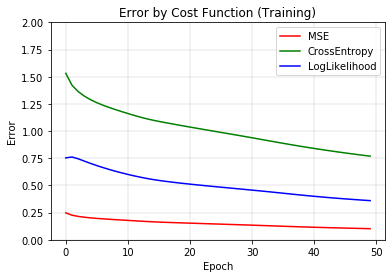

In [12]:
plt.ylim(0.0, 2)
plt.plot(num_epoch, mse_train, color='red', label="MSE")
plt.plot(num_epoch, ce_train, color='green', label="CrossEntropy")
plt.plot(num_epoch, ll_train, color='blue', label="LogLikelihood")
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Error by Cost Function (Training)')
plt.legend()
plt.grid(linestyle='-', linewidth='0.2', color='gray')

### ii ) Three plots  of the error for training vs. test

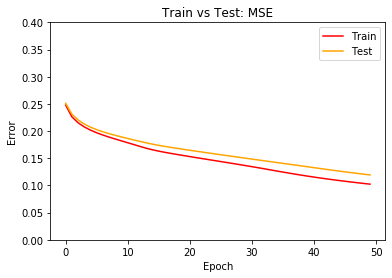

In [13]:
plt.ylim(0.0, 0.4)
plt.plot(num_epoch, mse_train, color='red', label="Train")
plt.plot(num_epoch, mse_test, color='orange', label="Test")
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Train vs Test: MSE')
plt.legend()

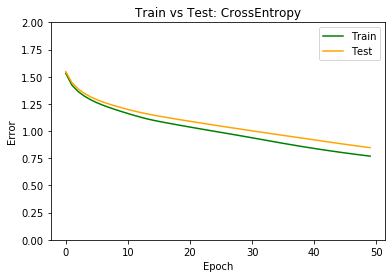

In [14]:
plt.ylim(0.0, 2)
#plt.scatter(num_epoch,specificity, color='red')
plt.plot(num_epoch, ce_train, color='green', label="Train")
plt.plot(num_epoch, ce_test, color='orange', label="Test")
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Train vs Test: CrossEntropy')
plt.legend()

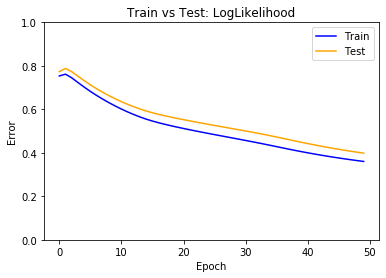

In [15]:
plt.ylim(0.0, 1)
#plt.scatter(num_epoch,specificity, color='red')
plt.plot(num_epoch, ll_train, color='blue', label="Train")
plt.plot(num_epoch, ll_test, color='orange', label="Test")
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Train vs Test: LogLikelihood')
plt.legend()